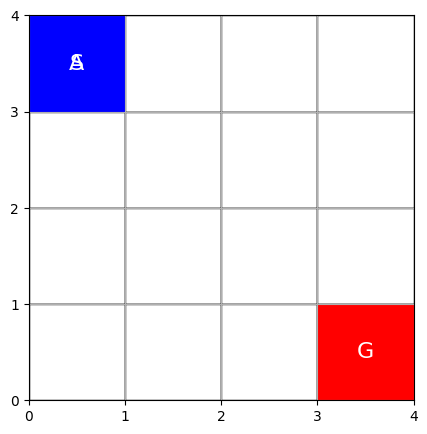

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

class GridWorld:
    def __init__(self, size=4, start=(0,0), goal=(3,3)):
        self.size = size
        self.start = start
        self.goal = goal
        self.state = start

    def reset(self):
        self.state = self.start
        return self.state

    def render(self):
        fig, ax = plt.subplots(figsize=(5,5))

        # Draw grid cells
        for i in range(self.size):
            for j in range(self.size):
                rect = patches.Rectangle((j, self.size-1-i), 1, 1,
                                         linewidth=1, edgecolor='black', facecolor='white')
                ax.add_patch(rect)

        # Draw start, goal, and agent
        sx, sy = self.start
        gx, gy = self.goal
        ax.add_patch(patches.Rectangle((sy, self.size-1-sx), 1, 1, facecolor='green'))
        ax.add_patch(patches.Rectangle((gy, self.size-1-gx), 1, 1, facecolor='red'))

        ax.add_patch(patches.Rectangle((self.state[1], self.size-1-self.state[0]), 1, 1, facecolor='blue'))

        # Optional: text labels
        ax.text(sy+0.5, self.size-1-sx+0.5, 'S', ha='center', va='center', color='white', fontsize=16)
        ax.text(gy+0.5, self.size-1-gx+0.5, 'G', ha='center', va='center', color='white', fontsize=16)
        ax.text(self.state[1]+0.5, self.size-1-self.state[0]+0.5, 'A', ha='center', va='center', color='white', fontsize=16)

        ax.set_xlim(0, self.size)
        ax.set_ylim(0, self.size)
        ax.set_xticks(range(self.size+1))
        ax.set_yticks(range(self.size+1))
        ax.set_aspect('equal')
        plt.grid(True)
        plt.show(block=False)
        plt.pause(0.8)
        plt.clf()


# Example usage
env = GridWorld()
env.reset()

# Just show start, goal, and agent
env.render()
plt.close()


# Env avancee

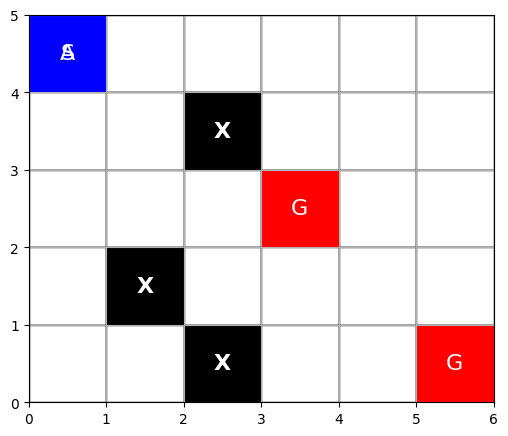

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

class GridWorld:
    def __init__(self,
                 size=(4,4),              # shape of grid (rows, cols)
                 start=(0,0),             # start position
                 goals=[(3,3)],           # list of goal positions
                 obstacles=[],            # list of obstacle positions
                 agent_color='green',     # agent color
                 goal_color='red',        # goal color
                 obstacle_color='gray'):  # obstacle color

        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goals = goals
        self.obstacles = obstacles
        self.agent_color = agent_color
        self.goal_color = goal_color
        self.obstacle_color = obstacle_color

    def reset(self):
        self.state = self.start
        return self.state

    def render(self):
        fig, ax = plt.subplots(figsize=(6,6))

        # Draw grid
        for i in range(self.rows):
            for j in range(self.cols):
                rect = patches.Rectangle((j, self.rows-1-i), 1, 1,
                                         linewidth=1, edgecolor='black', facecolor='white')
                ax.add_patch(rect)

        # Draw obstacles
        for (x, y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x), 1, 1, facecolor=self.obstacle_color))
            ax.text(y+0.5, self.rows-1-x+0.5, 'X', ha='center', va='center', color='white', fontsize=16, weight='bold')

        # Draw goals
        for (gx, gy) in self.goals:
            ax.add_patch(patches.Rectangle((gy, self.rows-1-gx), 1, 1, facecolor=self.goal_color))
            ax.text(gy+0.5, self.rows-1-gx+0.5, 'G', ha='center', va='center', color='white', fontsize=16)

        # Draw start
        sx, sy = self.start
        ax.add_patch(patches.Rectangle((sy, self.rows-1-sx), 1, 1, facecolor='orange'))
        ax.text(sy+0.5, self.rows-1-sx+0.5, 'S', ha='center', va='center', color='white', fontsize=16)

        # Draw agent
        ax.add_patch(patches.Rectangle((self.state[1], self.rows-1-self.state[0]), 1, 1, facecolor=self.agent_color))
        ax.text(self.state[1]+0.5, self.rows-1-self.state[0]+0.5, 'A', ha='center', va='center', color='white', fontsize=16)

        ax.set_xlim(0, self.cols)
        ax.set_ylim(0, self.rows)
        ax.set_xticks(range(self.cols+1))
        ax.set_yticks(range(self.rows+1))
        ax.set_aspect('equal')
        plt.grid(True)
        plt.show(block=False)
        plt.pause(1)
        plt.clf()


# Exemple d'utilisation
env = GridWorld(
    size=(5,6),
    start=(0,0),
    goals=[(4,5), (2,3)],
    obstacles=[(1,2), (3,1), (4,2)],
    agent_color='blue',
    goal_color='red',
    obstacle_color='black'
)

env.reset()
env.render()
plt.close()


# env pour Q-leaning

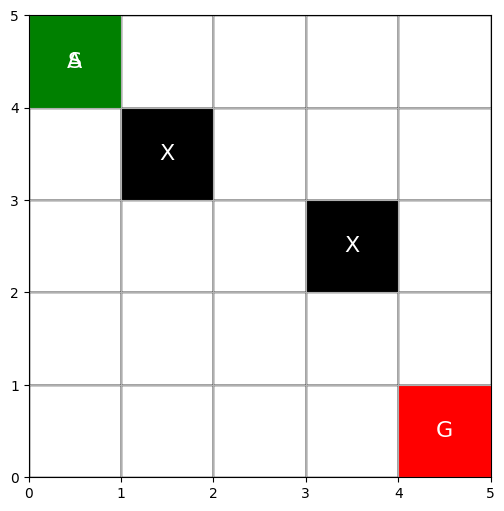

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

class GridWorld:
    def __init__(self,
                 size=(5,5),
                 start=(0,0),
                 goals=[(4,4)],
                 obstacles=[(1,1), (2,3)],
                 agent_color='blue',
                 goal_color='red',
                 obstacle_color='black'):

        self.rows, self.cols = size
        self.start = start
        self.goals = goals
        self.obstacles = obstacles
        self.agent_color = agent_color
        self.goal_color = goal_color
        self.obstacle_color = obstacle_color
        self.actions = ['up', 'down', 'left', 'right']
        self.reset()

    def reset(self):
        self.state = self.start
        return self.state

    def step(self, action):
        x, y = self.state

        if action == 'up':
            x = max(x - 1, 0)
        elif action == 'down':
            x = min(x + 1, self.rows - 1)
        elif action == 'left':
            y = max(y - 1, 0)
        elif action == 'right':
            y = min(y + 1, self.cols - 1)

        new_state = (x, y)
        reward = -1
        done = False

        # Check for goals and obstacles
        if new_state in self.obstacles:
            reward = -10
            done = True
        elif new_state in self.goals:
            reward = 10
            done = True

        self.state = new_state
        return new_state, reward, done

    def render(self):
        fig, ax = plt.subplots(figsize=(6,6))

        for i in range(self.rows):
            for j in range(self.cols):
                rect = patches.Rectangle((j, self.rows-1-i), 1, 1,
                                         linewidth=1, edgecolor='black', facecolor='white')
                ax.add_patch(rect)

        # Obstacles
        for (x, y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x), 1, 1, facecolor=self.obstacle_color))
            ax.text(y+0.5, self.rows-1-x+0.5, 'X', ha='center', va='center', color='white', fontsize=16)

        # Goals
        for (x, y) in self.goals:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x), 1, 1, facecolor=self.goal_color))
            ax.text(y+0.5, self.rows-1-x+0.5, 'G', ha='center', va='center', color='white', fontsize=16)

        # Start
        sx, sy = self.start
        ax.add_patch(patches.Rectangle((sy, self.rows-1-sx), 1, 1, facecolor='orange'))
        ax.text(sy+0.5, self.rows-1-sx+0.5, 'S', ha='center', va='center', color='white', fontsize=16)

        # Agent
        ax.add_patch(patches.Rectangle((self.state[1], self.rows-1-self.state[0]), 1, 1, facecolor=self.agent_color))
        ax.text(self.state[1]+0.5, self.rows-1-self.state[0]+0.5, 'A', ha='center', va='center', color='white', fontsize=16)

        ax.set_xlim(0, self.cols)
        ax.set_ylim(0, self.rows)
        ax.set_xticks(range(self.cols+1))
        ax.set_yticks(range(self.rows+1))
        ax.set_aspect('equal')
        plt.grid(True)
        plt.show(block=False)
        plt.pause(0.4)
        plt.clf()

env = GridWorld(
   size=(5,5),
                 start=(0,0),
                 goals=[(4,4)],
                 obstacles=[(1,1), (2,3)],
                 agent_color='green',
                 goal_color='red',
                 obstacle_color='black')


env.reset()
env.render()
plt.close()

# Q-learning

Episode 1/300 | Total reward: -16
Episode 2/300 | Total reward: -16
Episode 3/300 | Total reward: -19
Episode 4/300 | Total reward: -28
Episode 5/300 | Total reward: -25
Episode 6/300 | Total reward: -44
Episode 7/300 | Total reward: -36
Episode 8/300 | Total reward: -49
Episode 9/300 | Total reward: -26
Episode 10/300 | Total reward: -47
Episode 11/300 | Total reward: -69
Episode 12/300 | Total reward: -15
Episode 13/300 | Total reward: -13
Episode 14/300 | Total reward: -16
Episode 15/300 | Total reward: -21
Episode 16/300 | Total reward: -9
Episode 17/300 | Total reward: -9
Episode 18/300 | Total reward: -22
Episode 19/300 | Total reward: -33
Episode 20/300 | Total reward: -36
Episode 21/300 | Total reward: -28
Episode 22/300 | Total reward: -2
Episode 23/300 | Total reward: 0
Episode 24/300 | Total reward: -18
Episode 25/300 | Total reward: -17
Episode 26/300 | Total reward: -3
Episode 27/300 | Total reward: -13
Episode 28/300 | Total reward: -30
Episode 29/300 | Total reward: -22


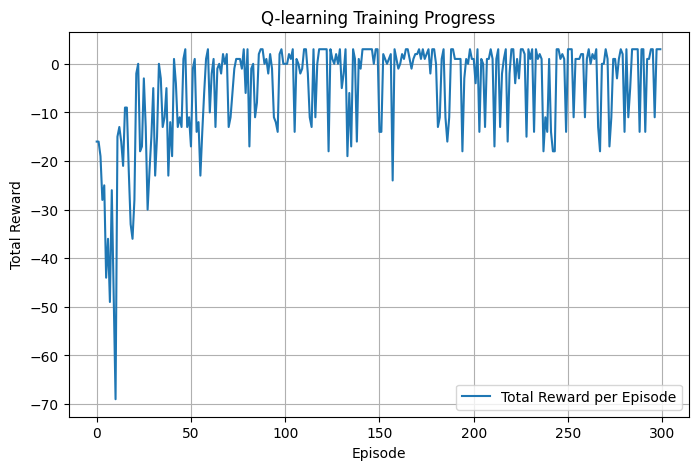

In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np

# Q-learning
env = GridWorld()

q_table = {}
alpha = 0.1       # learning rate
gamma = 0.9       # discount factor
epsilon = 0.2     # exploration rate
episodes = 300

rewards_per_episode = []  # <-- stockage des récompenses

def get_q(state, action):
    return q_table.get((state, action), 0.0)

for ep in range(episodes):
    state = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Epsilon-greedy policy
        if random.uniform(0, 1) < epsilon:
            action = random.choice(env.actions)
        else:
            q_values = [get_q(state, a) for a in env.actions]
            max_q = max(q_values)
            action = env.actions[q_values.index(max_q)]

        next_state, reward, done = env.step(action)

        # Update Q-value
        old_q = get_q(state, action)
        next_max_q = max([get_q(next_state, a) for a in env.actions])
        new_q = old_q + alpha * (reward + gamma * next_max_q - old_q)
        q_table[(state, action)] = new_q

        state = next_state
        total_reward += reward

    rewards_per_episode.append(total_reward)
    print(f"Episode {ep+1}/{episodes} | Total reward: {total_reward}")

print("Training finished ✅")

# 📈 Courbe de récompense
plt.figure(figsize=(8,5))
plt.plot(rewards_per_episode, label='Total Reward per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-learning Training Progress')
plt.legend()
plt.grid(True)
plt.show()


# Save agent

In [ ]:
import pickle

# Sauvegarde du modèle Q-learning
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-table saved successfully as q_table.pkl")


✅ Q-table saved successfully as q_table.pkl


# agent loading

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# Charger le modèle sauvegardé
with open("q_table.pkl", "rb") as f:
    q_table = pickle.load(f)

print("✅ Q-table loaded successfully!")


✅ Q-table loaded successfully!


In [ ]:
env = GridWorld(
     size=(5,5),
                 start=(0,0),
                 goals=[(4,4)],
                 obstacles=[(1,1), (2,3)],
                 agent_color='green',
                 goal_color='red',
                 obstacle_color='black')



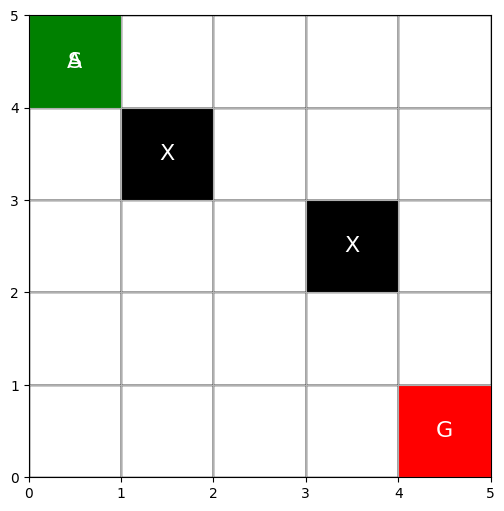

<Figure size 640x480 with 0 Axes>

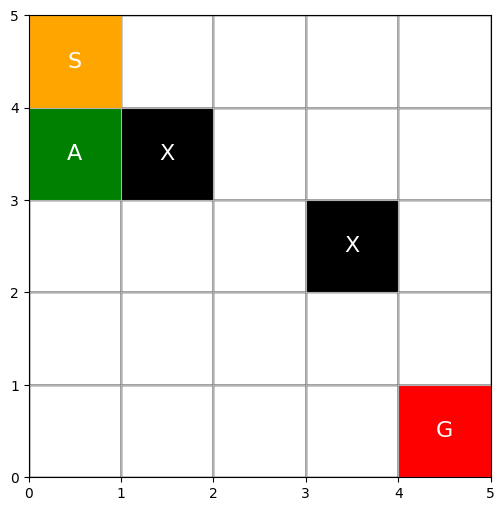

<Figure size 640x480 with 0 Axes>

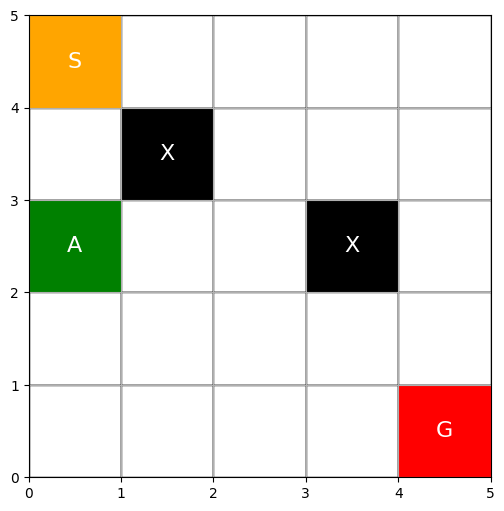

<Figure size 640x480 with 0 Axes>

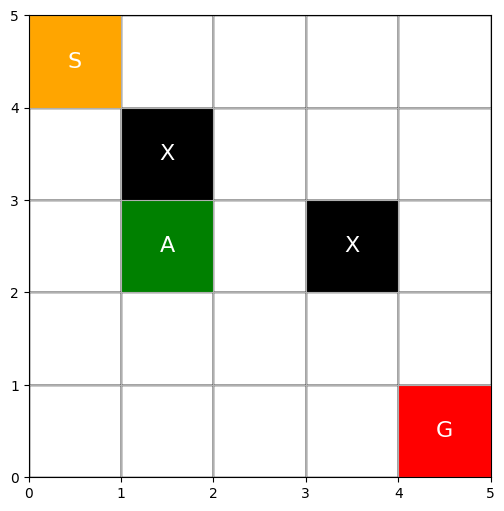

<Figure size 640x480 with 0 Axes>

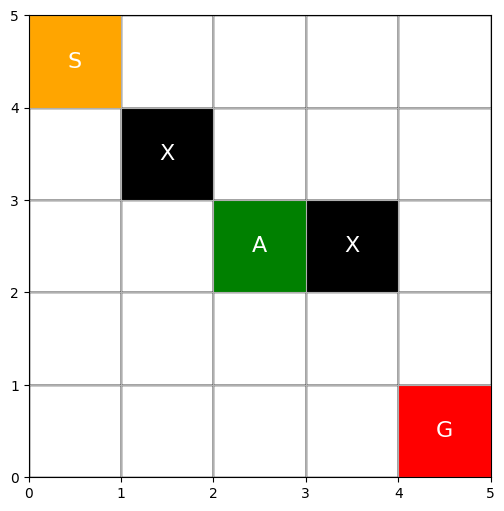

<Figure size 640x480 with 0 Axes>

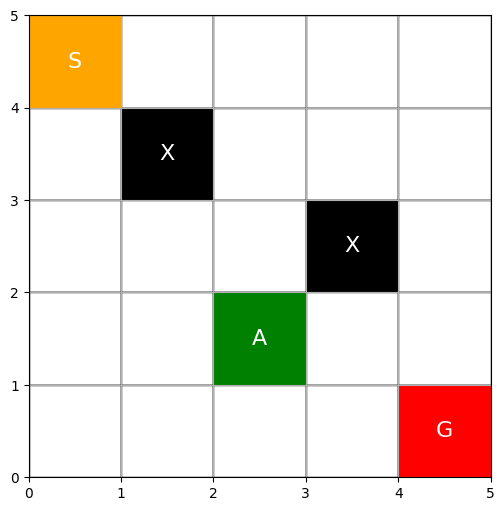

<Figure size 640x480 with 0 Axes>

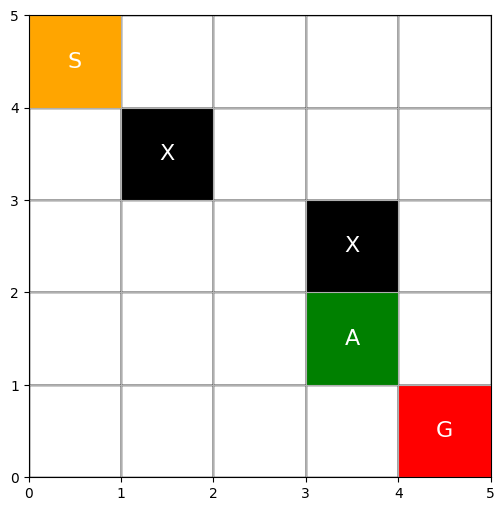

<Figure size 640x480 with 0 Axes>

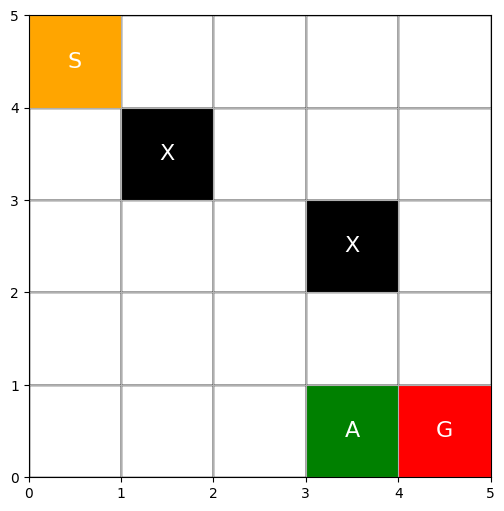

<Figure size 640x480 with 0 Axes>

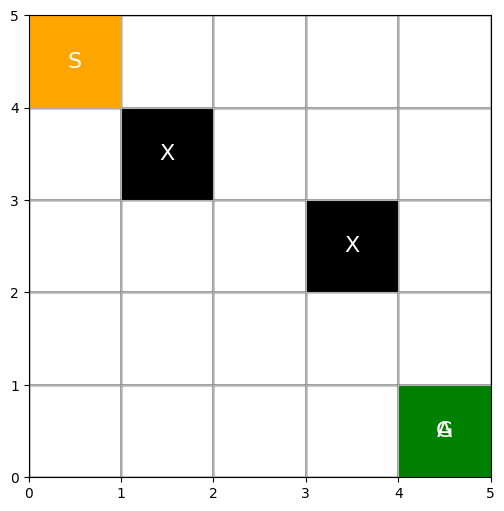

✅ Test completed in 8 steps, total reward = 3


In [ ]:
state = env.reset()
done = False
steps = 0
total_reward = 0

while not done and steps < 50:
    env.render()

    # Choisir la meilleure action connue
    q_values = [q_table.get((state, a), 0.0) for a in env.actions]
    best_action = env.actions[np.argmax(q_values)]

    # Effectuer l’action
    next_state, reward, done = env.step(best_action)
    total_reward += reward
    state = next_state
    steps += 1

env.render()
plt.close()

print(f"✅ Test completed in {steps} steps, total reward = {total_reward}")


# grid de 10 10

In [ ]:
# Exemple de GridWorld 10x10
env = GridWorld(
    size=(10, 10),
    start=(0, 0),  # position de départ (ligne, colonne)
    goals=[(9, 9), (5, 8)],  # positions des buts
    obstacles=[
        (1, 3), (2, 3), (3, 3), (4, 3),
        (6, 5), (6, 6), (6, 7),
        (3, 7), (4, 7), (5, 7),
        (7, 2), (8, 2)
    ],
    agent_color='blue',
    goal_color='red',
    obstacle_color='black'
)


Episode 1/1000 | Total reward: -62
Episode 2/1000 | Total reward: -47
Episode 3/1000 | Total reward: -28
Episode 4/1000 | Total reward: -24
Episode 5/1000 | Total reward: -26
Episode 6/1000 | Total reward: -66
Episode 7/1000 | Total reward: -45
Episode 8/1000 | Total reward: -67
Episode 9/1000 | Total reward: -31
Episode 10/1000 | Total reward: -57
Episode 11/1000 | Total reward: -20
Episode 12/1000 | Total reward: -23
Episode 13/1000 | Total reward: -69
Episode 14/1000 | Total reward: -27
Episode 15/1000 | Total reward: -28
Episode 16/1000 | Total reward: -66
Episode 17/1000 | Total reward: -50
Episode 18/1000 | Total reward: -58
Episode 19/1000 | Total reward: -95
Episode 20/1000 | Total reward: -19
Episode 21/1000 | Total reward: -35
Episode 22/1000 | Total reward: -40
Episode 23/1000 | Total reward: -38
Episode 24/1000 | Total reward: -82
Episode 25/1000 | Total reward: -58
Episode 26/1000 | Total reward: -26
Episode 27/1000 | Total reward: -41
Episode 28/1000 | Total reward: -22
E

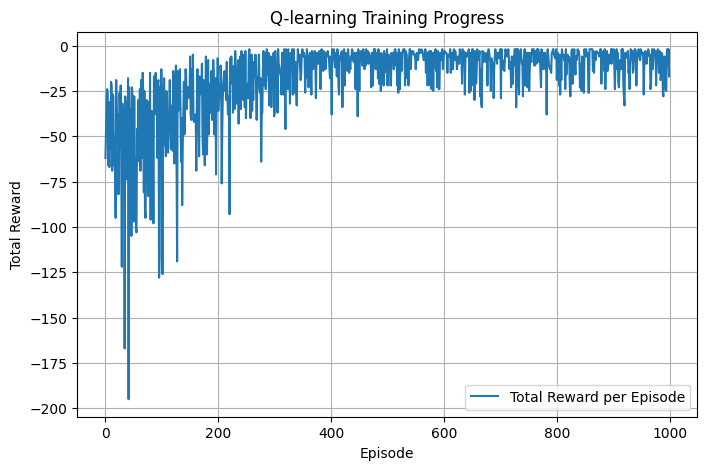

In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np

# Q-learning

q_table = {}
alpha = 0.1       # learning rate
gamma = 0.9       # discount factor
epsilon = 0.2     # exploration rate
episodes = 1000

rewards_per_episode = []  # <-- stockage des récompenses

def get_q(state, action):
    return q_table.get((state, action), 0.0)

for ep in range(episodes):
    state = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Epsilon-greedy policy
        if random.uniform(0, 1) < epsilon:
            action = random.choice(env.actions)
        else:
            q_values = [get_q(state, a) for a in env.actions]
            max_q = max(q_values)
            action = env.actions[q_values.index(max_q)]

        next_state, reward, done = env.step(action)

        # Update Q-value
        old_q = get_q(state, action)
        next_max_q = max([get_q(next_state, a) for a in env.actions])
        new_q = old_q + alpha * (reward + gamma * next_max_q - old_q)
        q_table[(state, action)] = new_q

        state = next_state
        total_reward += reward

    rewards_per_episode.append(total_reward)
    print(f"Episode {ep+1}/{episodes} | Total reward: {total_reward}")

print("Training finished ✅")

# 📈 Courbe de récompense
plt.figure(figsize=(8,5))
plt.plot(rewards_per_episode, label='Total Reward per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-learning Training Progress')
plt.legend()
plt.grid(True)
plt.show()


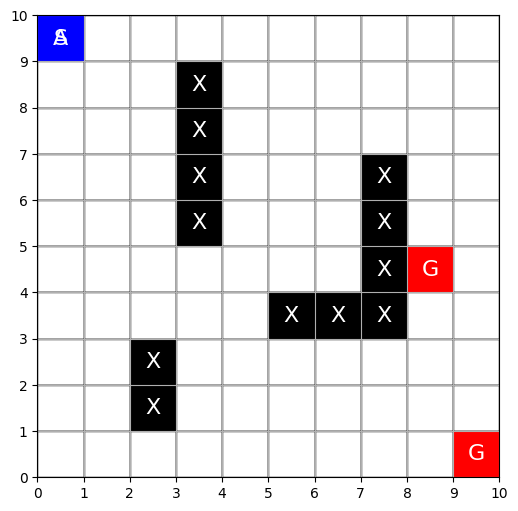

<Figure size 640x480 with 0 Axes>

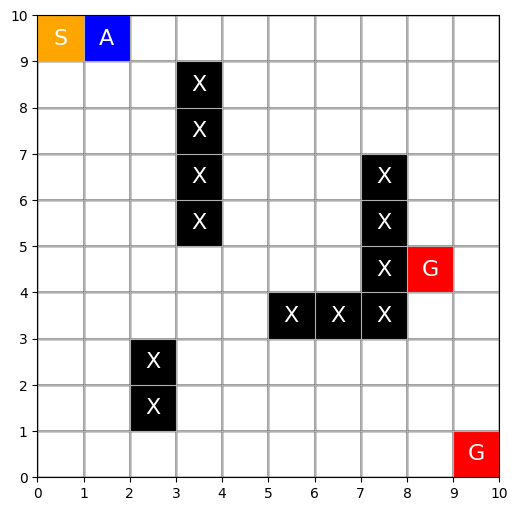

<Figure size 640x480 with 0 Axes>

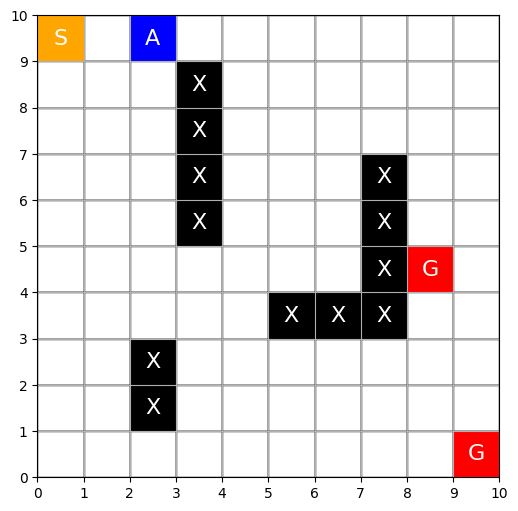

<Figure size 640x480 with 0 Axes>

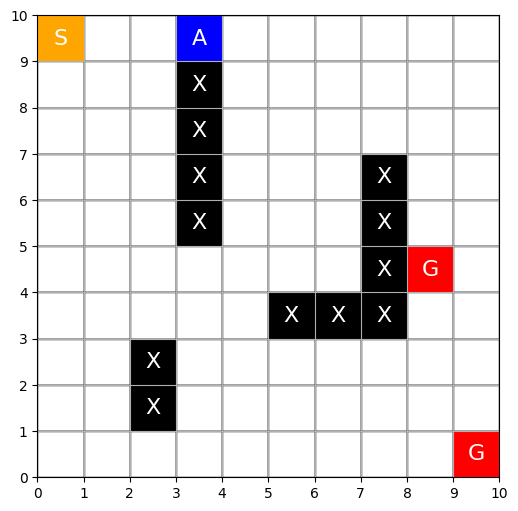

<Figure size 640x480 with 0 Axes>

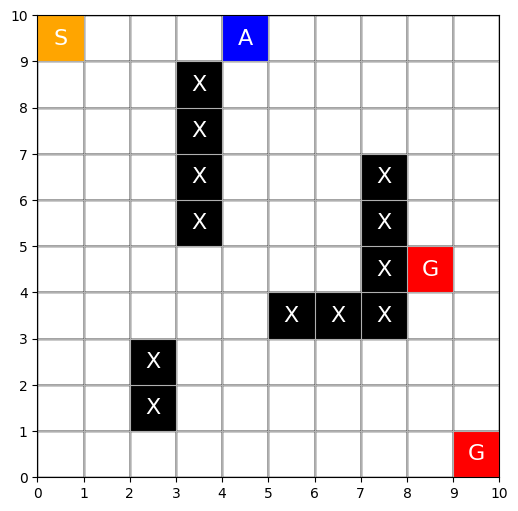

<Figure size 640x480 with 0 Axes>

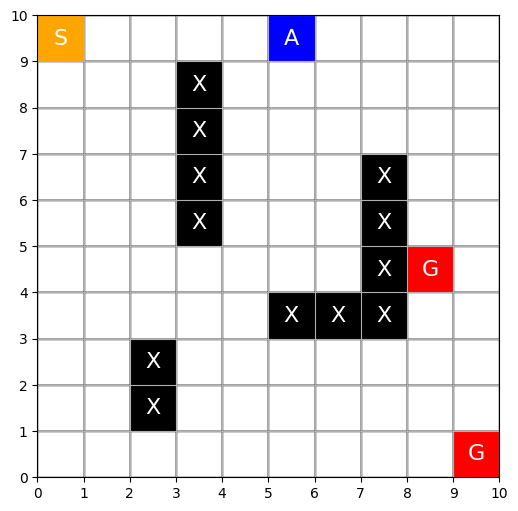

<Figure size 640x480 with 0 Axes>

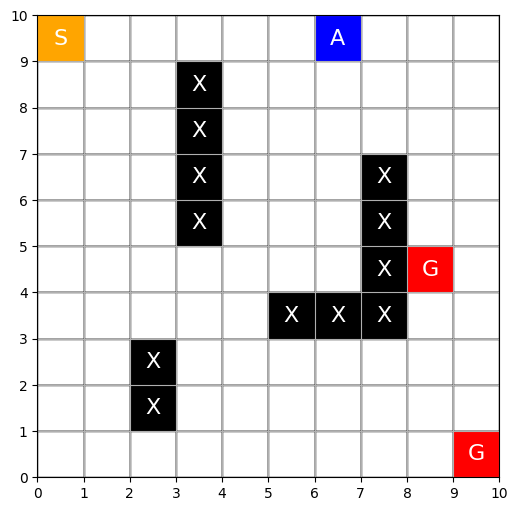

<Figure size 640x480 with 0 Axes>

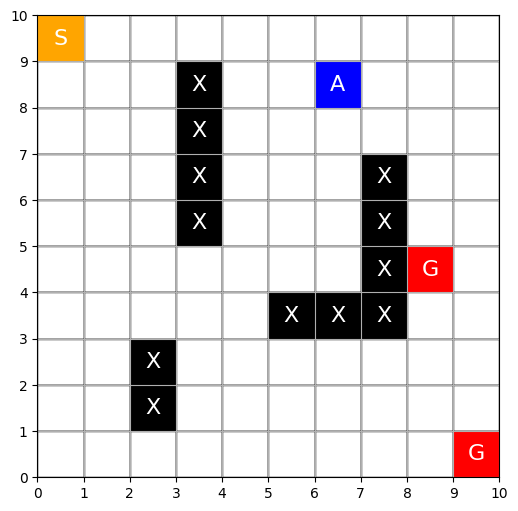

<Figure size 640x480 with 0 Axes>

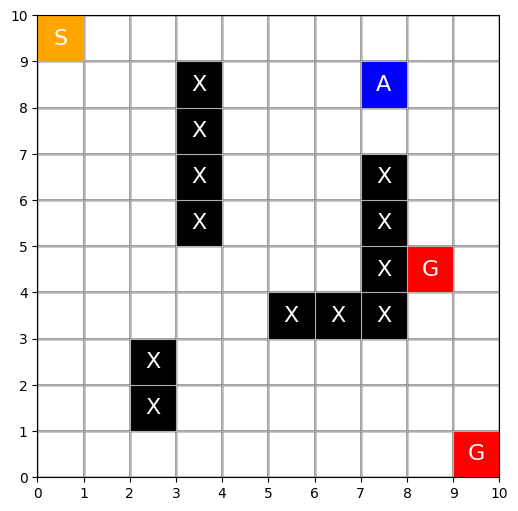

<Figure size 640x480 with 0 Axes>

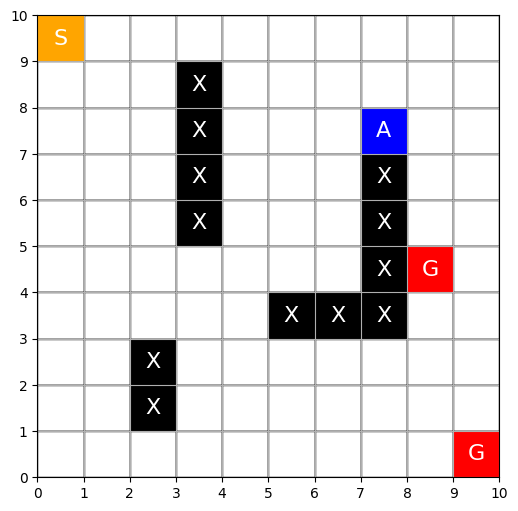

<Figure size 640x480 with 0 Axes>

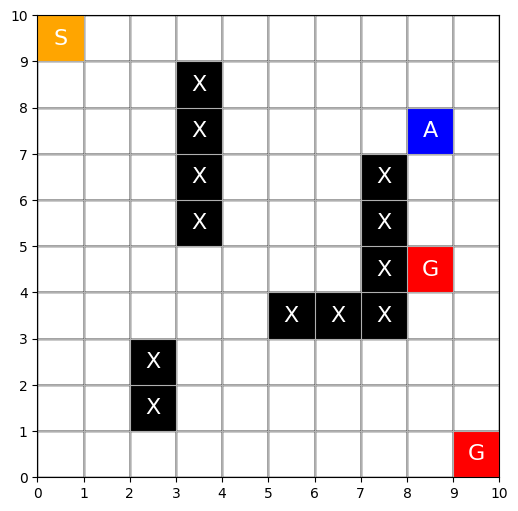

<Figure size 640x480 with 0 Axes>

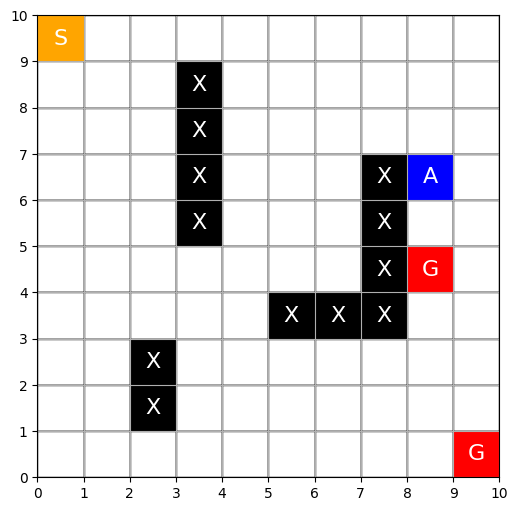

<Figure size 640x480 with 0 Axes>

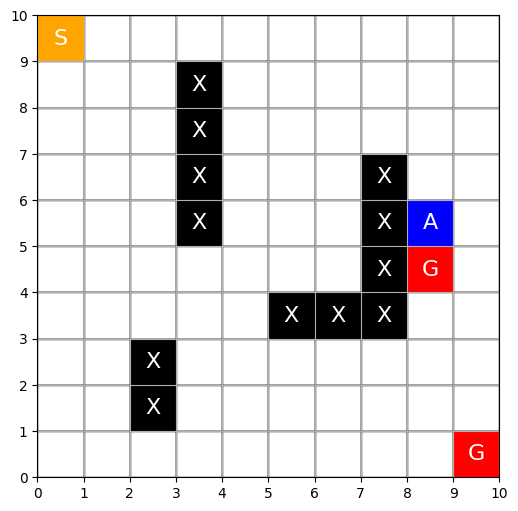

<Figure size 640x480 with 0 Axes>

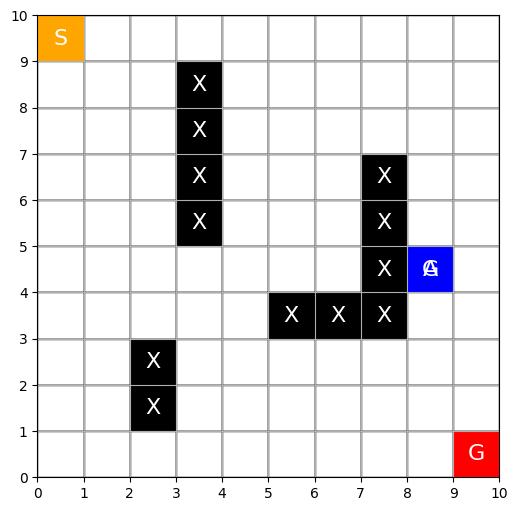

✅ Test completed in 13 steps, total reward = -2


In [ ]:
state = env.reset()
done = False
steps = 0
total_reward = 0

while not done and steps < 50:
    env.render()

    # Choisir la meilleure action connue
    q_values = [q_table.get((state, a), 0.0) for a in env.actions]
    best_action = env.actions[np.argmax(q_values)]

    # Effectuer l’action
    next_state, reward, done = env.step(best_action)
    total_reward += reward
    state = next_state
    steps += 1

env.render()
plt.close()

print(f"✅ Test completed in {steps} steps, total reward = {total_reward}")


# Comparison


🔹 Training on Grid 5x5 ...

🔹 Training on Grid 10x10 ...

🔹 Training on Grid 15x15 ...

🔹 Training on Grid 20x20 ...

🔹 Training on Grid 25x25 ...

🔹 Training on Grid 30x30 ...


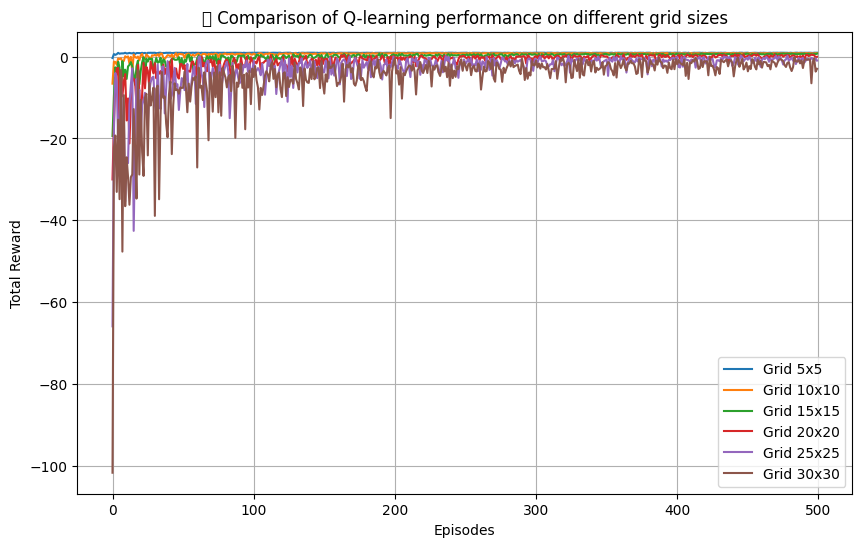

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

# === Définition d'un environnement simple type GridWorld ===
class GridWorld:
    def __init__(self, size=5):
        self.size = size
        self.actions = ['up', 'down', 'left', 'right']
        self.reset()

    def reset(self):
        self.agent_pos = [0, 0]
        self.goal = [self.size - 1, self.size - 1]
        return tuple(self.agent_pos)

    def step(self, action):
        if action == 'up' and self.agent_pos[0] > 0:
            self.agent_pos[0] -= 1
        elif action == 'down' and self.agent_pos[0] < self.size - 1:
            self.agent_pos[0] += 1
        elif action == 'left' and self.agent_pos[1] > 0:
            self.agent_pos[1] -= 1
        elif action == 'right' and self.agent_pos[1] < self.size - 1:
            self.agent_pos[1] += 1

        done = (self.agent_pos == self.goal)
        reward = 1 if done else -0.01  # petite pénalité pour encourager les trajets rapides
        return tuple(self.agent_pos), reward, done

    def render(self):
        grid = np.full((self.size, self.size), '⬜', dtype='<U2')
        grid[self.goal[0], self.goal[1]] = '🏁'
        grid[self.agent_pos[0], self.agent_pos[1]] = '🤖'
        print("\n".join(" ".join(row) for row in grid))
        print("-" * (self.size * 2))


# === Q-learning algorithm ===
def train_q_learning(env, episodes=500, alpha=0.1, gamma=0.9, epsilon=0.2):
    q_table = {}
    rewards_per_episode = []

    def get_q(state, action):
        return q_table.get((state, action), 0.0)

    for ep in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0

        while not done:
            if random.uniform(0, 1) < epsilon:
                action = random.choice(env.actions)
            else:
                q_values = [get_q(state, a) for a in env.actions]
                action = env.actions[np.argmax(q_values)]

            next_state, reward, done = env.step(action)
            old_q = get_q(state, action)
            next_max = max([get_q(next_state, a) for a in env.actions])
            new_q = old_q + alpha * (reward + gamma * next_max - old_q)
            q_table[(state, action)] = new_q

            state = next_state
            total_reward += reward

        rewards_per_episode.append(total_reward)

    return rewards_per_episode


# === Comparaison entre plusieurs grilles ===
grid_sizes = [5, 10, 15,20,25,30]
results = {}

for size in grid_sizes:
    print(f"\n🔹 Training on Grid {size}x{size} ...")
    env = GridWorld(size=size)
    rewards = train_q_learning(env, episodes=500)
    results[size] = rewards

# === Visualisation des résultats ===
plt.figure(figsize=(10, 6))
for size, rewards in results.items():
    plt.plot(rewards, label=f"Grid {size}x{size}")
plt.xlabel("Episodes")
plt.ylabel("Total Reward")
plt.title("📊 Comparison of Q-learning performance on different grid sizes")
plt.legend()
plt.grid(True)
plt.show()


<Figure size 640x480 with 0 Axes>

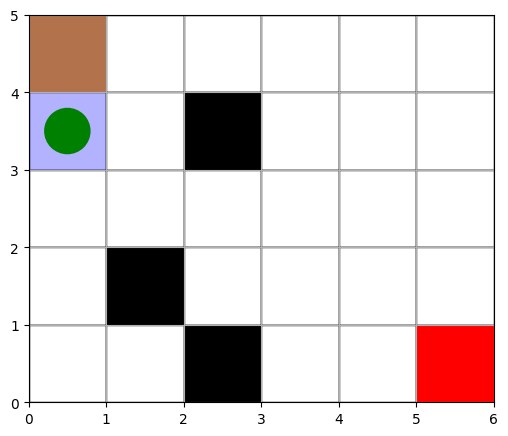

<Figure size 640x480 with 0 Axes>

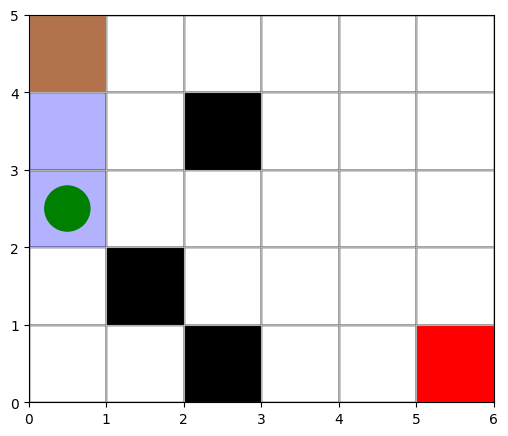

<Figure size 640x480 with 0 Axes>

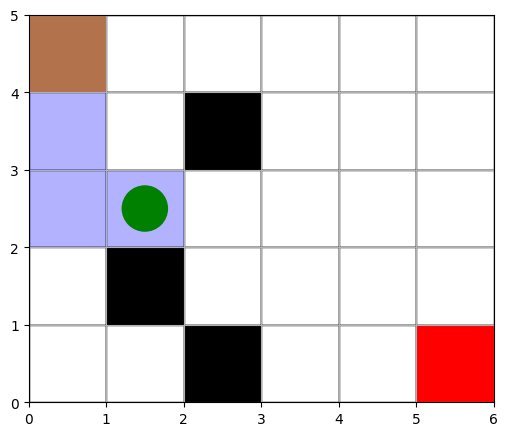

<Figure size 640x480 with 0 Axes>

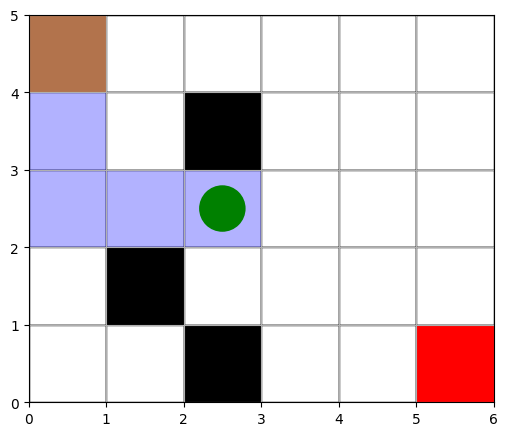

<Figure size 640x480 with 0 Axes>

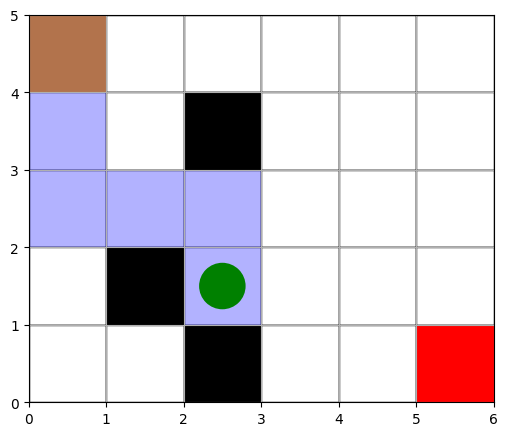

<Figure size 640x480 with 0 Axes>

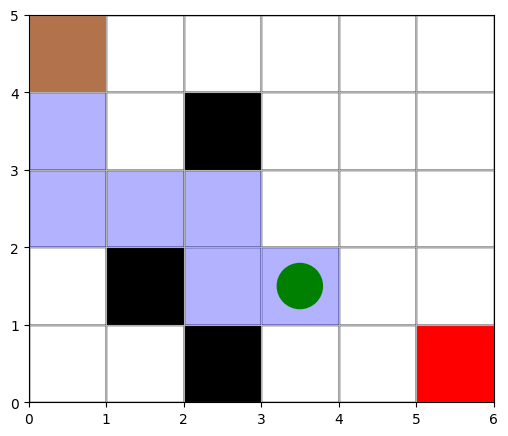

<Figure size 640x480 with 0 Axes>

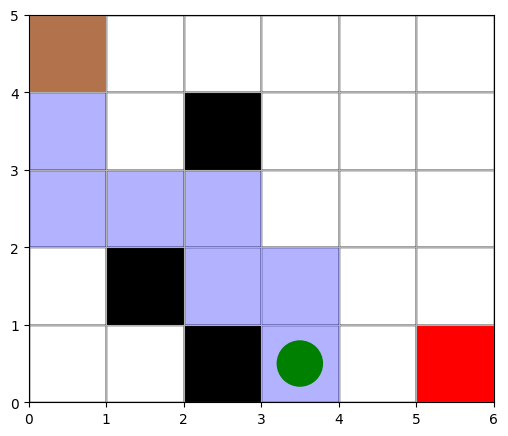

<Figure size 640x480 with 0 Axes>

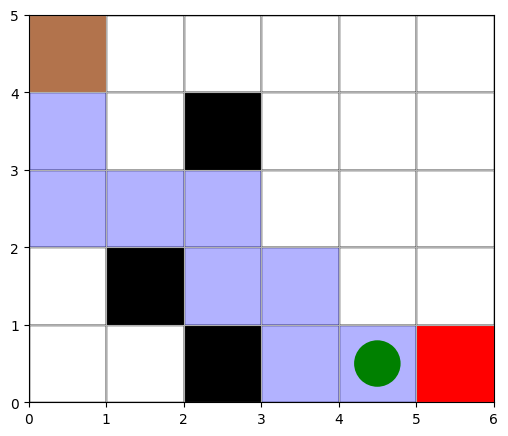

<Figure size 640x480 with 0 Axes>

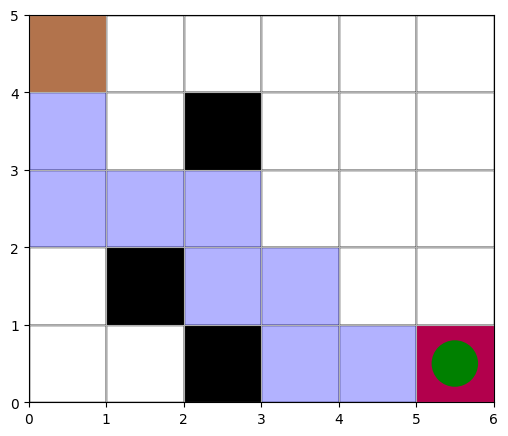

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import time

# --- GridWorld avec un seul goal ---
class GridWorld:
    def __init__(self, size=(5,6), start=(0,0), goal=(4,5), obstacles=[]):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goal = goal
        self.obstacles = obstacles
        self.actions = ['up', 'down', 'left', 'right']

    def reset(self):
        self.state = self.start
        return self.state

    def step(self, action):
        x, y = self.state
        if action == 'up':
            x = max(0, x-1)
        elif action == 'down':
            x = min(self.rows-1, x+1)
        elif action == 'left':
            y = max(0, y-1)
        elif action == 'right':
            y = min(self.cols-1, y+1)

        next_state = (x, y)

        if next_state in self.obstacles:
            next_state = self.state

        self.state = next_state

        reward = 10 if self.state == self.goal else -1
        done = self.state == self.goal
        return self.state, reward, done

    def render_frame(self, agent_pos, path=[]):
        plt.clf()
        fig, ax = plt.subplots(figsize=(6,6))
        for i in range(self.rows):
            for j in range(self.cols):
                ax.add_patch(patches.Rectangle((j, self.rows-1-i),1,1,
                                               edgecolor='black', facecolor='white'))

        for (x,y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x),1,1,facecolor='black'))

        gx, gy = self.goal
        ax.add_patch(patches.Rectangle((gy, self.rows-1-gx),1,1,facecolor='red'))

        sx, sy = self.start
        ax.add_patch(patches.Rectangle((sy, self.rows-1-sx),1,1,facecolor='orange'))

        # path
        for s in path:
            ax.add_patch(patches.Rectangle((s[1], self.rows-1-s[0]),1,1,facecolor='blue', alpha=0.3))

        # agent
        ax.add_patch(patches.Circle((agent_pos[1]+0.5, self.rows-1-agent_pos[0]+0.5),0.3,facecolor='green'))

        ax.set_xlim(0, self.cols)
        ax.set_ylim(0, self.rows)
        ax.set_aspect('equal')
        plt.grid(True)
        plt.pause(0.3)  # pause for frame
        plt.close(fig)

# --- Q-learning ---
def q_learning(env, episodes=500, alpha=0.8, gamma=0.9, epsilon=0.2):
    q_table = {}
    for ep in range(episodes):
        state = env.reset()
        done = False
        steps = 0
        while not done and steps < 100:
            if np.random.rand() < epsilon:
                action = np.random.choice(env.actions)
            else:
                q_values = [q_table.get((state,a),0) for a in env.actions]
                action = env.actions[np.argmax(q_values)]

            next_state, reward, done = env.step(action)
            old_q = q_table.get((state, action),0)
            next_max = max([q_table.get((next_state,a),0) for a in env.actions])
            q_table[(state, action)] = old_q + alpha*(reward + gamma*next_max - old_q)
            state = next_state
            steps += 1
    return q_table

# --- Animate path ---
def animate_path(env, q_table):
    state = env.reset()
    done = False
    path = [state]
    steps = 0
    while not done and steps < 50:
        q_values = [q_table.get((state,a),0) for a in env.actions]
        action = env.actions[np.argmax(q_values)]
        state, _, done = env.step(action)
        path.append(state)
        env.render_frame(state, path)
        steps += 1

# --- Exemple ---
env = GridWorld(
    size=(5,6),
    start=(0,0),
    goal=(4,5),
    obstacles=[(1,2),(3,1),(4,2)]
)

q_table = q_learning(env, episodes=800, alpha=0.8, gamma=0.9, epsilon=0.2)
animate_path(env, q_table)


# dynamic goal

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

class GridWorldMovingGoal:
    def __init__(self,
                 size=(5,6),
                 start=(0,0),
                 goal=(4,5),
                 obstacles=[(1,2), (3,1), (4,2)],
                 agent_color='blue',
                 goal_color='red',
                 obstacle_color='black'):

        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goal = goal
        self.obstacles = obstacles
        self.agent_color = agent_color
        self.goal_color = goal_color
        self.obstacle_color = obstacle_color

    def reset(self):
        self.state = self.start
        return self.state

    def move_goal(self):
        # Move goal randomly to a free cell (not agent or obstacle)
        free_cells = [(i, j) for i in range(self.rows) for j in range(self.cols)
                      if (i, j) != self.state and (i, j) not in self.obstacles]
        self.goal = random.choice(free_cells)

    def step(self, action, move_goal=True):
        x, y = self.state
        if action == 'up' and x > 0:
            x -= 1
        elif action == 'down' and x < self.rows - 1:
            x += 1
        elif action == 'left' and y > 0:
            y -= 1
        elif action == 'right' and y < self.cols - 1:
            y += 1

        if (x, y) not in self.obstacles:
            self.state = (x, y)

        if move_goal:
            self.move_goal()  # move goal dynamically

        done = (self.state == self.goal)
        reward = 1 if done else -0.01
        return self.state, reward, done

    def render(self):
        fig, ax = plt.subplots(figsize=(6,6))
        ax.set_xlim(0, self.cols)
        ax.set_ylim(0, self.rows)
        ax.set_aspect('equal')

        # Draw grid
        for i in range(self.rows):
            for j in range(self.cols):
                rect = patches.Rectangle((j, self.rows-1-i), 1, 1,
                                         linewidth=1, edgecolor='black', facecolor='white')
                ax.add_patch(rect)

        # Draw obstacles
        for (x, y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x), 1, 1, facecolor=self.obstacle_color))
            ax.text(y+0.5, self.rows-1-x+0.5, 'X', ha='center', va='center', color='white', fontsize=16, weight='bold')

        # Draw goal
        gx, gy = self.goal
        ax.add_patch(patches.Rectangle((gy, self.rows-1-gx), 1, 1, facecolor=self.goal_color))
        ax.text(gy+0.5, self.rows-1-gx+0.5, 'G', ha='center', va='center', color='white', fontsize=16)

        # Draw start
        sx, sy = self.start
        ax.add_patch(patches.Rectangle((sy, self.rows-1-sx), 1, 1, facecolor='orange'))
        ax.text(sy+0.5, self.rows-1-sx+0.5, 'S', ha='center', va='center', color='white', fontsize=16)

        # Draw agent
        ax.add_patch(patches.Rectangle((self.state[1], self.rows-1-self.state[0]), 1, 1, facecolor=self.agent_color))
        ax.text(self.state[1]+0.5, self.rows-1-self.state[0]+0.5, 'A', ha='center', va='center', color='white', fontsize=16)

        plt.grid(True)
        plt.show(block=False)
        plt.pause(0.5)
        plt.clf()


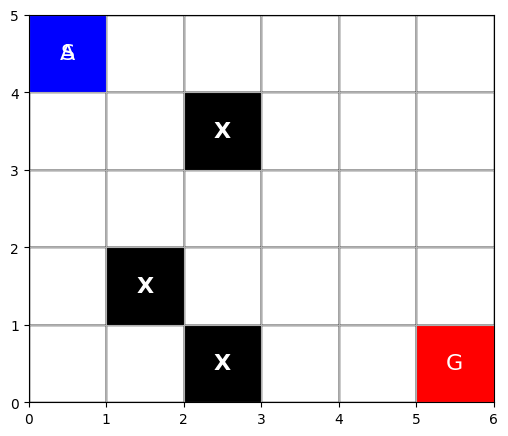

<Figure size 640x480 with 0 Axes>

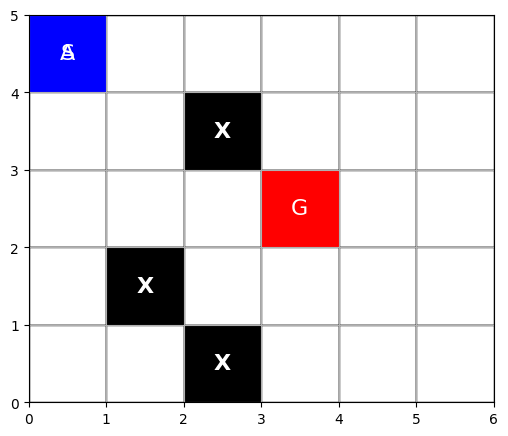

<Figure size 640x480 with 0 Axes>

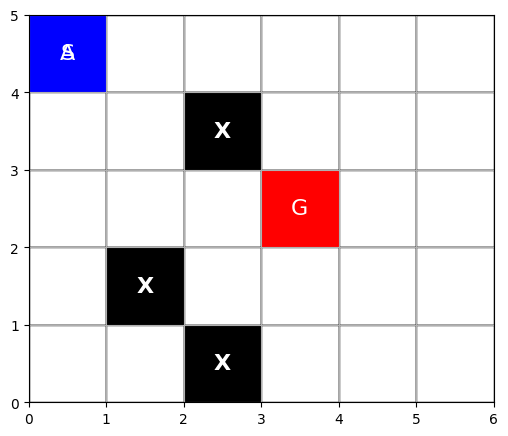

<Figure size 640x480 with 0 Axes>

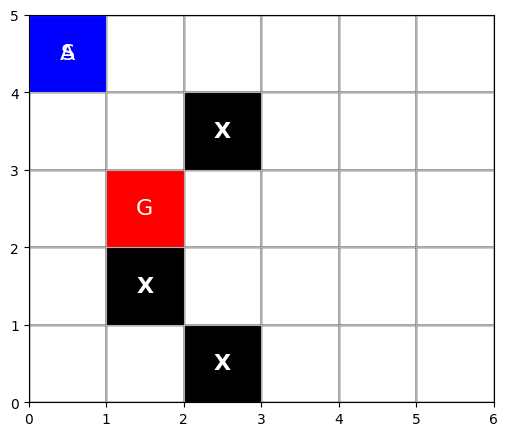

<Figure size 640x480 with 0 Axes>

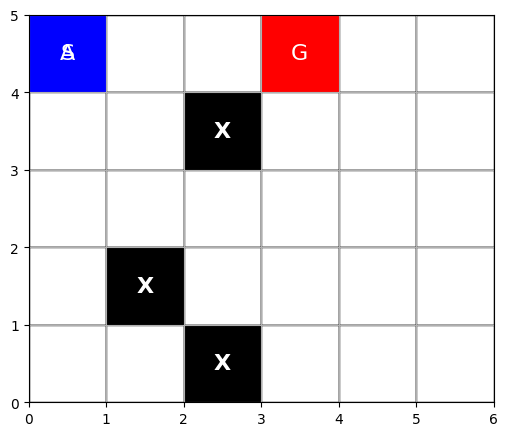

<Figure size 640x480 with 0 Axes>

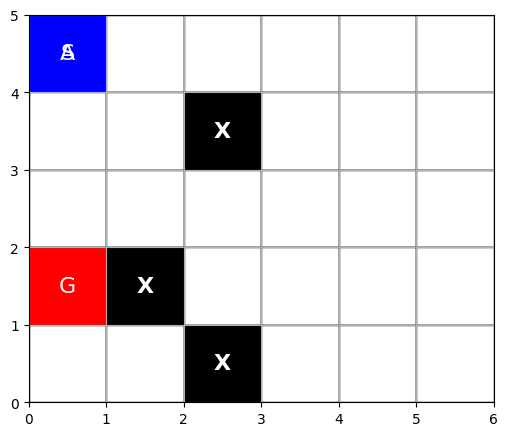

<Figure size 640x480 with 0 Axes>

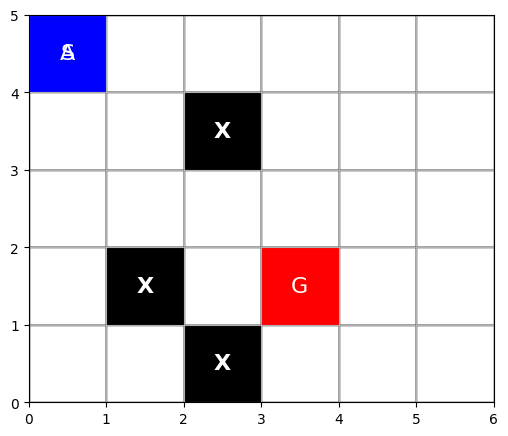

<Figure size 640x480 with 0 Axes>

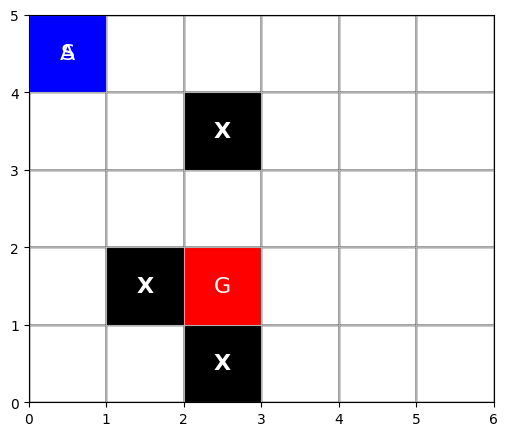

<Figure size 640x480 with 0 Axes>

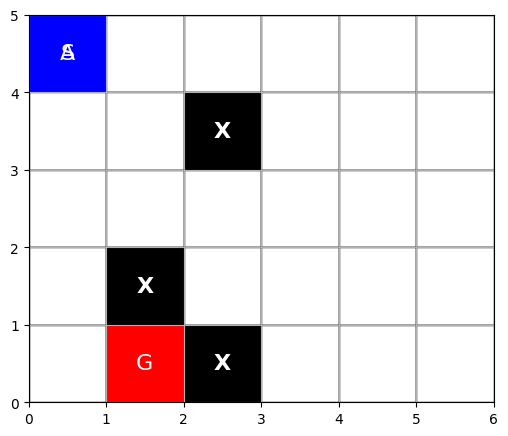

<Figure size 640x480 with 0 Axes>

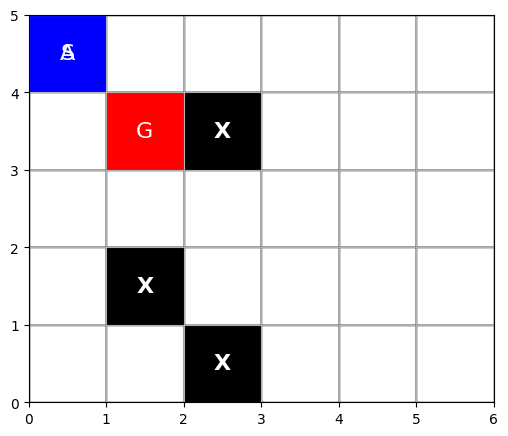

<Figure size 640x480 with 0 Axes>

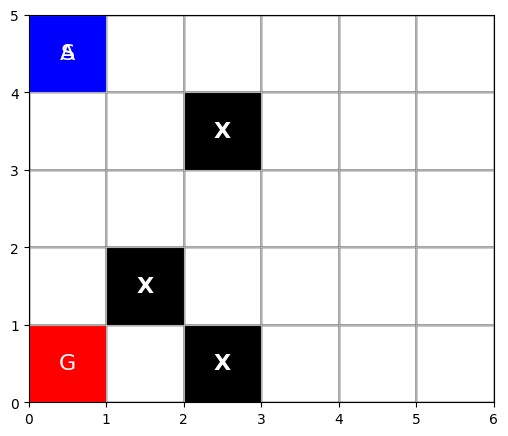

<Figure size 640x480 with 0 Axes>

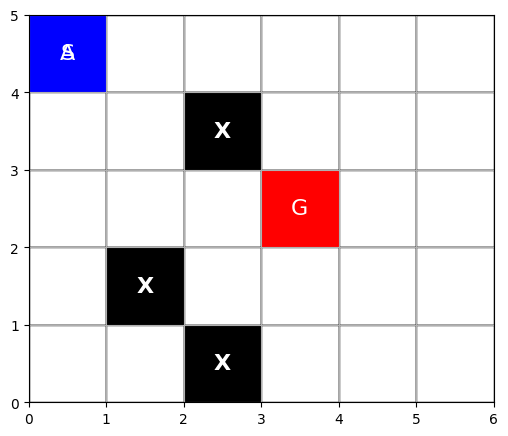

<Figure size 640x480 with 0 Axes>

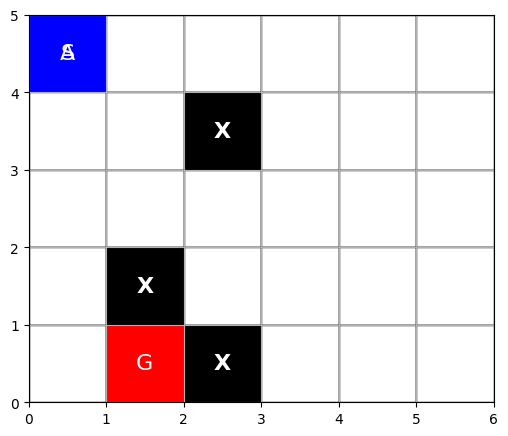

<Figure size 640x480 with 0 Axes>

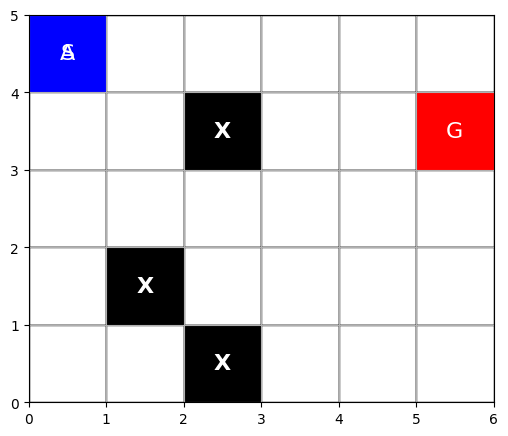

<Figure size 640x480 with 0 Axes>

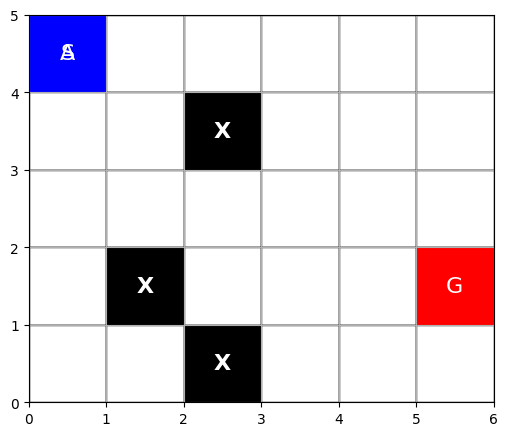

<Figure size 640x480 with 0 Axes>

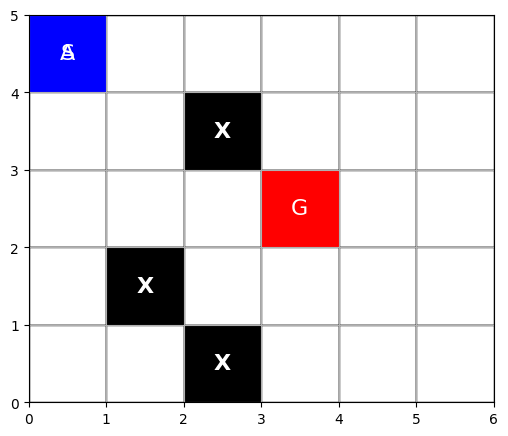

<Figure size 640x480 with 0 Axes>

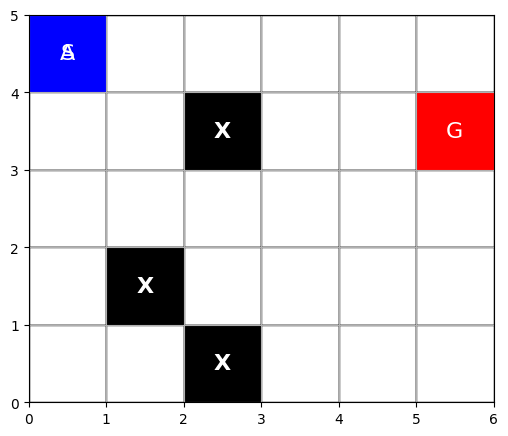

<Figure size 640x480 with 0 Axes>

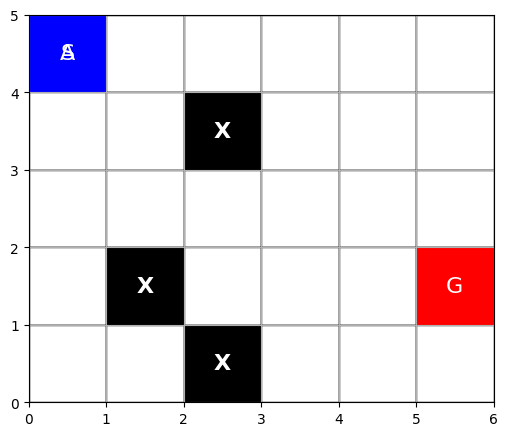

<Figure size 640x480 with 0 Axes>

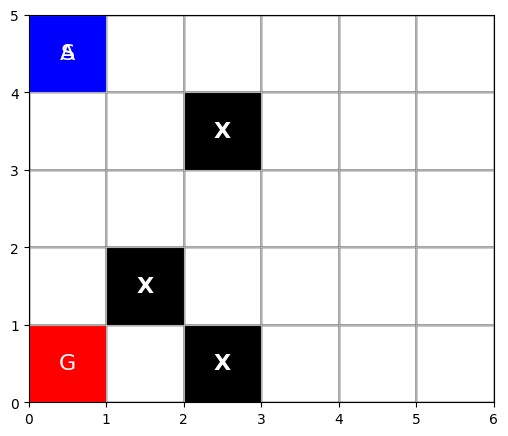

<Figure size 640x480 with 0 Axes>

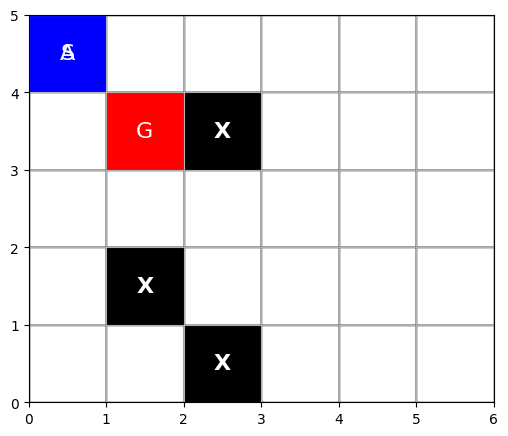

<Figure size 640x480 with 0 Axes>

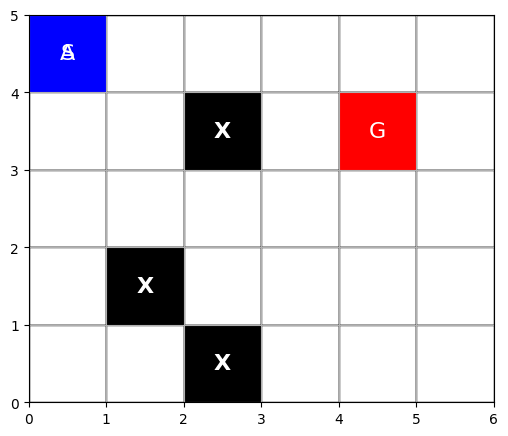

<Figure size 640x480 with 0 Axes>

In [ ]:
env = GridWorldMovingGoal()
state = env.reset()
actions = ['up', 'down', 'left', 'right']
done = False
steps = 0

while not done and steps < 20:
    env.render()
    action = random.choice(actions)
    state, reward, done = env.step(action)
    steps += 1

env.render()


# convergence is hard

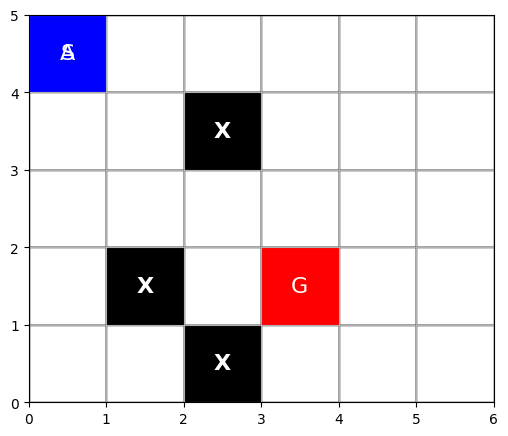

<Figure size 640x480 with 0 Axes>

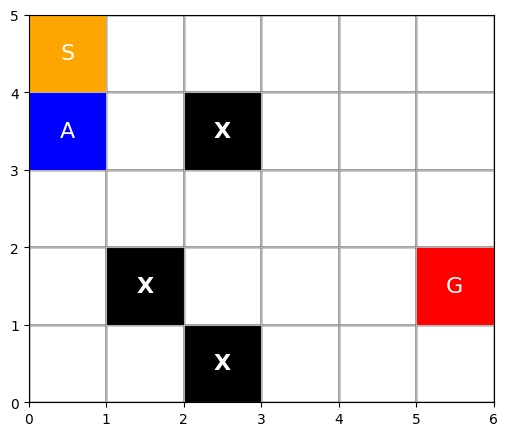

<Figure size 640x480 with 0 Axes>

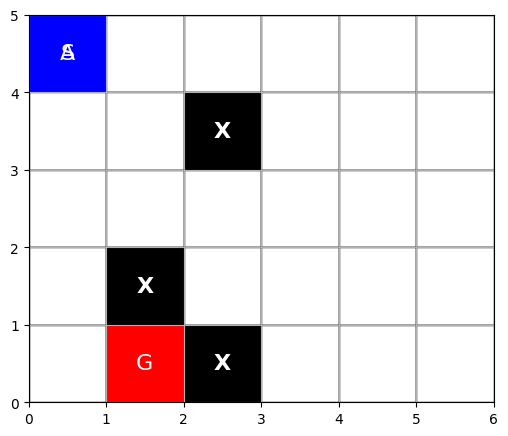

<Figure size 640x480 with 0 Axes>

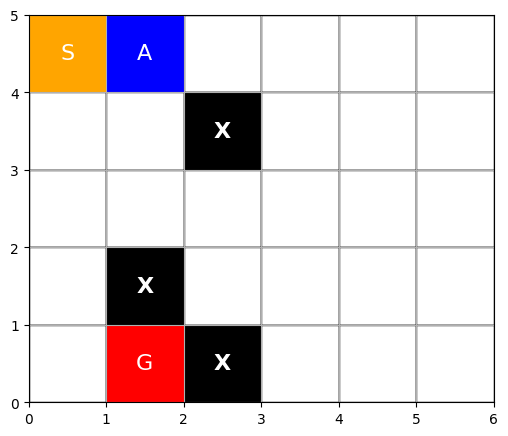

<Figure size 640x480 with 0 Axes>

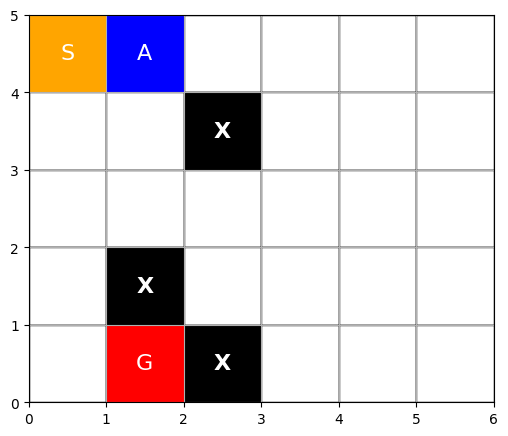

<Figure size 640x480 with 0 Axes>

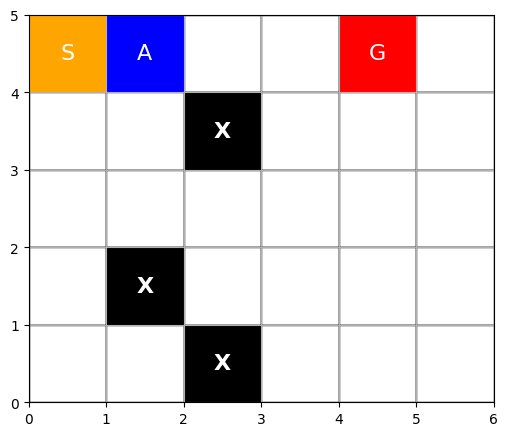

<Figure size 640x480 with 0 Axes>

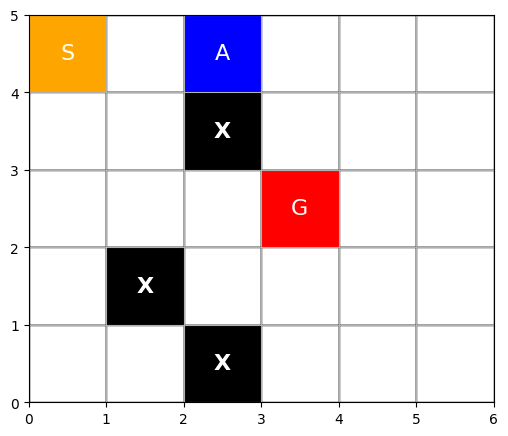

<Figure size 640x480 with 0 Axes>

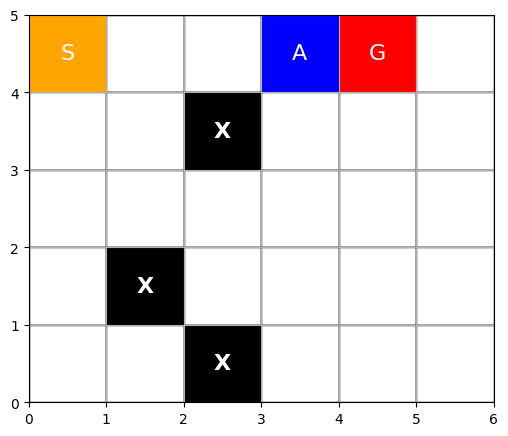

<Figure size 640x480 with 0 Axes>

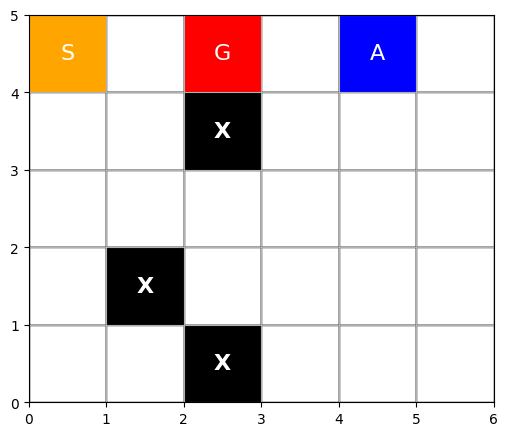

<Figure size 640x480 with 0 Axes>

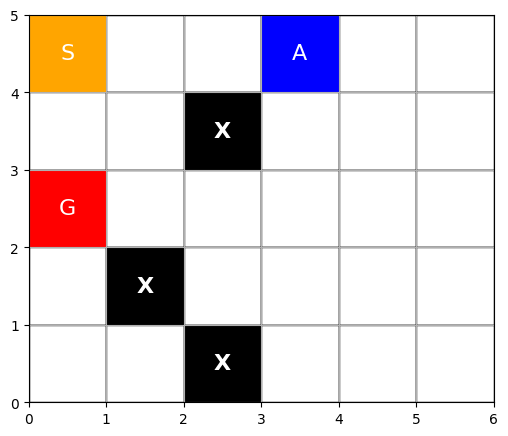

<Figure size 640x480 with 0 Axes>

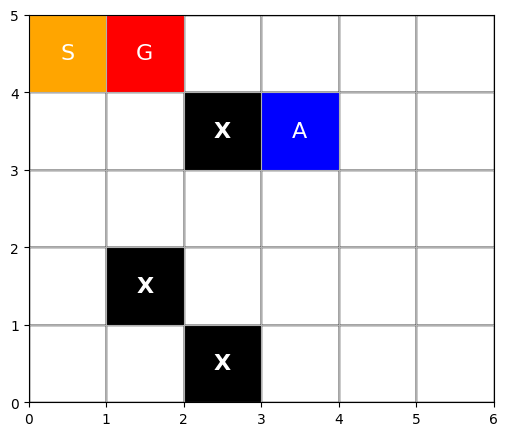

<Figure size 640x480 with 0 Axes>

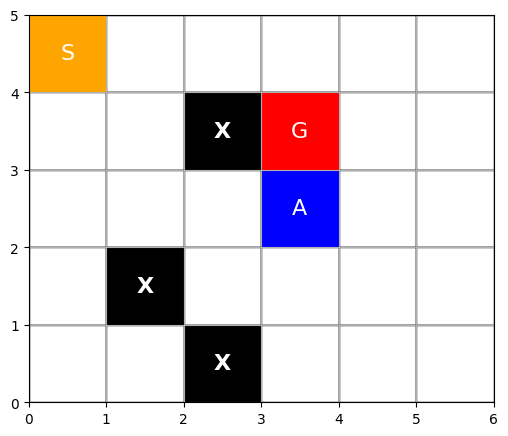

<Figure size 640x480 with 0 Axes>

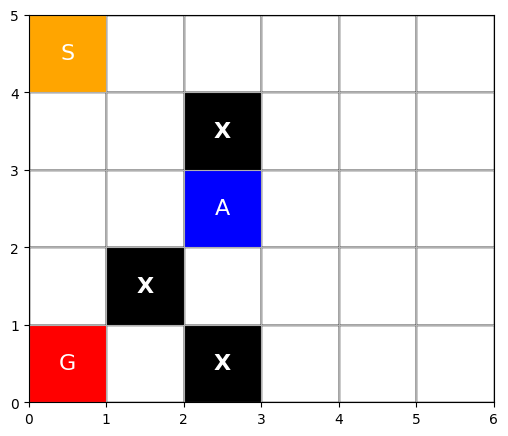

<Figure size 640x480 with 0 Axes>

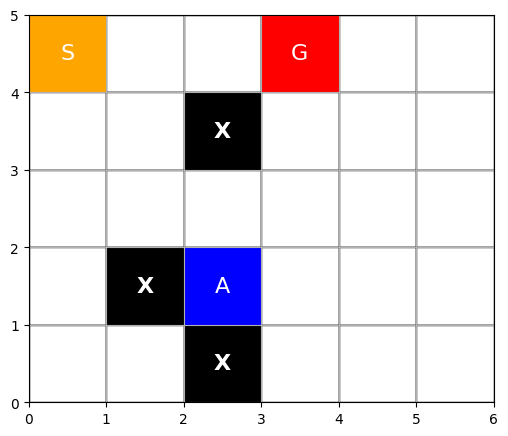

<Figure size 640x480 with 0 Axes>

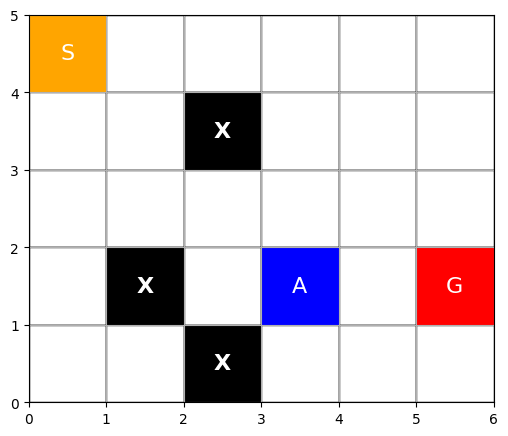

<Figure size 640x480 with 0 Axes>

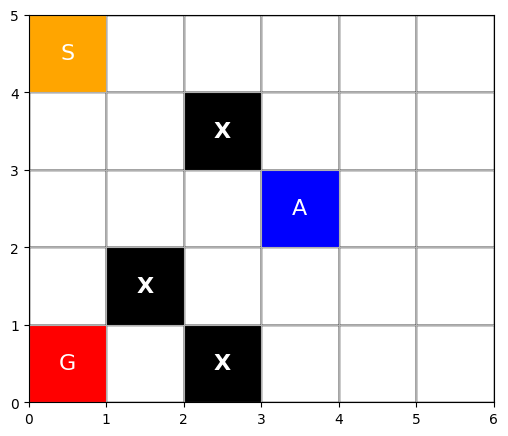

<Figure size 640x480 with 0 Axes>

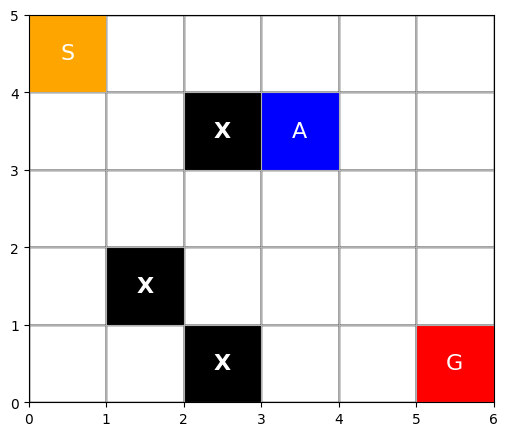

<Figure size 640x480 with 0 Axes>

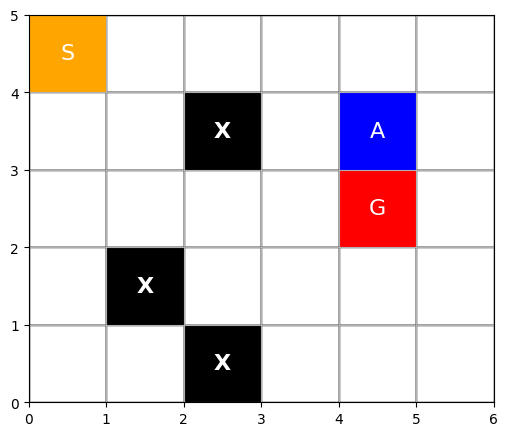

<Figure size 640x480 with 0 Axes>

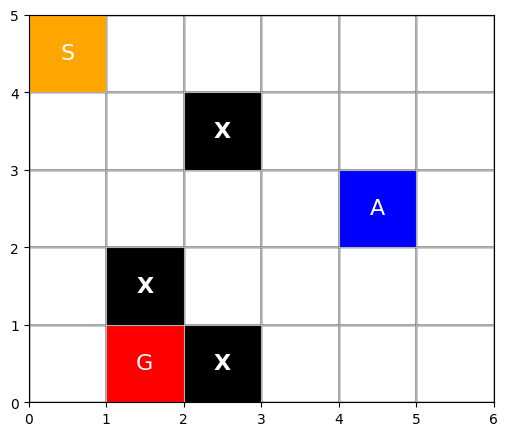

<Figure size 640x480 with 0 Axes>

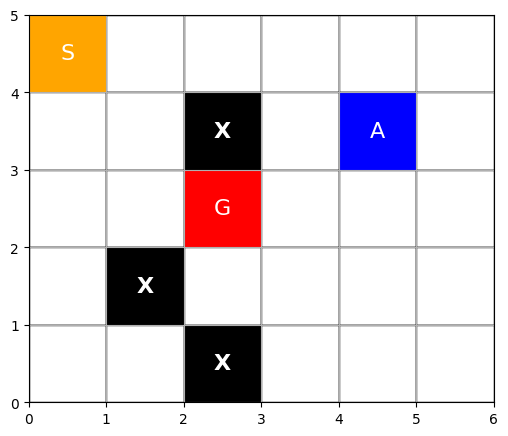

<Figure size 640x480 with 0 Axes>

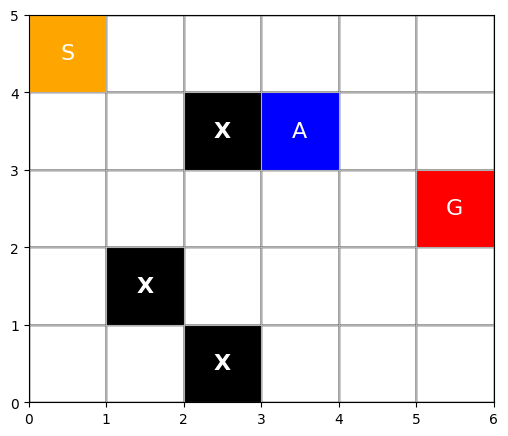

<Figure size 640x480 with 0 Axes>

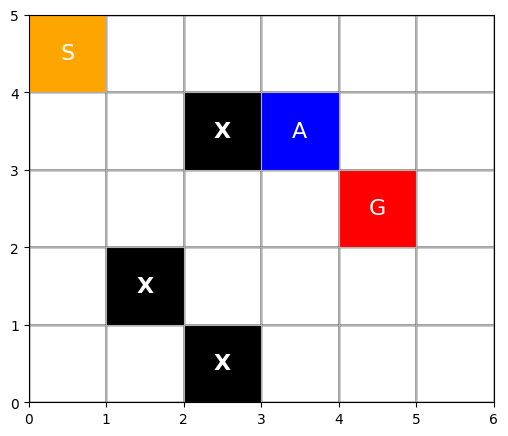

<Figure size 640x480 with 0 Axes>

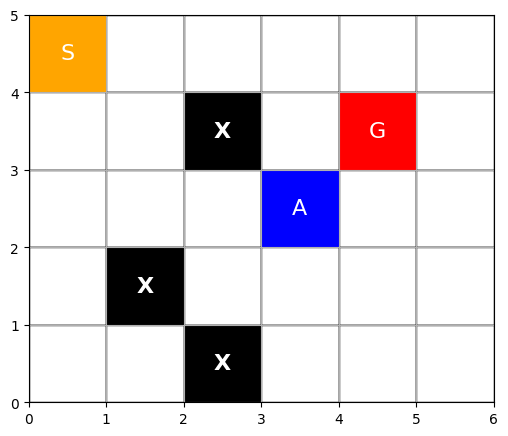

<Figure size 640x480 with 0 Axes>

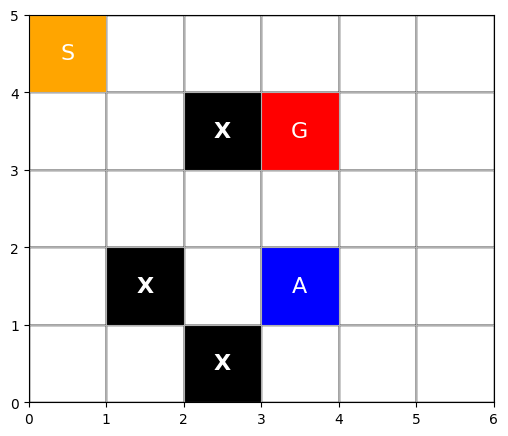

<Figure size 640x480 with 0 Axes>

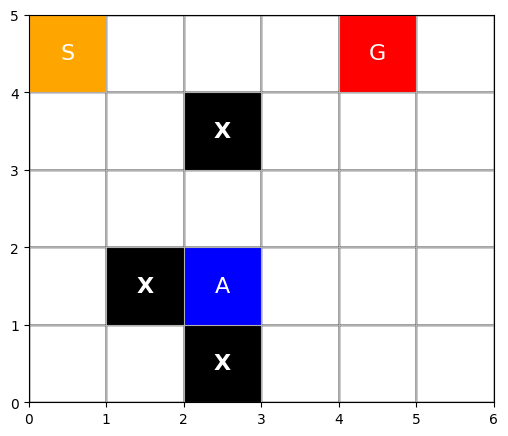

<Figure size 640x480 with 0 Axes>

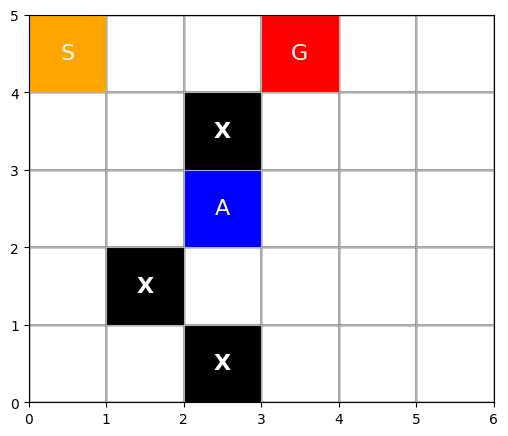

<Figure size 640x480 with 0 Axes>

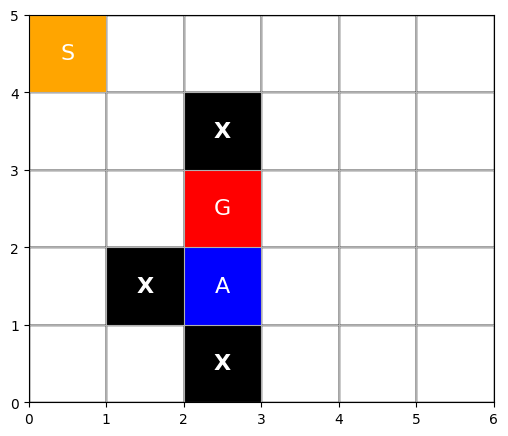

<Figure size 640x480 with 0 Axes>

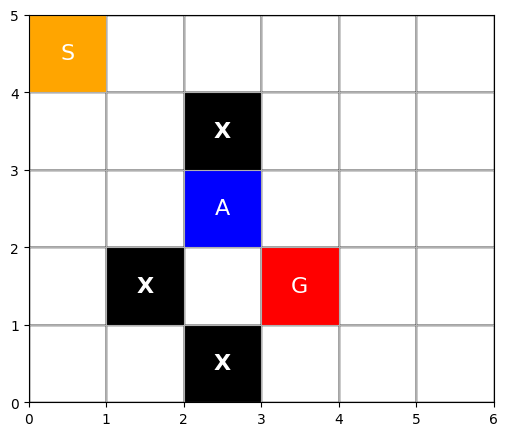

<Figure size 640x480 with 0 Axes>

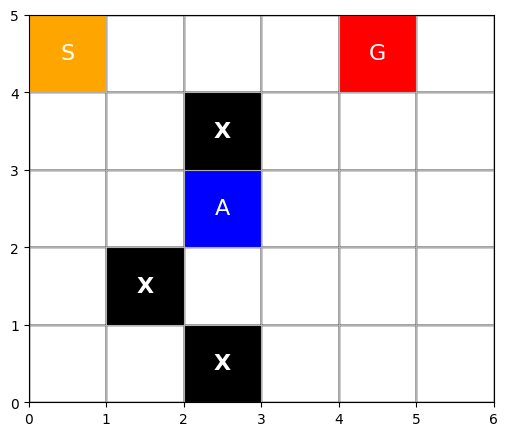

<Figure size 640x480 with 0 Axes>

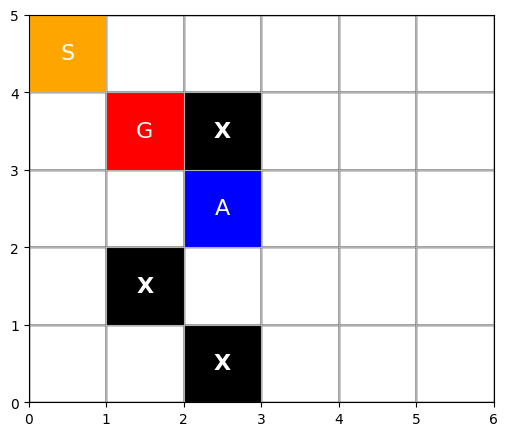

<Figure size 640x480 with 0 Axes>

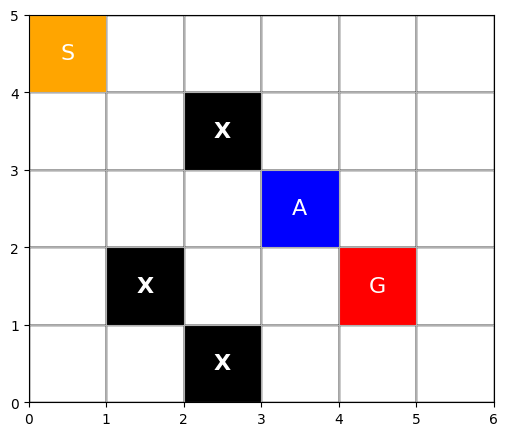

<Figure size 640x480 with 0 Axes>

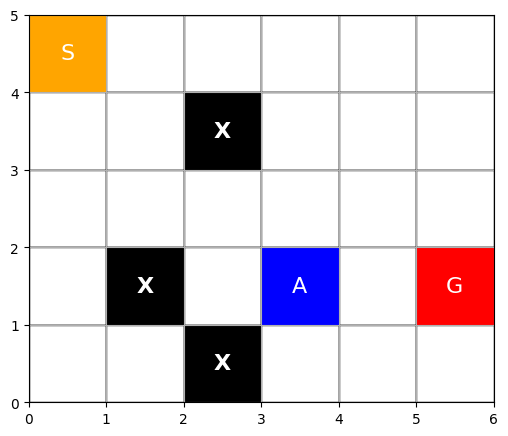

<Figure size 640x480 with 0 Axes>

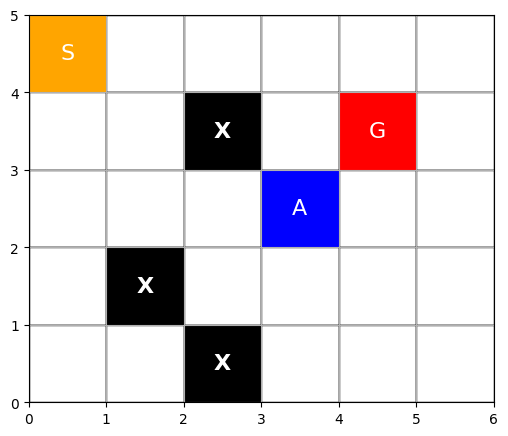

<Figure size 640x480 with 0 Axes>

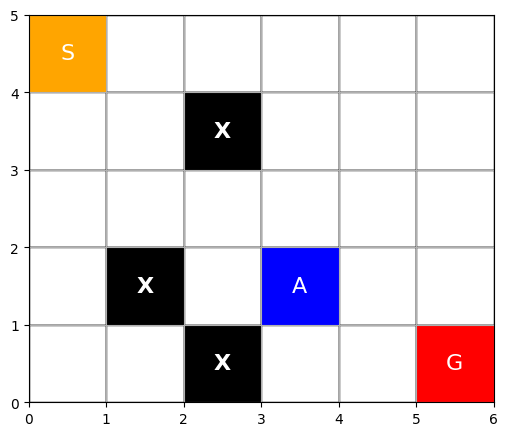

<Figure size 640x480 with 0 Axes>

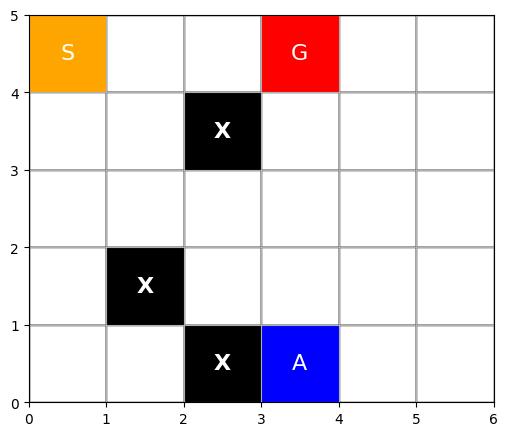

<Figure size 640x480 with 0 Axes>

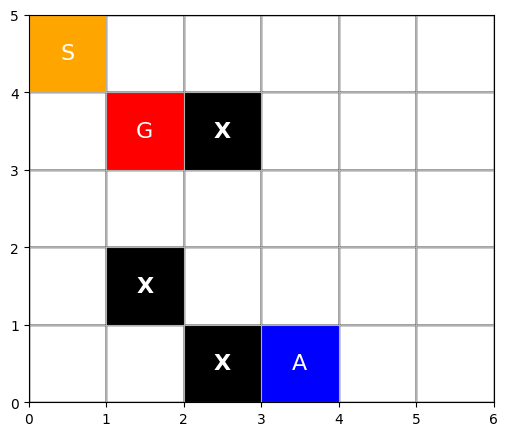

<Figure size 640x480 with 0 Axes>

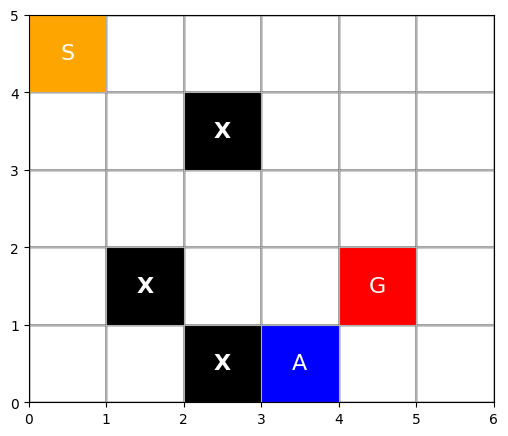

<Figure size 640x480 with 0 Axes>

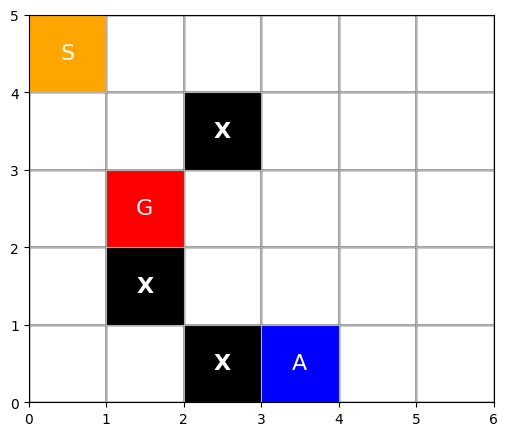

<Figure size 640x480 with 0 Axes>

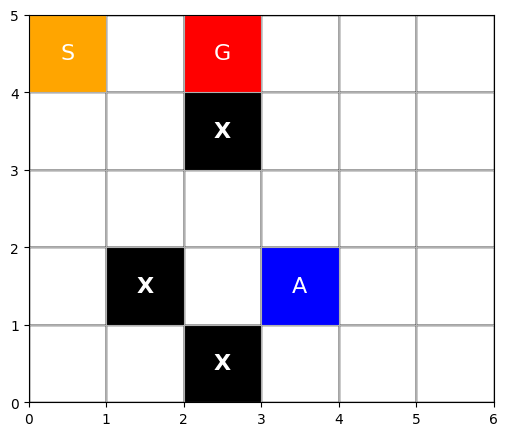

<Figure size 640x480 with 0 Axes>

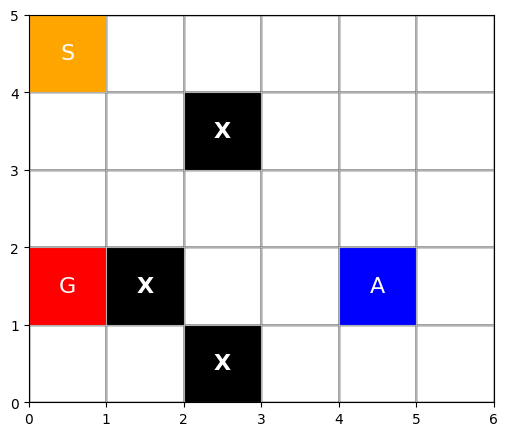

<Figure size 640x480 with 0 Axes>

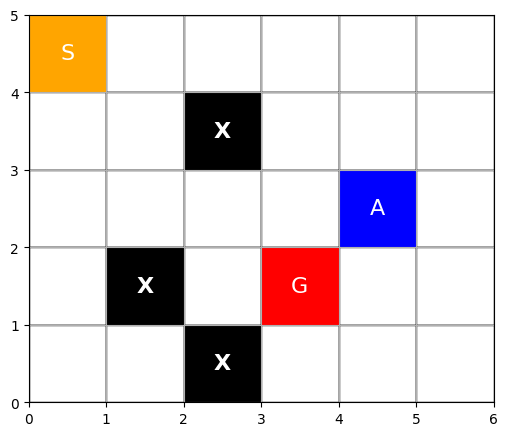

<Figure size 640x480 with 0 Axes>

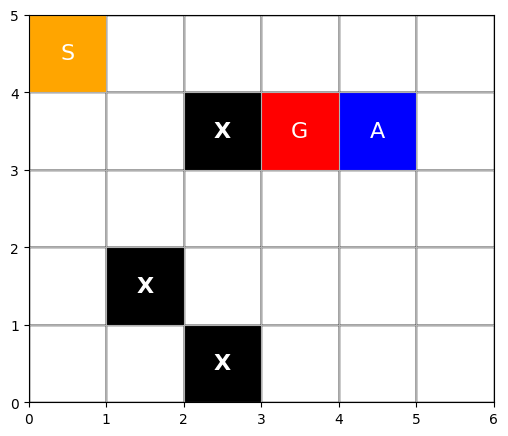

<Figure size 640x480 with 0 Axes>

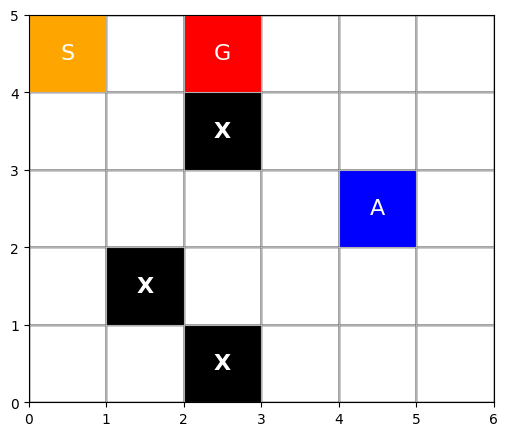

<Figure size 640x480 with 0 Axes>

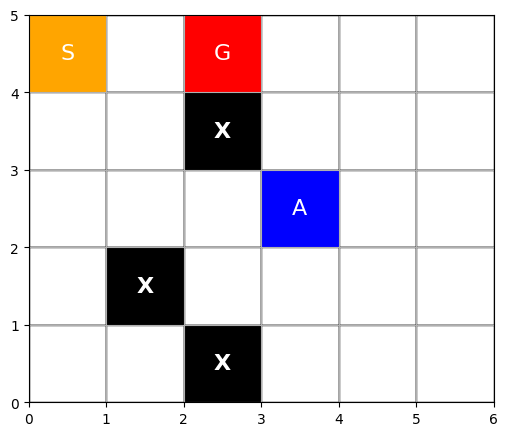

<Figure size 640x480 with 0 Axes>

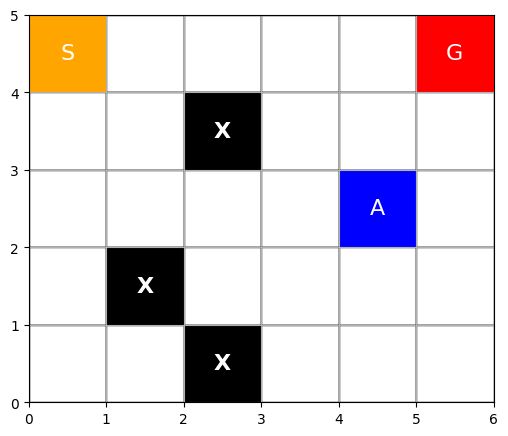

<Figure size 640x480 with 0 Axes>

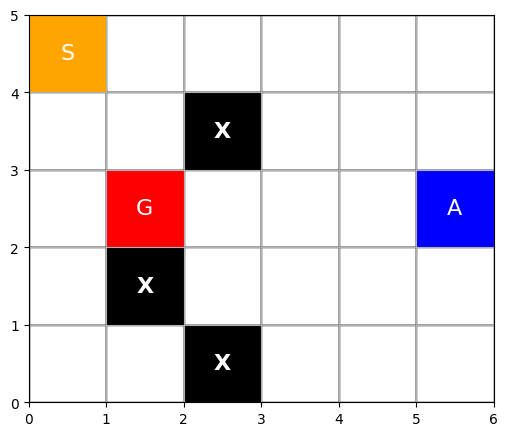

<Figure size 640x480 with 0 Axes>

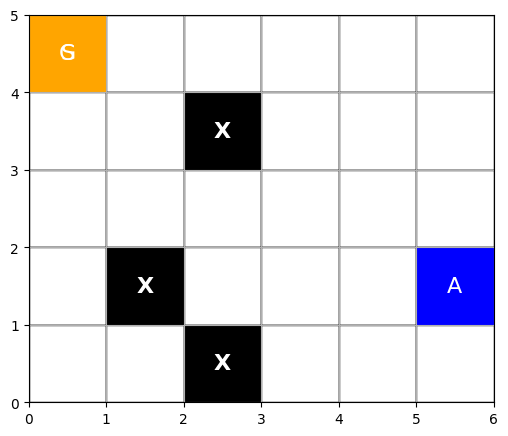

<Figure size 640x480 with 0 Axes>

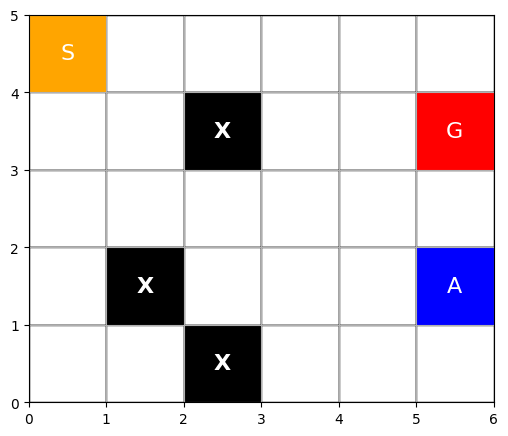

<Figure size 640x480 with 0 Axes>

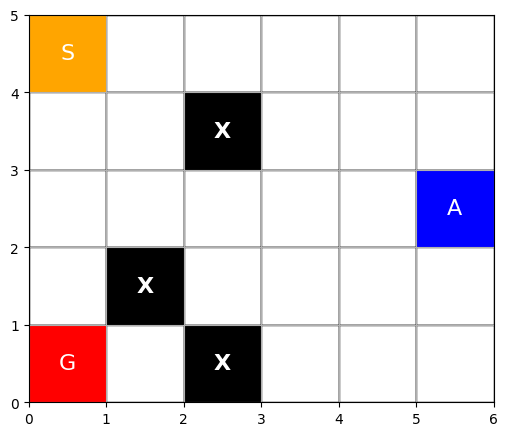

<Figure size 640x480 with 0 Axes>

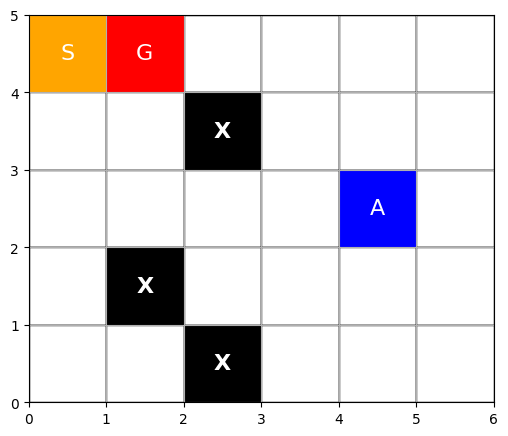

<Figure size 640x480 with 0 Axes>

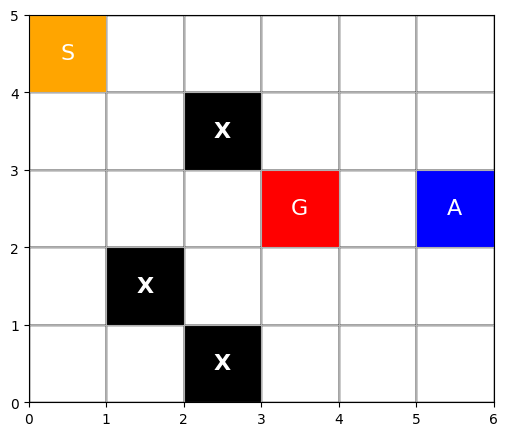

<Figure size 640x480 with 0 Axes>

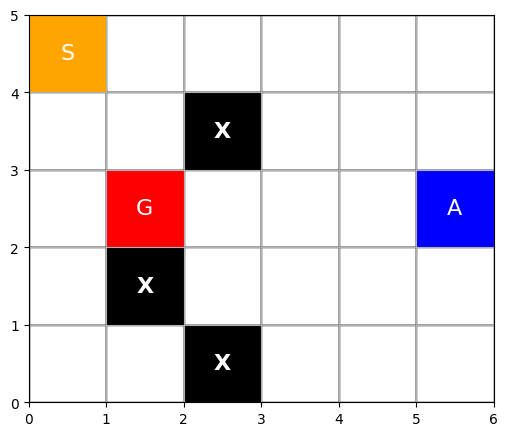

<Figure size 640x480 with 0 Axes>

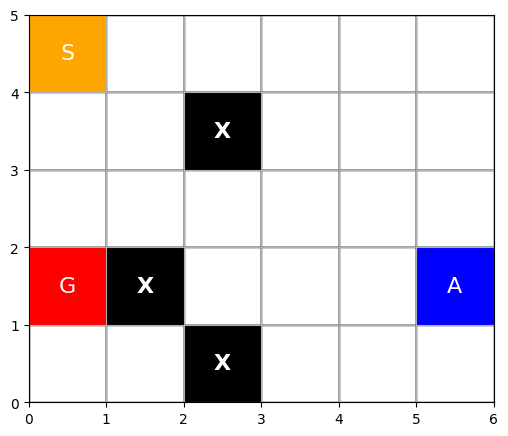

<Figure size 640x480 with 0 Axes>

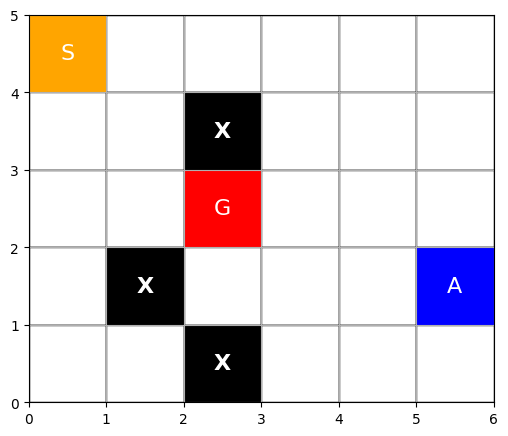

<Figure size 640x480 with 0 Axes>

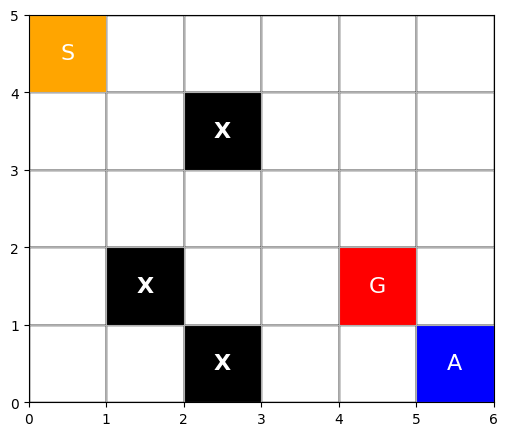

<Figure size 640x480 with 0 Axes>

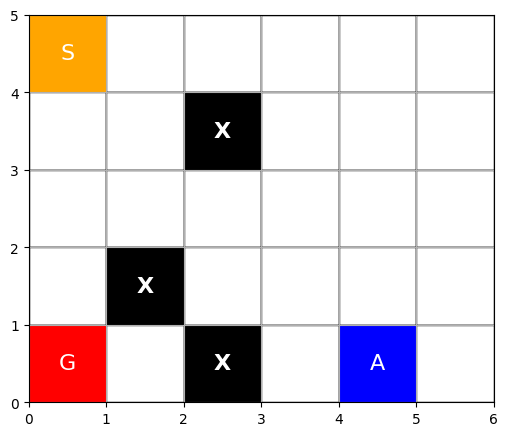

<Figure size 640x480 with 0 Axes>

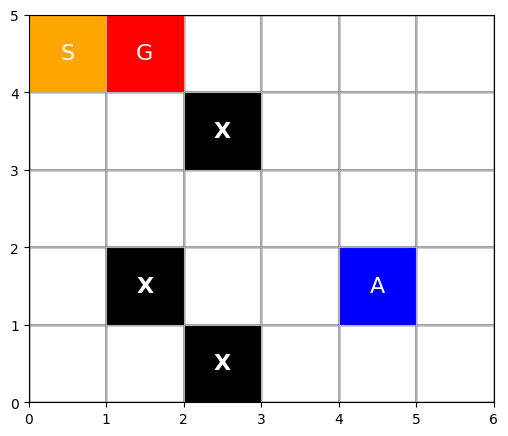

<Figure size 640x480 with 0 Axes>

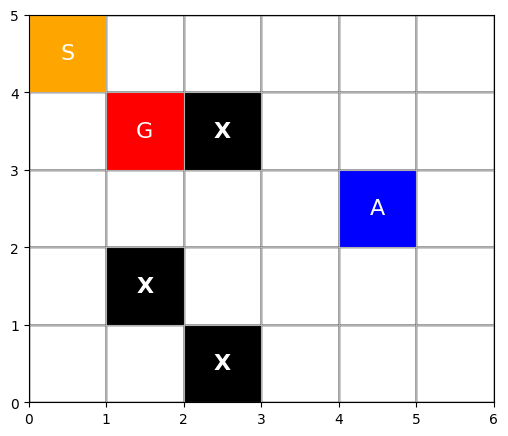

<Figure size 640x480 with 0 Axes>

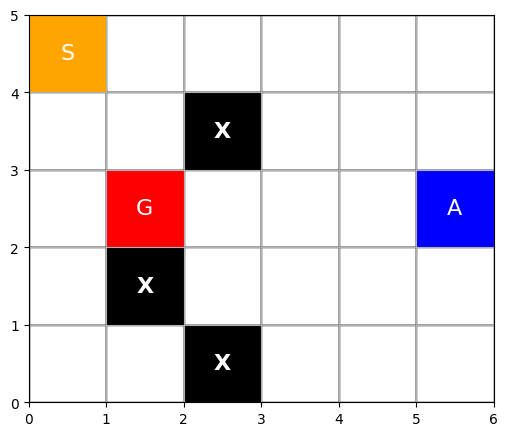

<Figure size 640x480 with 0 Axes>

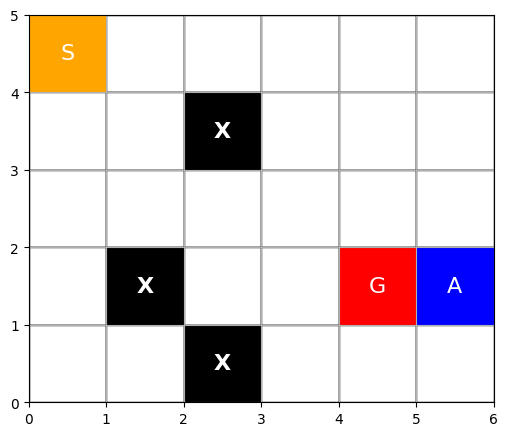

<Figure size 640x480 with 0 Axes>

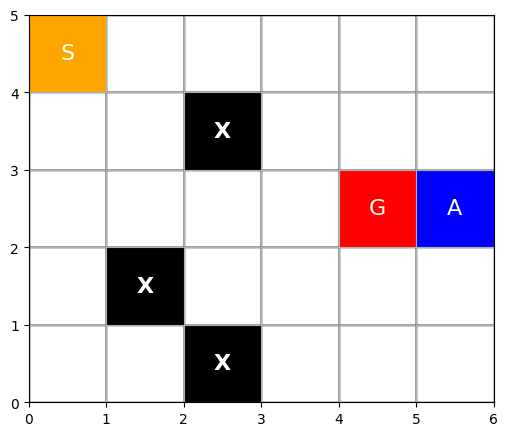

<Figure size 640x480 with 0 Axes>

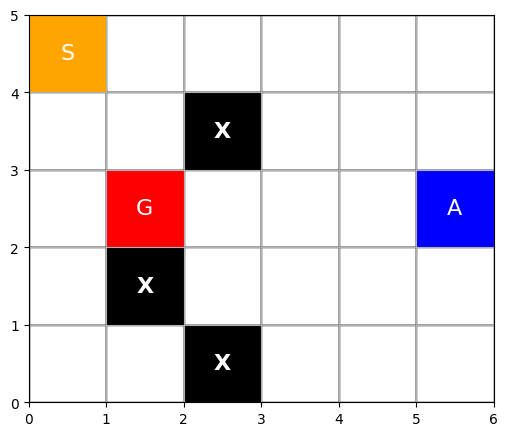

<Figure size 640x480 with 0 Axes>

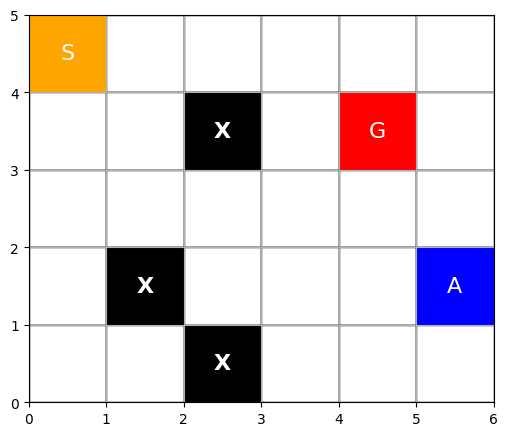

<Figure size 640x480 with 0 Axes>

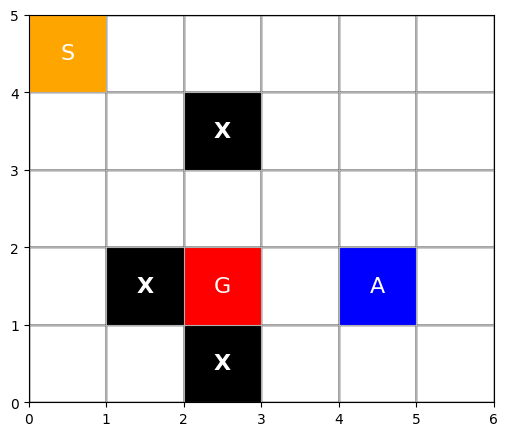

<Figure size 640x480 with 0 Axes>

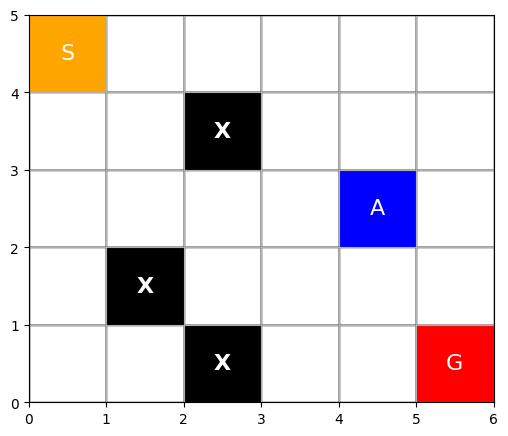

<Figure size 640x480 with 0 Axes>

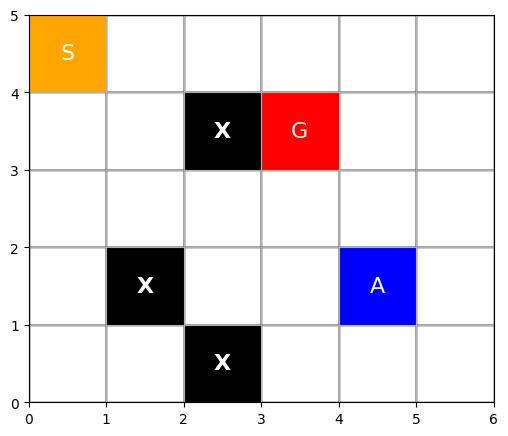

<Figure size 640x480 with 0 Axes>

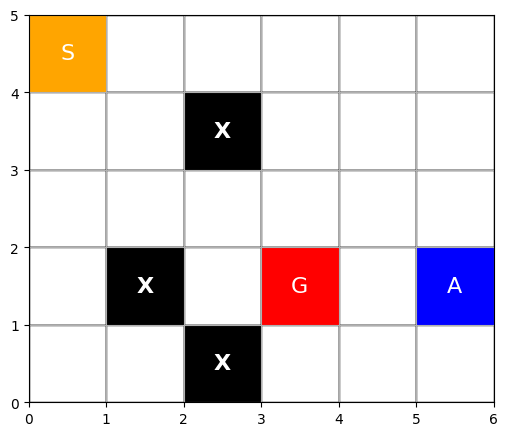

<Figure size 640x480 with 0 Axes>

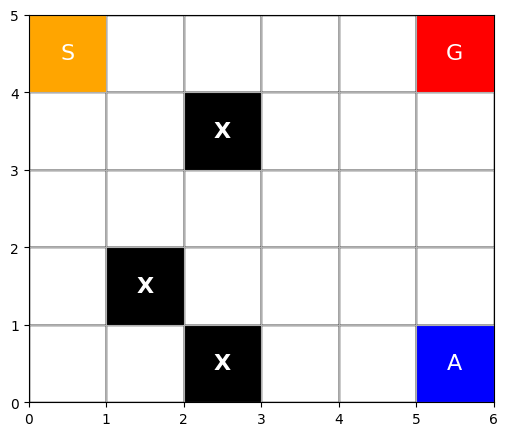

<Figure size 640x480 with 0 Axes>

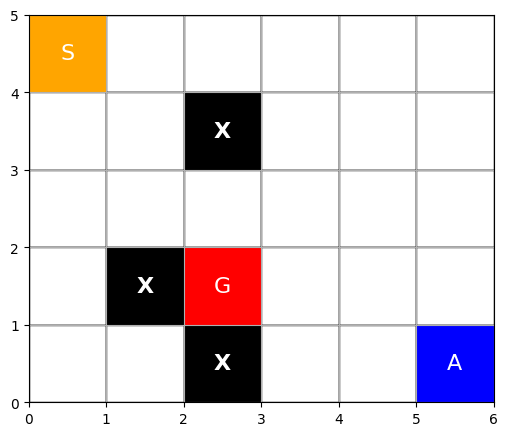

<Figure size 640x480 with 0 Axes>

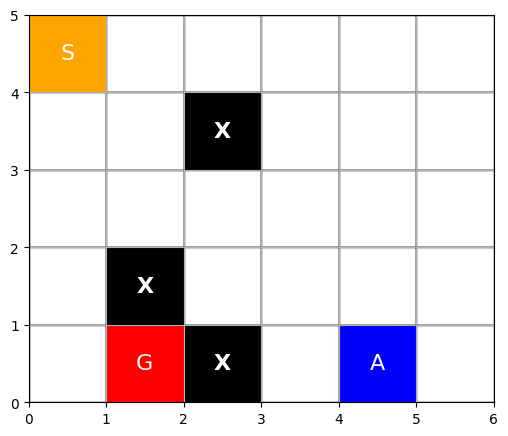

<Figure size 640x480 with 0 Axes>

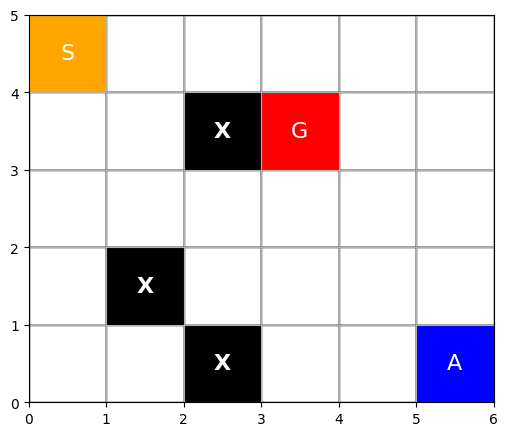

<Figure size 640x480 with 0 Axes>

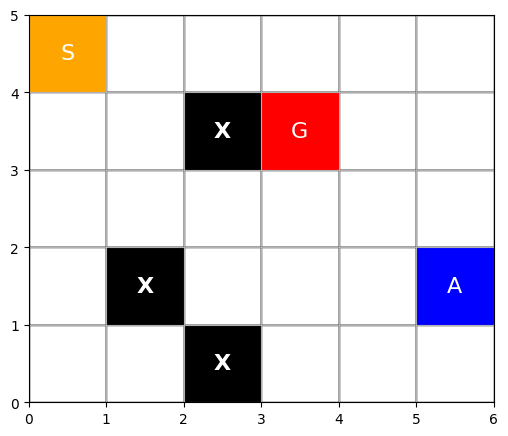

<Figure size 640x480 with 0 Axes>

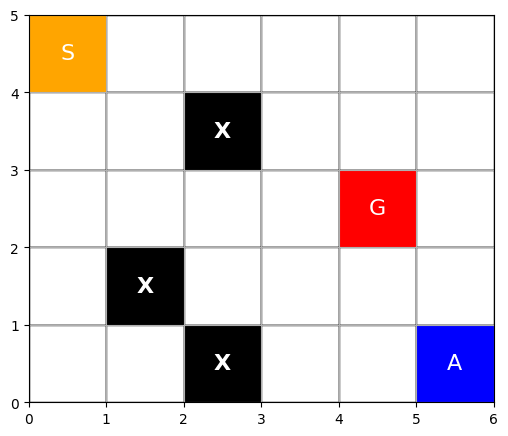

<Figure size 640x480 with 0 Axes>

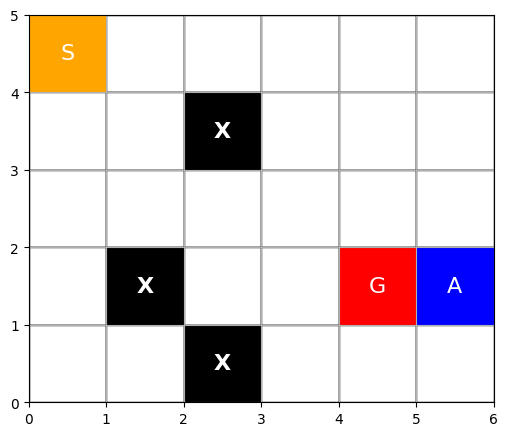

<Figure size 640x480 with 0 Axes>

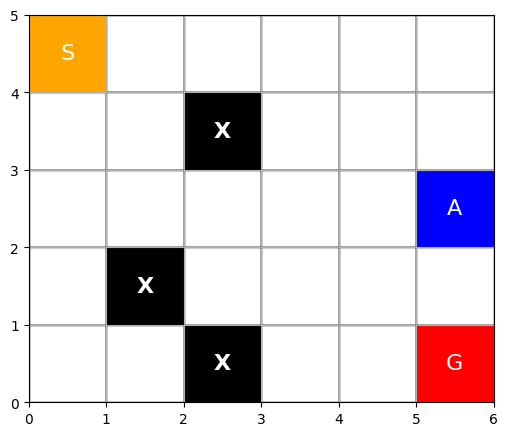

<Figure size 640x480 with 0 Axes>

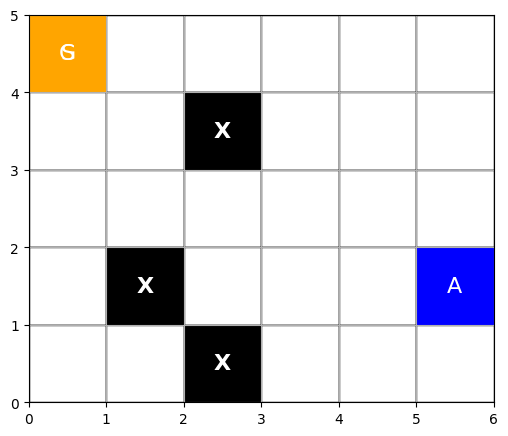

<Figure size 640x480 with 0 Axes>

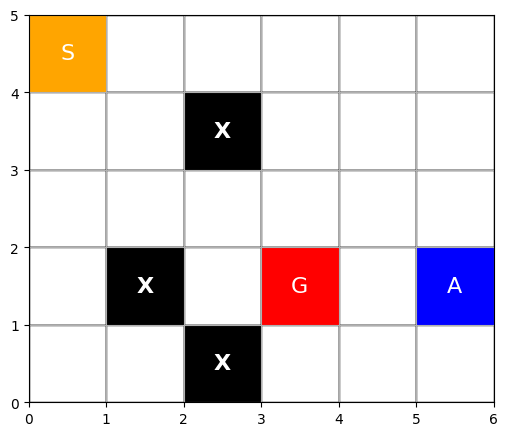

<Figure size 640x480 with 0 Axes>

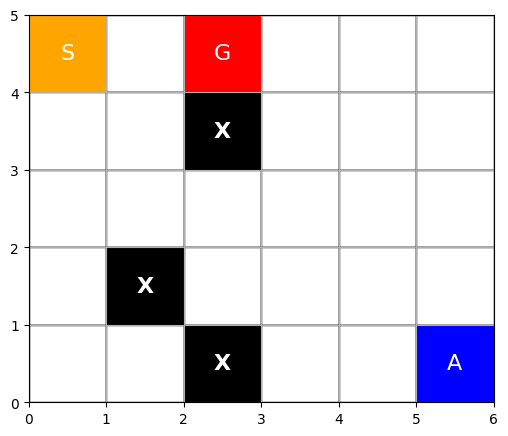

<Figure size 640x480 with 0 Axes>

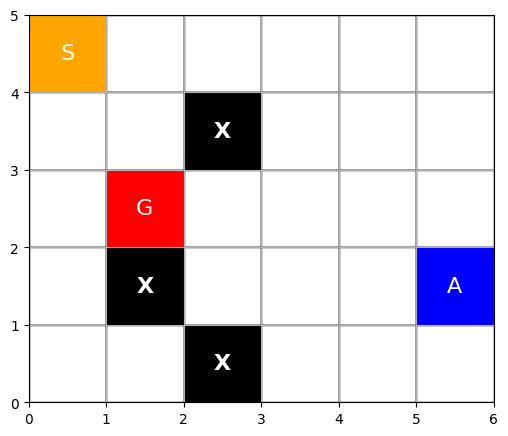

<Figure size 640x480 with 0 Axes>

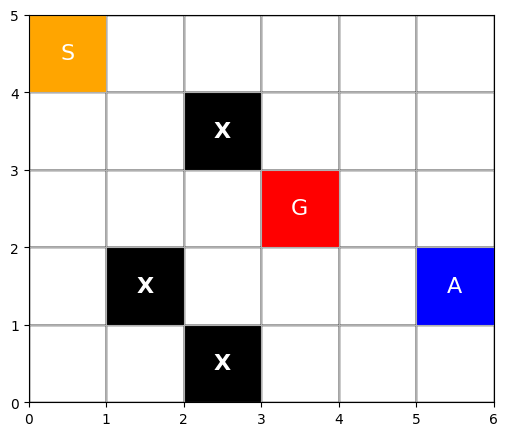

<Figure size 640x480 with 0 Axes>

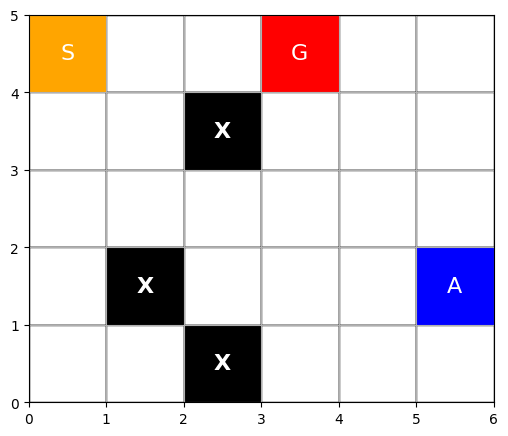

<Figure size 640x480 with 0 Axes>

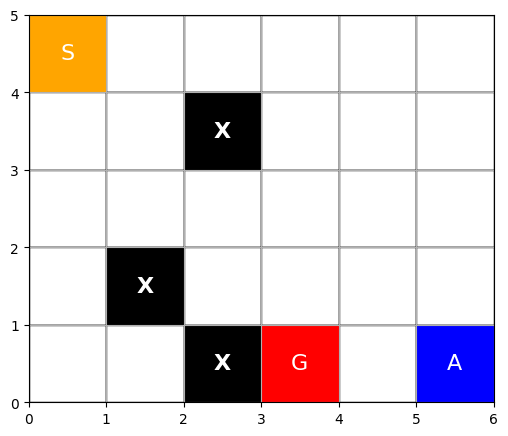

<Figure size 640x480 with 0 Axes>

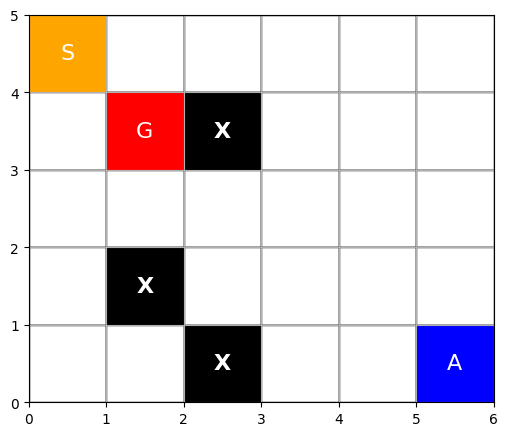

<Figure size 640x480 with 0 Axes>

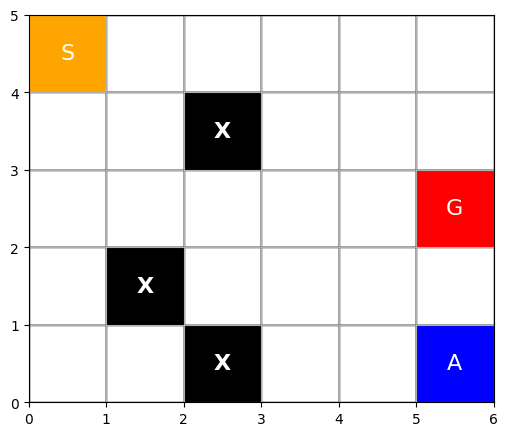

<Figure size 640x480 with 0 Axes>

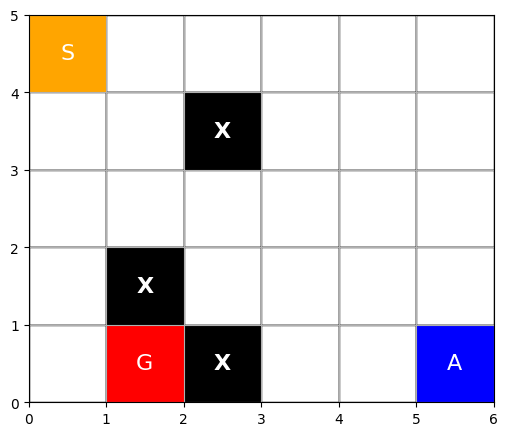

<Figure size 640x480 with 0 Axes>

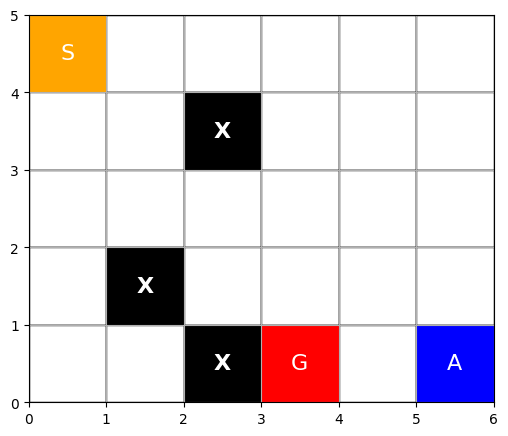

<Figure size 640x480 with 0 Axes>

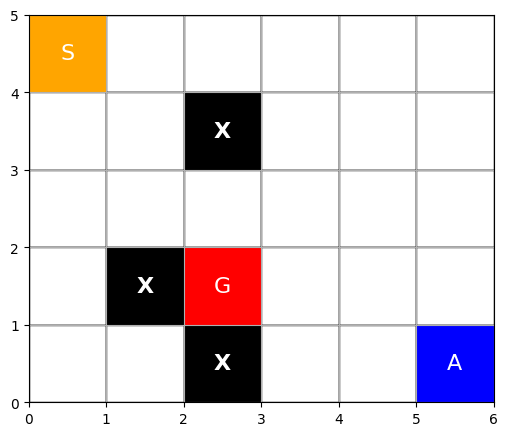

<Figure size 640x480 with 0 Axes>

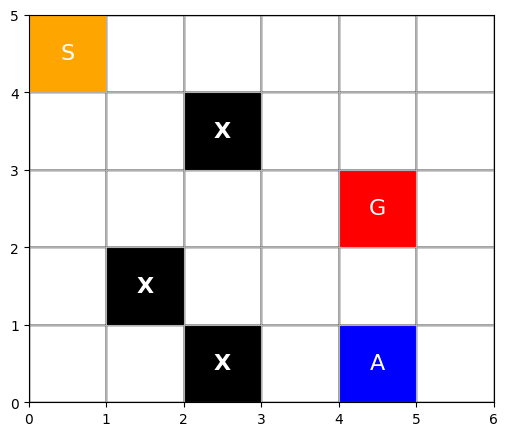

<Figure size 640x480 with 0 Axes>

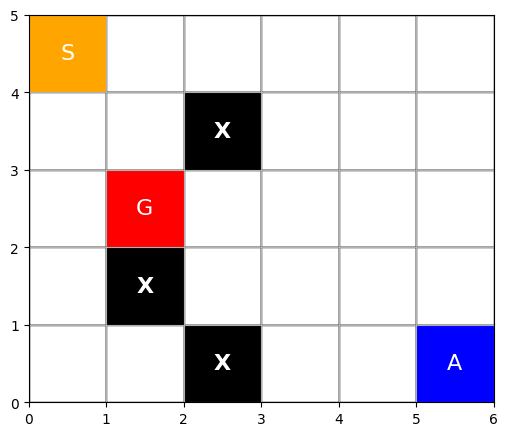

<Figure size 640x480 with 0 Axes>

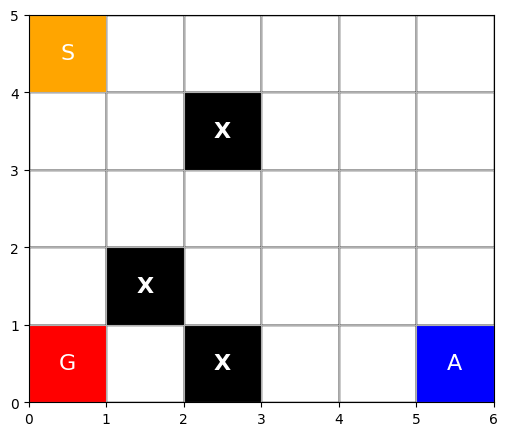

<Figure size 640x480 with 0 Axes>

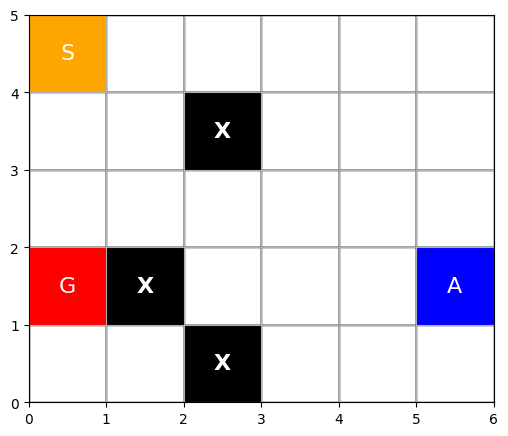

<Figure size 640x480 with 0 Axes>

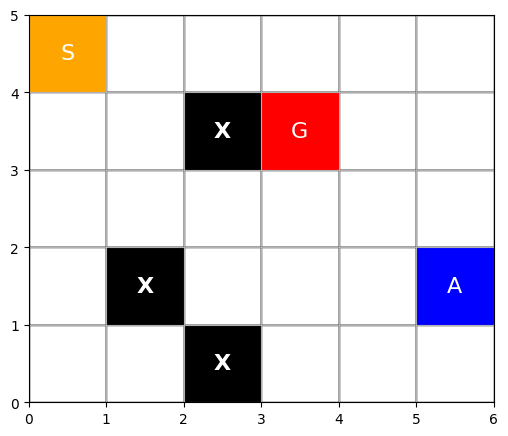

<Figure size 640x480 with 0 Axes>

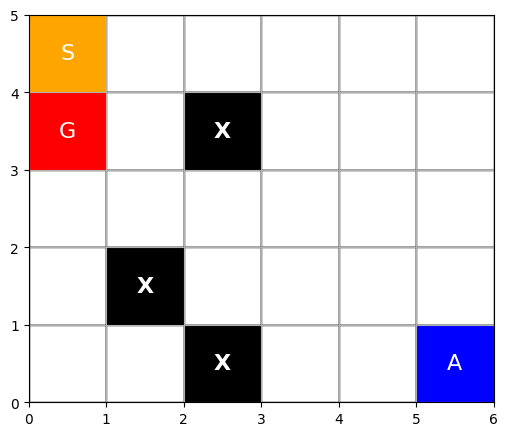

<Figure size 640x480 with 0 Axes>

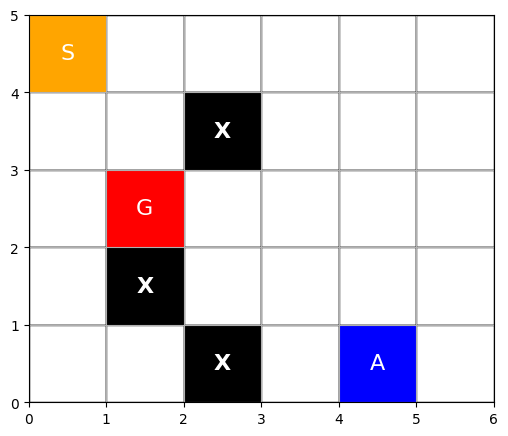

<Figure size 640x480 with 0 Axes>

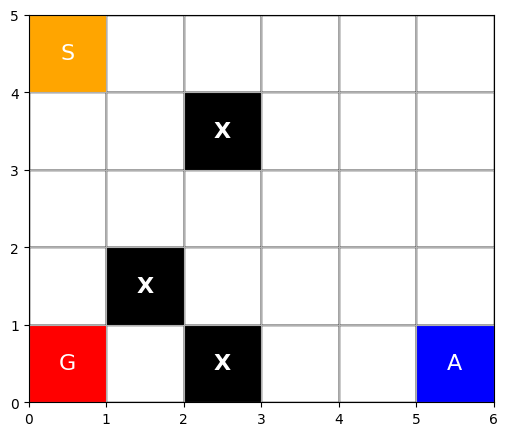

<Figure size 640x480 with 0 Axes>

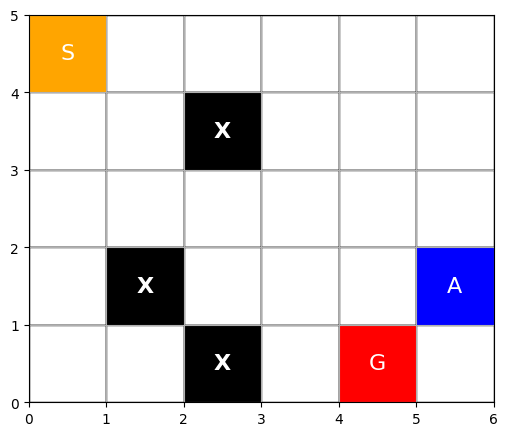

<Figure size 640x480 with 0 Axes>

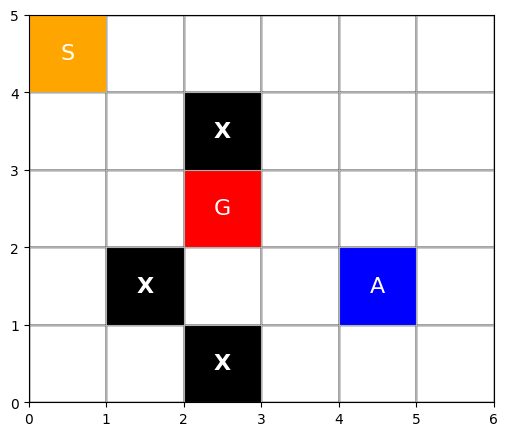

<Figure size 640x480 with 0 Axes>

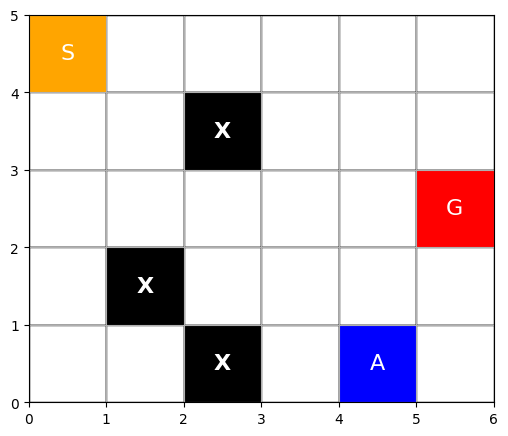

<Figure size 640x480 with 0 Axes>

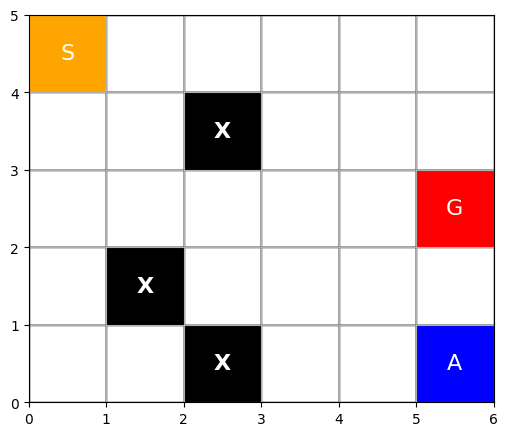

<Figure size 640x480 with 0 Axes>

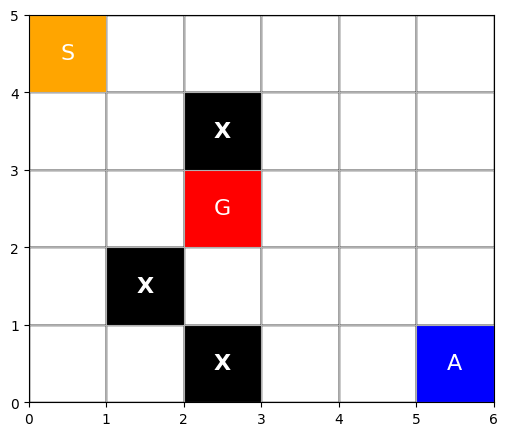

<Figure size 640x480 with 0 Axes>

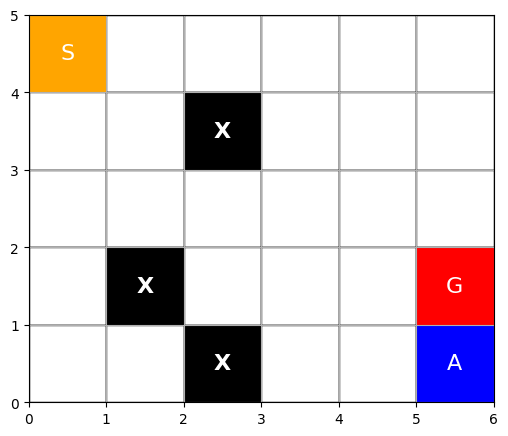

<Figure size 640x480 with 0 Axes>

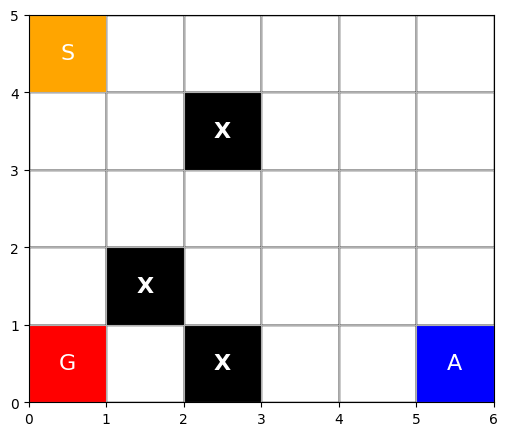

<Figure size 640x480 with 0 Axes>

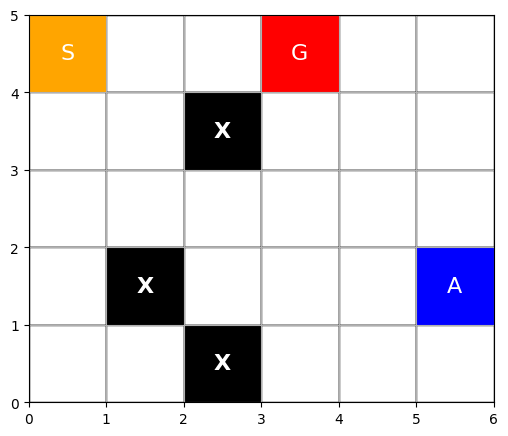

<Figure size 640x480 with 0 Axes>

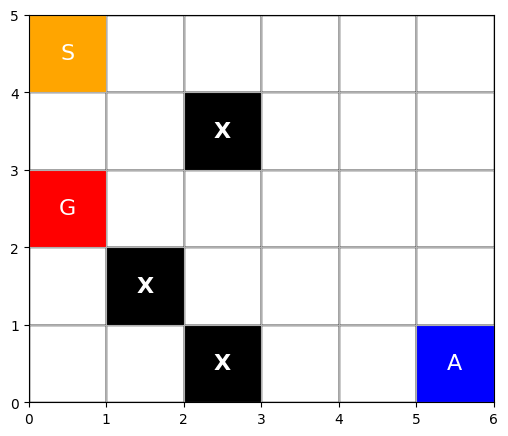

<Figure size 640x480 with 0 Axes>

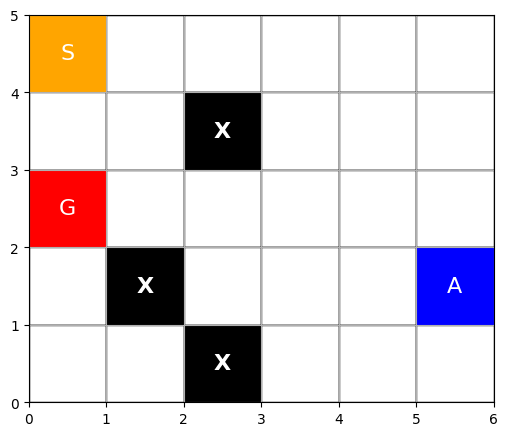

<Figure size 640x480 with 0 Axes>

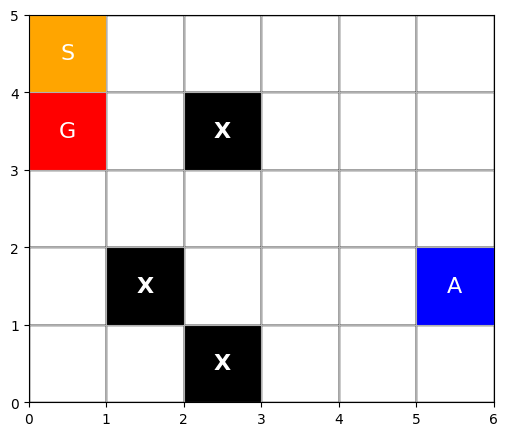

<Figure size 640x480 with 0 Axes>

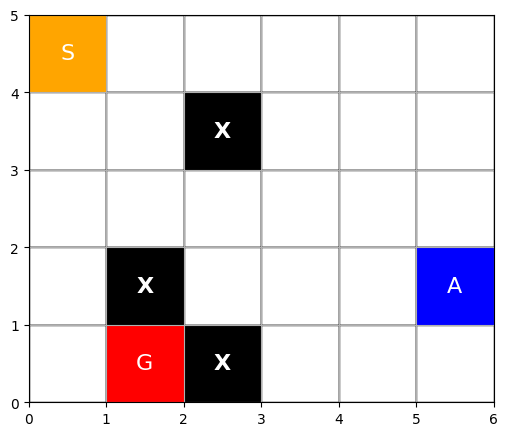

<Figure size 640x480 with 0 Axes>

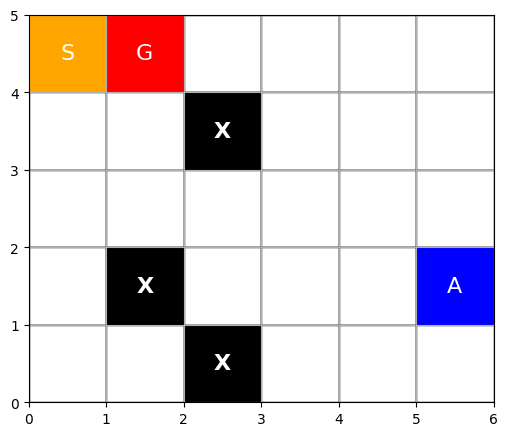

<Figure size 640x480 with 0 Axes>

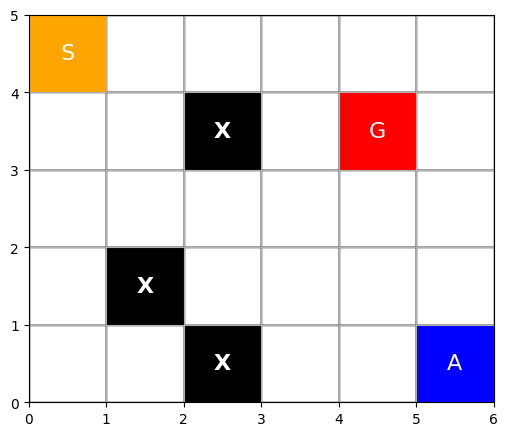

<Figure size 640x480 with 0 Axes>

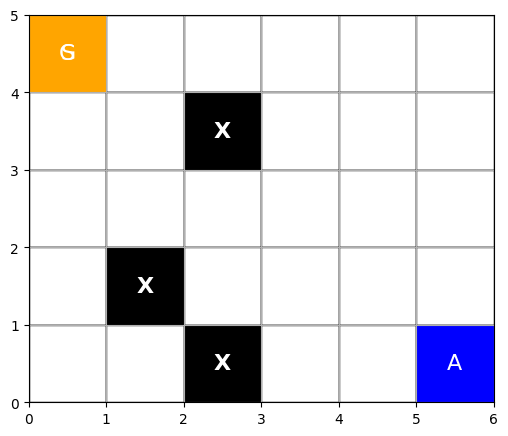

<Figure size 640x480 with 0 Axes>

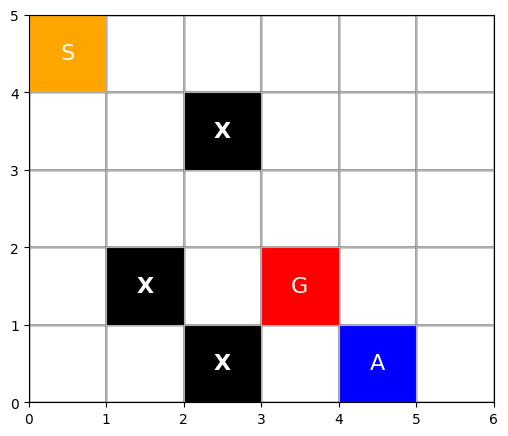

<Figure size 640x480 with 0 Axes>

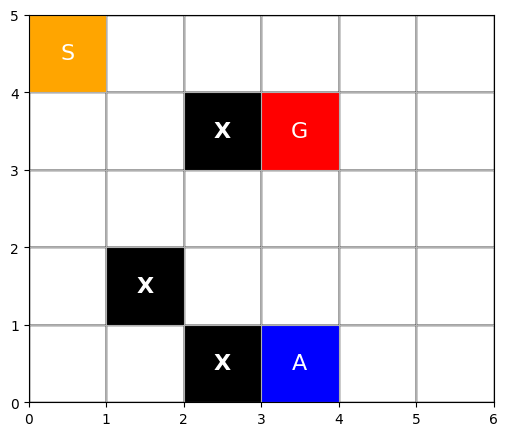

<Figure size 640x480 with 0 Axes>

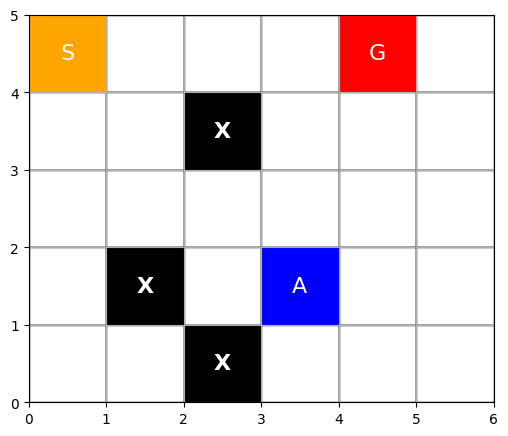

<Figure size 640x480 with 0 Axes>

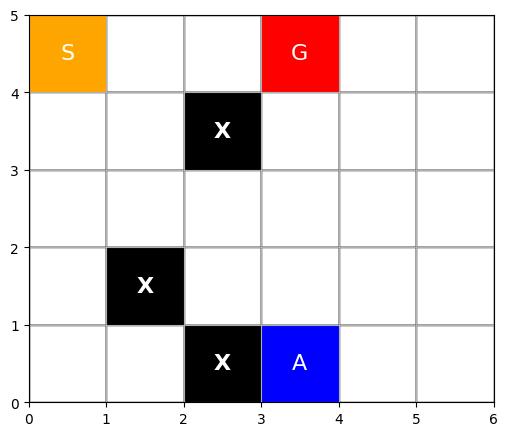

<Figure size 640x480 with 0 Axes>

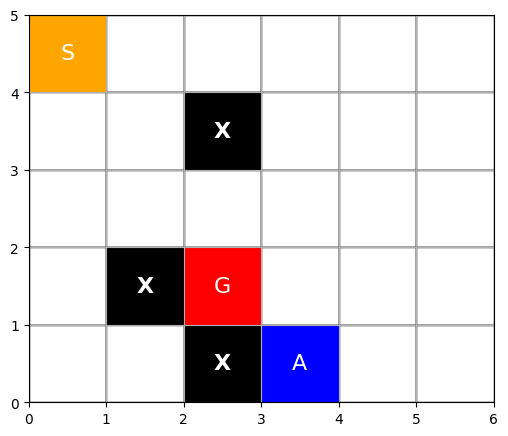

<Figure size 640x480 with 0 Axes>

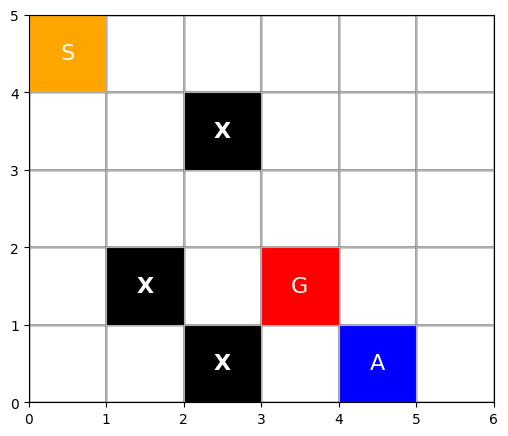

<Figure size 640x480 with 0 Axes>

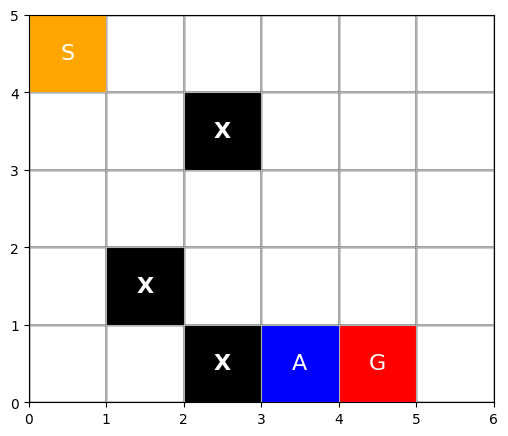

<Figure size 640x480 with 0 Axes>

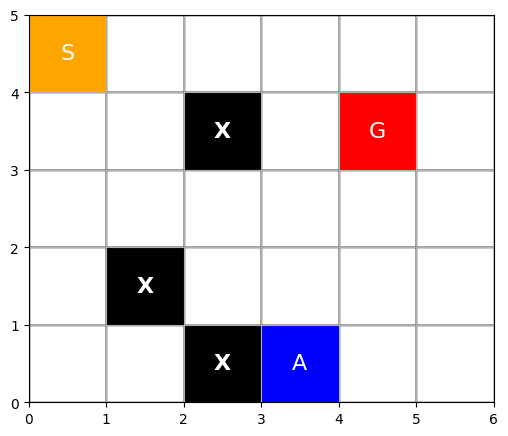

<Figure size 640x480 with 0 Axes>

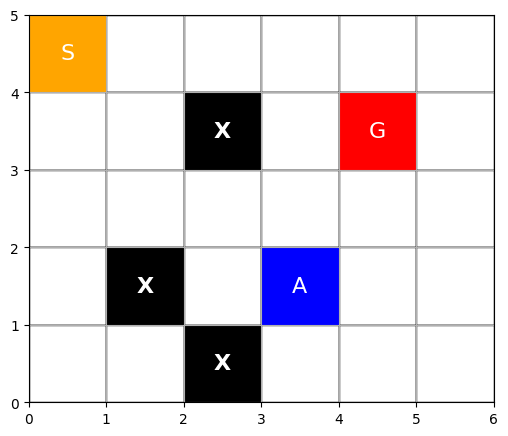

<Figure size 640x480 with 0 Axes>

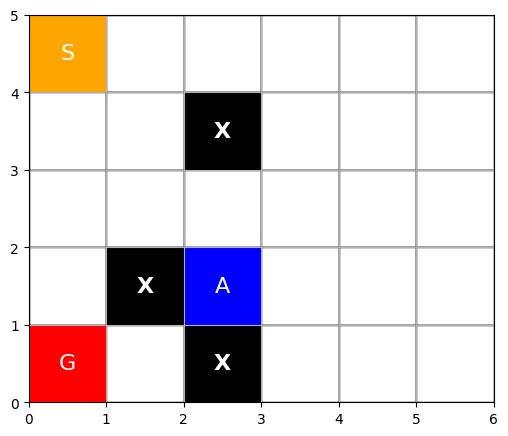

<Figure size 640x480 with 0 Axes>

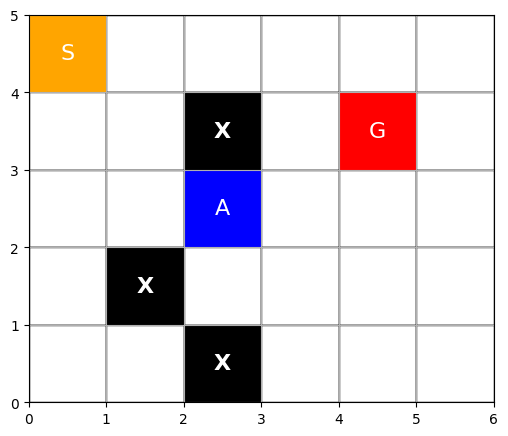

<Figure size 640x480 with 0 Axes>

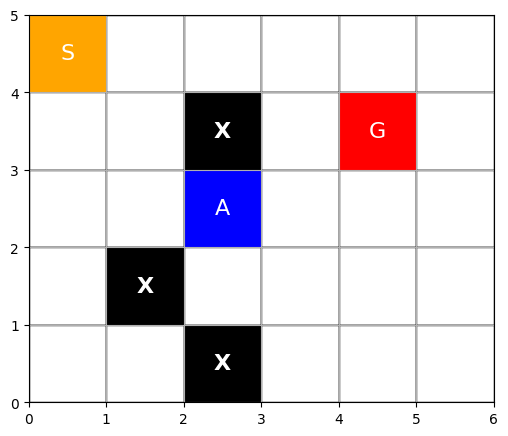

<Figure size 640x480 with 0 Axes>

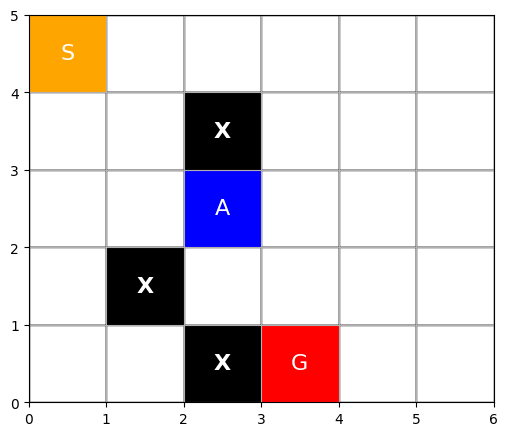

<Figure size 640x480 with 0 Axes>

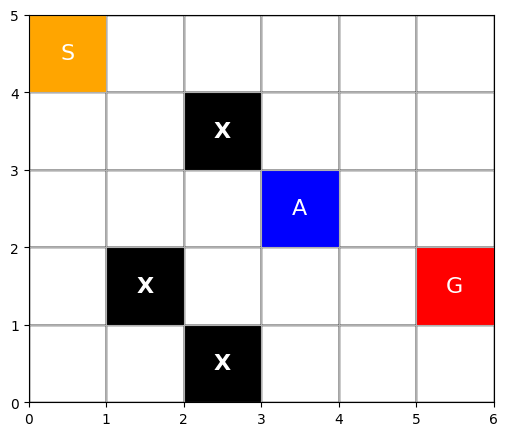

<Figure size 640x480 with 0 Axes>

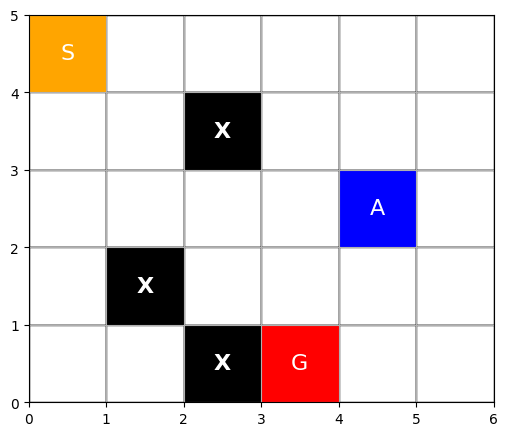

<Figure size 640x480 with 0 Axes>

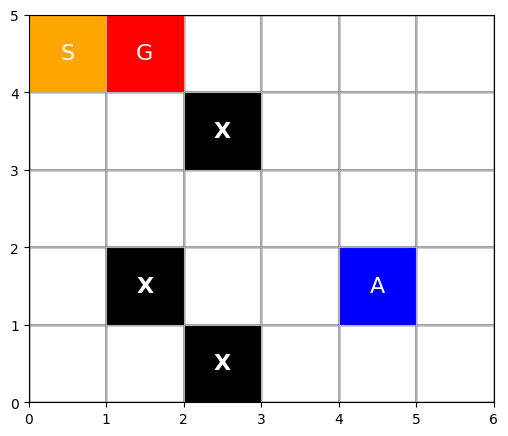

<Figure size 640x480 with 0 Axes>

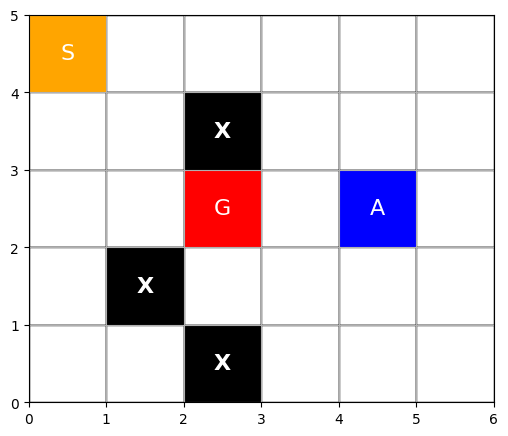

<Figure size 640x480 with 0 Axes>

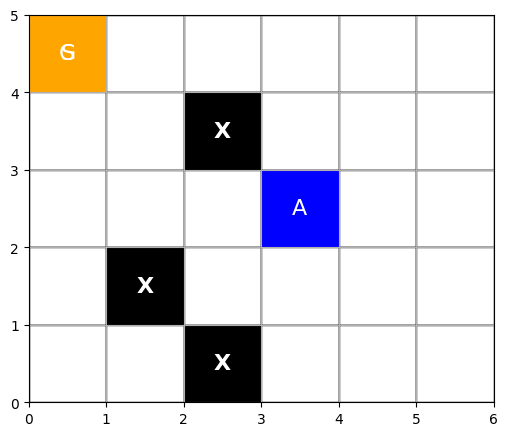

<Figure size 640x480 with 0 Axes>

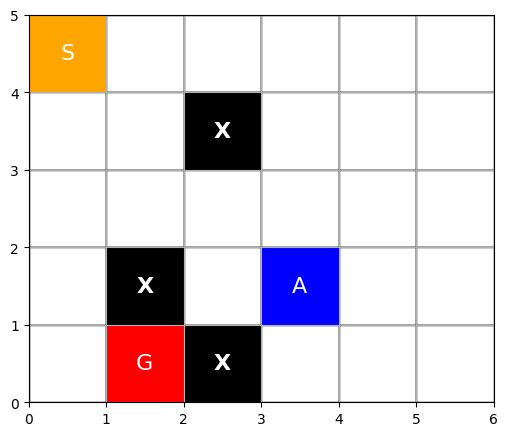

<Figure size 640x480 with 0 Axes>

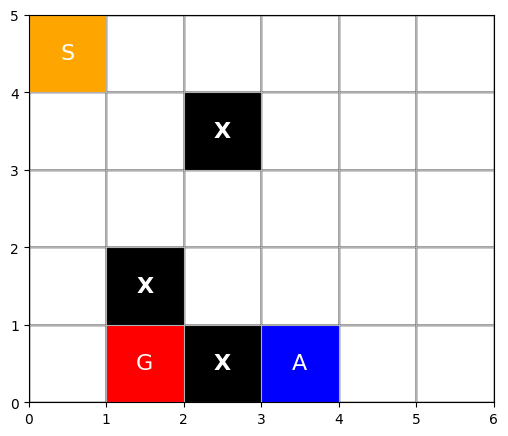

<Figure size 640x480 with 0 Axes>

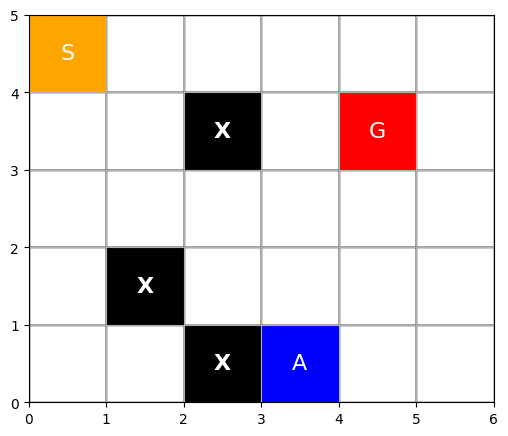

<Figure size 640x480 with 0 Axes>

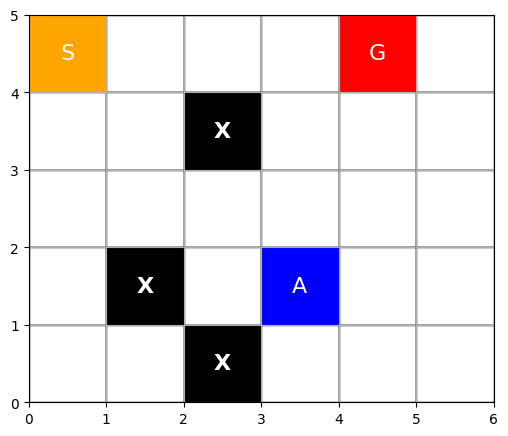

<Figure size 640x480 with 0 Axes>

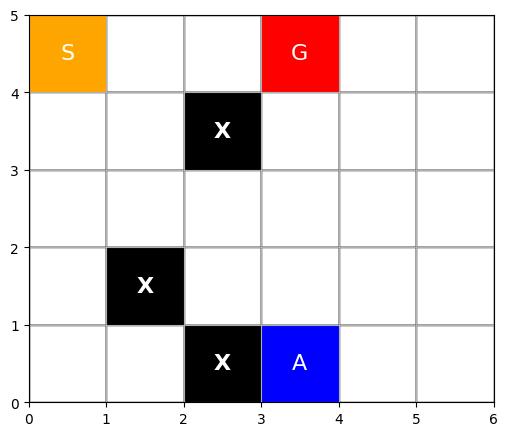

<Figure size 640x480 with 0 Axes>

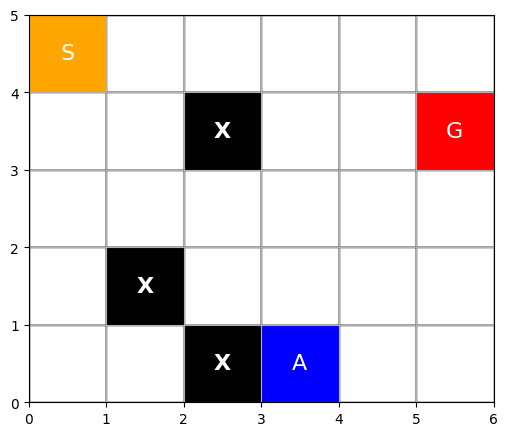

<Figure size 640x480 with 0 Axes>

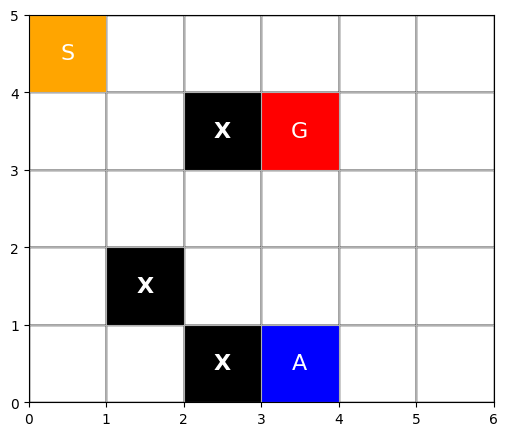

<Figure size 640x480 with 0 Axes>

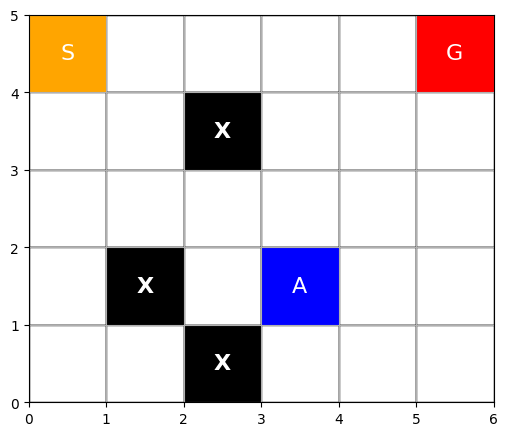

<Figure size 640x480 with 0 Axes>

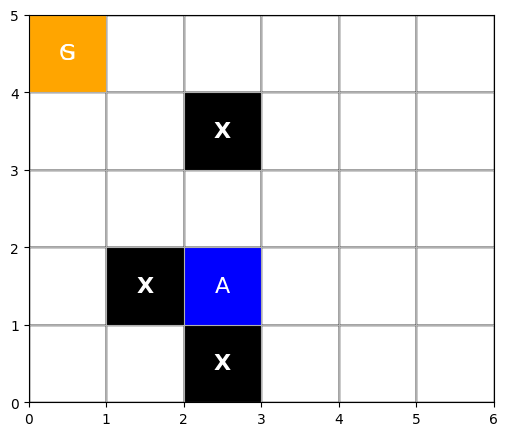

<Figure size 640x480 with 0 Axes>

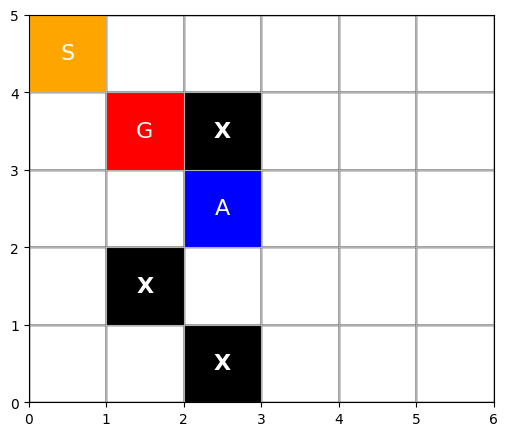

<Figure size 640x480 with 0 Axes>

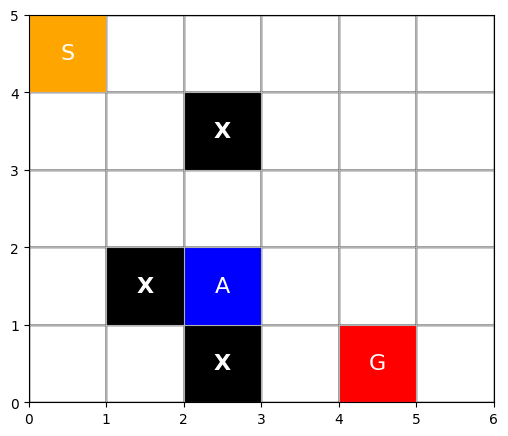

<Figure size 640x480 with 0 Axes>

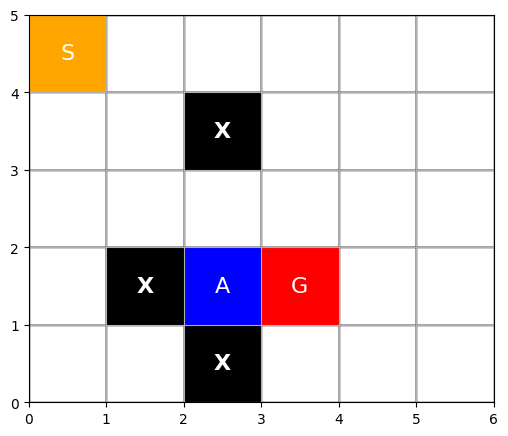

<Figure size 640x480 with 0 Axes>

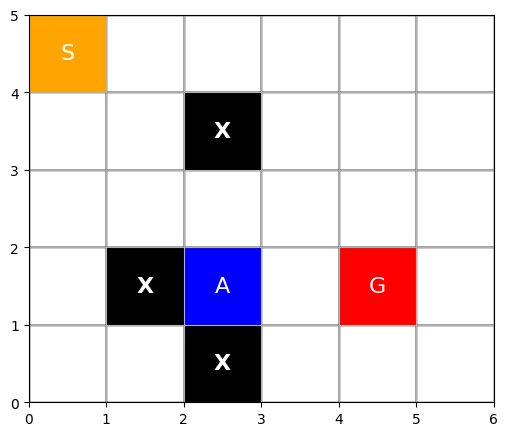

<Figure size 640x480 with 0 Axes>

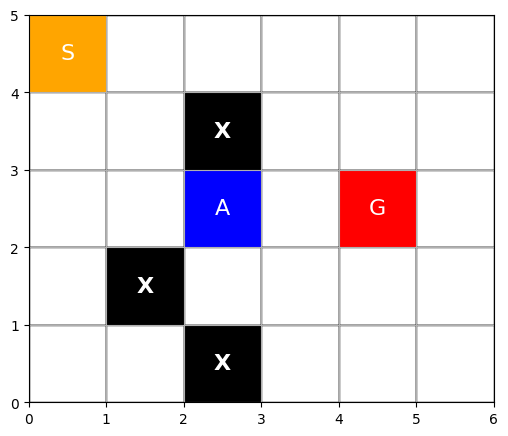

<Figure size 640x480 with 0 Axes>

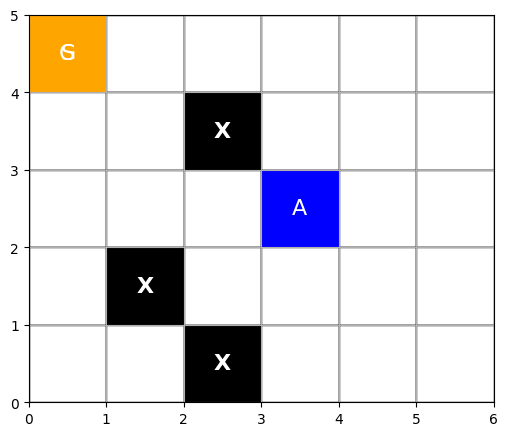

<Figure size 640x480 with 0 Axes>

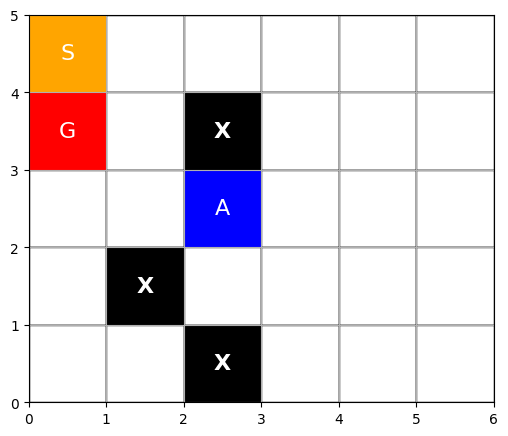

<Figure size 640x480 with 0 Axes>

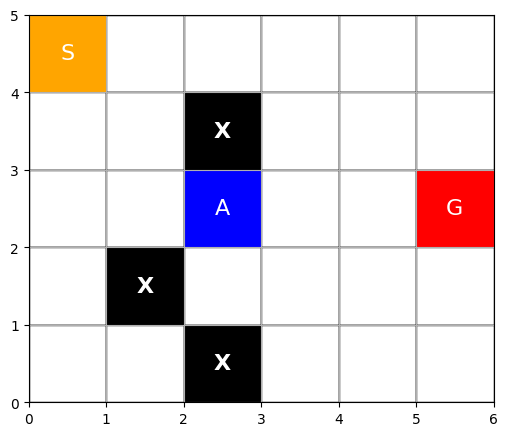

<Figure size 640x480 with 0 Axes>

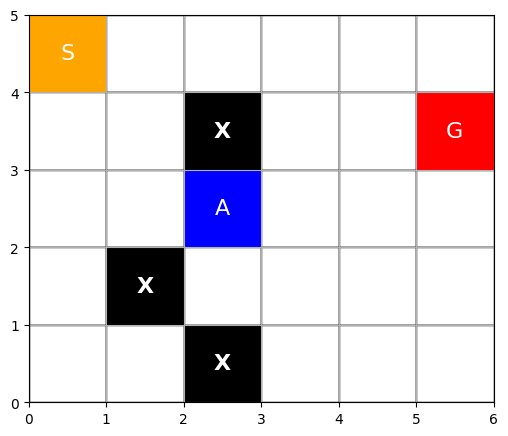

<Figure size 640x480 with 0 Axes>

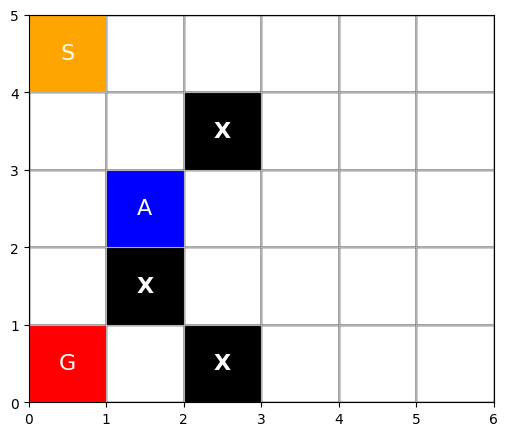

<Figure size 640x480 with 0 Axes>

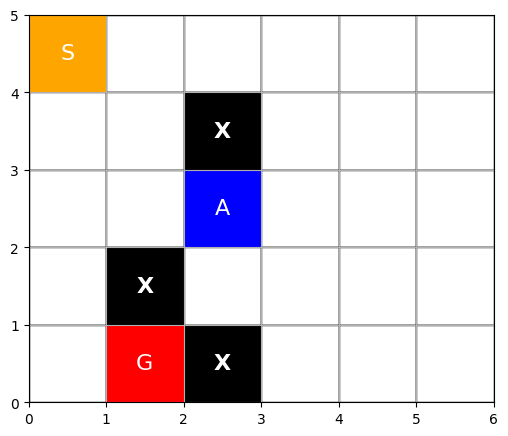

<Figure size 640x480 with 0 Axes>

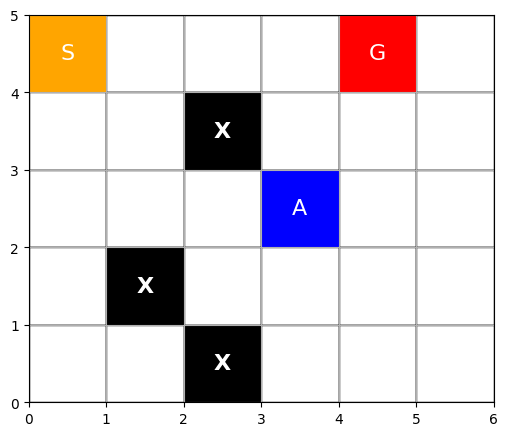

<Figure size 640x480 with 0 Axes>

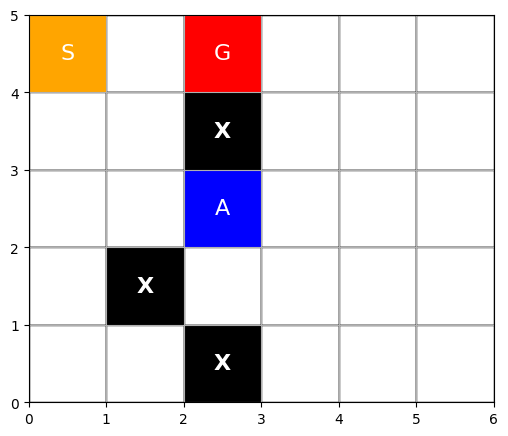

<Figure size 640x480 with 0 Axes>

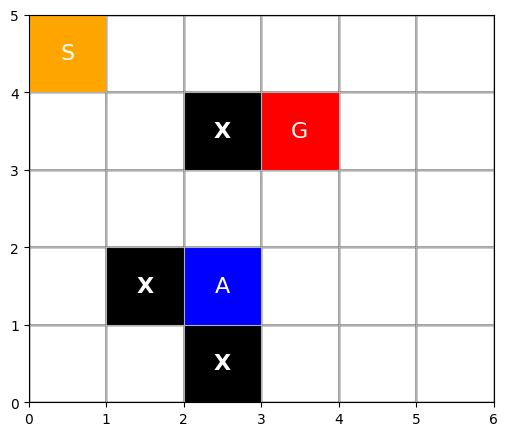

<Figure size 640x480 with 0 Axes>

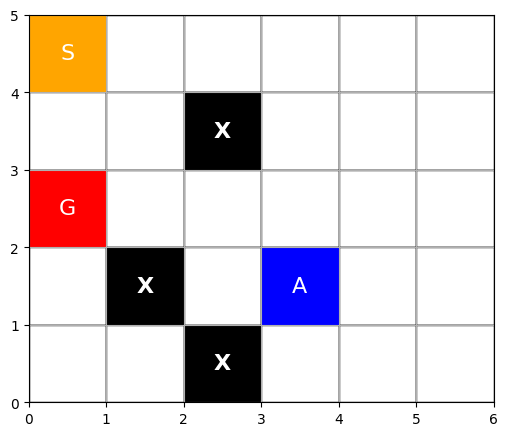

<Figure size 640x480 with 0 Axes>

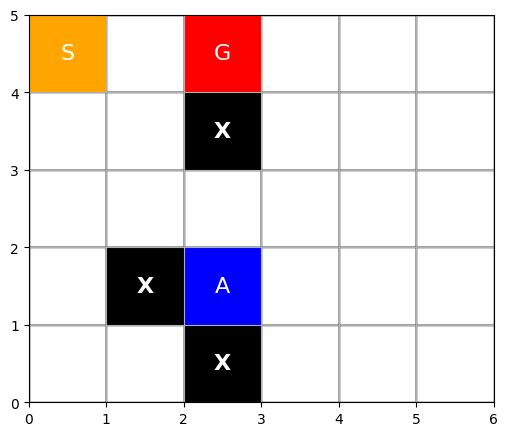

<Figure size 640x480 with 0 Axes>

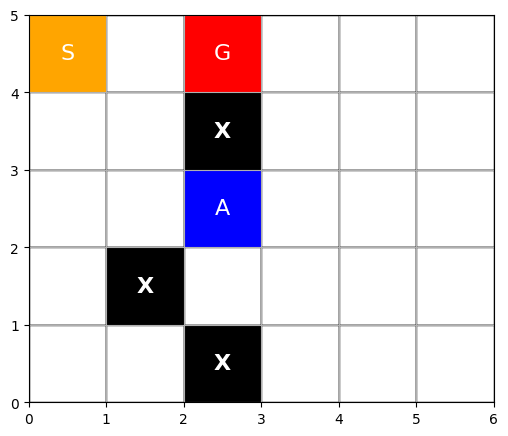

<Figure size 640x480 with 0 Axes>

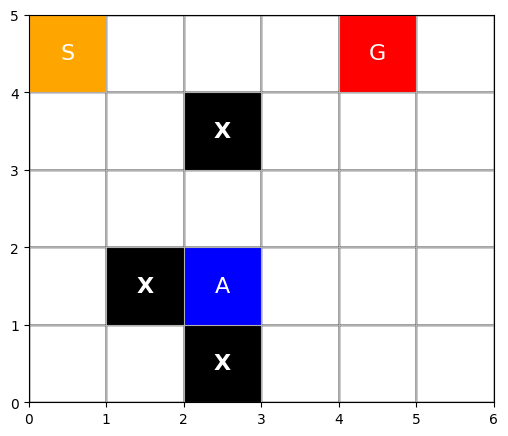

<Figure size 640x480 with 0 Axes>

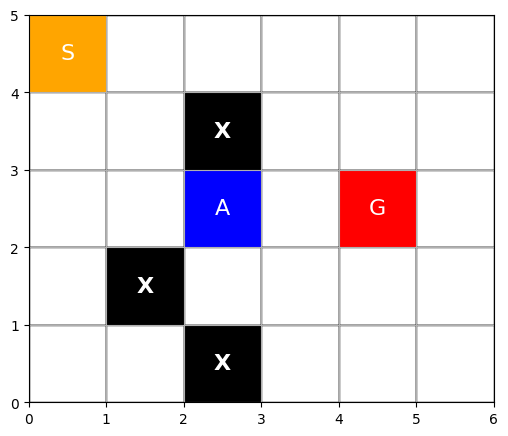

<Figure size 640x480 with 0 Axes>

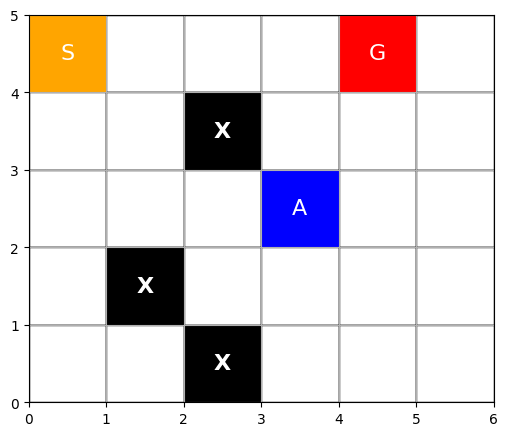

<Figure size 640x480 with 0 Axes>

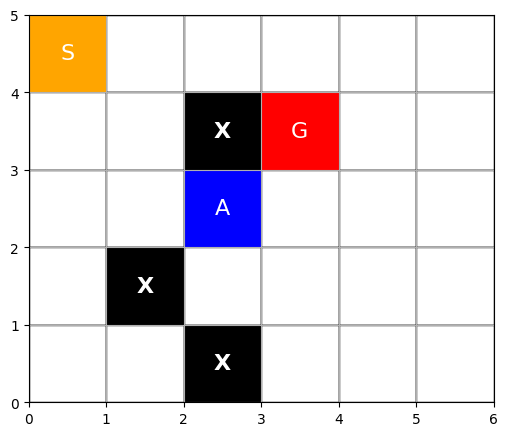

<Figure size 640x480 with 0 Axes>

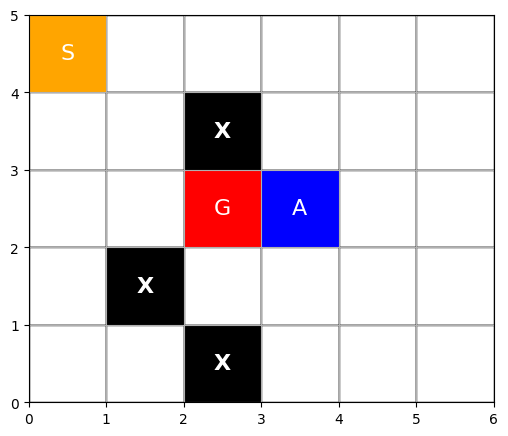

<Figure size 640x480 with 0 Axes>

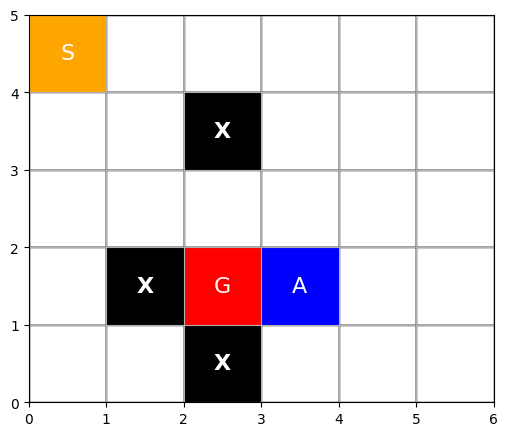

<Figure size 640x480 with 0 Axes>

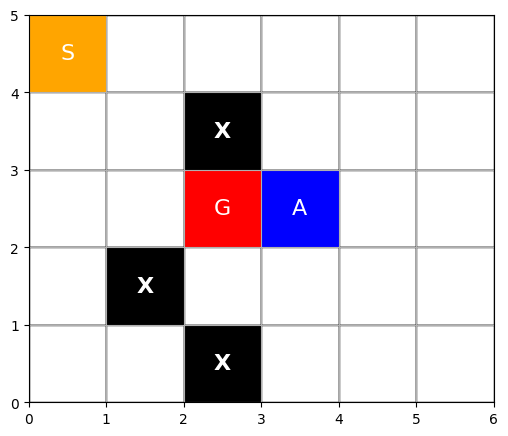

<Figure size 640x480 with 0 Axes>

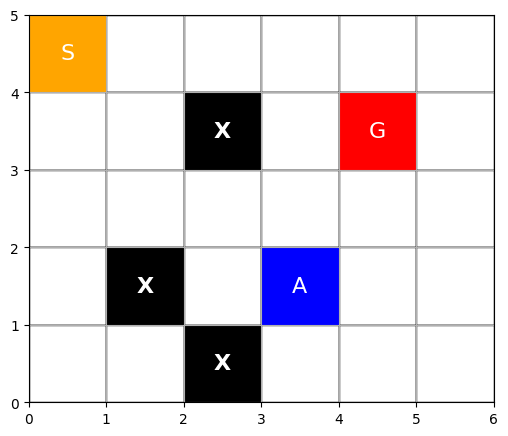

<Figure size 640x480 with 0 Axes>

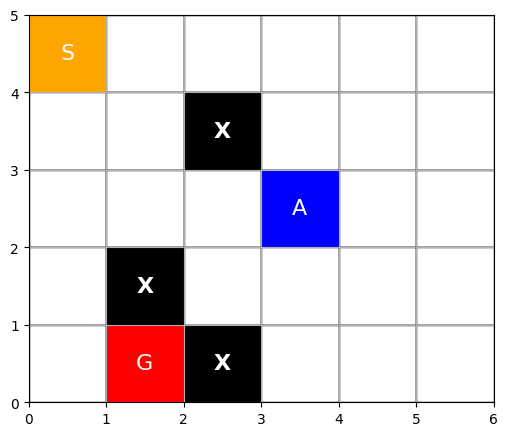

<Figure size 640x480 with 0 Axes>

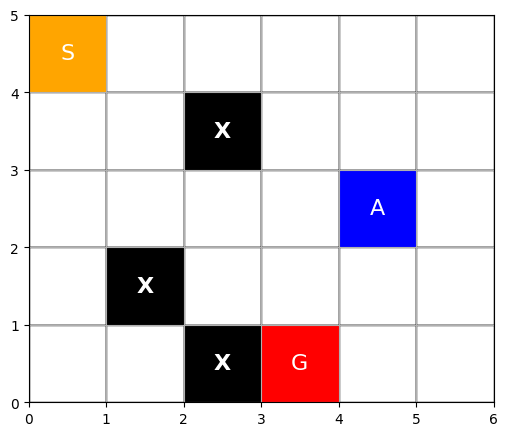

<Figure size 640x480 with 0 Axes>

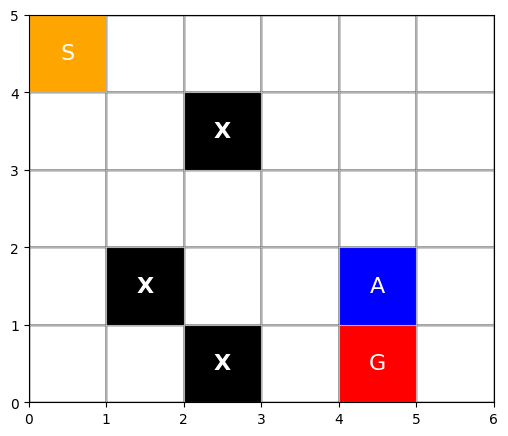

<Figure size 640x480 with 0 Axes>

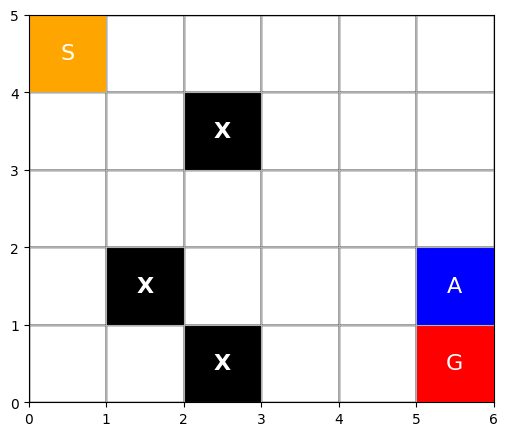

<Figure size 640x480 with 0 Axes>

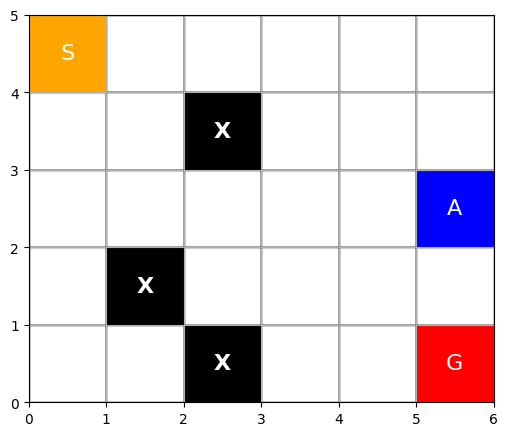

<Figure size 640x480 with 0 Axes>

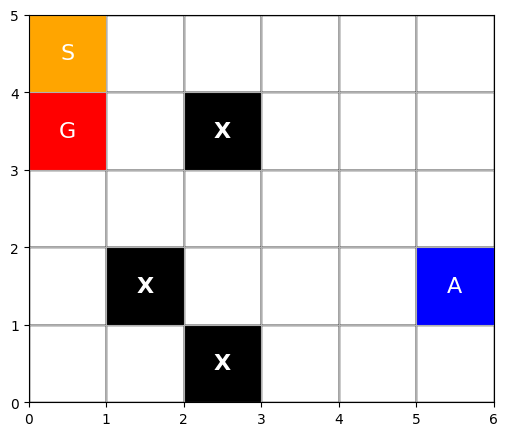

<Figure size 640x480 with 0 Axes>

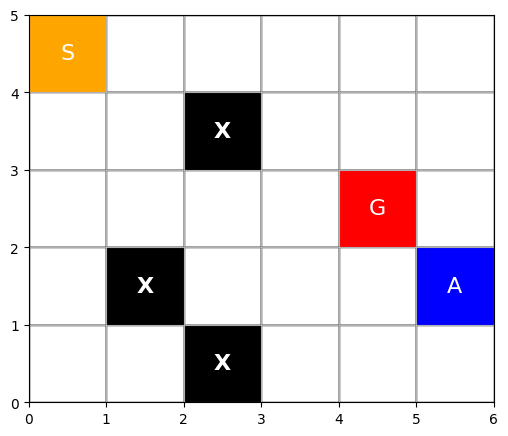

KeyboardInterrupt: 

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict

# --- Environment ---
class GridWorldMovingGoal:
    def __init__(self, size=(5,6), start=(0,0), goal=(4,5), obstacles=[(1,2), (3,1), (4,2)],
                 agent_color='blue', goal_color='red', obstacle_color='black'):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goal = goal
        self.obstacles = obstacles
        self.agent_color = agent_color
        self.goal_color = goal_color
        self.obstacle_color = obstacle_color

    def reset(self):
        self.state = self.start
        return self.state + self.goal  # state = agent + goal

    def move_goal(self):
        free_cells = [(i, j) for i in range(self.rows) for j in range(self.cols)
                      if (i, j) != self.state and (i, j) not in self.obstacles]
        self.goal = random.choice(free_cells)

    def step(self, action, move_goal=True):
        x, y = self.state
        if action == 0 and x > 0:      # up
            x -= 1
        elif action == 1 and x < self.rows - 1:  # down
            x += 1
        elif action == 2 and y > 0:    # left
            y -= 1
        elif action == 3 and y < self.cols - 1:  # right
            y += 1

        if (x, y) not in self.obstacles:
            self.state = (x, y)

        if move_goal:
            self.move_goal()

        done = (self.state == self.goal)
        reward = 1 if done else -0.01
        return self.state + self.goal, reward, done

    def render(self):
        fig, ax = plt.subplots(figsize=(6,6))
        ax.set_xlim(0, self.cols)
        ax.set_ylim(0, self.rows)
        ax.set_aspect('equal')

        # Draw grid
        for i in range(self.rows):
            for j in range(self.cols):
                rect = patches.Rectangle((j, self.rows-1-i), 1, 1,
                                         linewidth=1, edgecolor='black', facecolor='white')
                ax.add_patch(rect)

        # Draw obstacles
        for (x, y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x), 1, 1, facecolor=self.obstacle_color))
            ax.text(y+0.5, self.rows-1-x+0.5, 'X', ha='center', va='center', color='white', fontsize=16, weight='bold')

        # Draw goal
        gx, gy = self.goal
        ax.add_patch(patches.Rectangle((gy, self.rows-1-gx), 1, 1, facecolor=self.goal_color))
        ax.text(gy+0.5, self.rows-1-gx+0.5, 'G', ha='center', va='center', color='white', fontsize=16)

        # Draw start
        sx, sy = self.start
        ax.add_patch(patches.Rectangle((sy, self.rows-1-sx), 1, 1, facecolor='orange'))
        ax.text(sy+0.5, self.rows-1-sx+0.5, 'S', ha='center', va='center', color='white', fontsize=16)

        # Draw agent
        ax.add_patch(patches.Rectangle((self.state[1], self.rows-1-self.state[0]), 1, 1, facecolor=self.agent_color))
        ax.text(self.state[1]+0.5, self.rows-1-self.state[0]+0.5, 'A', ha='center', va='center', color='white', fontsize=16)

        plt.grid(True)
        plt.show(block=False)
        plt.pause(0.3)
        plt.clf()

# --- Q-learning Agent ---
class QLearningAgent:
    def __init__(self, actions=[0,1,2,3], alpha=0.1, gamma=0.9, epsilon=0.1):
        self.q_table = defaultdict(lambda: np.zeros(len(actions)))
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.actions = actions

    def choose_action(self, state):
        if random.random() < self.epsilon:
            return random.choice(self.actions)
        else:
            return int(np.argmax(self.q_table[state]))

    def learn(self, state, action, reward, next_state, done):
        predict = self.q_table[state][action]
        target = reward + self.gamma * np.max(self.q_table[next_state]) * (not done)
        self.q_table[state][action] += self.alpha * (target - predict)

# --- Training ---
env = GridWorldMovingGoal()
agent = QLearningAgent()

episodes = 200
for ep in range(episodes):
    state = env.reset()
    state = tuple(state)  # hashable
    done = False
    steps = 0
    while not done and steps < 50:
        action = agent.choose_action(state)
        next_state, reward, done = env.step(action)
        next_state = tuple(next_state)
        agent.learn(state, action, reward, next_state, done)
        state = next_state
        steps += 1

# --- Test Learned Policy ---
state = env.reset()
done = False
while not done:
    env.render()
    state = tuple(state)
    action = agent.choose_action(state)
    next_state, reward, done = env.step(action)
    state = next_state

env.render()
plt.close()


# Td(0) on policy

<Figure size 640x480 with 0 Axes>

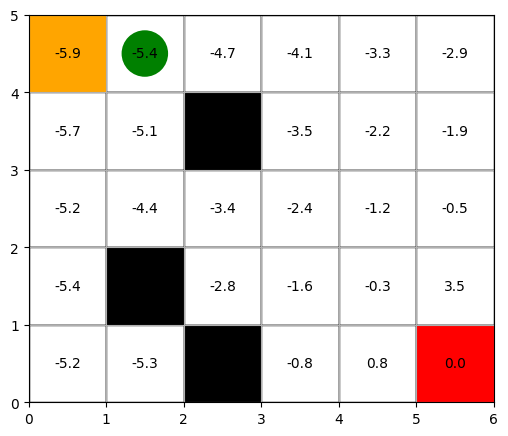

<Figure size 640x480 with 0 Axes>

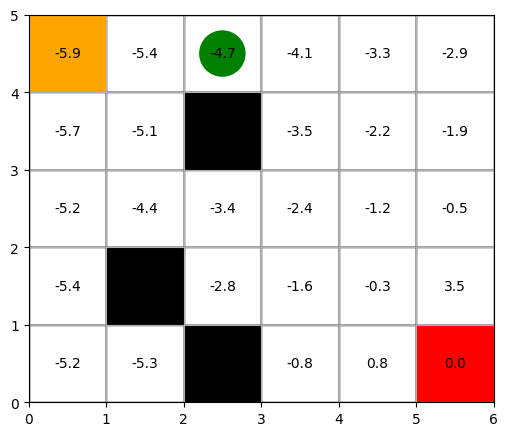

<Figure size 640x480 with 0 Axes>

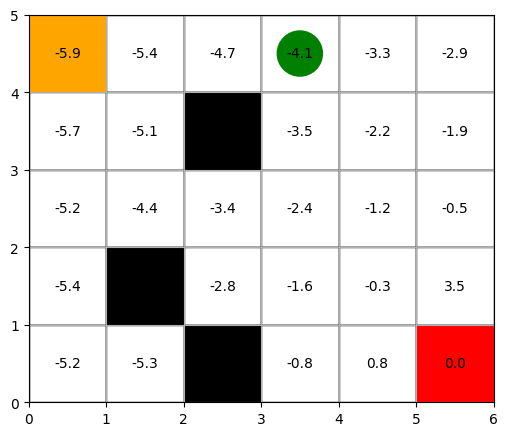

<Figure size 640x480 with 0 Axes>

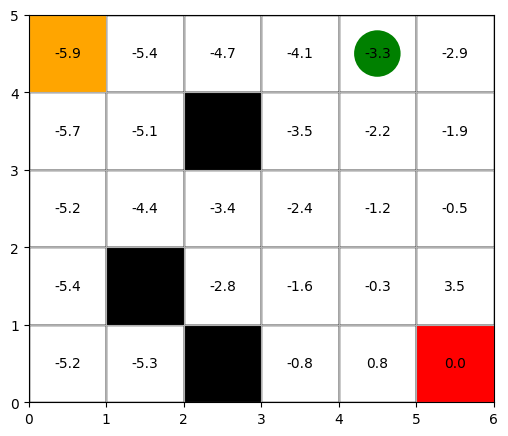

<Figure size 640x480 with 0 Axes>

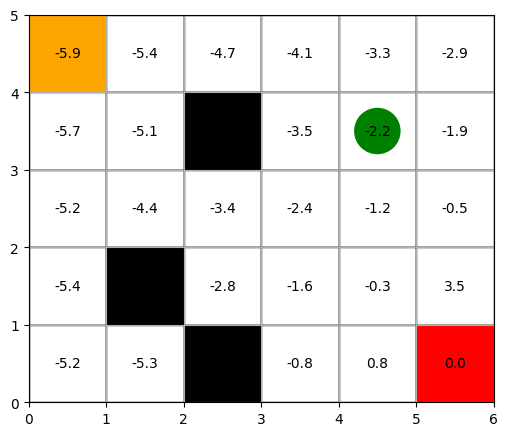

<Figure size 640x480 with 0 Axes>

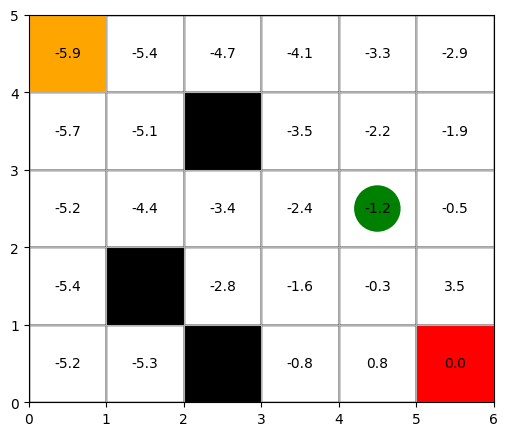

<Figure size 640x480 with 0 Axes>

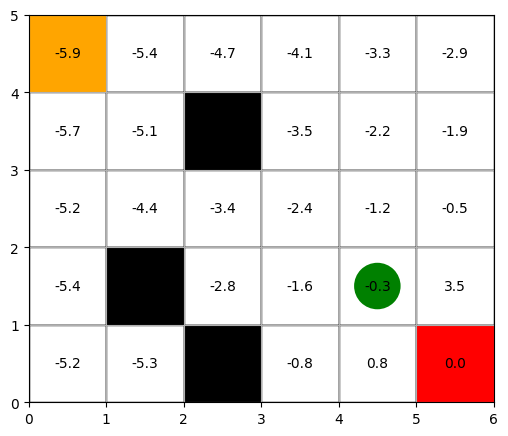

<Figure size 640x480 with 0 Axes>

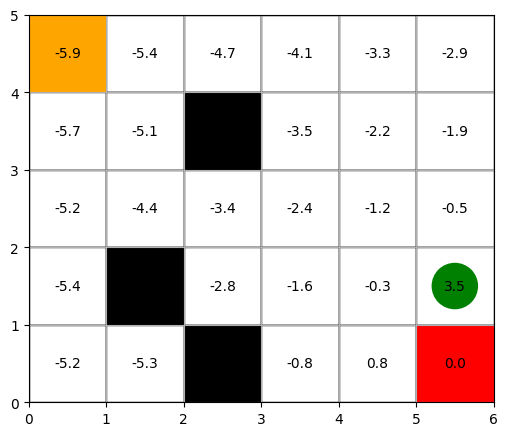

<Figure size 640x480 with 0 Axes>

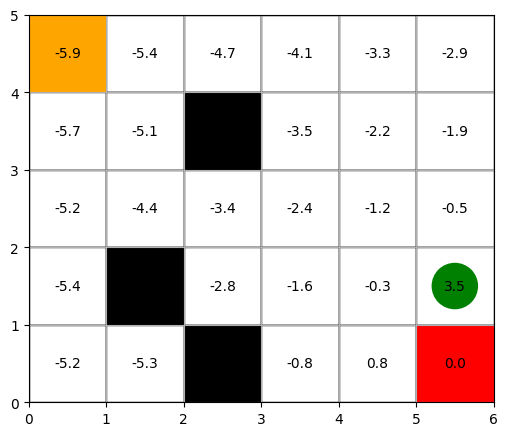

<Figure size 640x480 with 0 Axes>

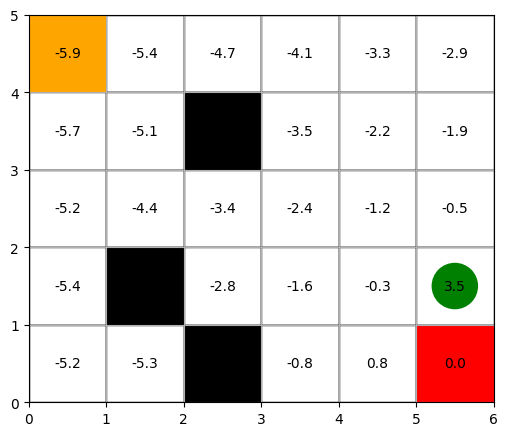

<Figure size 640x480 with 0 Axes>

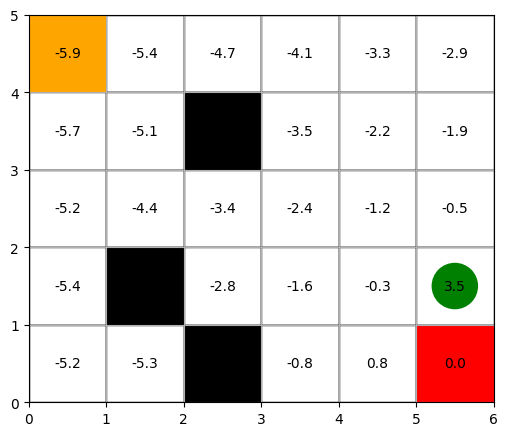

<Figure size 640x480 with 0 Axes>

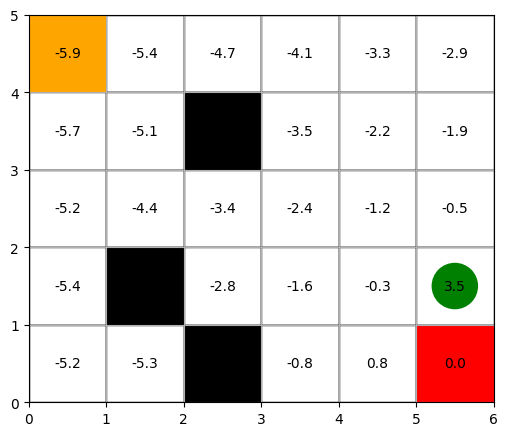

<Figure size 640x480 with 0 Axes>

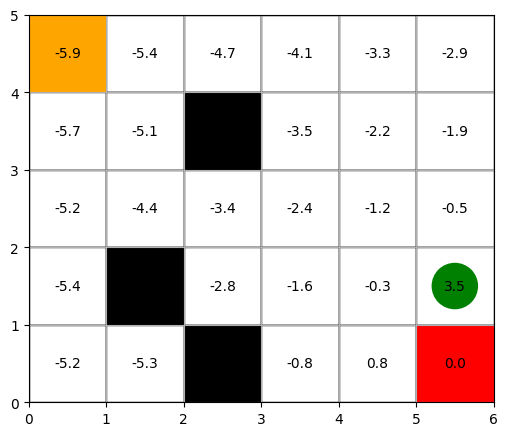

<Figure size 640x480 with 0 Axes>

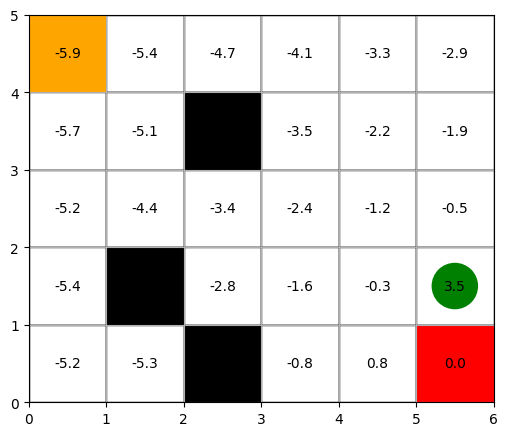

<Figure size 640x480 with 0 Axes>

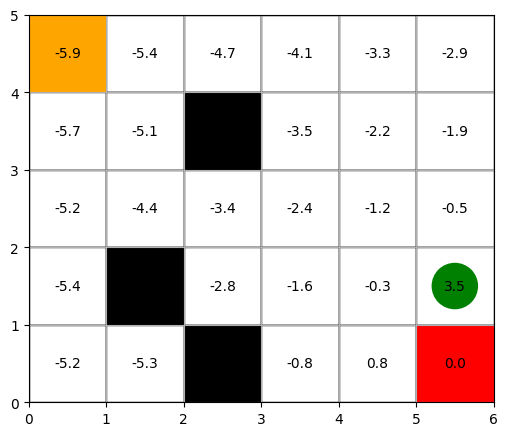

<Figure size 640x480 with 0 Axes>

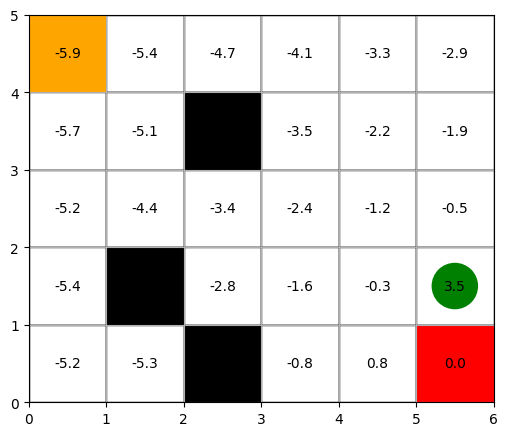

<Figure size 640x480 with 0 Axes>

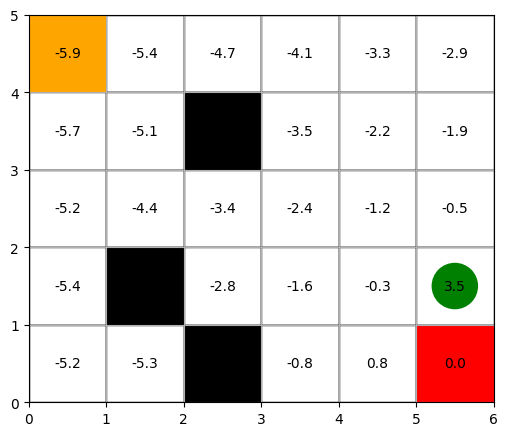

<Figure size 640x480 with 0 Axes>

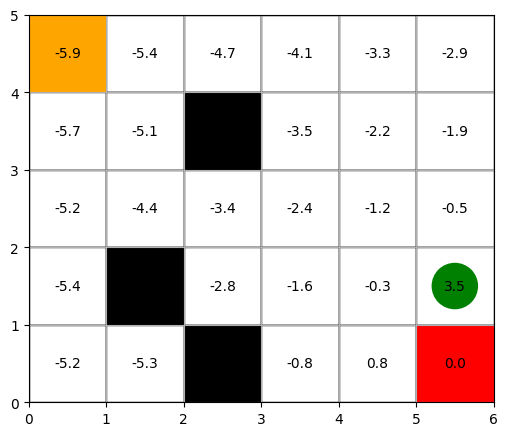

<Figure size 640x480 with 0 Axes>

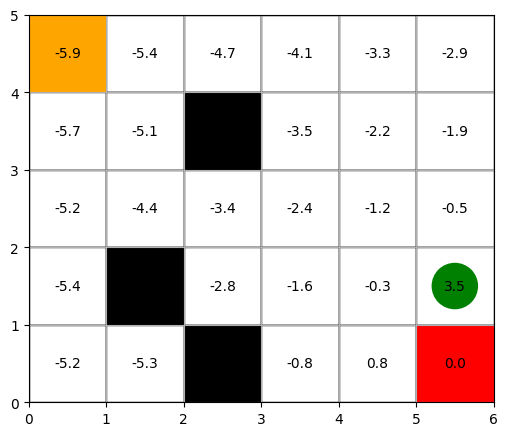

<Figure size 640x480 with 0 Axes>

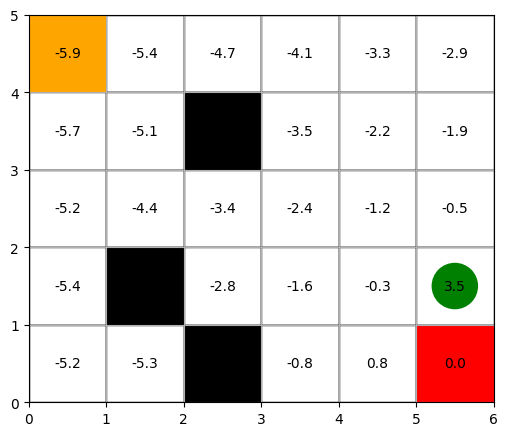

<Figure size 640x480 with 0 Axes>

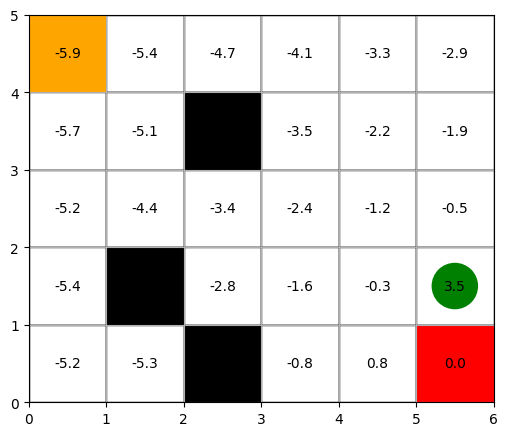

<Figure size 640x480 with 0 Axes>

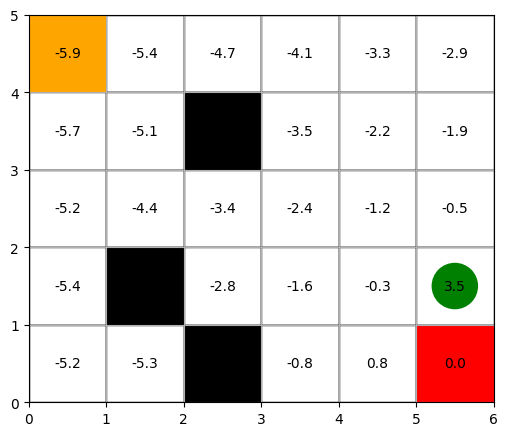

<Figure size 640x480 with 0 Axes>

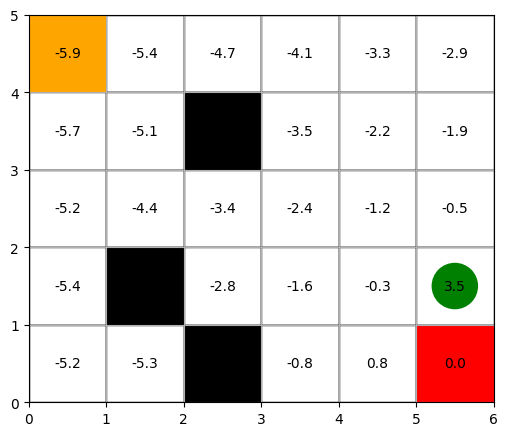

<Figure size 640x480 with 0 Axes>

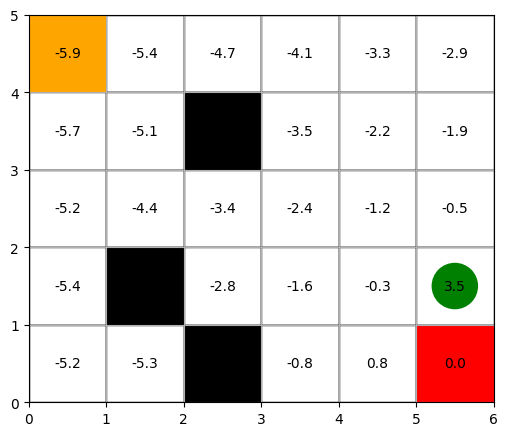

<Figure size 640x480 with 0 Axes>

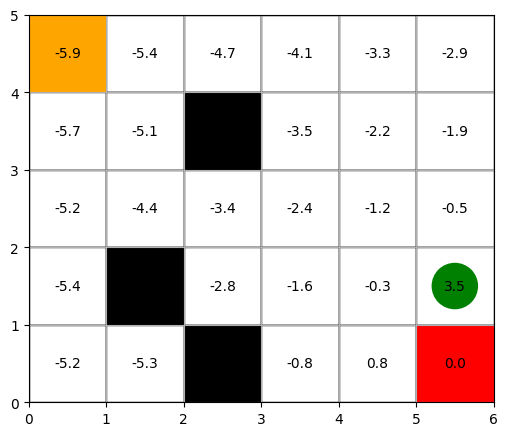

<Figure size 640x480 with 0 Axes>

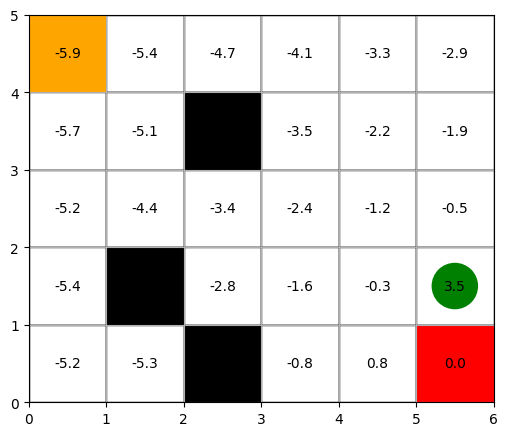

<Figure size 640x480 with 0 Axes>

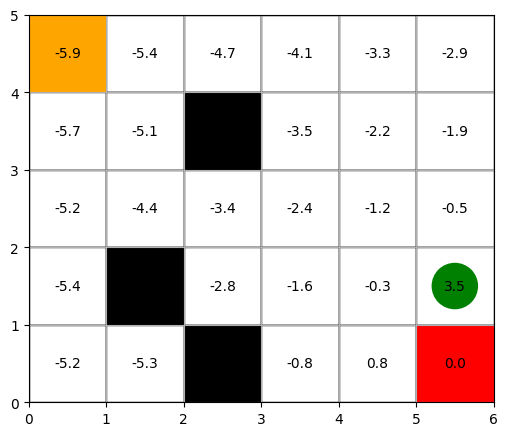

<Figure size 640x480 with 0 Axes>

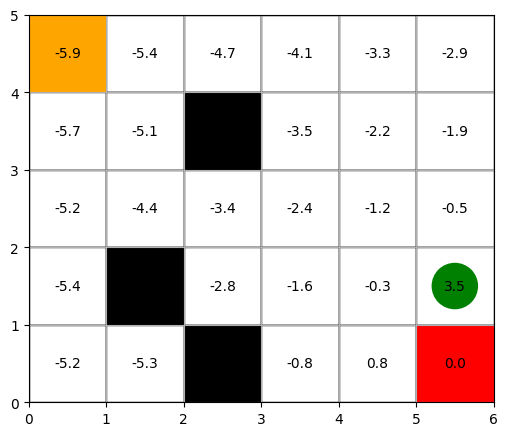

<Figure size 640x480 with 0 Axes>

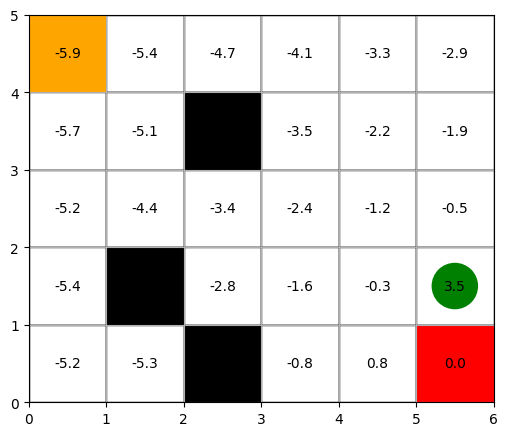

<Figure size 640x480 with 0 Axes>

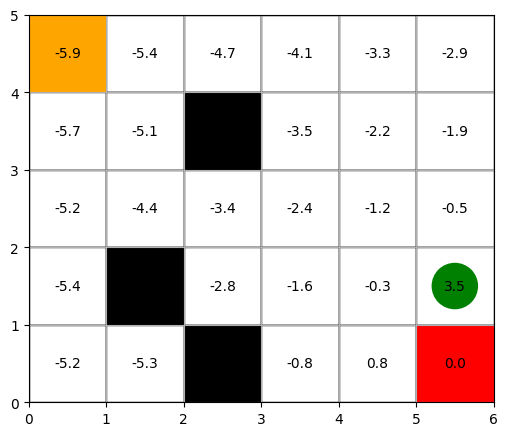

<Figure size 640x480 with 0 Axes>

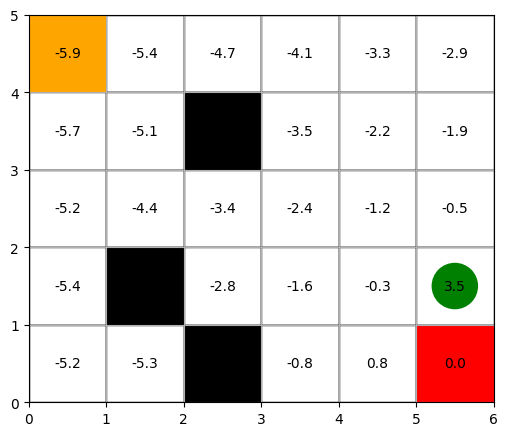

<Figure size 640x480 with 0 Axes>

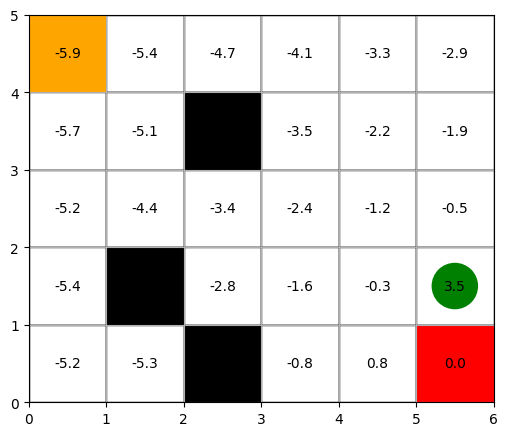

<Figure size 640x480 with 0 Axes>

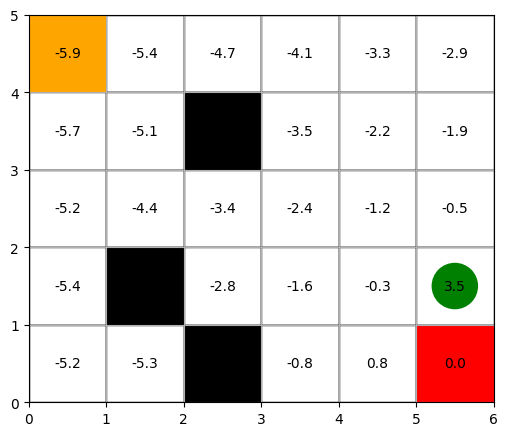

<Figure size 640x480 with 0 Axes>

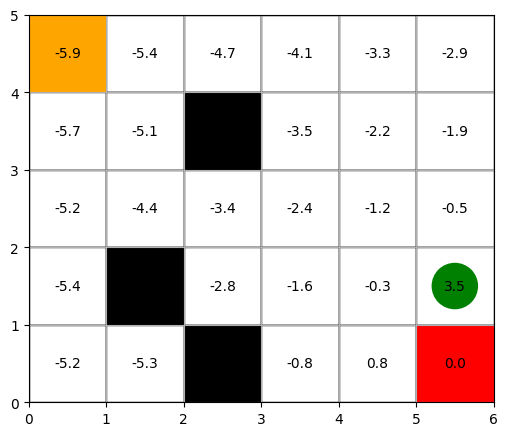

<Figure size 640x480 with 0 Axes>

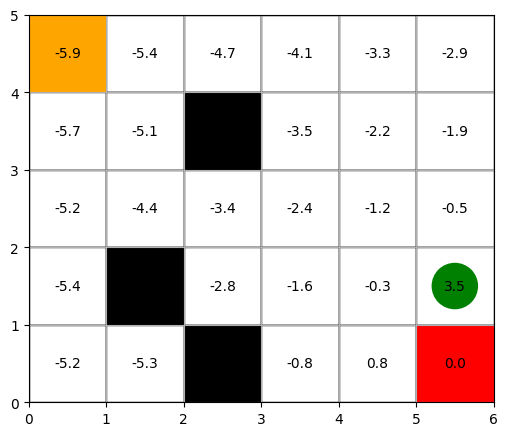

<Figure size 640x480 with 0 Axes>

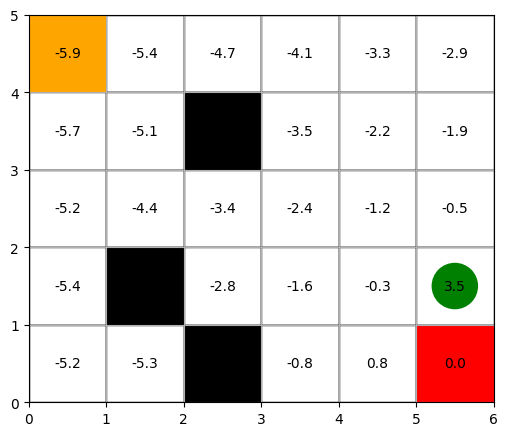

<Figure size 640x480 with 0 Axes>

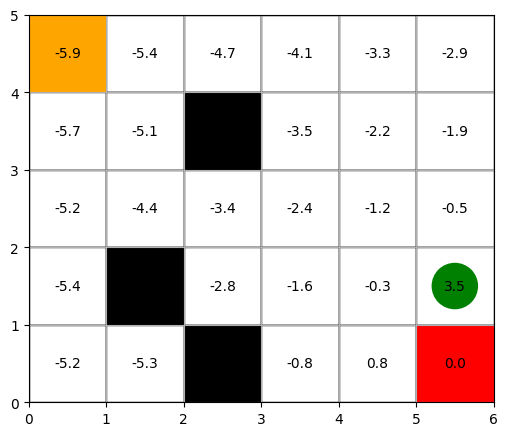

<Figure size 640x480 with 0 Axes>

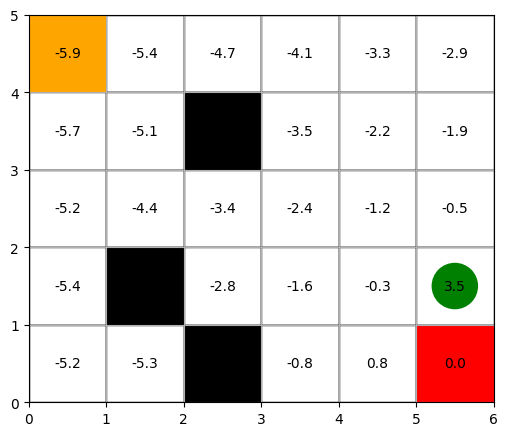

<Figure size 640x480 with 0 Axes>

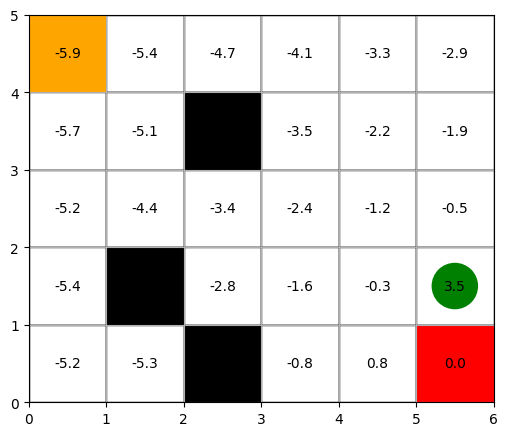

<Figure size 640x480 with 0 Axes>

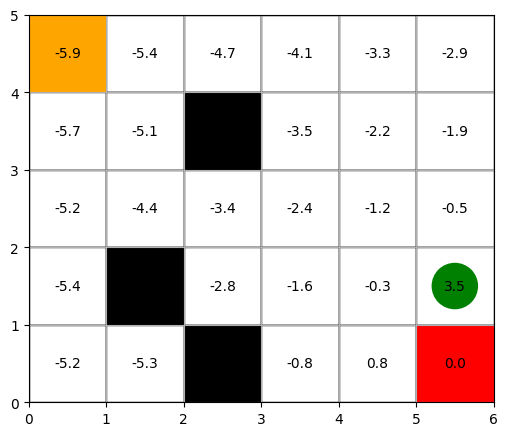

<Figure size 640x480 with 0 Axes>

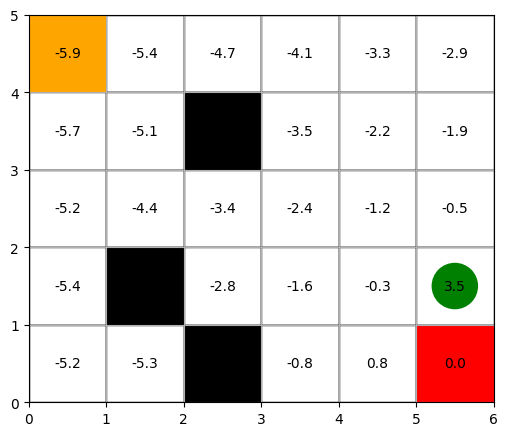

<Figure size 640x480 with 0 Axes>

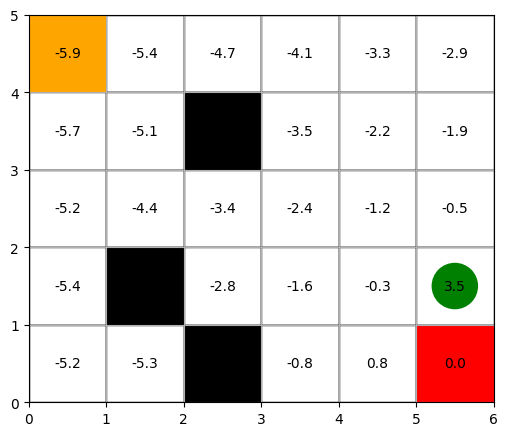

<Figure size 640x480 with 0 Axes>

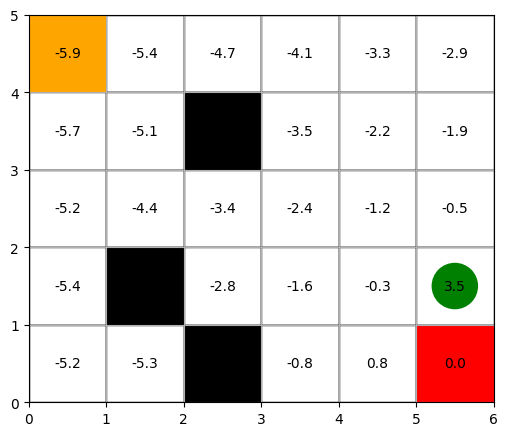

<Figure size 640x480 with 0 Axes>

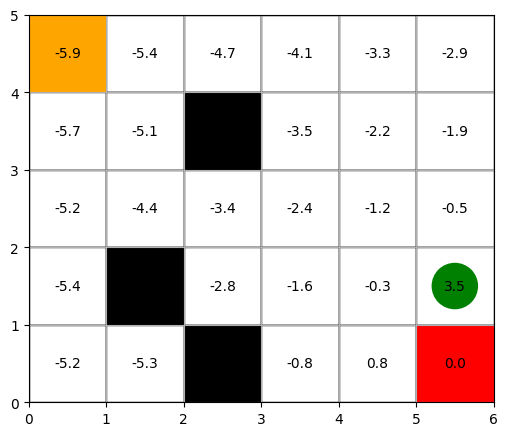

<Figure size 640x480 with 0 Axes>

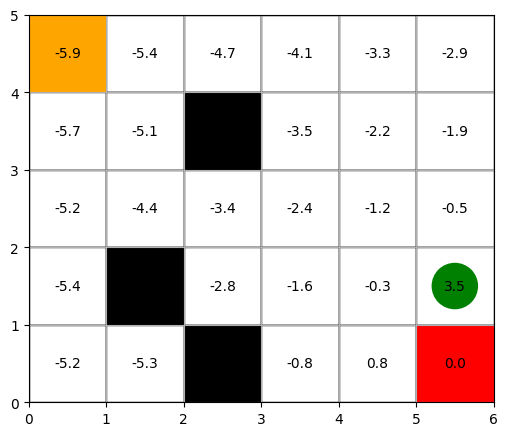

<Figure size 640x480 with 0 Axes>

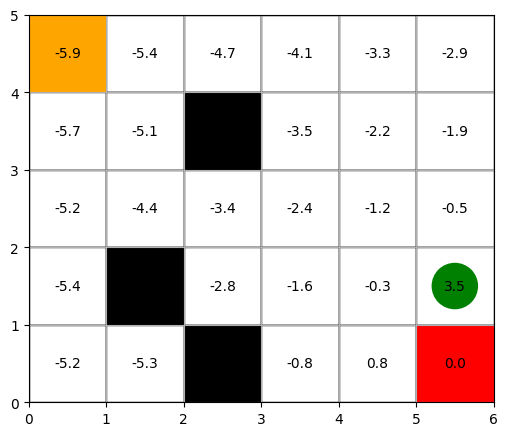

<Figure size 640x480 with 0 Axes>

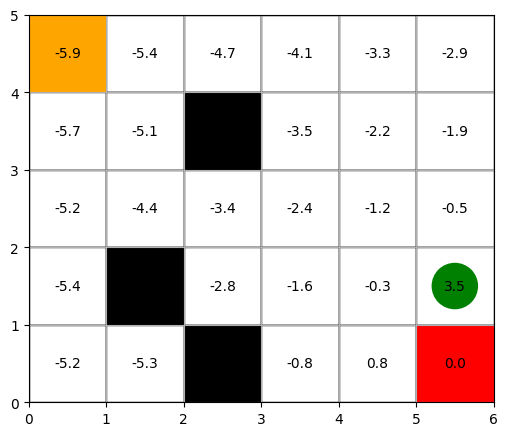

<Figure size 640x480 with 0 Axes>

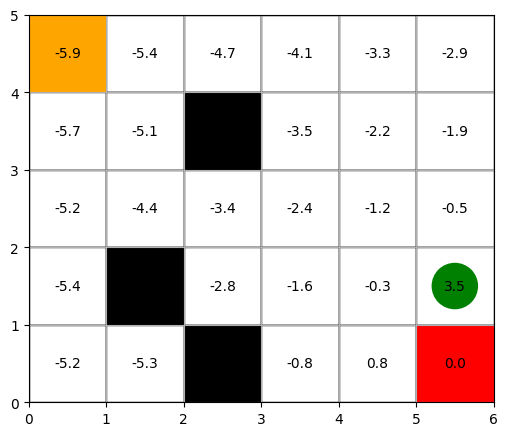

<Figure size 640x480 with 0 Axes>

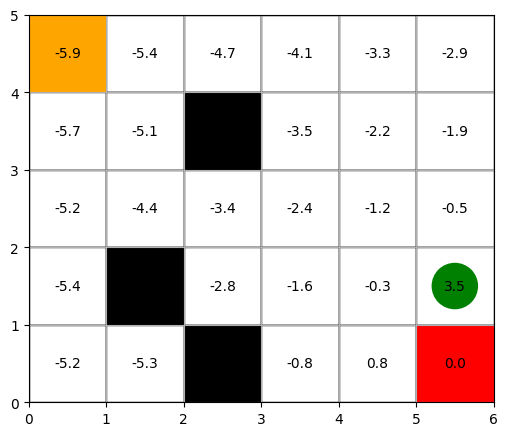

<Figure size 640x480 with 0 Axes>

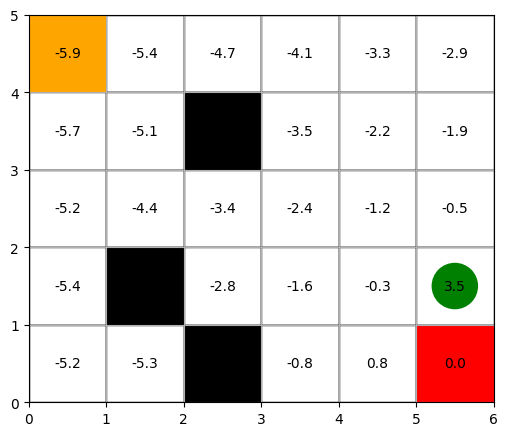

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import time

# --- GridWorld simple ---
class GridWorld:
    def __init__(self, size=(5,6), start=(0,0), goal=(4,5), obstacles=[]):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goal = goal
        self.obstacles = obstacles
        self.actions = ['up', 'down', 'left', 'right']

    def reset(self):
        self.state = self.start
        return self.state

    def step(self, action):
        x, y = self.state
        if action == 'up':
            x = max(0, x-1)
        elif action == 'down':
            x = min(self.rows-1, x+1)
        elif action == 'left':
            y = max(0, y-1)
        elif action == 'right':
            y = min(self.cols-1, y+1)

        next_state = (x, y)

        if next_state in self.obstacles:
            next_state = self.state

        self.state = next_state

        reward = 10 if self.state == self.goal else -1
        done = self.state == self.goal
        return self.state, reward, done

    def render_frame(self, agent_pos, V=None):
        plt.clf()
        fig, ax = plt.subplots(figsize=(6,6))
        for i in range(self.rows):
            for j in range(self.cols):
                ax.add_patch(patches.Rectangle((j, self.rows-1-i),1,1,edgecolor='black',facecolor='white'))

        for (x,y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y, self.rows-1-x),1,1,facecolor='black'))

        gx, gy = self.goal
        ax.add_patch(patches.Rectangle((gy, self.rows-1-gx),1,1,facecolor='red'))

        sx, sy = self.start
        ax.add_patch(patches.Rectangle((sy, self.rows-1-sx),1,1,facecolor='orange'))

        if V is not None:
            for i in range(self.rows):
                for j in range(self.cols):
                    ax.text(j+0.5, self.rows-1-i+0.5, f"{V.get((i,j),0):.1f}", ha='center', va='center', fontsize=10)

        # agent
        ax.add_patch(patches.Circle((agent_pos[1]+0.5, self.rows-1-agent_pos[0]+0.5),0.3,facecolor='green'))

        ax.set_xlim(0, self.cols)
        ax.set_ylim(0, self.rows)
        ax.set_aspect('equal')
        plt.grid(True)
        plt.pause(0.2)
        plt.close(fig)

# --- TD(0) on-policy ---
def td0(env, episodes=500, alpha=0.1, gamma=0.9, epsilon=0.2):
    V = {}  # valeur d'état
    for i in range(env.rows):
        for j in range(env.cols):
            V[(i,j)] = 0

    for ep in range(episodes):
        state = env.reset()
        done = False
        while not done:
            # Politique ε-greedy sur la valeur d'état (vraiment simple ici)
            if np.random.rand() < epsilon:
                action = np.random.choice(env.actions)
            else:
                # choisir l'action qui mène à l'état avec la plus grande valeur
                next_values = []
                for a in env.actions:
                    x, y = state
                    if a == 'up':
                        x_ = max(0, x-1)
                        y_ = y
                    elif a == 'down':
                        x_ = min(env.rows-1, x+1)
                        y_ = y
                    elif a == 'left':
                        x_ = x
                        y_ = max(0, y-1)
                    elif a == 'right':
                        x_ = x
                        y_ = min(env.cols-1, y+1)
                    if (x_,y_) in env.obstacles:
                        x_,y_ = state
                    next_values.append(V[(x_,y_)])
                action = env.actions[np.argmax(next_values)]

            next_state, reward, done = env.step(action)
            V[state] = V[state] + alpha * (reward + gamma * V[next_state] - V[state])
            state = next_state

    return V

# --- Visualiser le chemin final selon V ---
def animate_policy(env, V):
    state = env.reset()
    done = False
    path = [state]
    steps = 0
    while not done and steps < 50:
        next_values = []
        for a in env.actions:
            x, y = state
            if a == 'up':
                x_ = max(0, x-1)
                y_ = y
            elif a == 'down':
                x_ = min(env.rows-1, x+1)
                y_ = y
            elif a == 'left':
                x_ = x
                y_ = max(0, y-1)
            elif a == 'right':
                x_ = x
                y_ = min(env.cols-1, y+1)
            if (x_,y_) in env.obstacles:
                x_,y_ = state
            next_values.append(V[(x_,y_)])
        action = env.actions[np.argmax(next_values)]
        state, _, done = env.step(action)
        path.append(state)
        env.render_frame(state, V)
        steps += 1

# --- Exemple ---
env = GridWorld(
    size=(5,6),
    start=(0,0),
    goal=(4,5),
    obstacles=[(1,2),(3,1),(4,2)]
)

V = td0(env, episodes=800, alpha=0.1, gamma=0.9, epsilon=0.2)
animate_policy(env, V)


# dynamic goal

<Figure size 600x400 with 0 Axes>

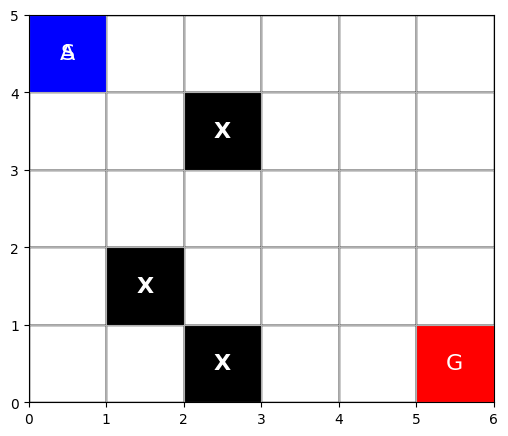

<Figure size 640x480 with 0 Axes>

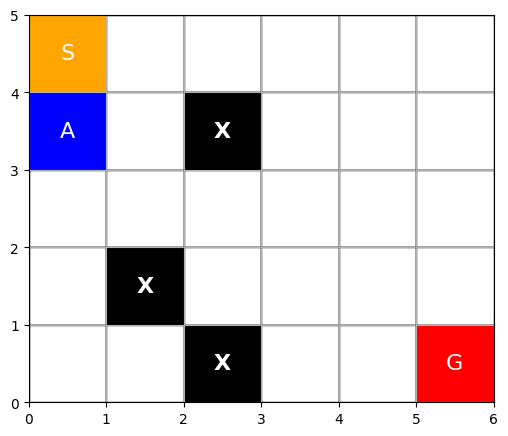

<Figure size 640x480 with 0 Axes>

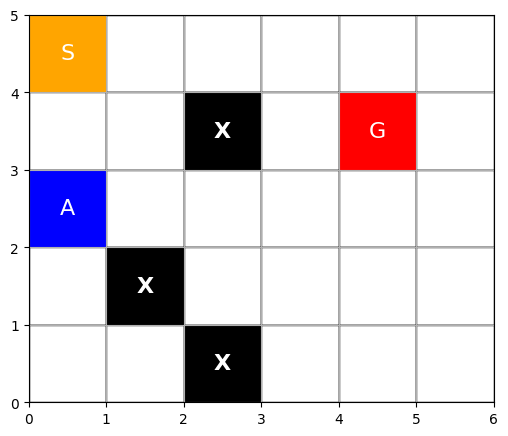

<Figure size 640x480 with 0 Axes>

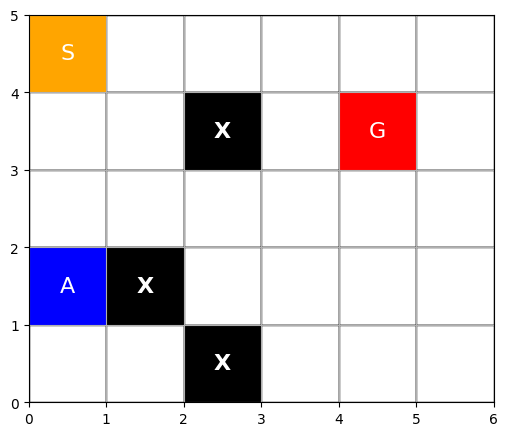

<Figure size 640x480 with 0 Axes>

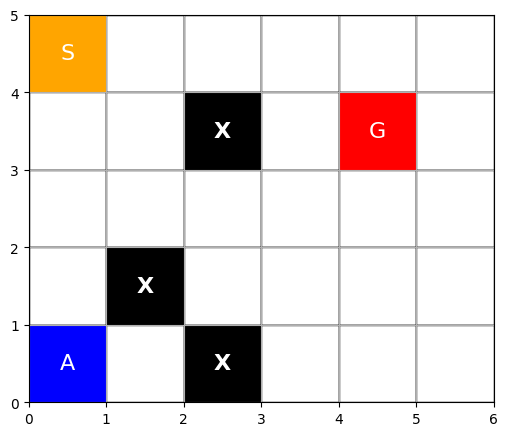

<Figure size 640x480 with 0 Axes>

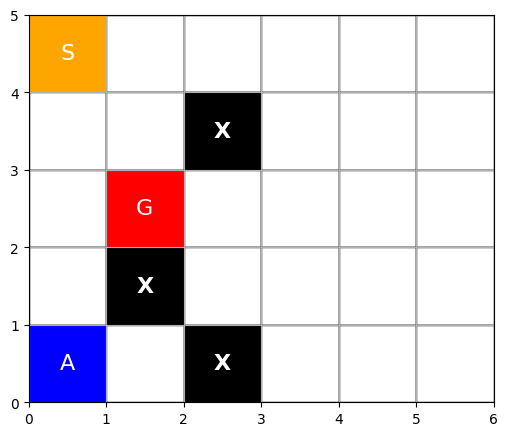

<Figure size 640x480 with 0 Axes>

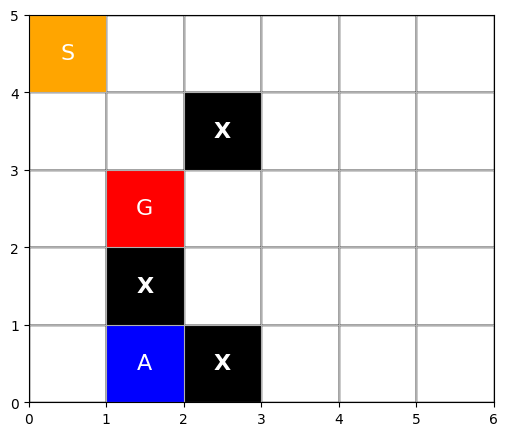

<Figure size 640x480 with 0 Axes>

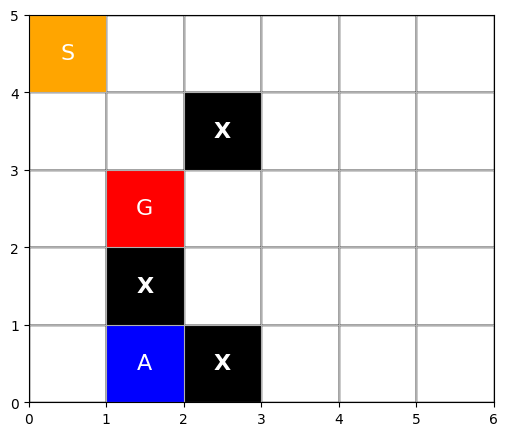

<Figure size 640x480 with 0 Axes>

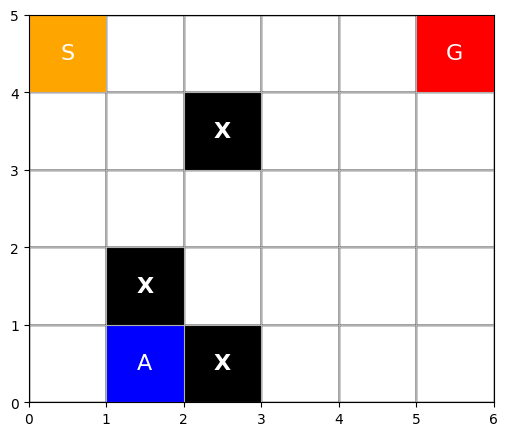

<Figure size 640x480 with 0 Axes>

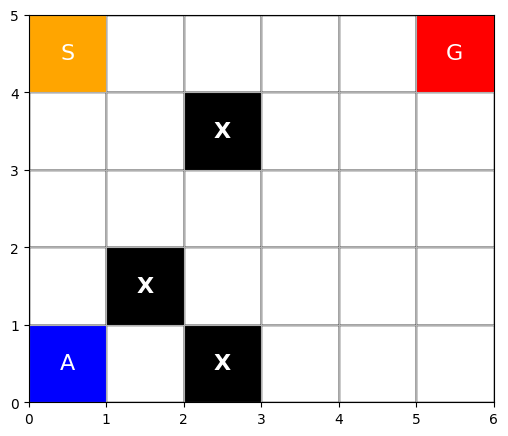

<Figure size 640x480 with 0 Axes>

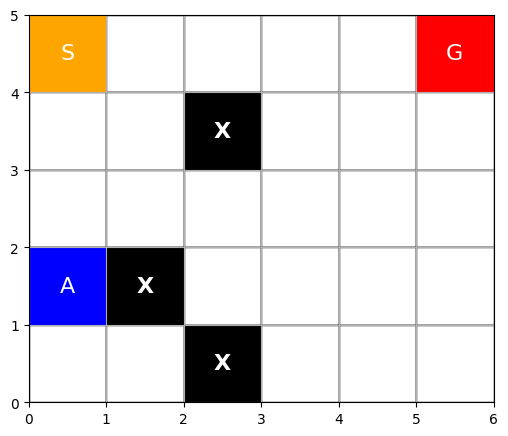

<Figure size 640x480 with 0 Axes>

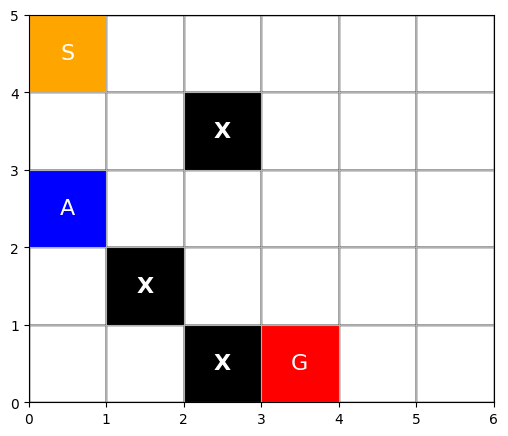

<Figure size 640x480 with 0 Axes>

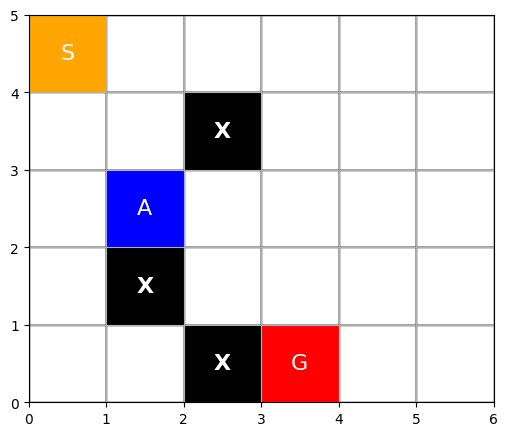

<Figure size 640x480 with 0 Axes>

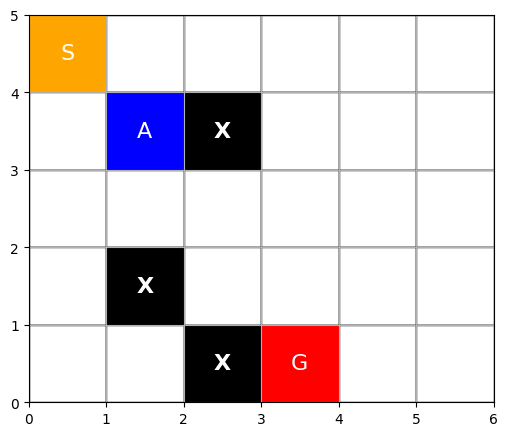

<Figure size 640x480 with 0 Axes>

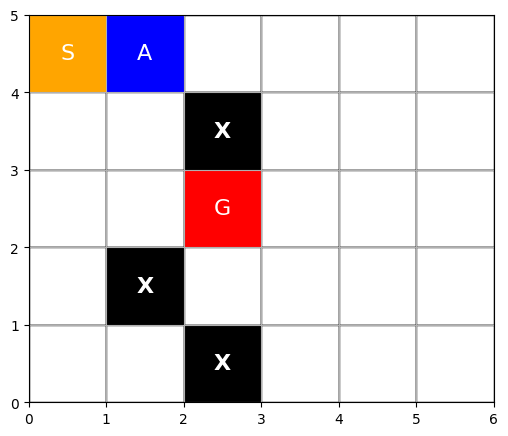

<Figure size 640x480 with 0 Axes>

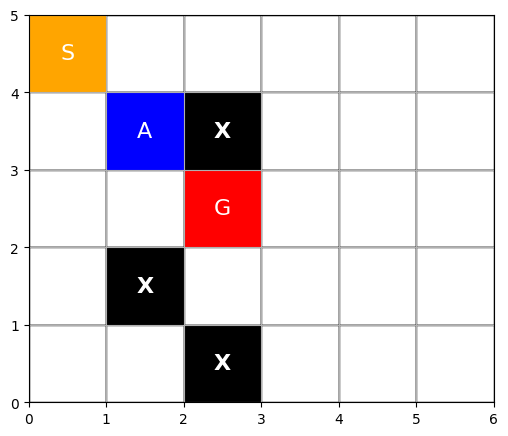

<Figure size 640x480 with 0 Axes>

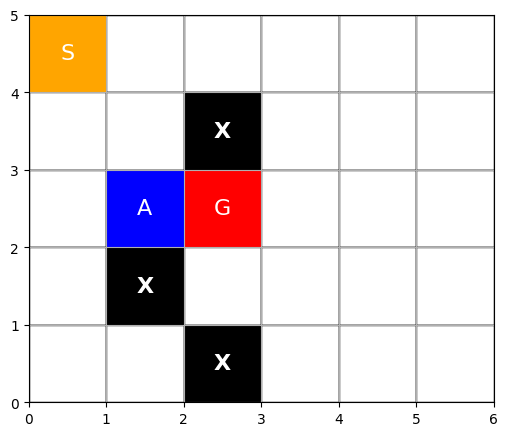

<Figure size 640x480 with 0 Axes>

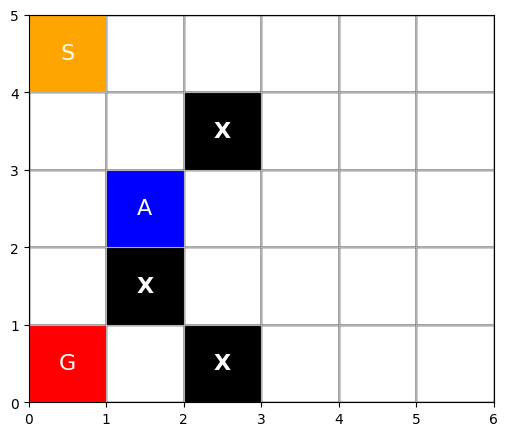

<Figure size 640x480 with 0 Axes>

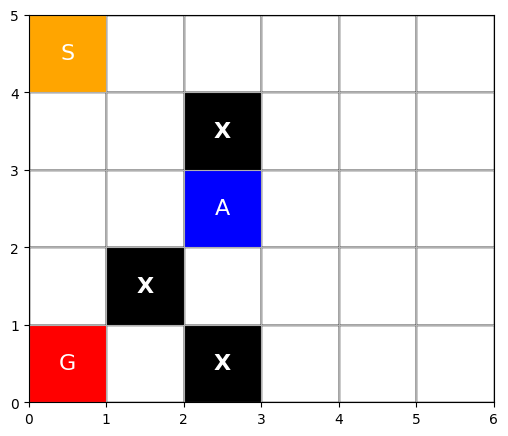

<Figure size 640x480 with 0 Axes>

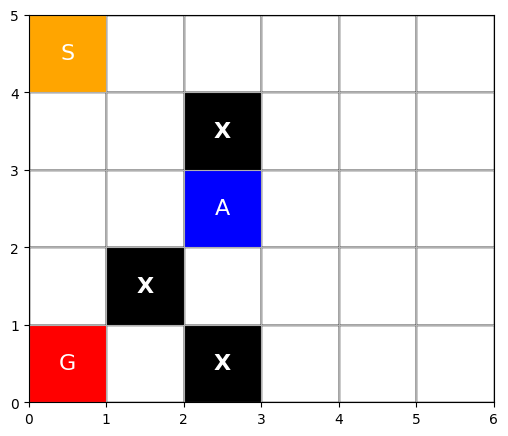

<Figure size 640x480 with 0 Axes>

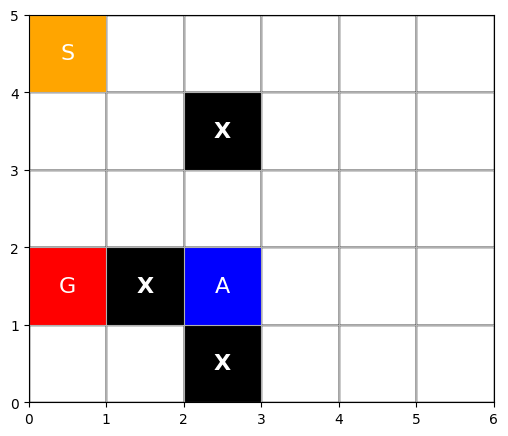

<Figure size 640x480 with 0 Axes>

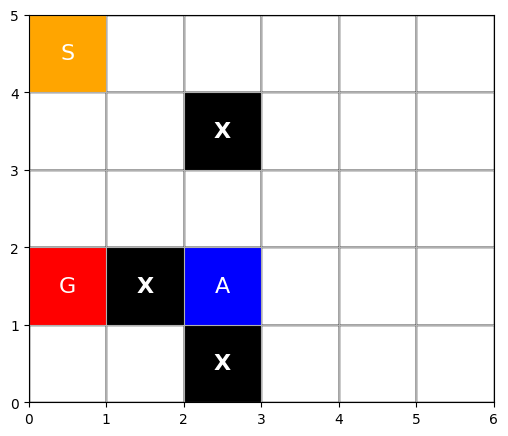

<Figure size 640x480 with 0 Axes>

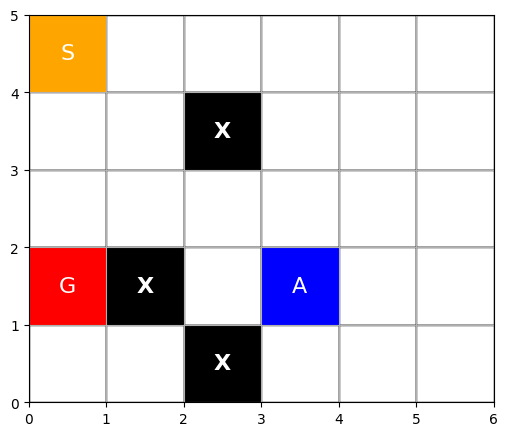

<Figure size 640x480 with 0 Axes>

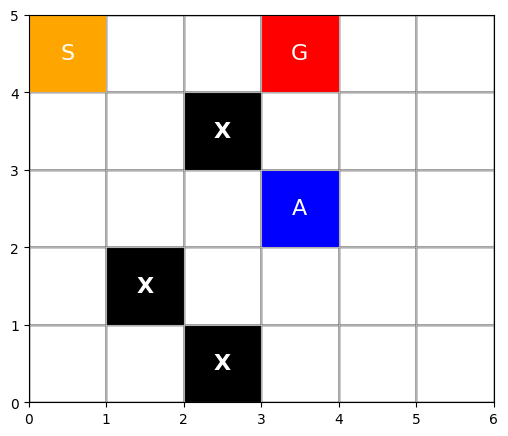

<Figure size 640x480 with 0 Axes>

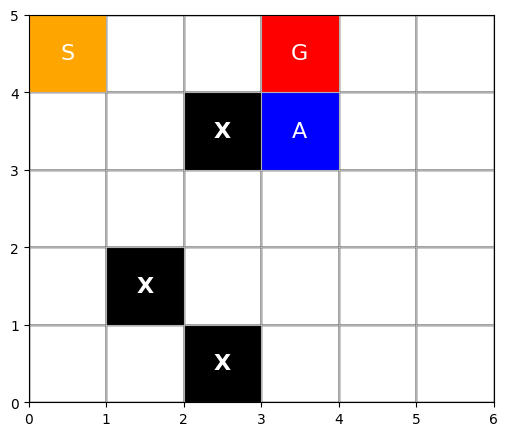

<Figure size 640x480 with 0 Axes>

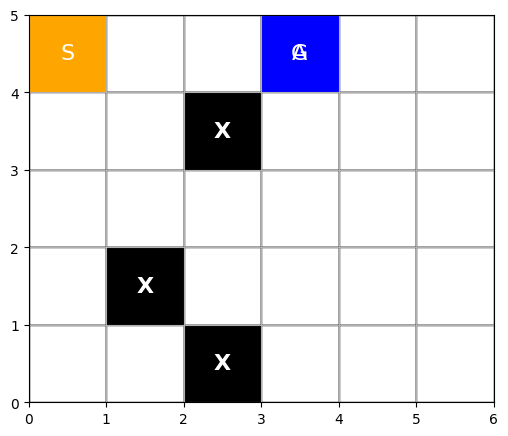

<Figure size 640x480 with 0 Axes>

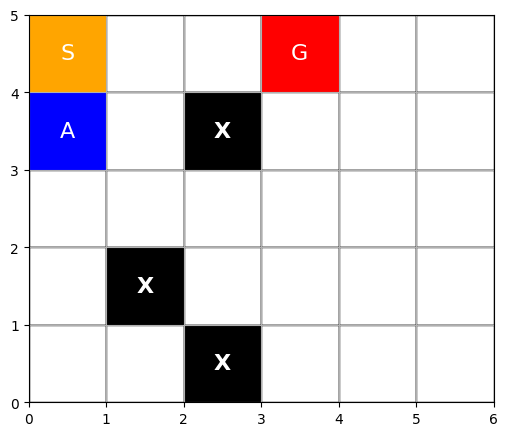

<Figure size 640x480 with 0 Axes>

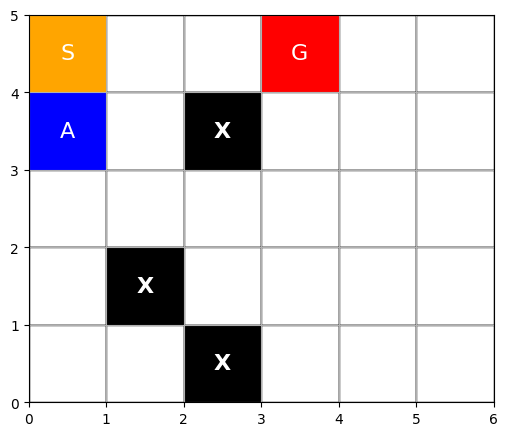

<Figure size 640x480 with 0 Axes>

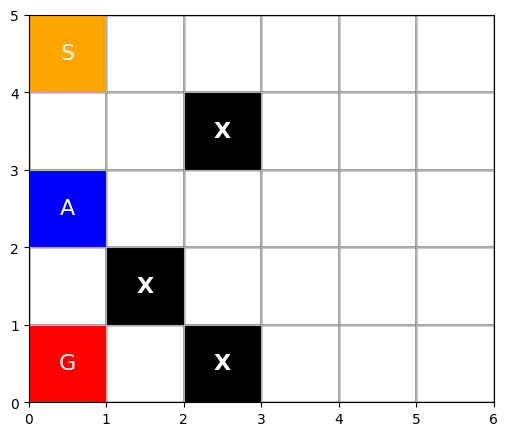

<Figure size 640x480 with 0 Axes>

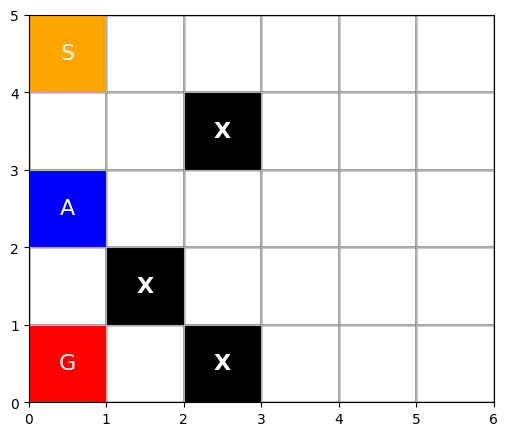

<Figure size 640x480 with 0 Axes>

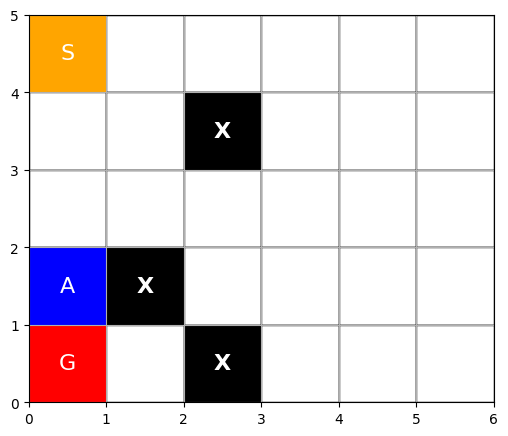

<Figure size 640x480 with 0 Axes>

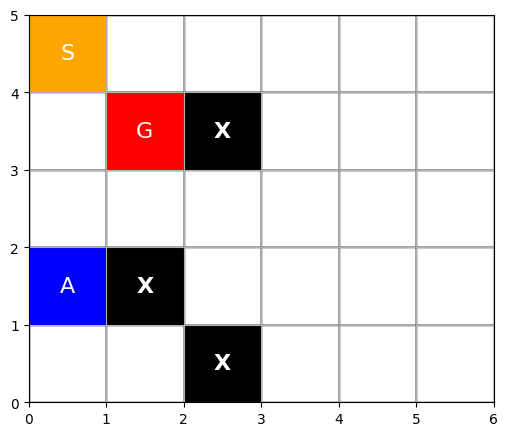

<Figure size 640x480 with 0 Axes>

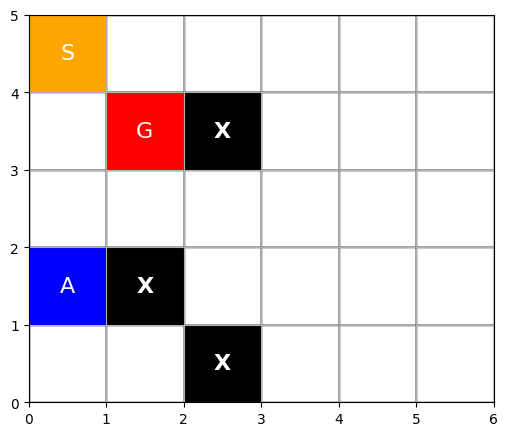

<Figure size 640x480 with 0 Axes>

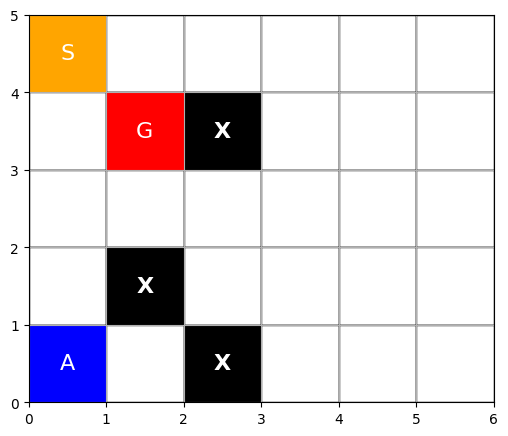

<Figure size 640x480 with 0 Axes>

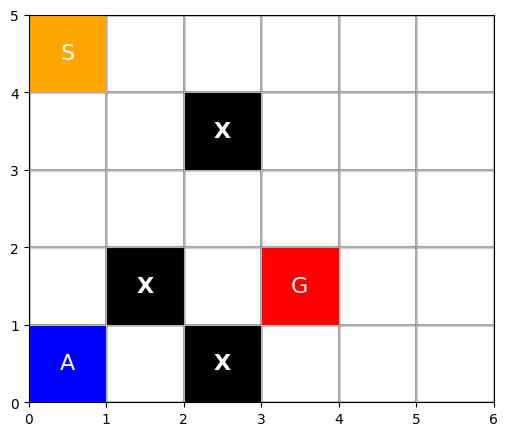

<Figure size 640x480 with 0 Axes>

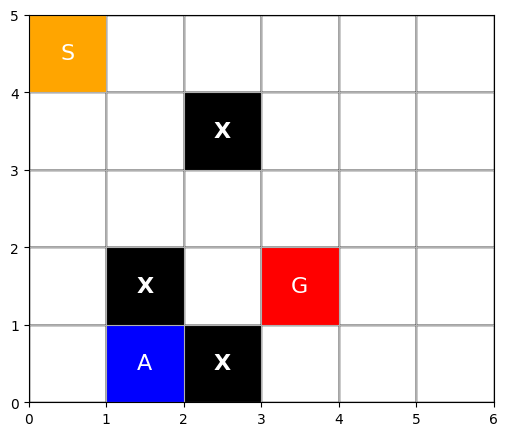

<Figure size 640x480 with 0 Axes>

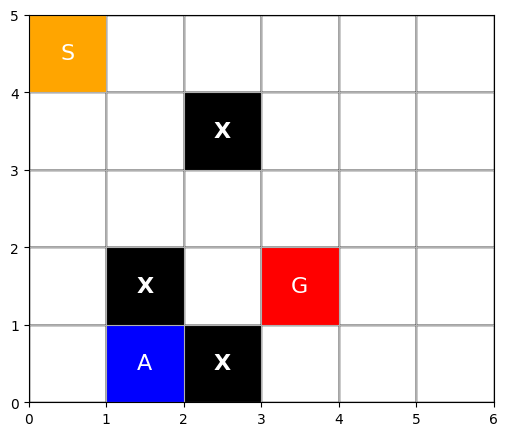

<Figure size 640x480 with 0 Axes>

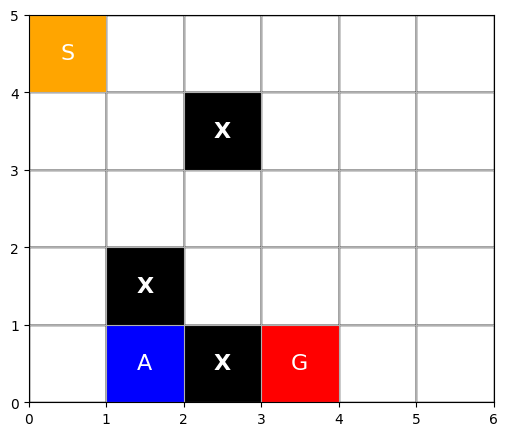

<Figure size 640x480 with 0 Axes>

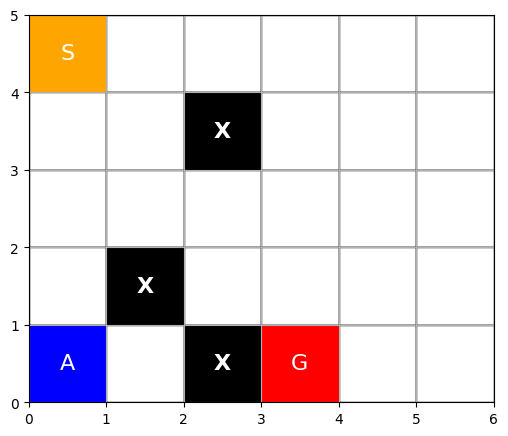

<Figure size 640x480 with 0 Axes>

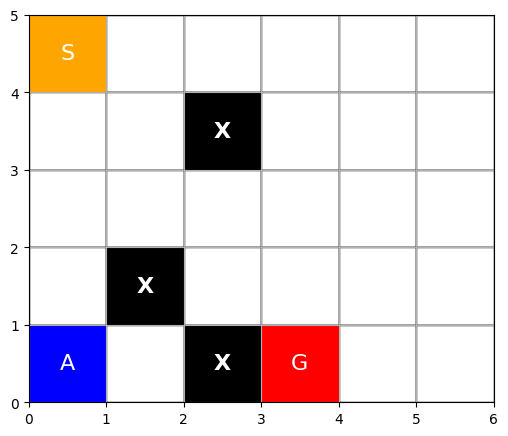

<Figure size 640x480 with 0 Axes>

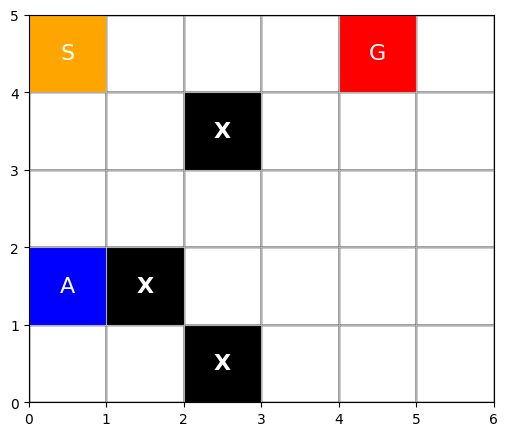

<Figure size 640x480 with 0 Axes>

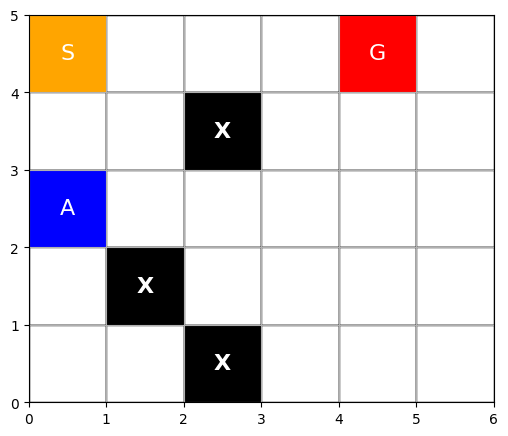

<Figure size 640x480 with 0 Axes>

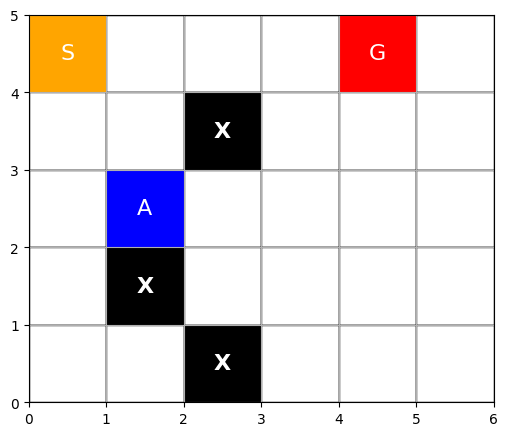

<Figure size 640x480 with 0 Axes>

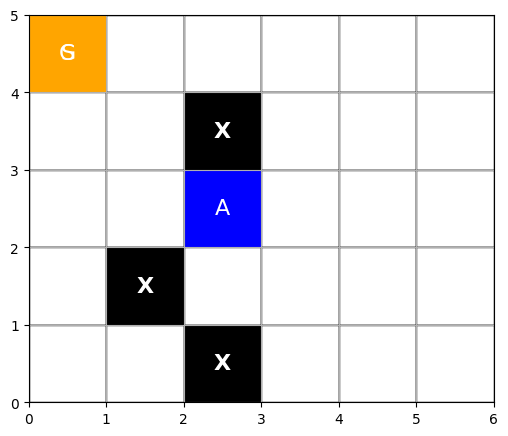

<Figure size 640x480 with 0 Axes>

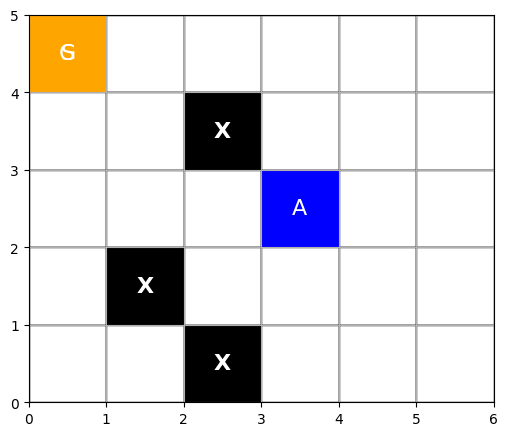

<Figure size 640x480 with 0 Axes>

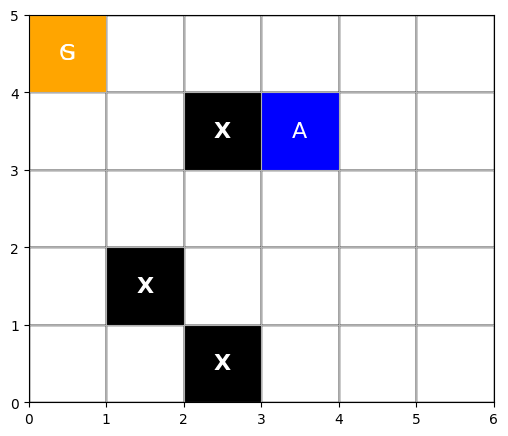

<Figure size 640x480 with 0 Axes>

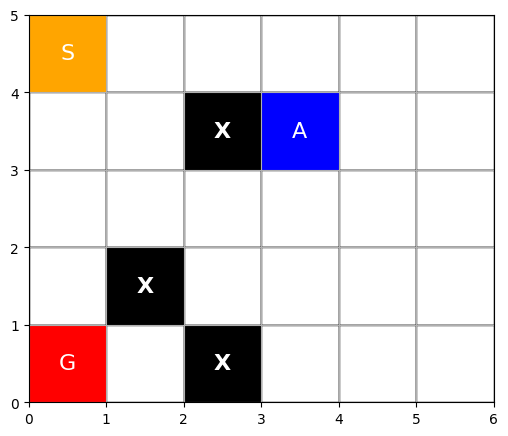

<Figure size 640x480 with 0 Axes>

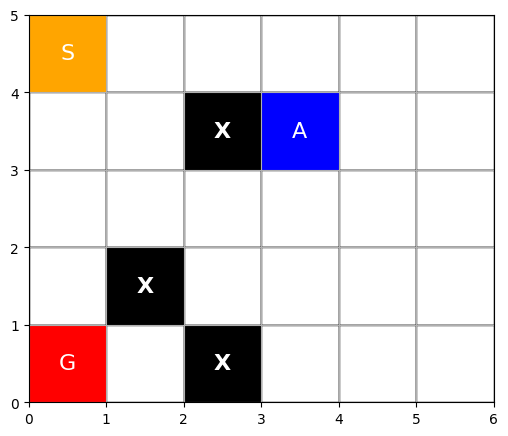

<Figure size 640x480 with 0 Axes>

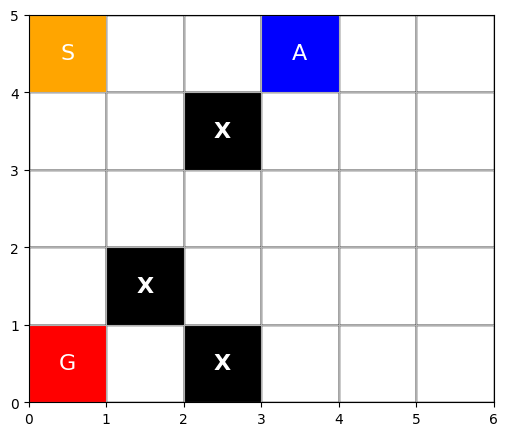

<Figure size 640x480 with 0 Axes>

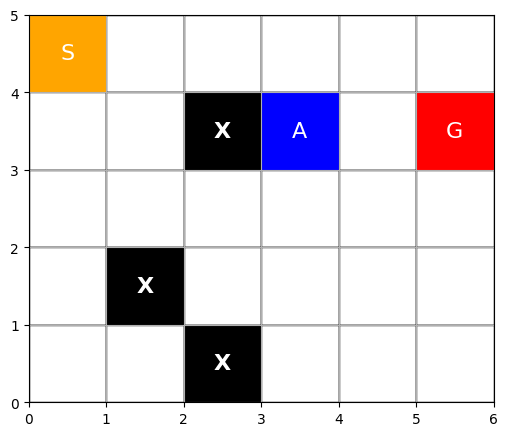

<Figure size 640x480 with 0 Axes>

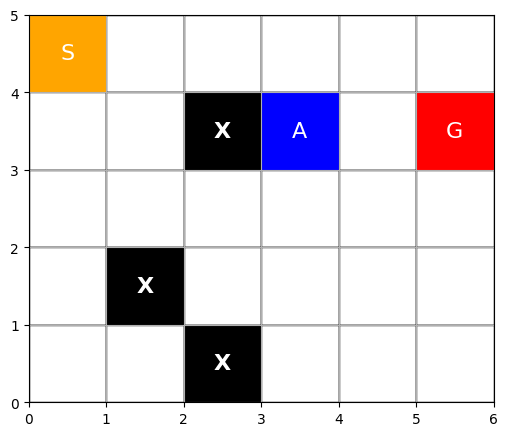

<Figure size 640x480 with 0 Axes>

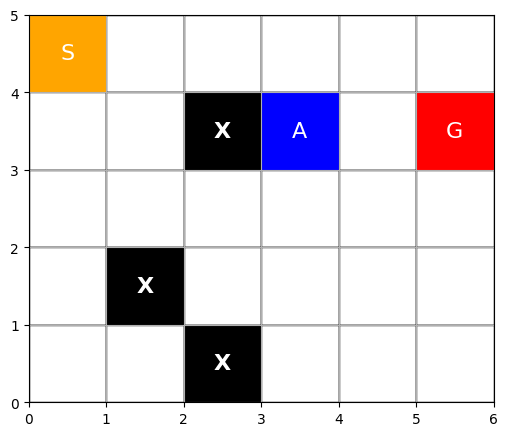

<Figure size 640x480 with 0 Axes>

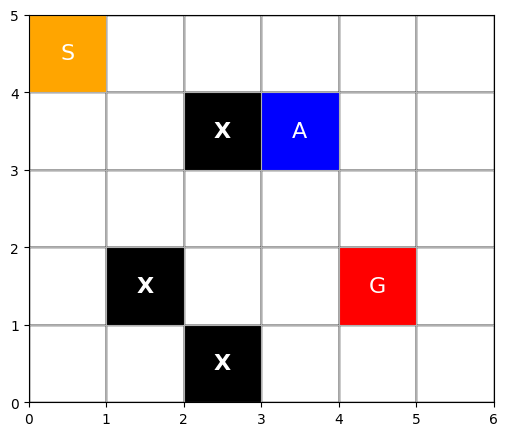

<Figure size 640x480 with 0 Axes>

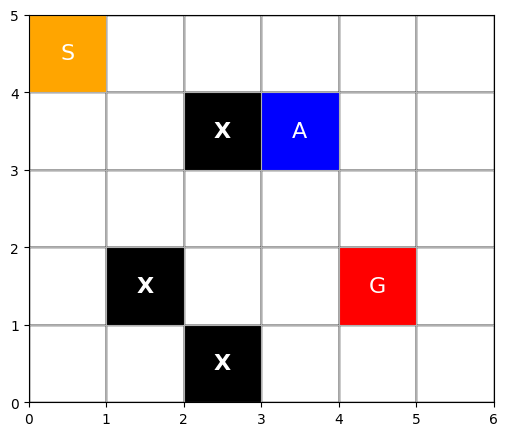

<Figure size 640x480 with 0 Axes>

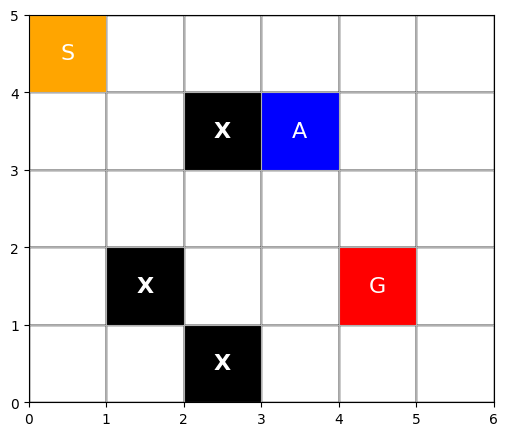

<Figure size 640x480 with 0 Axes>

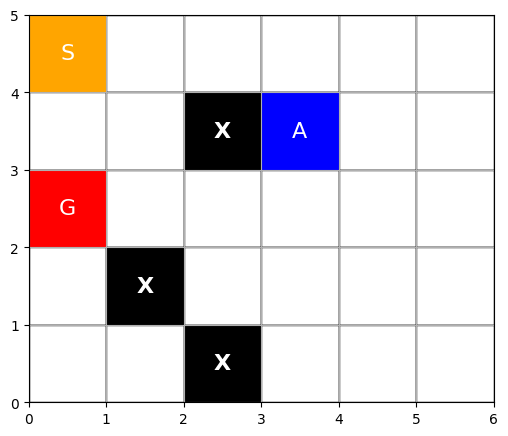

<Figure size 640x480 with 0 Axes>

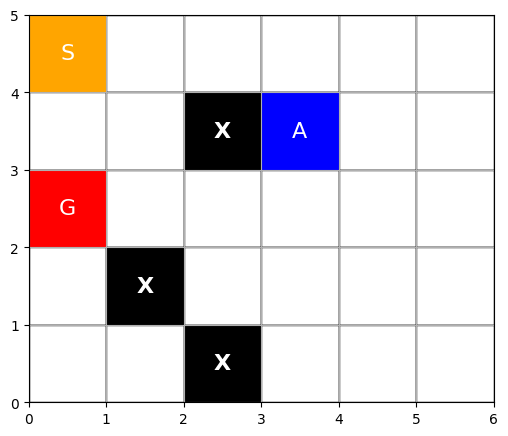

<Figure size 640x480 with 0 Axes>

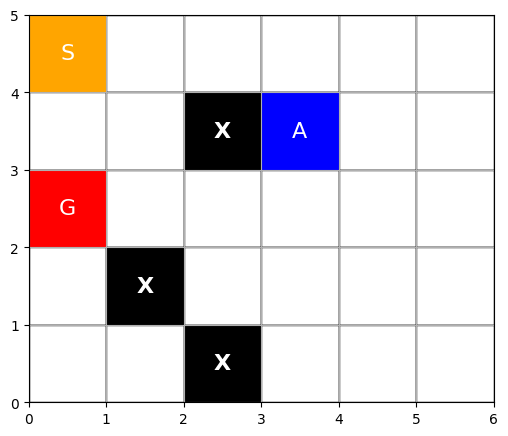

<Figure size 640x480 with 0 Axes>

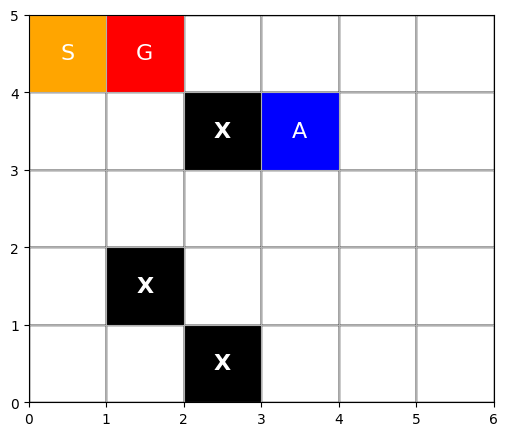

<Figure size 640x480 with 0 Axes>

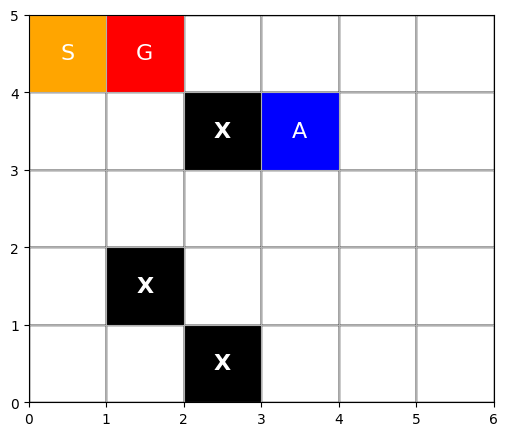

<Figure size 640x480 with 0 Axes>

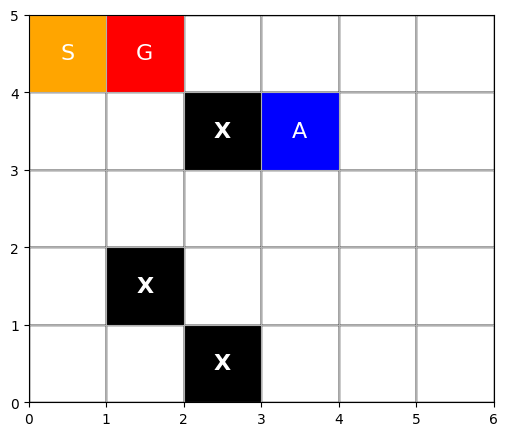

<Figure size 640x480 with 0 Axes>

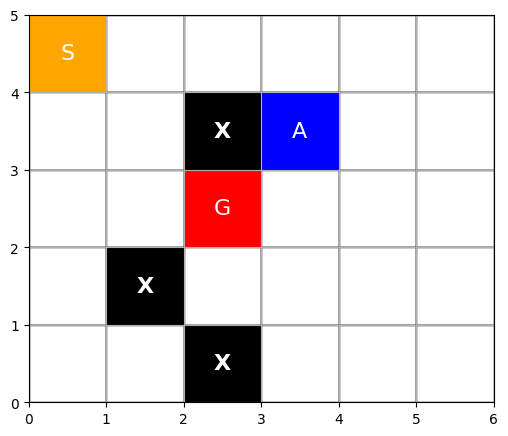

<Figure size 640x480 with 0 Axes>

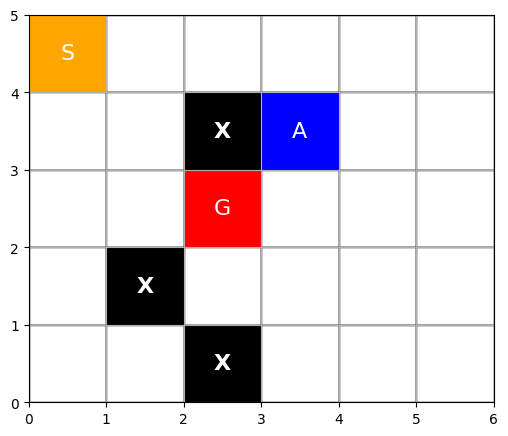

<Figure size 640x480 with 0 Axes>

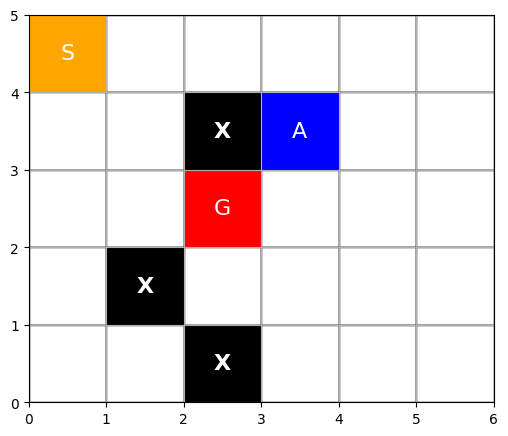

<Figure size 640x480 with 0 Axes>

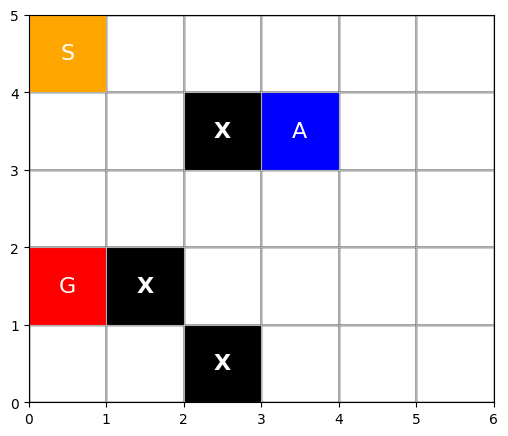

<Figure size 640x480 with 0 Axes>

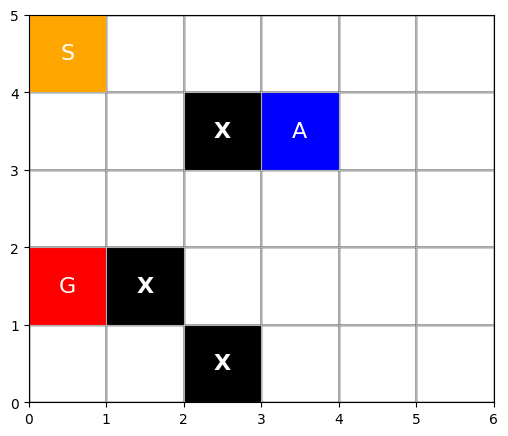

<Figure size 640x480 with 0 Axes>

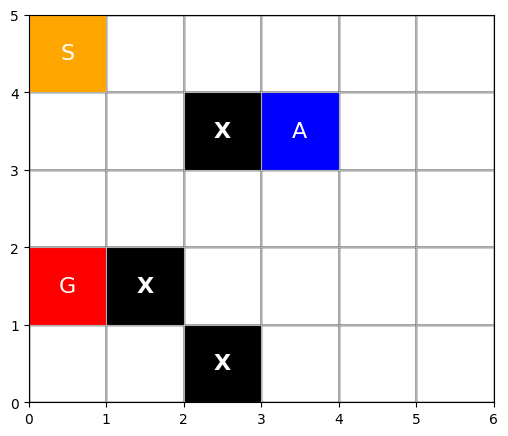

<Figure size 640x480 with 0 Axes>

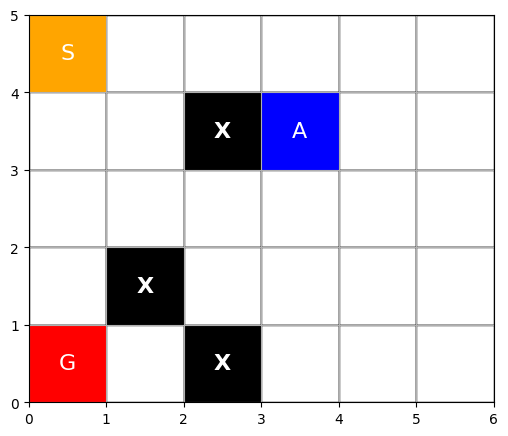

<Figure size 640x480 with 0 Axes>

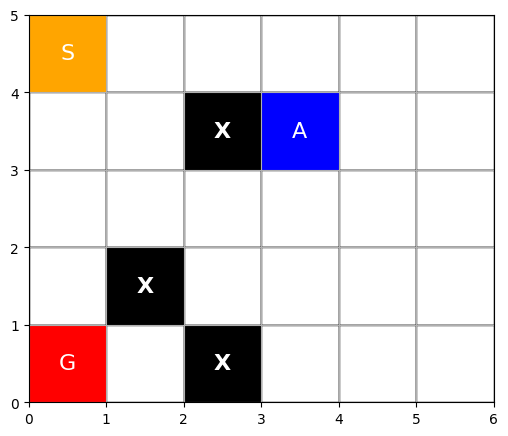

<Figure size 640x480 with 0 Axes>

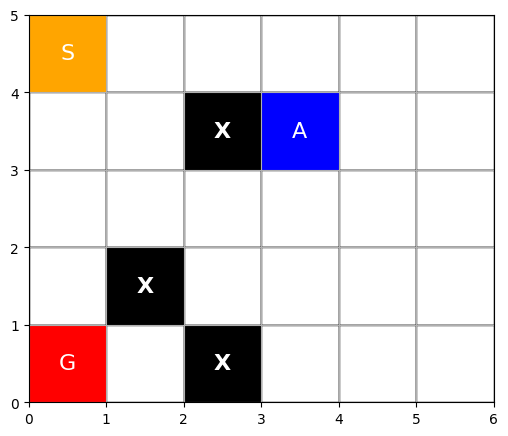

<Figure size 640x480 with 0 Axes>

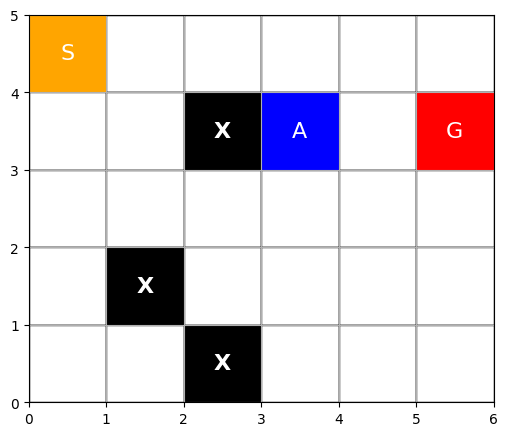

<Figure size 640x480 with 0 Axes>

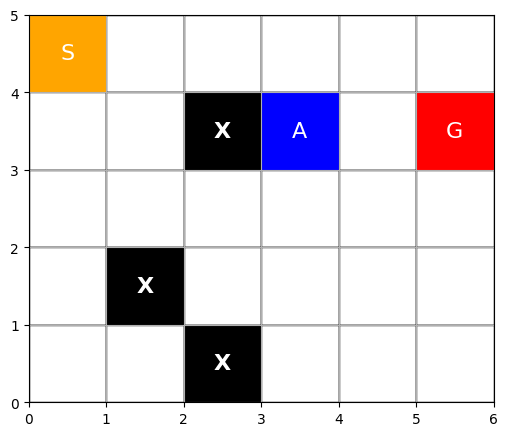

<Figure size 640x480 with 0 Axes>

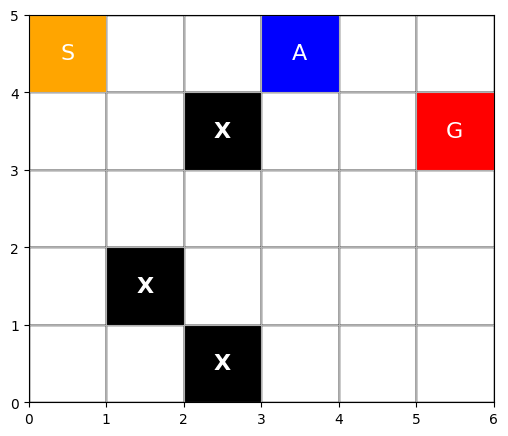

<Figure size 640x480 with 0 Axes>

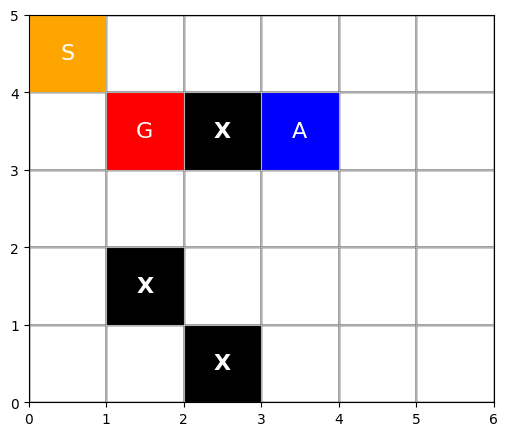

<Figure size 640x480 with 0 Axes>

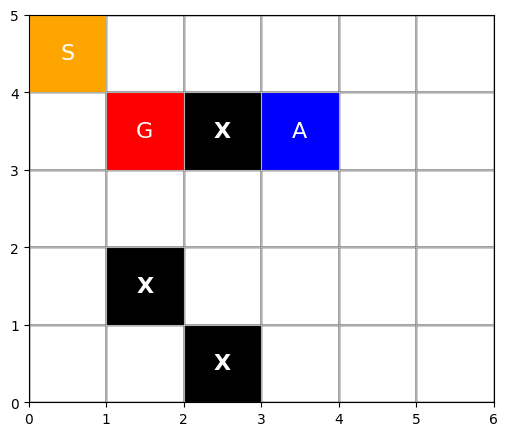

<Figure size 640x480 with 0 Axes>

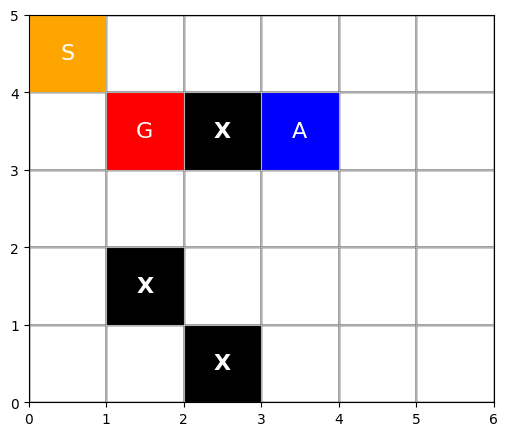

<Figure size 640x480 with 0 Axes>

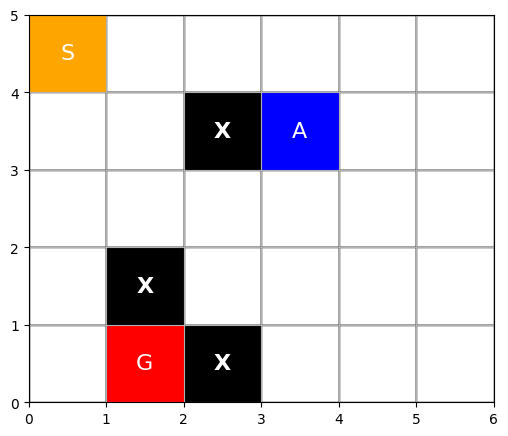

<Figure size 640x480 with 0 Axes>

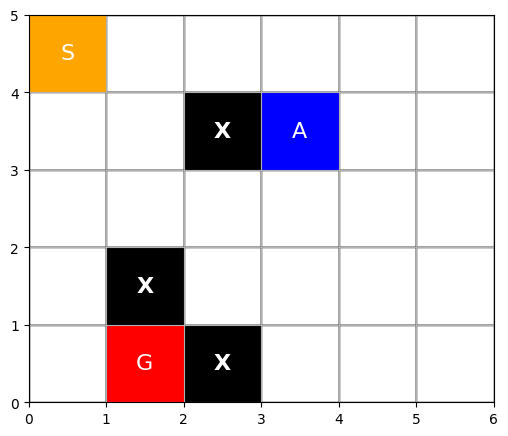

<Figure size 640x480 with 0 Axes>

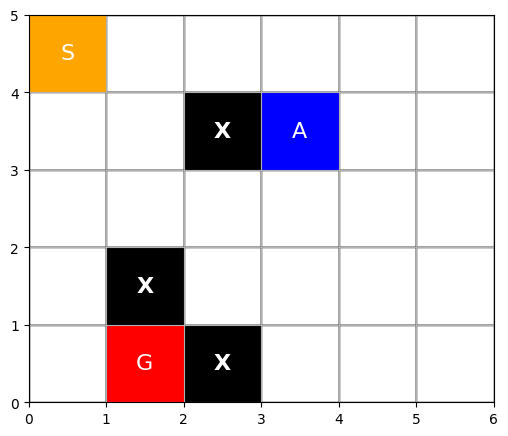

<Figure size 640x480 with 0 Axes>

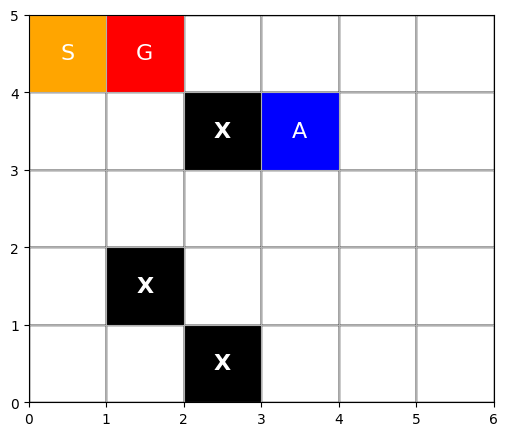

<Figure size 640x480 with 0 Axes>

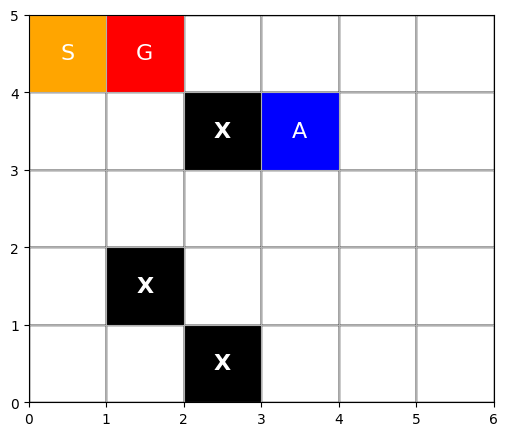

<Figure size 640x480 with 0 Axes>

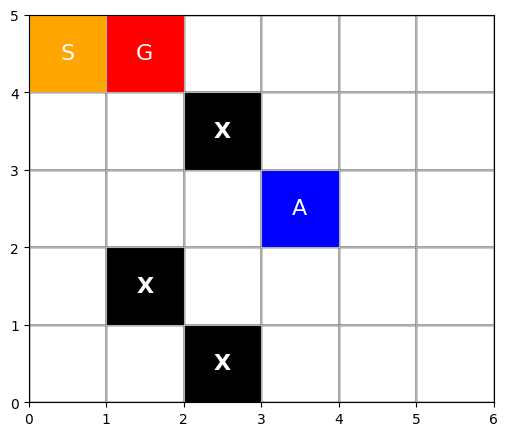

<Figure size 640x480 with 0 Axes>

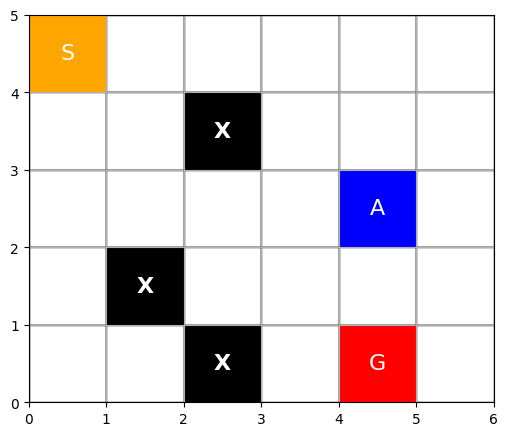

<Figure size 640x480 with 0 Axes>

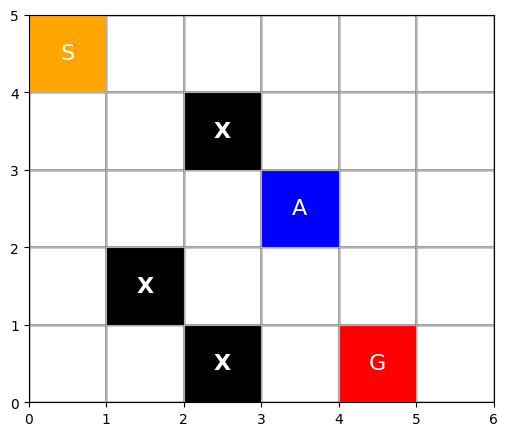

<Figure size 640x480 with 0 Axes>

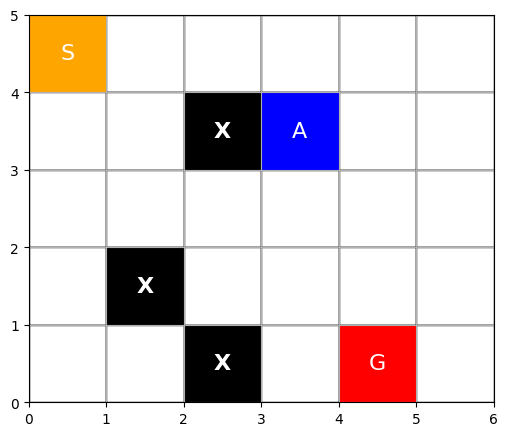

<Figure size 640x480 with 0 Axes>

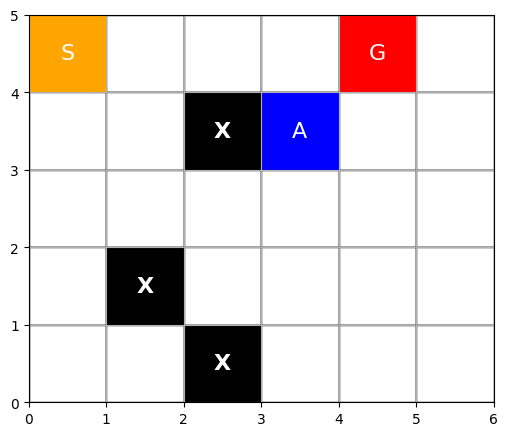

<Figure size 640x480 with 0 Axes>

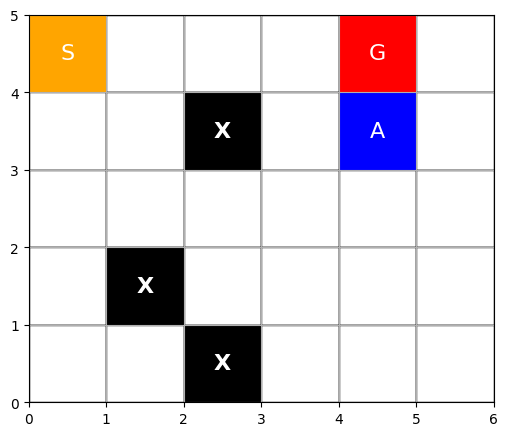

<Figure size 640x480 with 0 Axes>

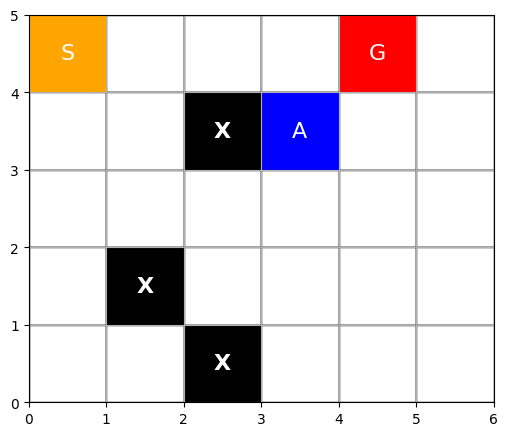

<Figure size 640x480 with 0 Axes>

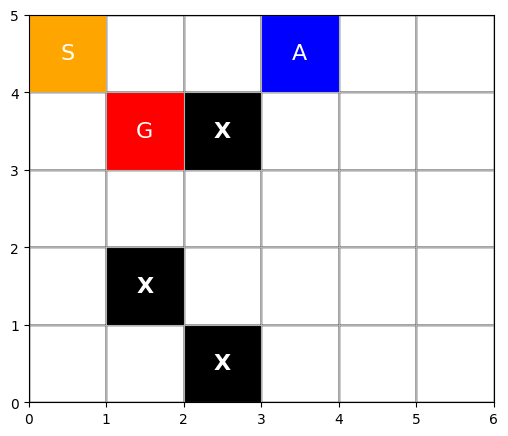

<Figure size 640x480 with 0 Axes>

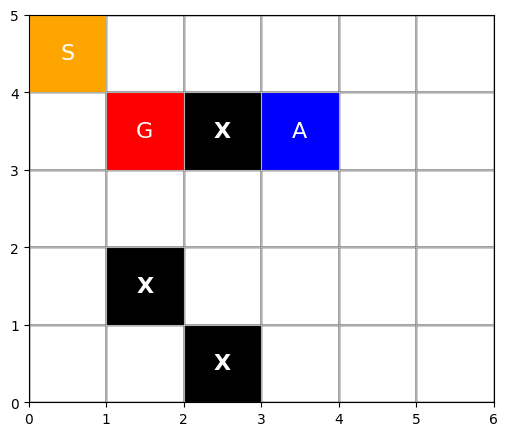

<Figure size 640x480 with 0 Axes>

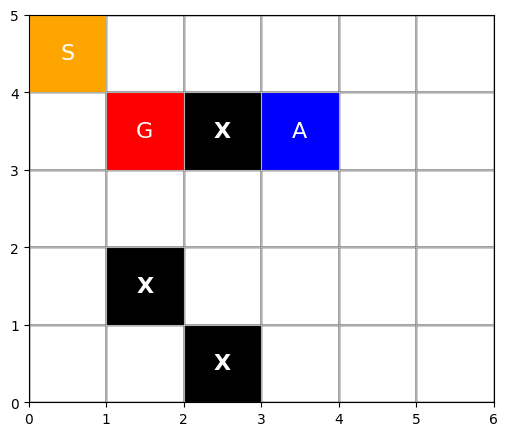

<Figure size 640x480 with 0 Axes>

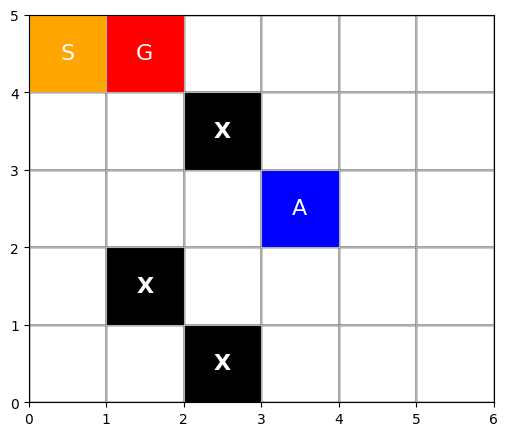

<Figure size 640x480 with 0 Axes>

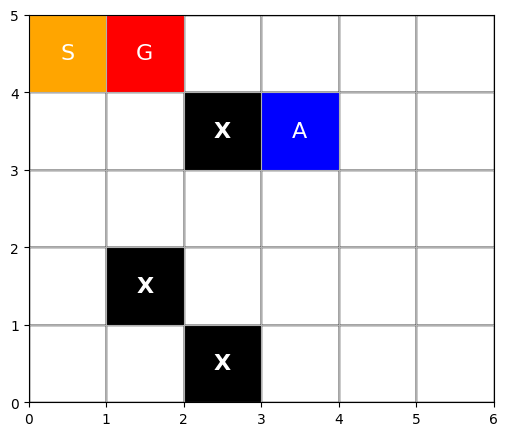

<Figure size 640x480 with 0 Axes>

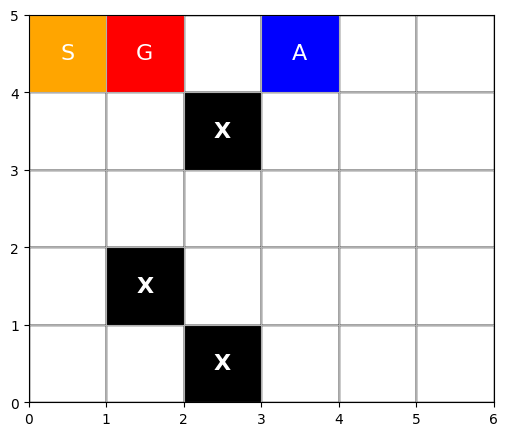

<Figure size 640x480 with 0 Axes>

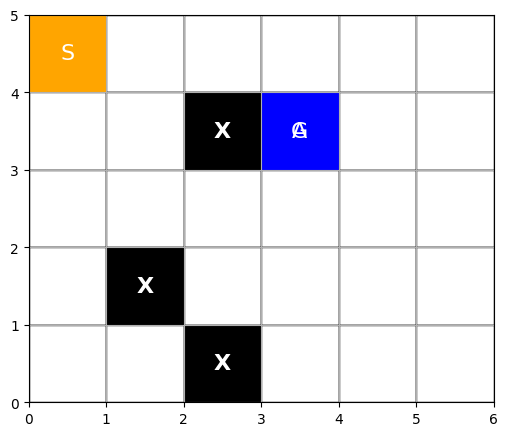

<Figure size 640x480 with 0 Axes>

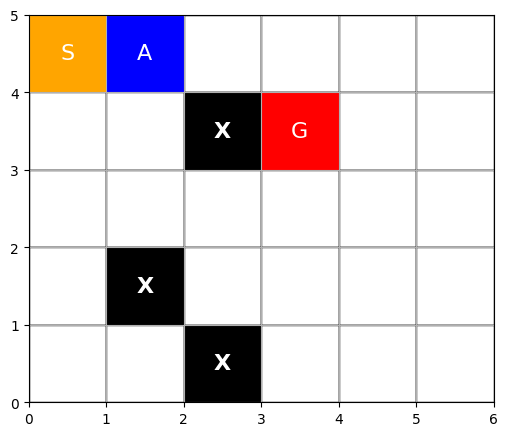

<Figure size 640x480 with 0 Axes>

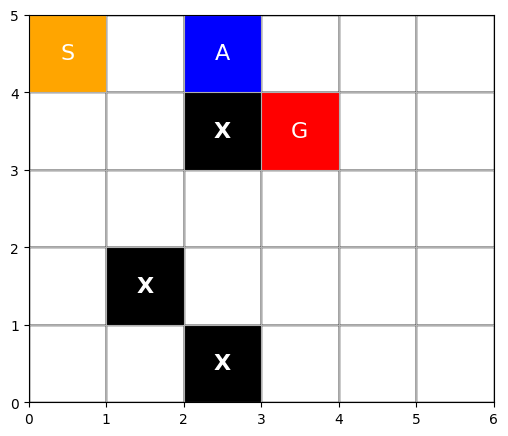

<Figure size 640x480 with 0 Axes>

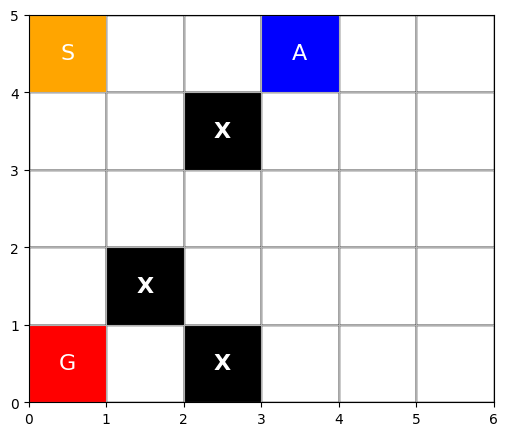

<Figure size 640x480 with 0 Axes>

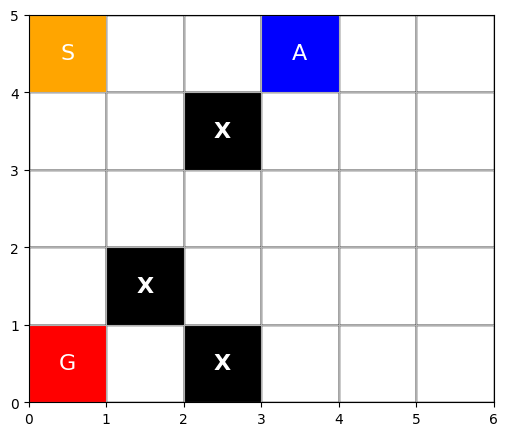

<Figure size 640x480 with 0 Axes>

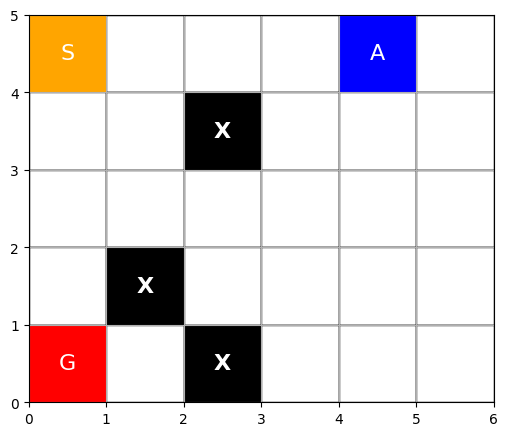

<Figure size 640x480 with 0 Axes>

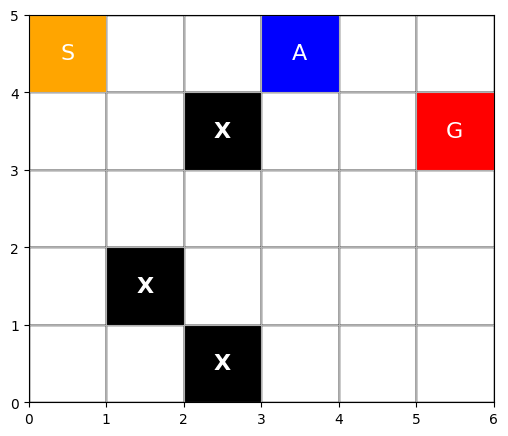

<Figure size 640x480 with 0 Axes>

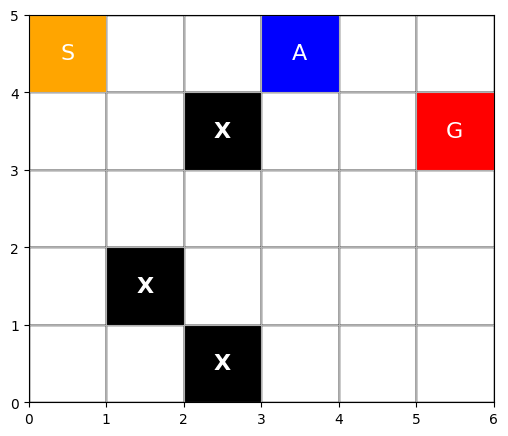

<Figure size 640x480 with 0 Axes>

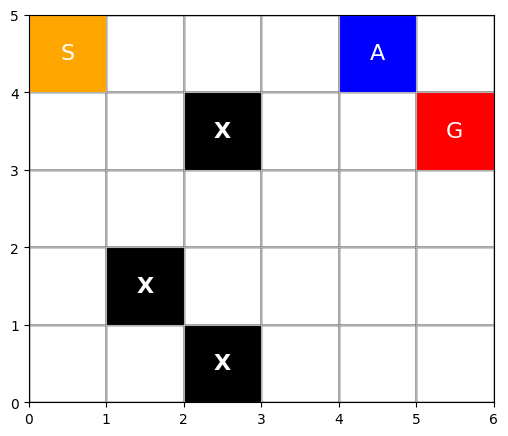

<Figure size 640x480 with 0 Axes>

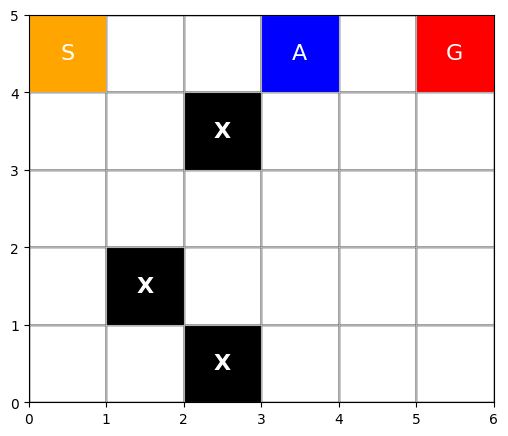

<Figure size 640x480 with 0 Axes>

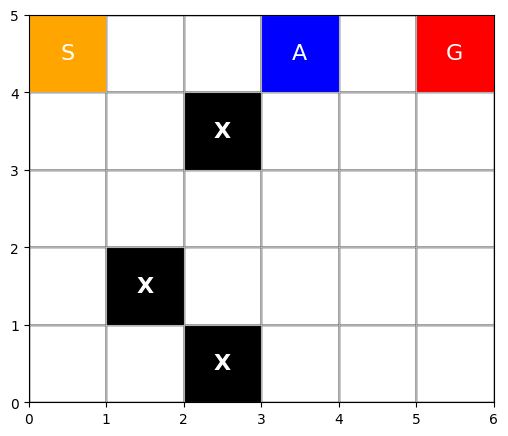

<Figure size 640x480 with 0 Axes>

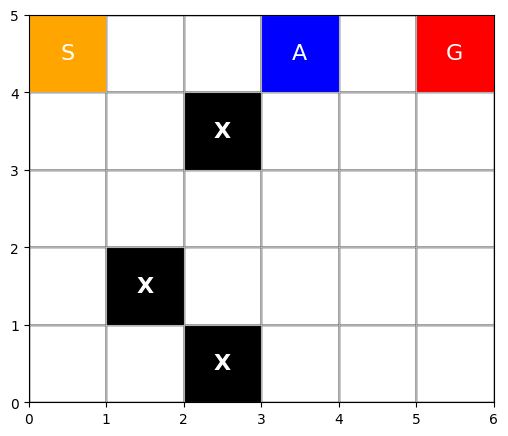

<Figure size 640x480 with 0 Axes>

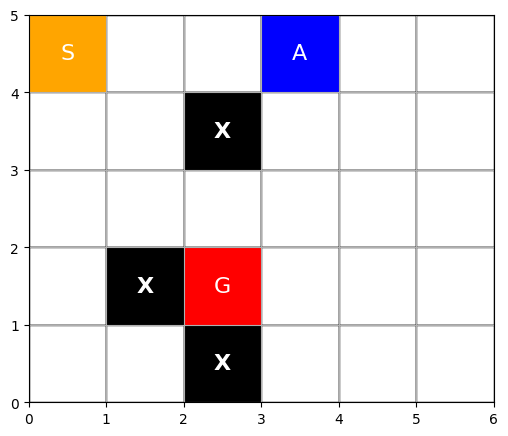

<Figure size 640x480 with 0 Axes>

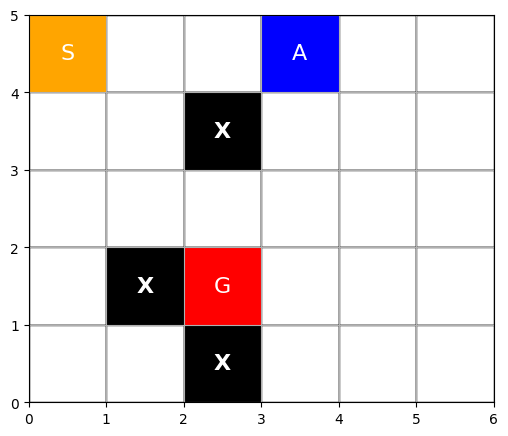

<Figure size 640x480 with 0 Axes>

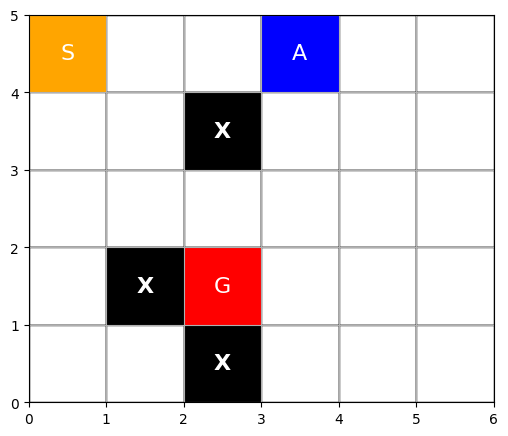

<Figure size 640x480 with 0 Axes>

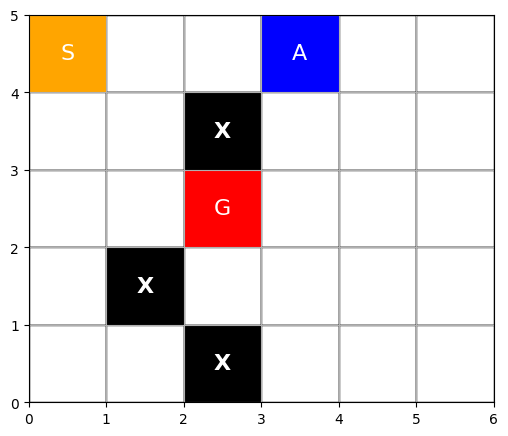

<Figure size 640x480 with 0 Axes>

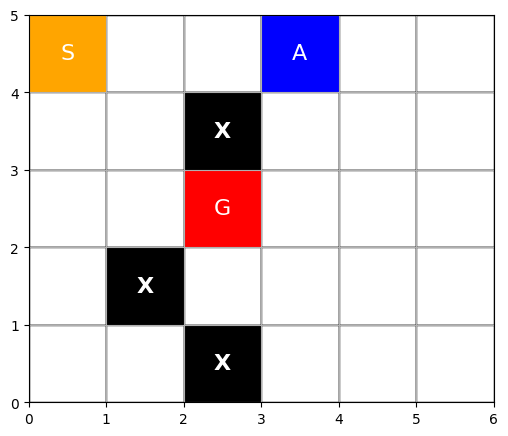

<Figure size 640x480 with 0 Axes>

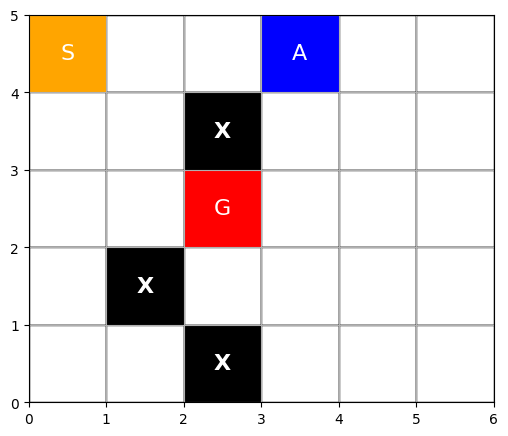

<Figure size 640x480 with 0 Axes>

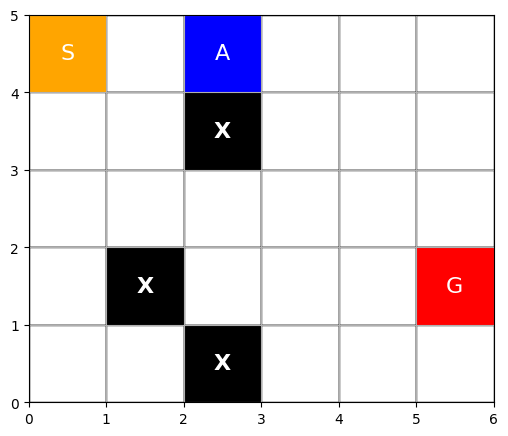

<Figure size 640x480 with 0 Axes>

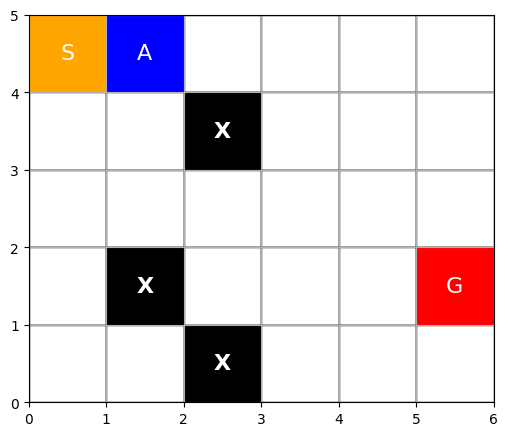

<Figure size 640x480 with 0 Axes>

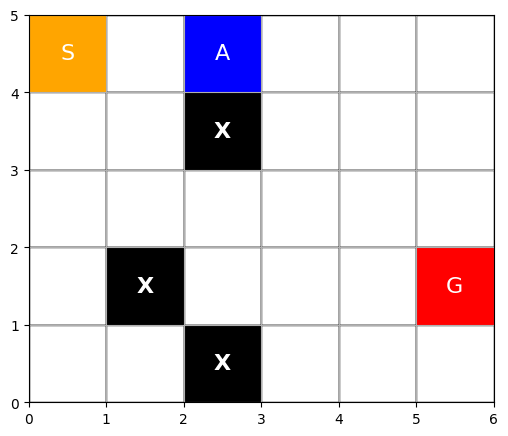

<Figure size 640x480 with 0 Axes>

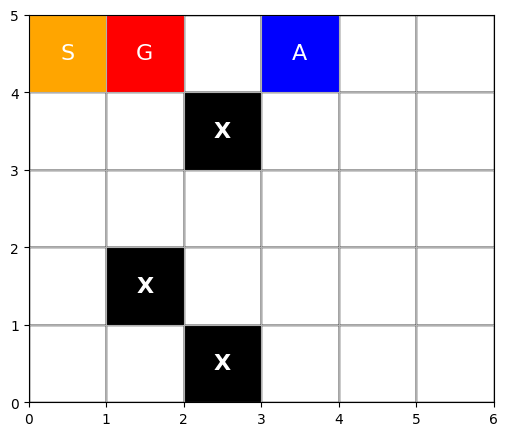

<Figure size 640x480 with 0 Axes>

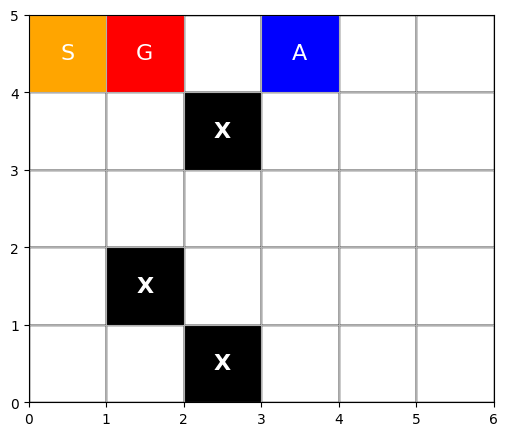

<Figure size 640x480 with 0 Axes>

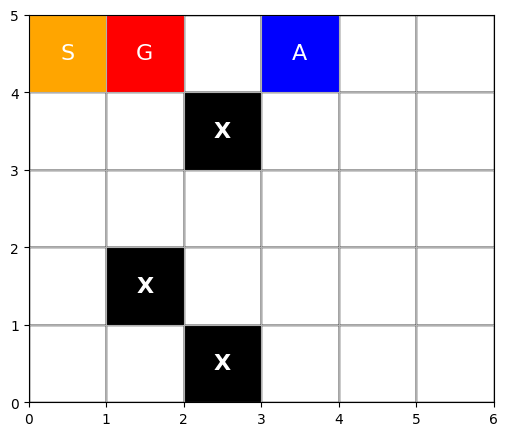

<Figure size 640x480 with 0 Axes>

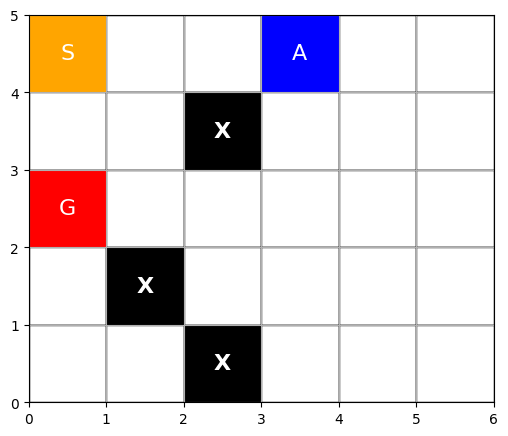

<Figure size 640x480 with 0 Axes>

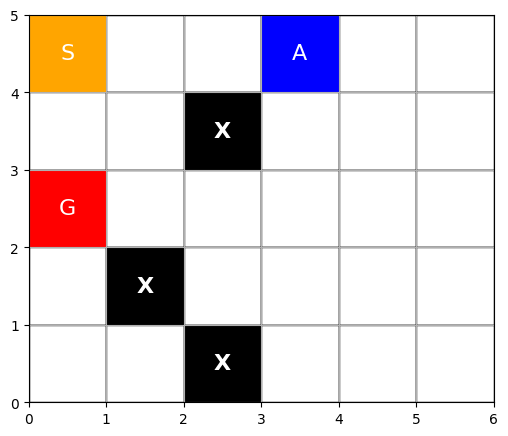

<Figure size 640x480 with 0 Axes>

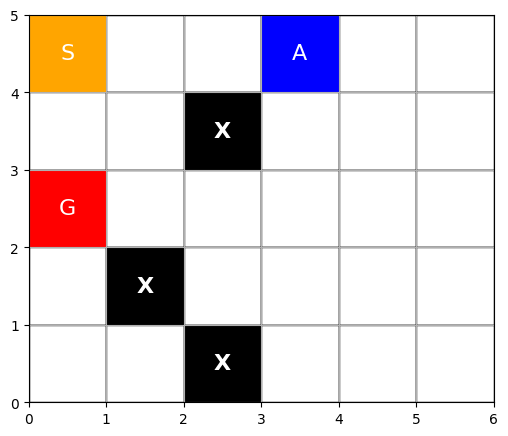

<Figure size 640x480 with 0 Axes>

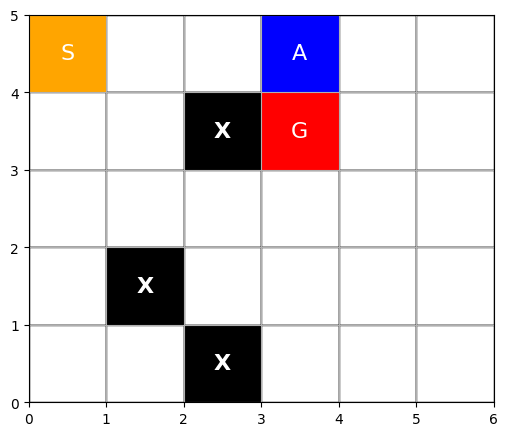

<Figure size 640x480 with 0 Axes>

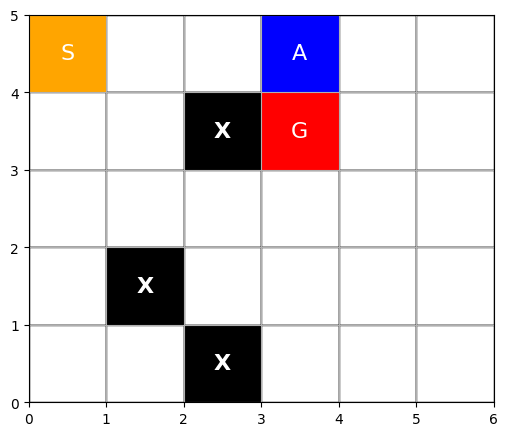

<Figure size 640x480 with 0 Axes>

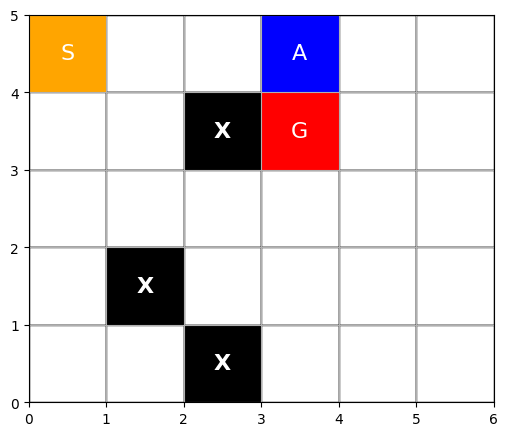

<Figure size 640x480 with 0 Axes>

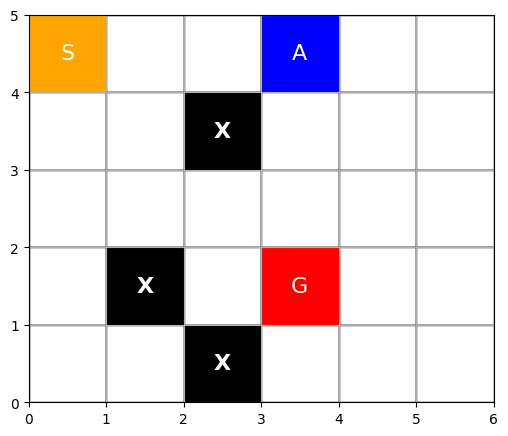

<Figure size 640x480 with 0 Axes>

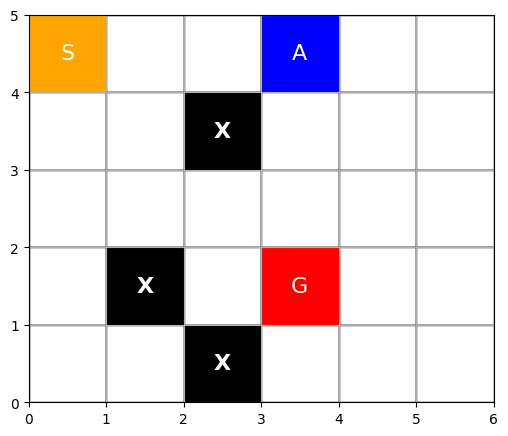

<Figure size 640x480 with 0 Axes>

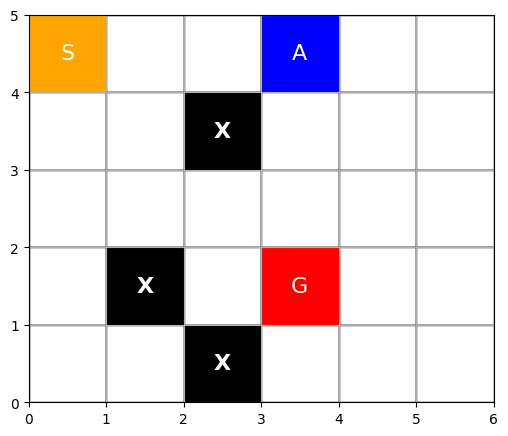

<Figure size 640x480 with 0 Axes>

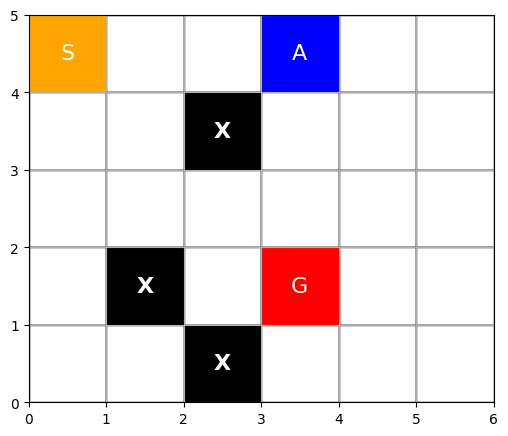

<Figure size 640x480 with 0 Axes>

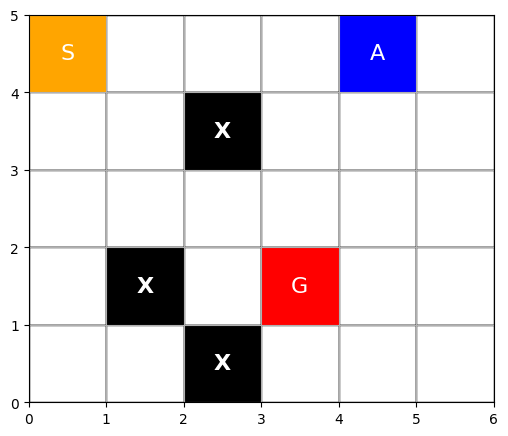

<Figure size 640x480 with 0 Axes>

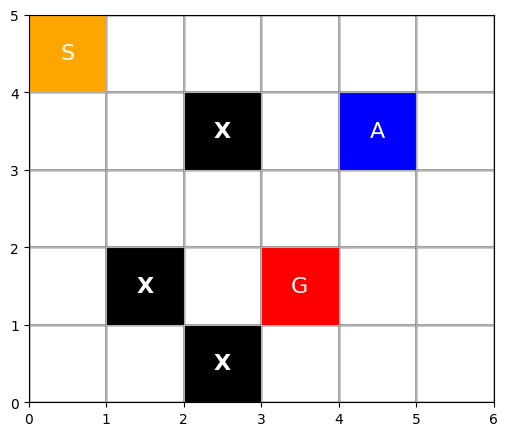

<Figure size 640x480 with 0 Axes>

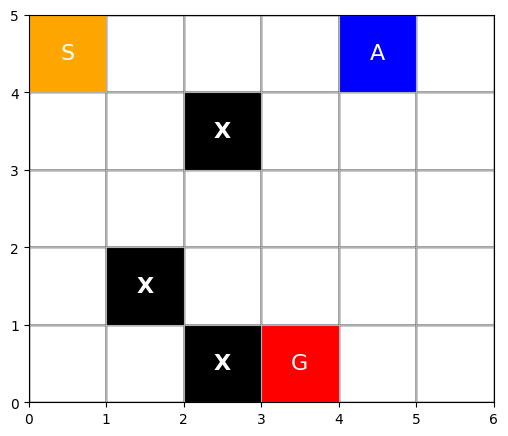

<Figure size 640x480 with 0 Axes>

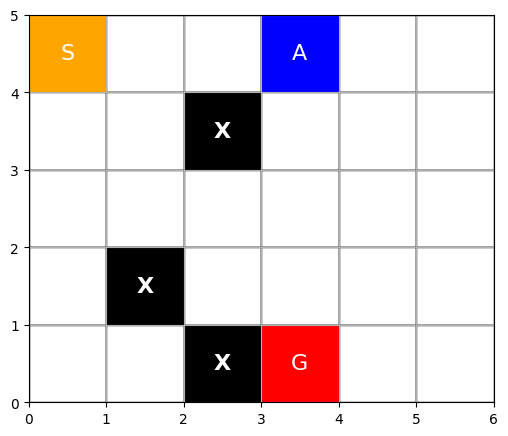

<Figure size 640x480 with 0 Axes>

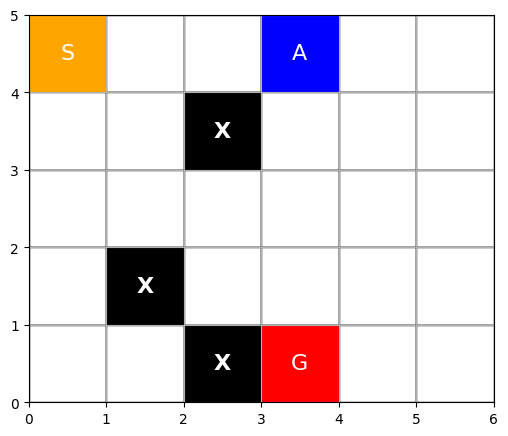

<Figure size 640x480 with 0 Axes>

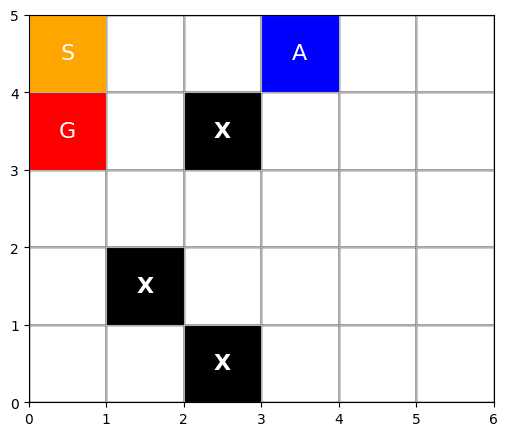

<Figure size 640x480 with 0 Axes>

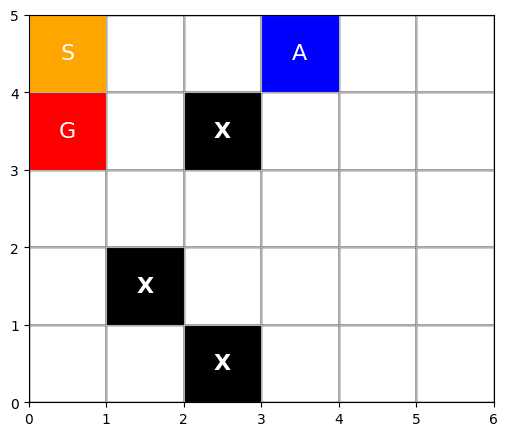

<Figure size 640x480 with 0 Axes>

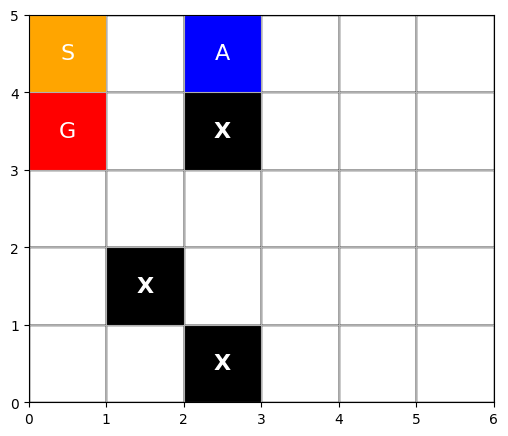

<Figure size 640x480 with 0 Axes>

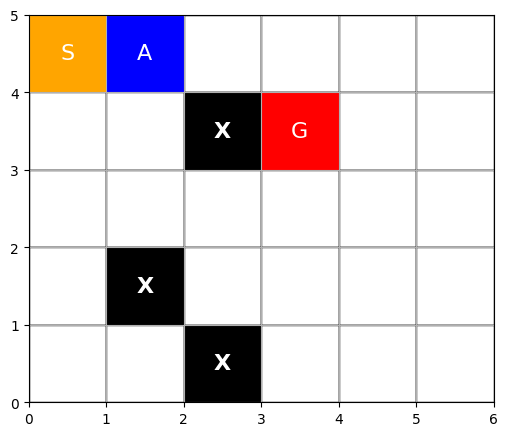

<Figure size 640x480 with 0 Axes>

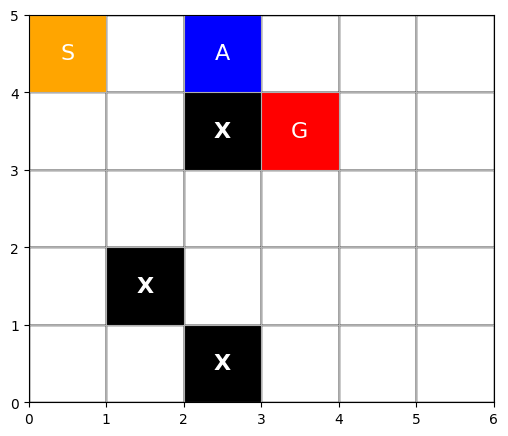

<Figure size 640x480 with 0 Axes>

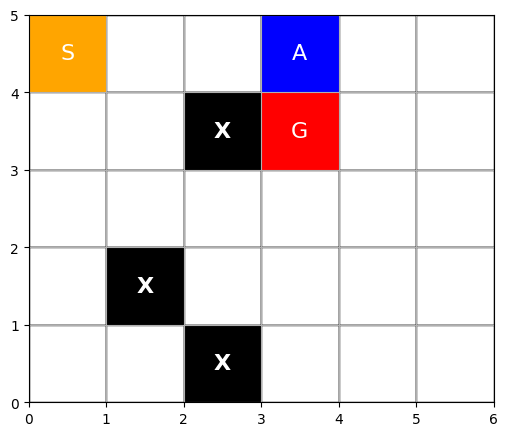

<Figure size 640x480 with 0 Axes>

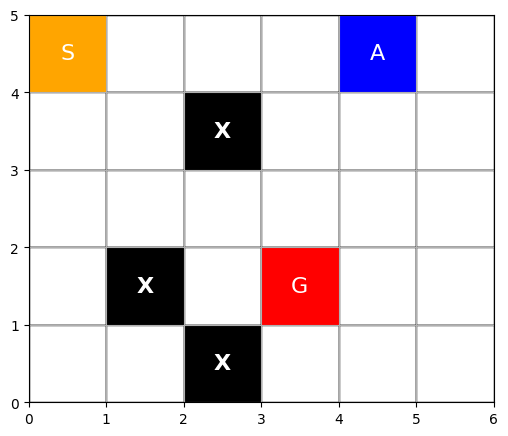

<Figure size 640x480 with 0 Axes>

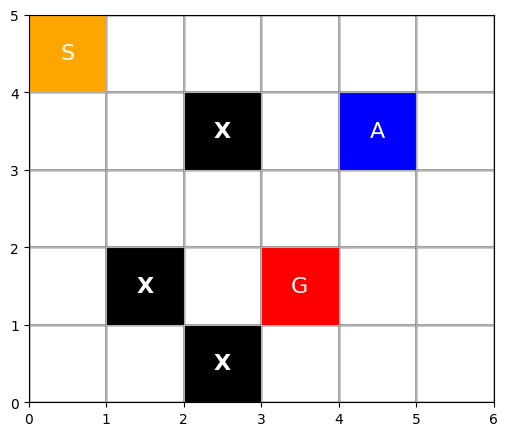

<Figure size 640x480 with 0 Axes>

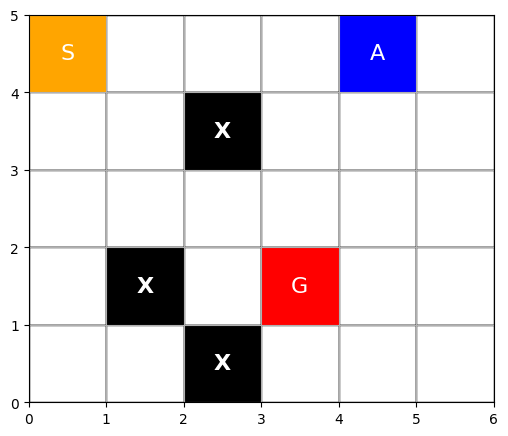

<Figure size 640x480 with 0 Axes>

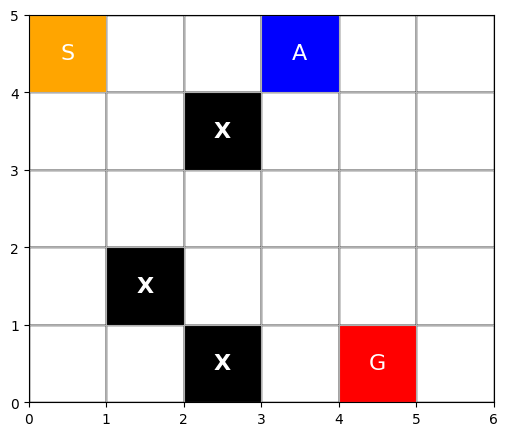

<Figure size 640x480 with 0 Axes>

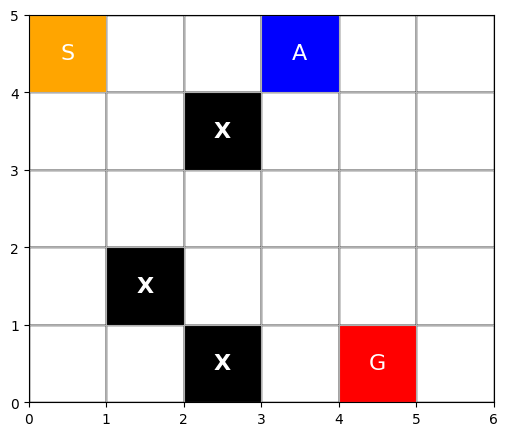

<Figure size 640x480 with 0 Axes>

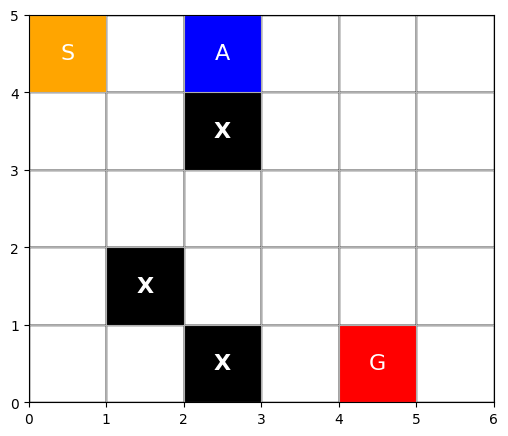

<Figure size 640x480 with 0 Axes>

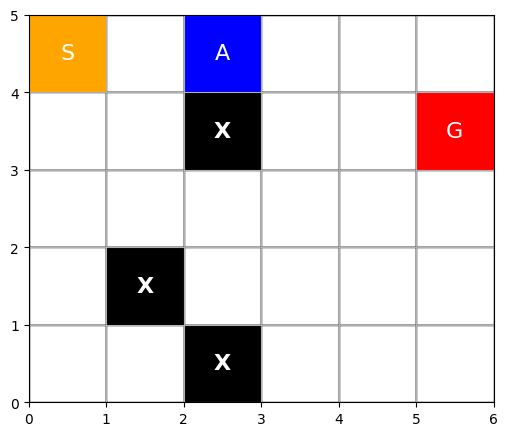

<Figure size 640x480 with 0 Axes>

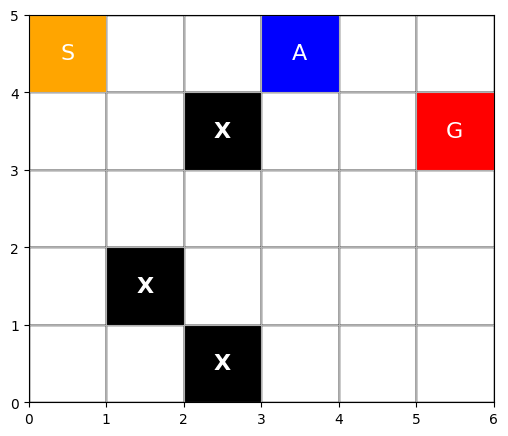

<Figure size 640x480 with 0 Axes>

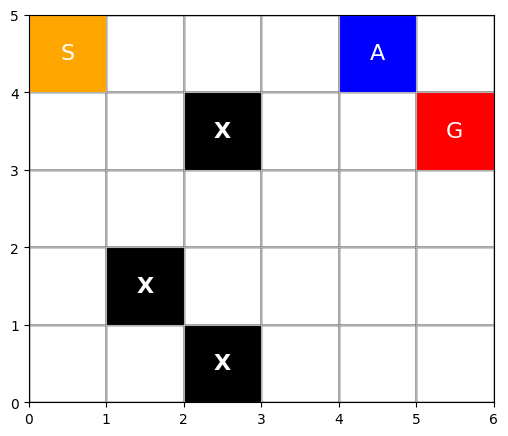

<Figure size 640x480 with 0 Axes>

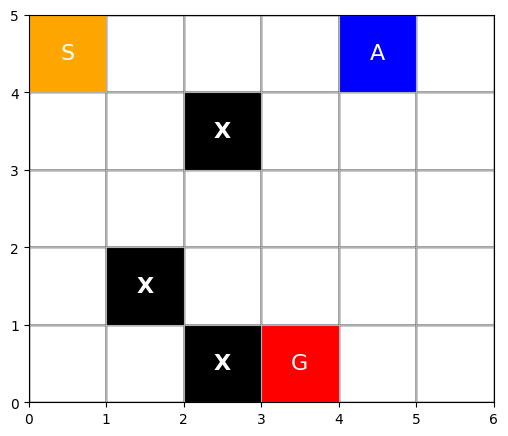

<Figure size 640x480 with 0 Axes>

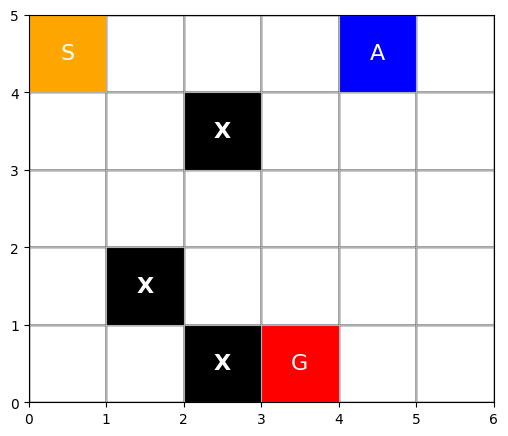

<Figure size 640x480 with 0 Axes>

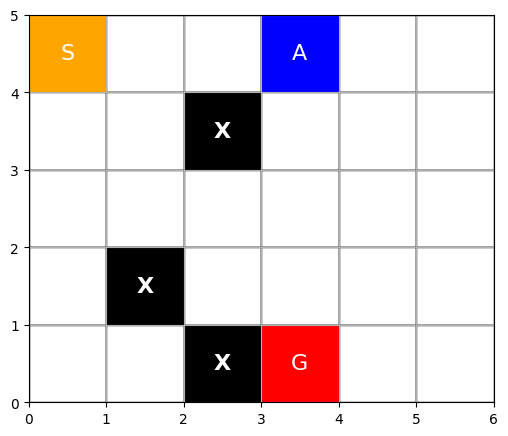

<Figure size 640x480 with 0 Axes>

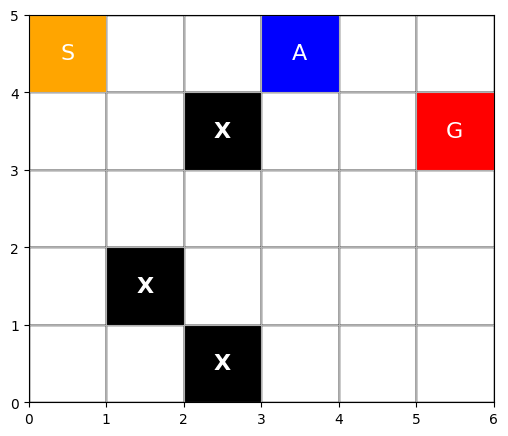

<Figure size 640x480 with 0 Axes>

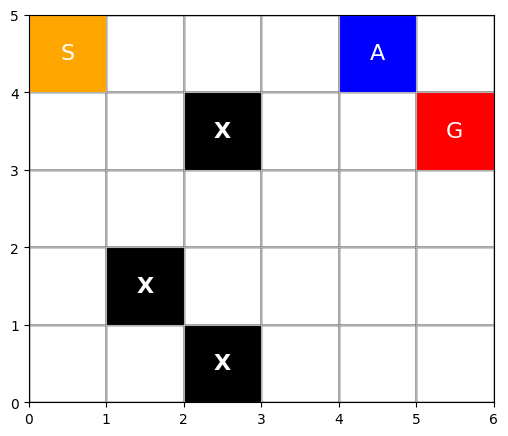

<Figure size 640x480 with 0 Axes>

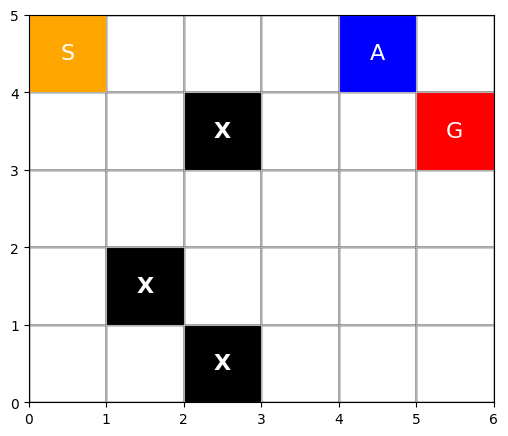

<Figure size 640x480 with 0 Axes>

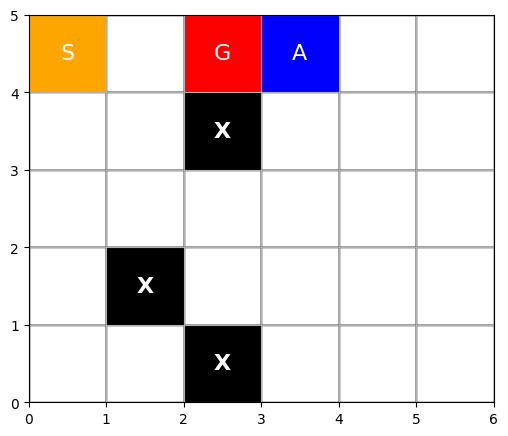

<Figure size 640x480 with 0 Axes>

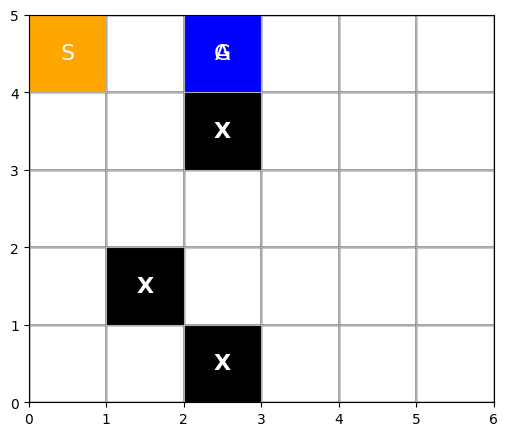

<Figure size 640x480 with 0 Axes>

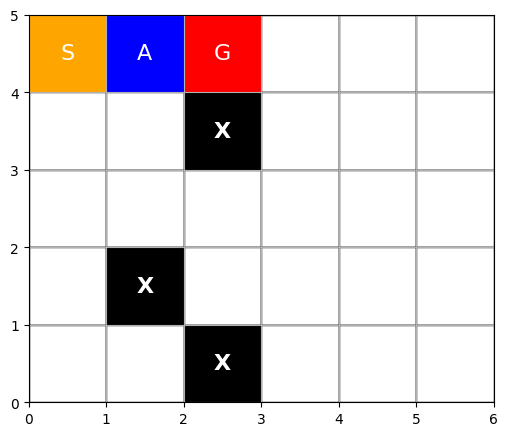

<Figure size 640x480 with 0 Axes>

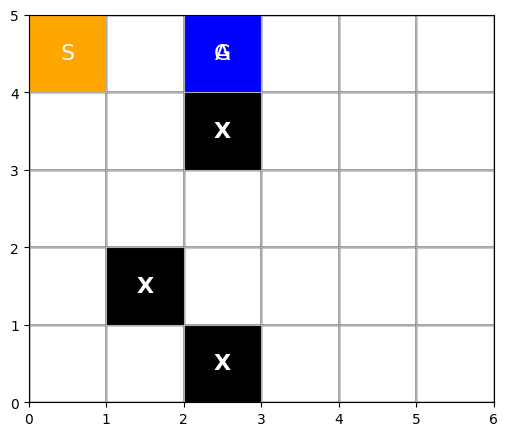

<Figure size 640x480 with 0 Axes>

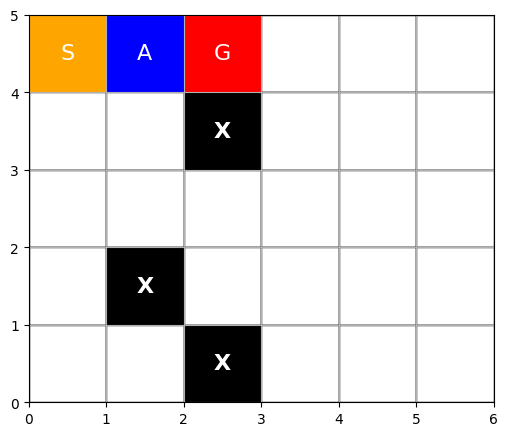

<Figure size 640x480 with 0 Axes>

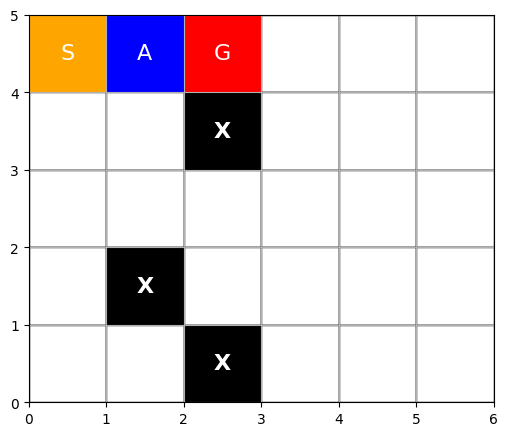

<Figure size 640x480 with 0 Axes>

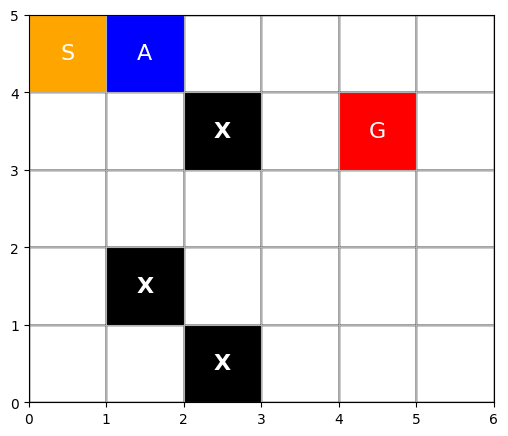

<Figure size 640x480 with 0 Axes>

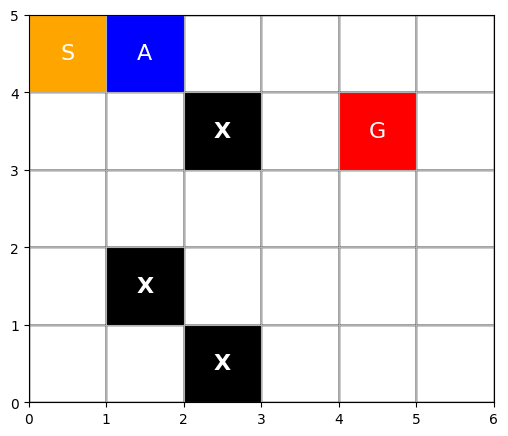

<Figure size 640x480 with 0 Axes>

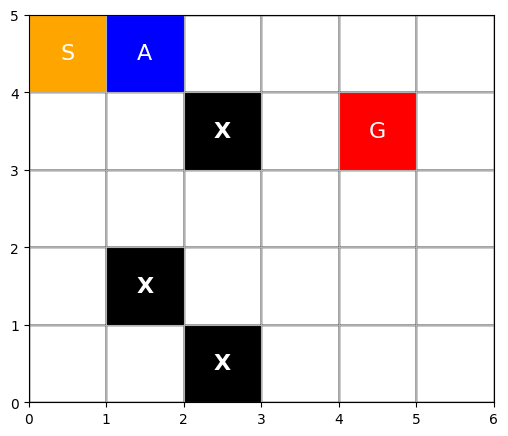

<Figure size 640x480 with 0 Axes>

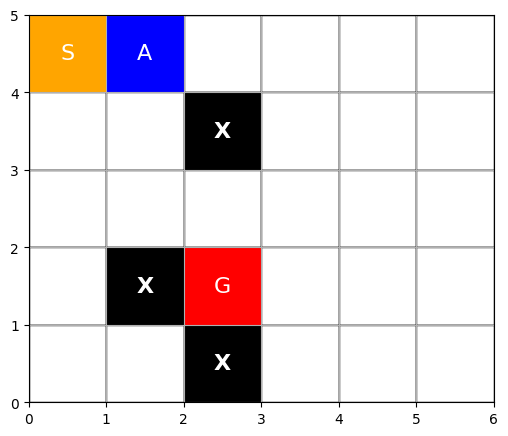

<Figure size 640x480 with 0 Axes>

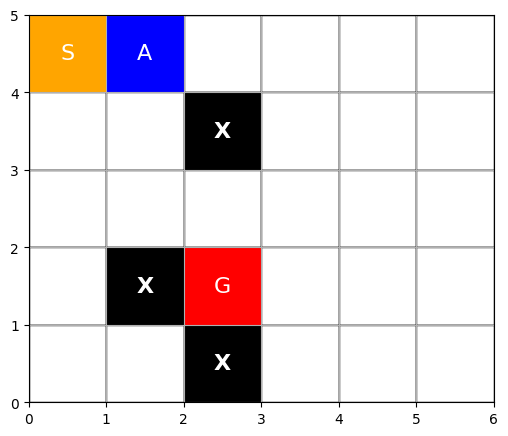

<Figure size 640x480 with 0 Axes>

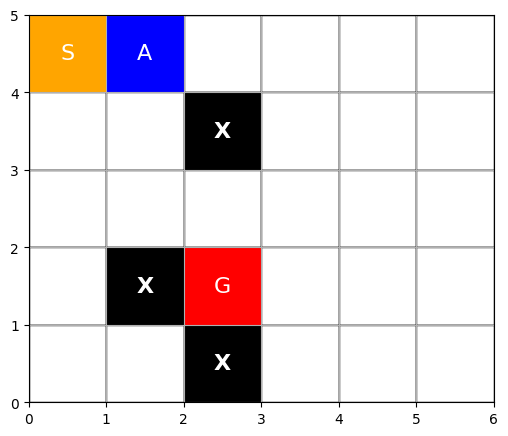

<Figure size 640x480 with 0 Axes>

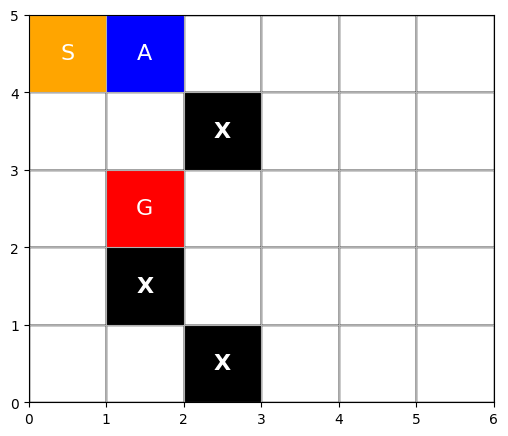

<Figure size 640x480 with 0 Axes>

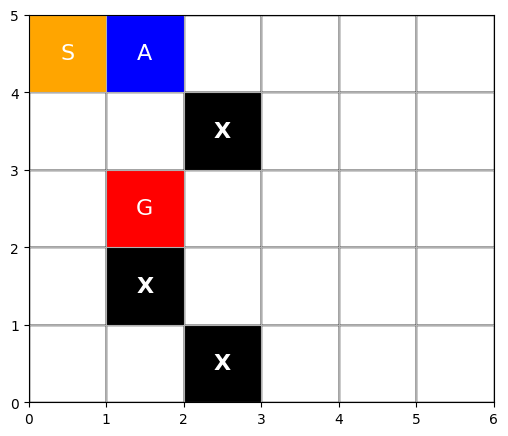

<Figure size 640x480 with 0 Axes>

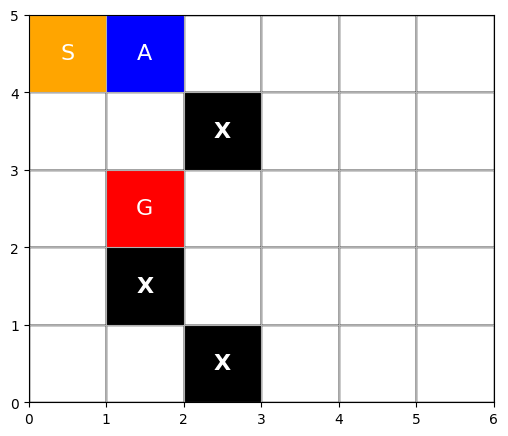

<Figure size 640x480 with 0 Axes>

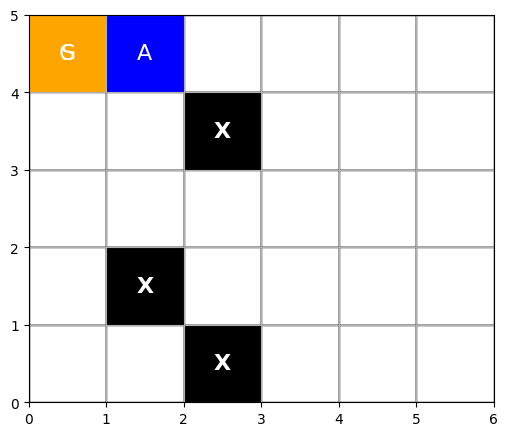

<Figure size 640x480 with 0 Axes>

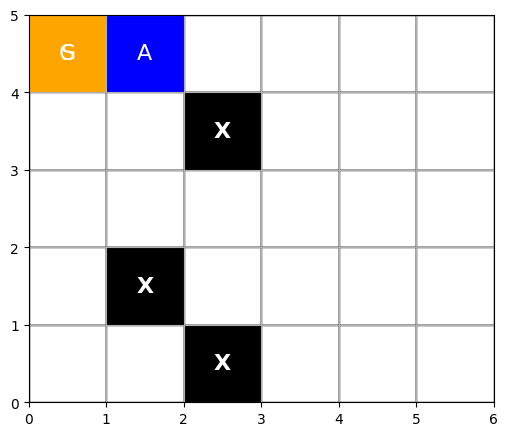

<Figure size 640x480 with 0 Axes>

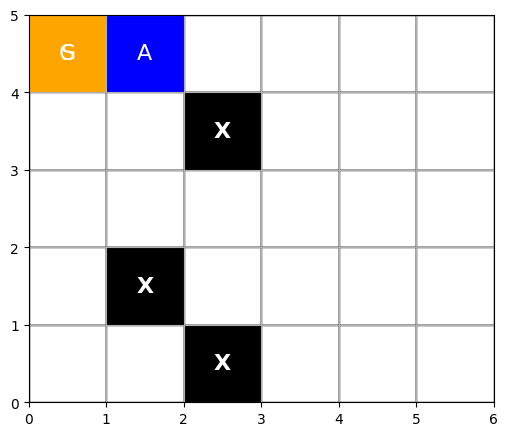

<Figure size 640x480 with 0 Axes>

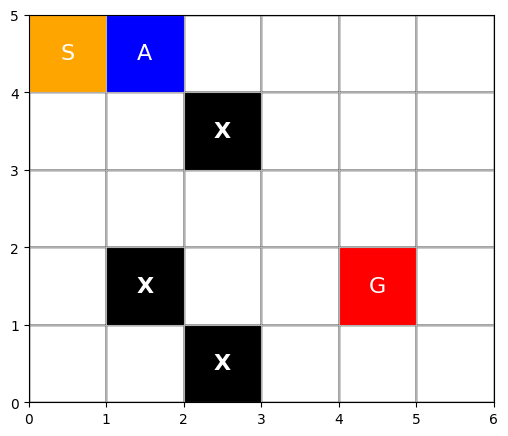

<Figure size 640x480 with 0 Axes>

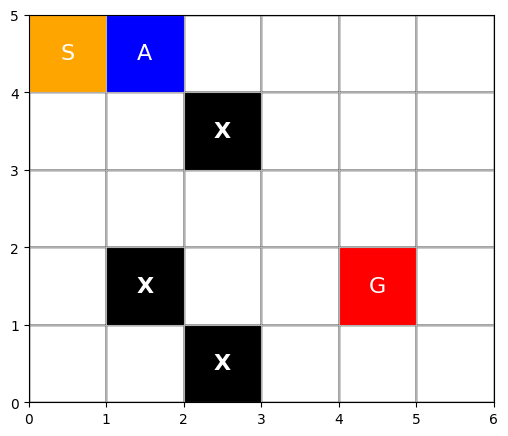

<Figure size 640x480 with 0 Axes>

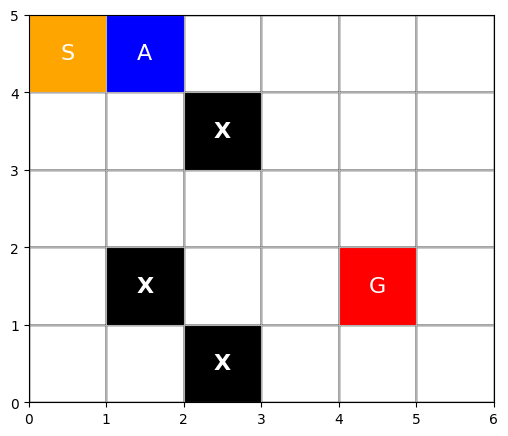

<Figure size 640x480 with 0 Axes>

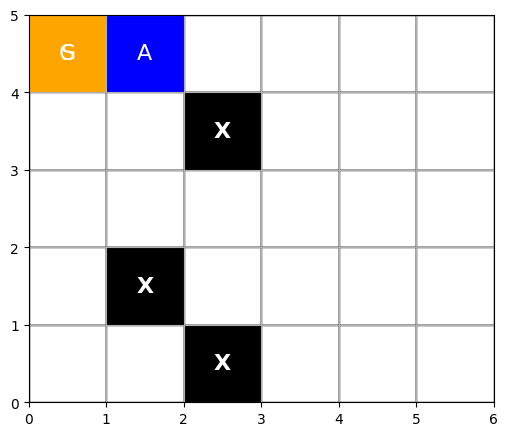

<Figure size 640x480 with 0 Axes>

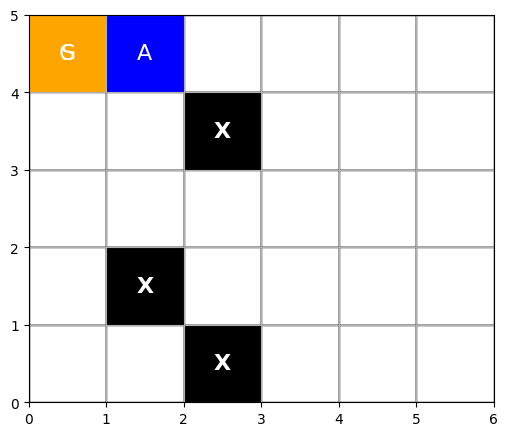

<Figure size 640x480 with 0 Axes>

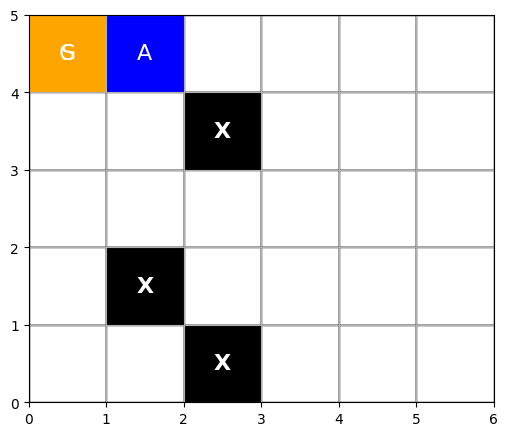

<Figure size 640x480 with 0 Axes>

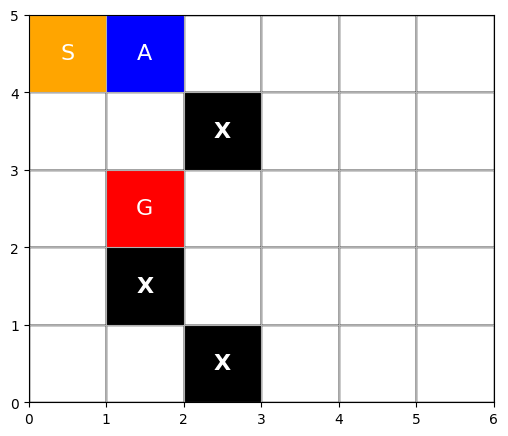

<Figure size 640x480 with 0 Axes>

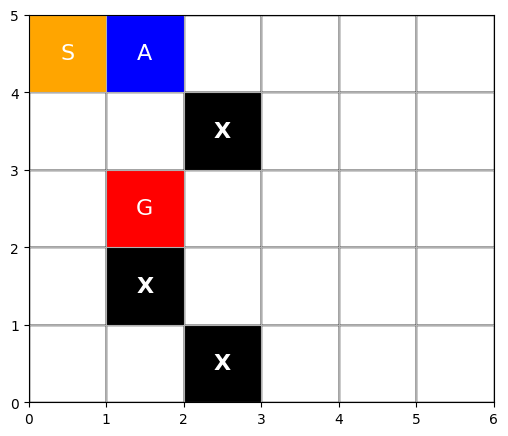

<Figure size 640x480 with 0 Axes>

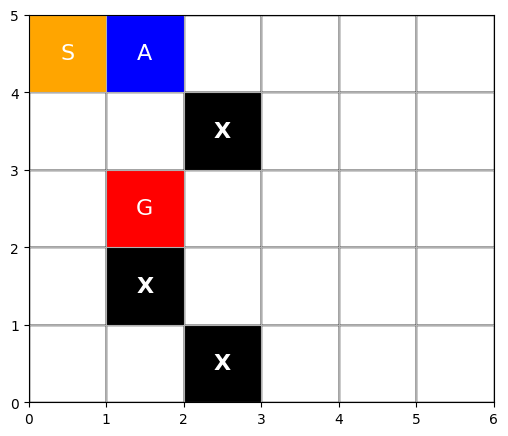

<Figure size 640x480 with 0 Axes>

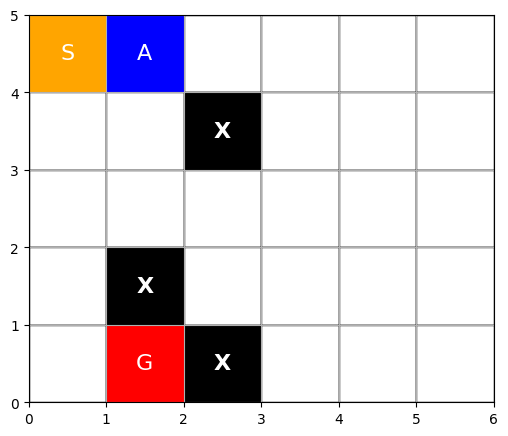

<Figure size 640x480 with 0 Axes>

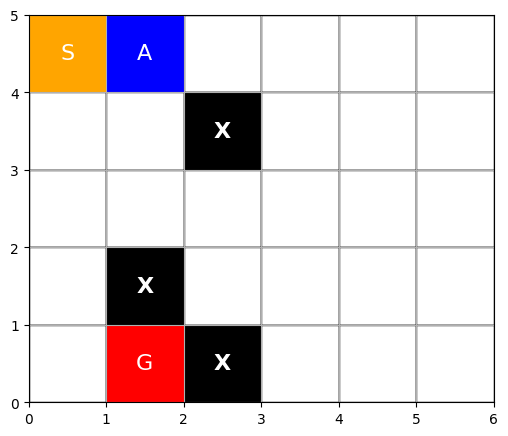

<Figure size 640x480 with 0 Axes>

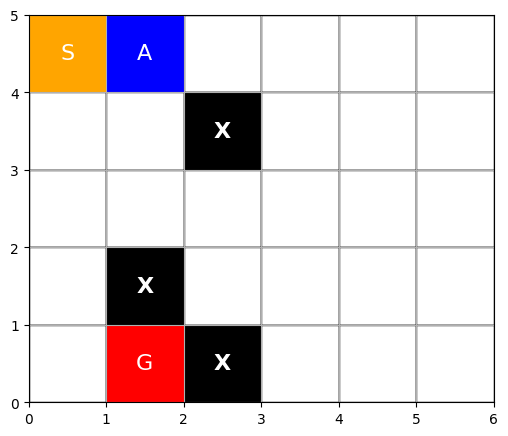

<Figure size 640x480 with 0 Axes>

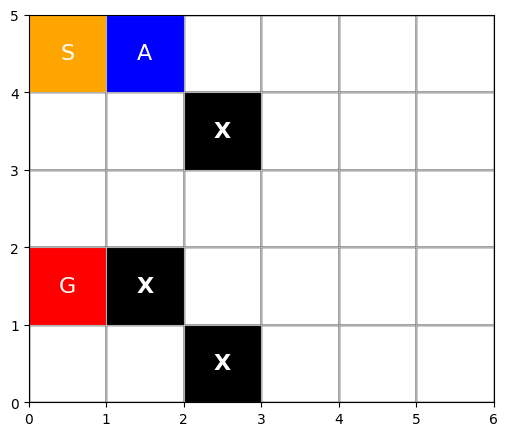

<Figure size 640x480 with 0 Axes>

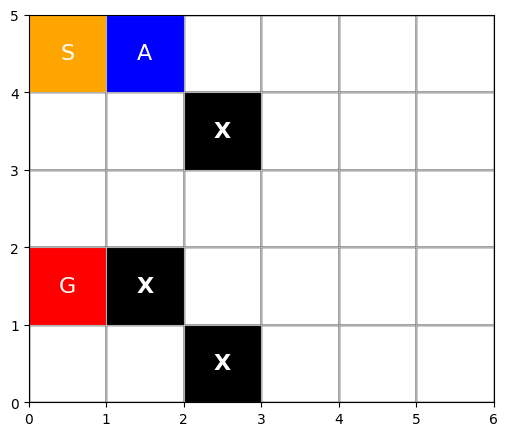

<Figure size 640x480 with 0 Axes>

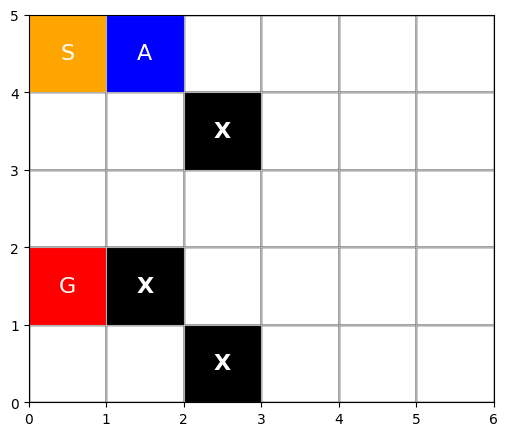

<Figure size 640x480 with 0 Axes>

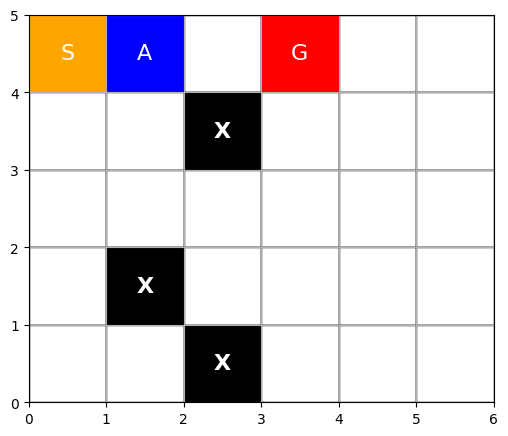

<Figure size 640x480 with 0 Axes>

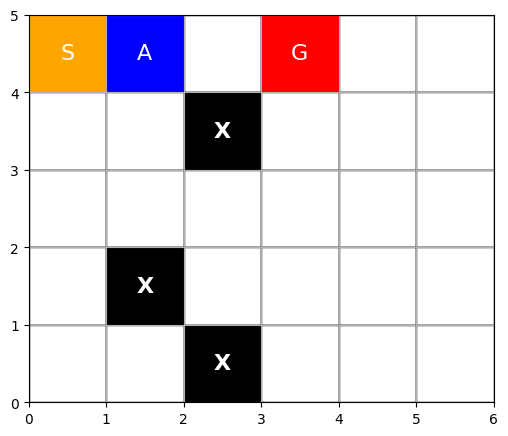

<Figure size 640x480 with 0 Axes>

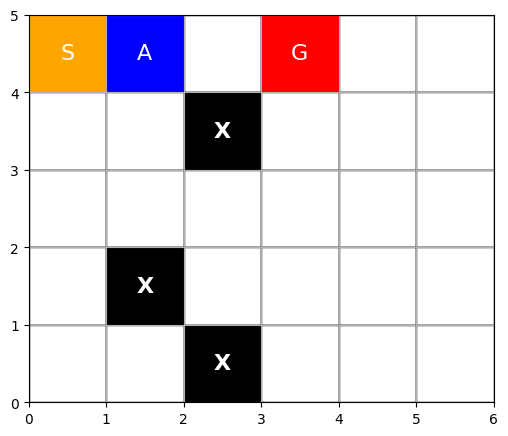

<Figure size 640x480 with 0 Axes>

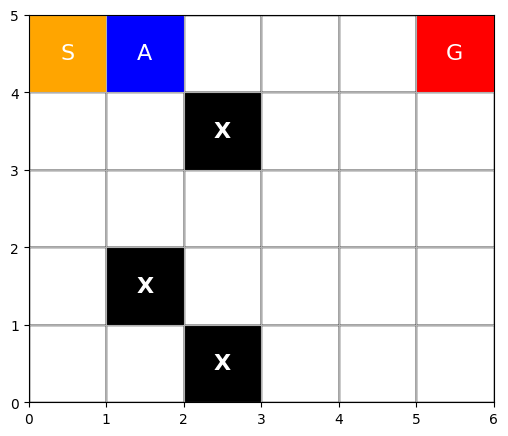

<Figure size 640x480 with 0 Axes>

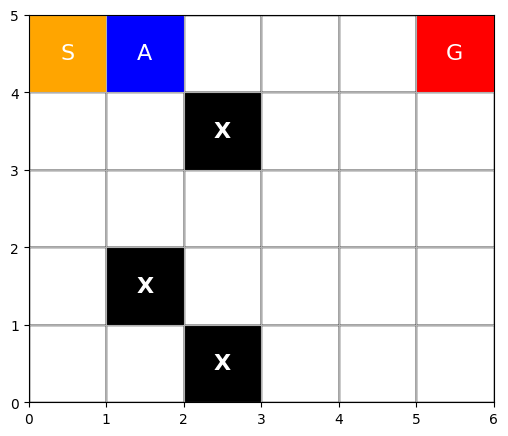

<Figure size 640x480 with 0 Axes>

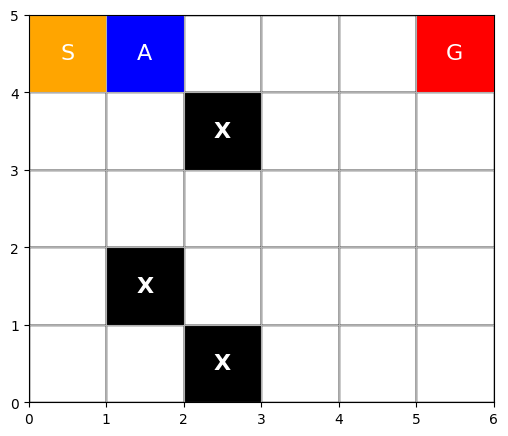

<Figure size 640x480 with 0 Axes>

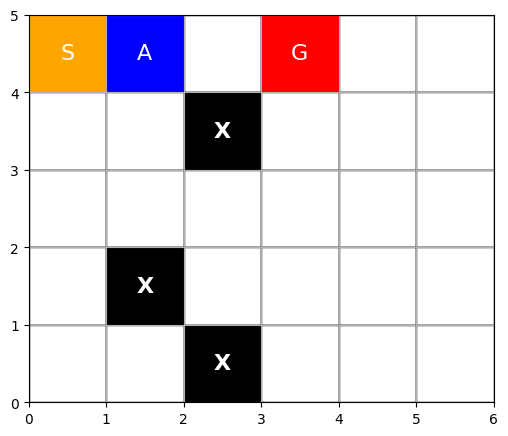

<Figure size 640x480 with 0 Axes>

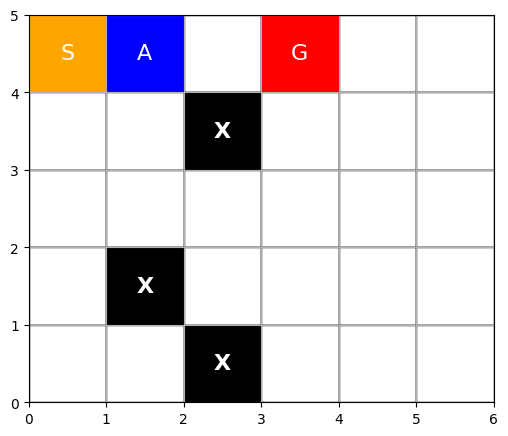

<Figure size 640x480 with 0 Axes>

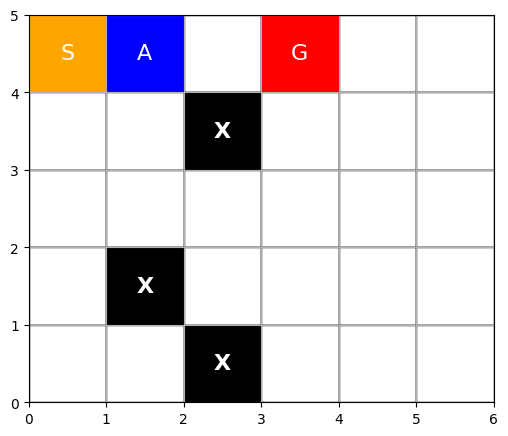

<Figure size 640x480 with 0 Axes>

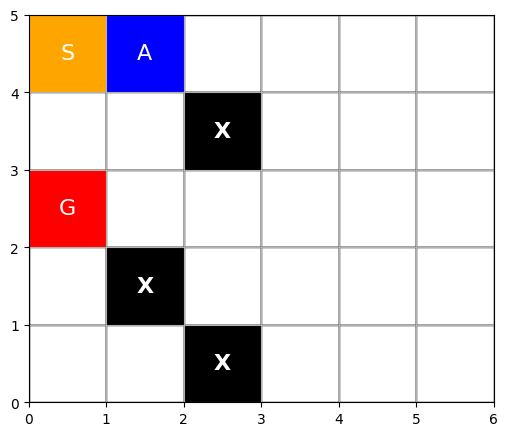

<Figure size 640x480 with 0 Axes>

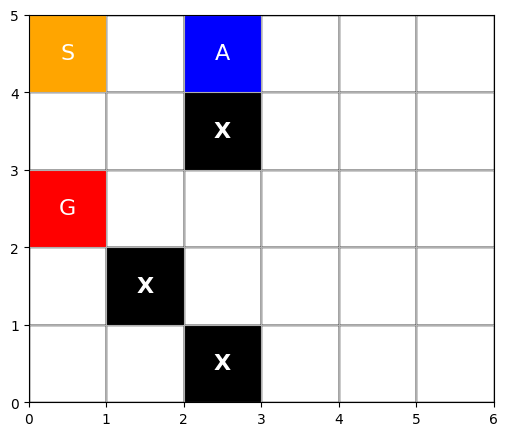

<Figure size 640x480 with 0 Axes>

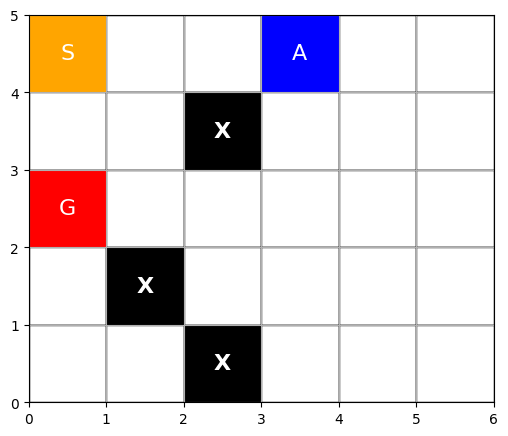

<Figure size 640x480 with 0 Axes>

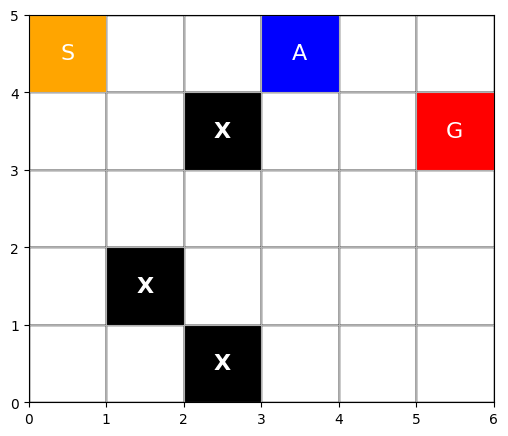

<Figure size 640x480 with 0 Axes>

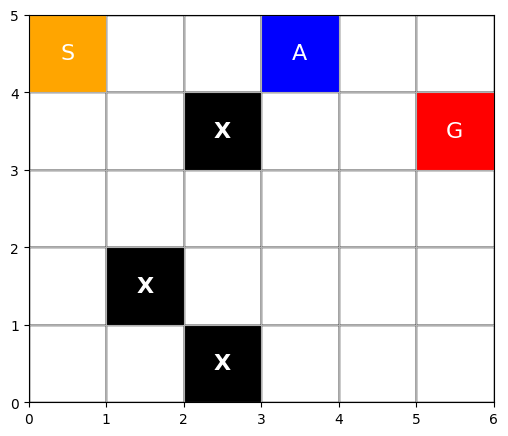

<Figure size 640x480 with 0 Axes>

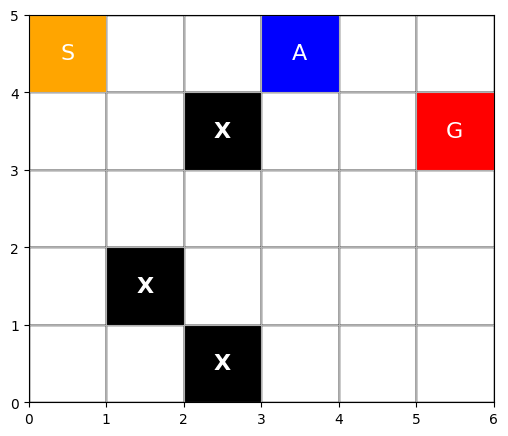

<Figure size 640x480 with 0 Axes>

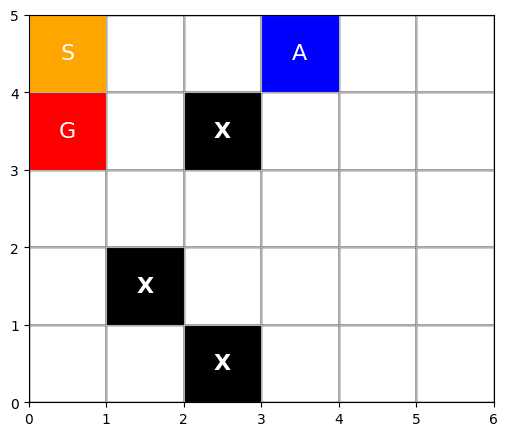

<Figure size 640x480 with 0 Axes>

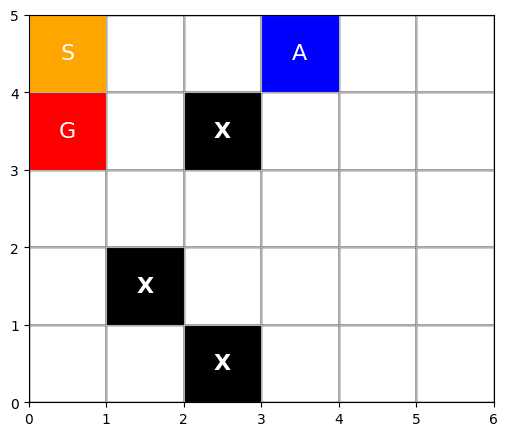

<Figure size 640x480 with 0 Axes>

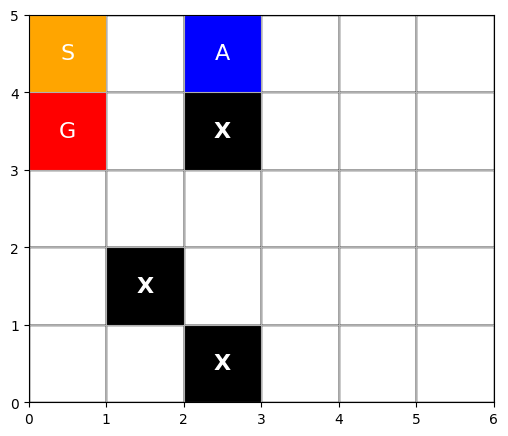

<Figure size 640x480 with 0 Axes>

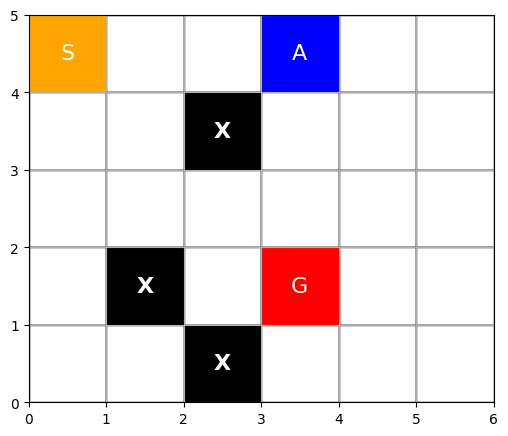

<Figure size 640x480 with 0 Axes>

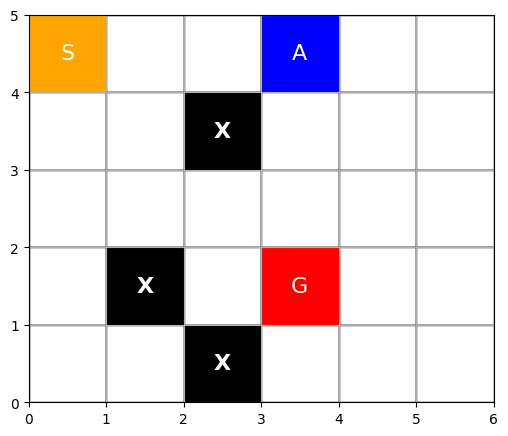

<Figure size 640x480 with 0 Axes>

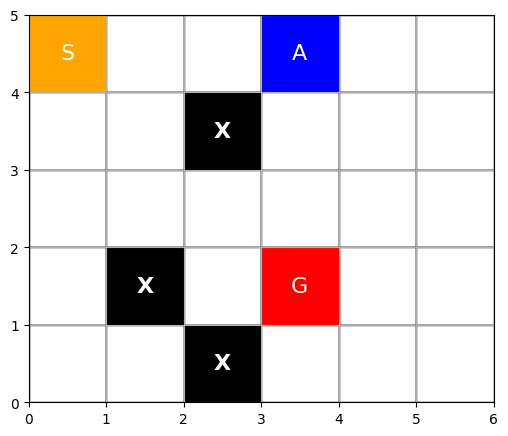

<Figure size 640x480 with 0 Axes>

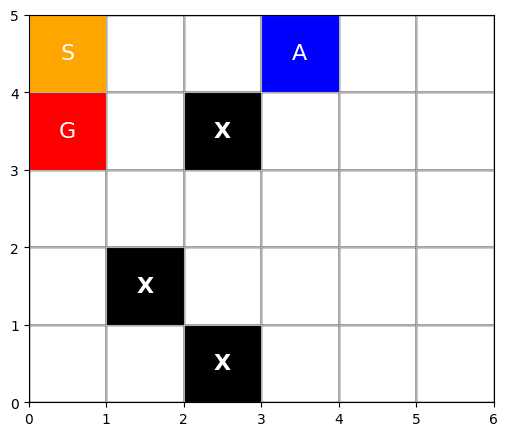

<Figure size 640x480 with 0 Axes>

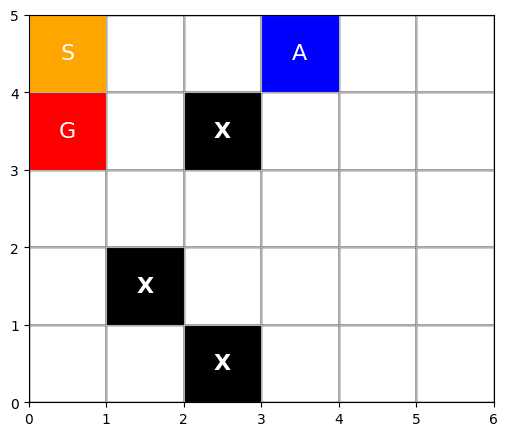

<Figure size 640x480 with 0 Axes>

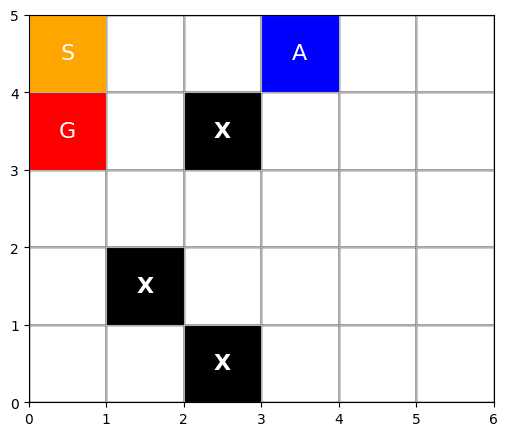

<Figure size 640x480 with 0 Axes>

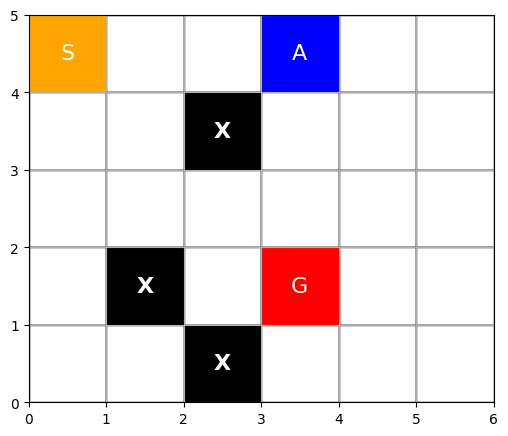

<Figure size 640x480 with 0 Axes>

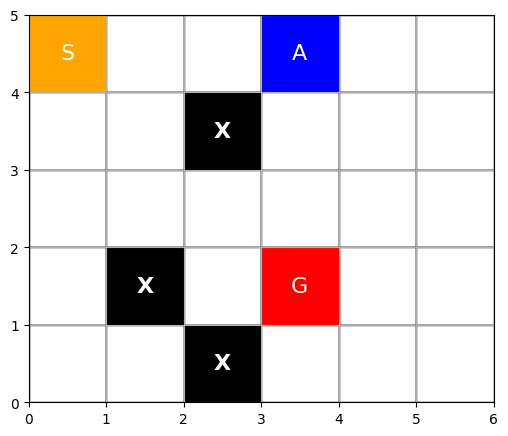

<Figure size 640x480 with 0 Axes>

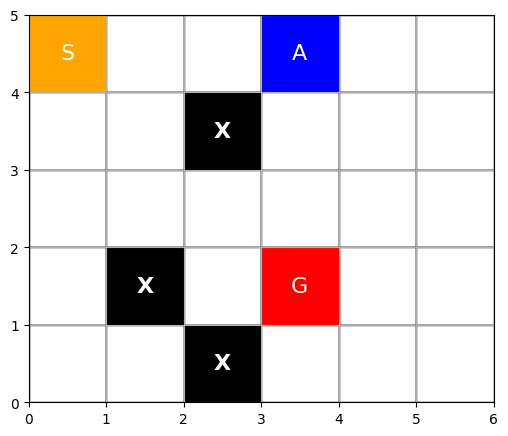

<Figure size 640x480 with 0 Axes>

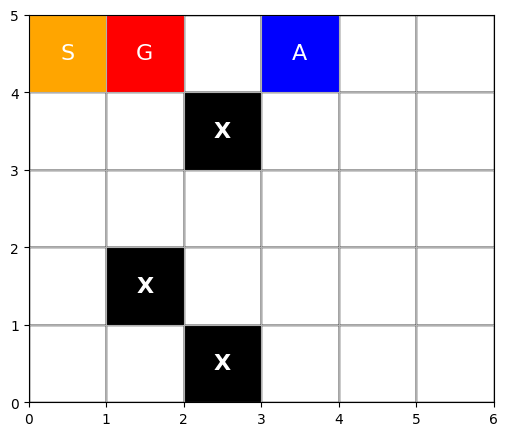

<Figure size 640x480 with 0 Axes>

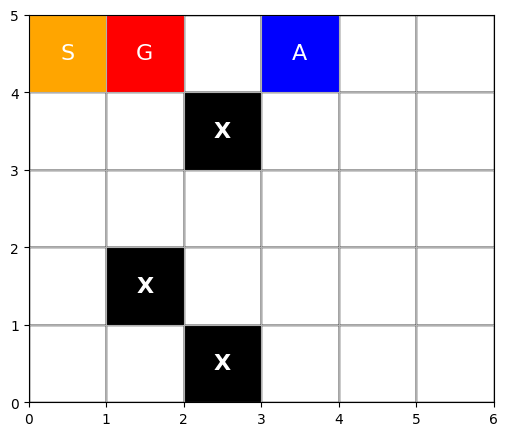

<Figure size 640x480 with 0 Axes>

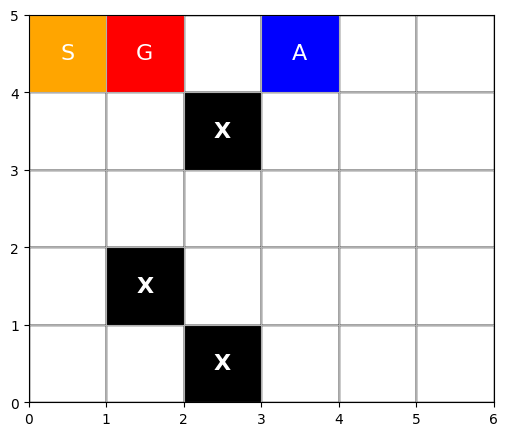

<Figure size 640x480 with 0 Axes>

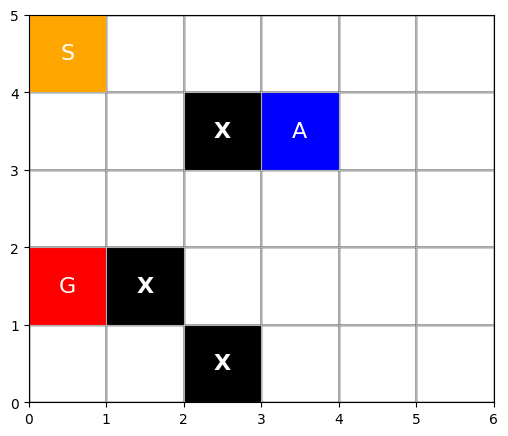

<Figure size 640x480 with 0 Axes>

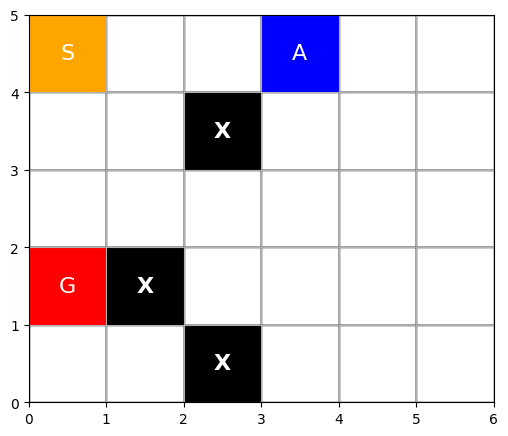

<Figure size 640x480 with 0 Axes>

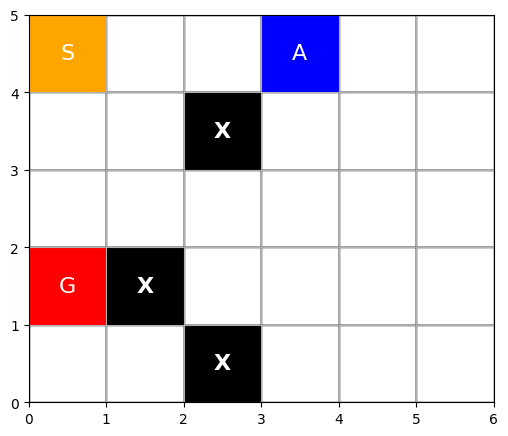

<Figure size 640x480 with 0 Axes>

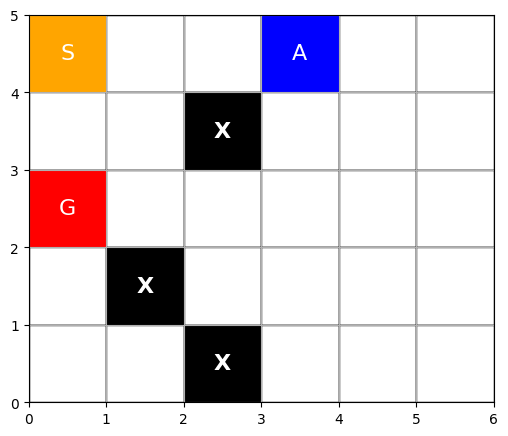

<Figure size 640x480 with 0 Axes>

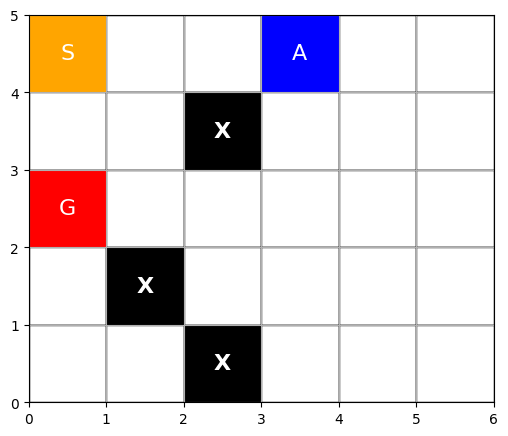

<Figure size 640x480 with 0 Axes>

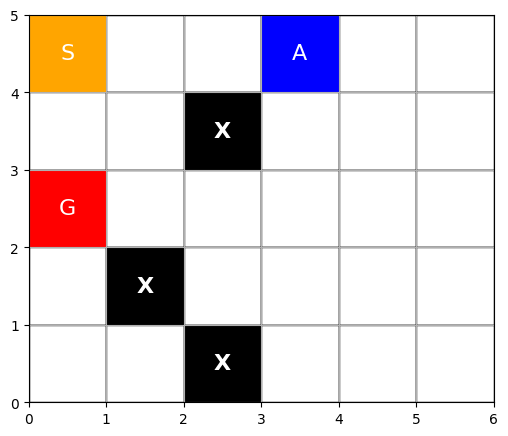

<Figure size 640x480 with 0 Axes>

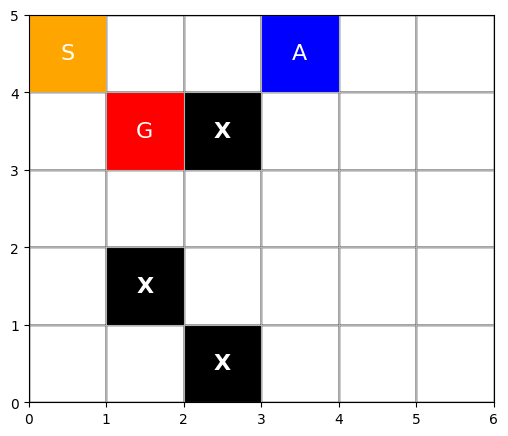

<Figure size 640x480 with 0 Axes>

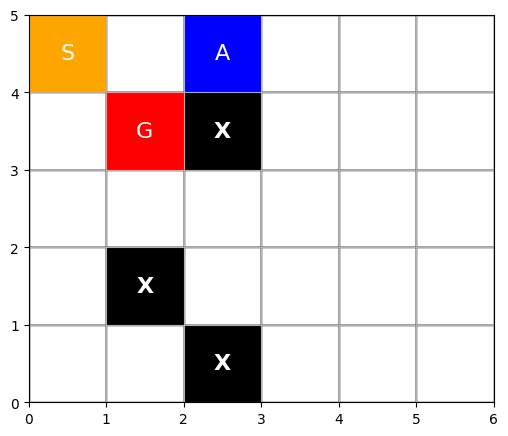

<Figure size 640x480 with 0 Axes>

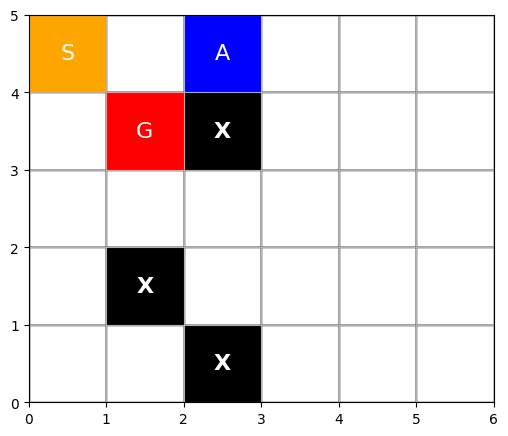

<Figure size 640x480 with 0 Axes>

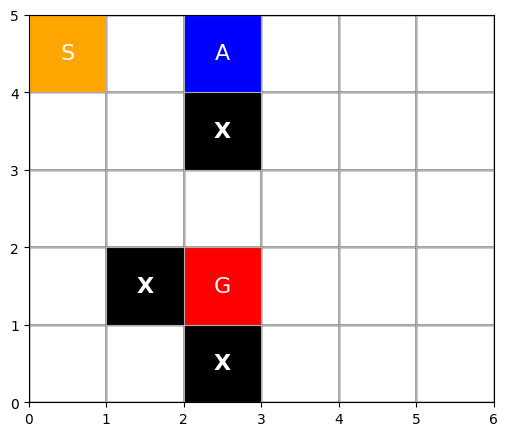

<Figure size 640x480 with 0 Axes>

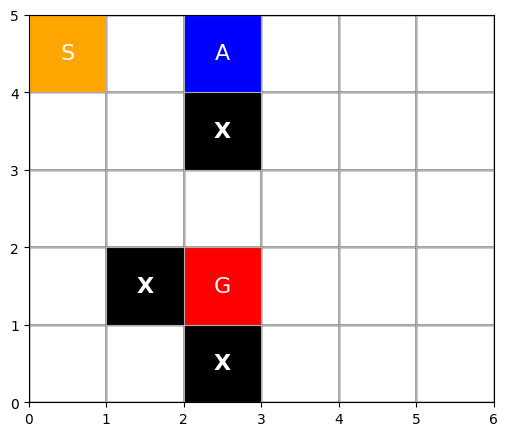

<Figure size 640x480 with 0 Axes>

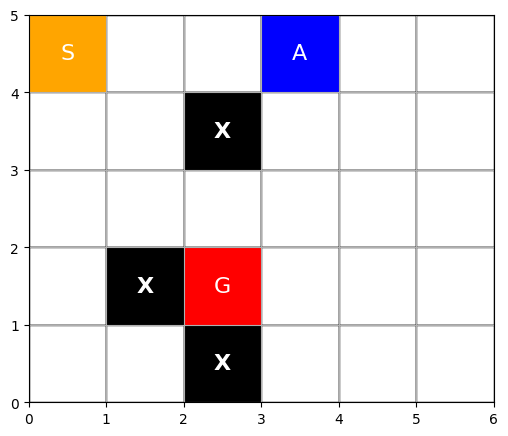

<Figure size 640x480 with 0 Axes>

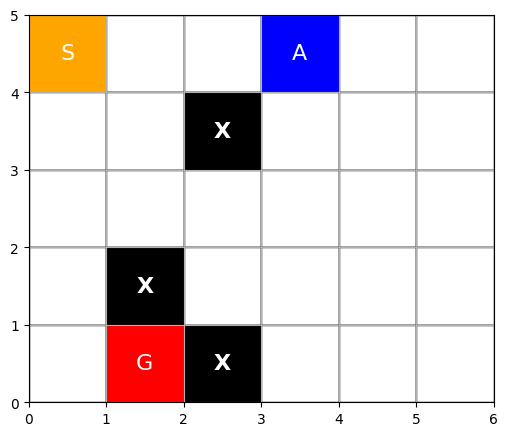

<Figure size 640x480 with 0 Axes>

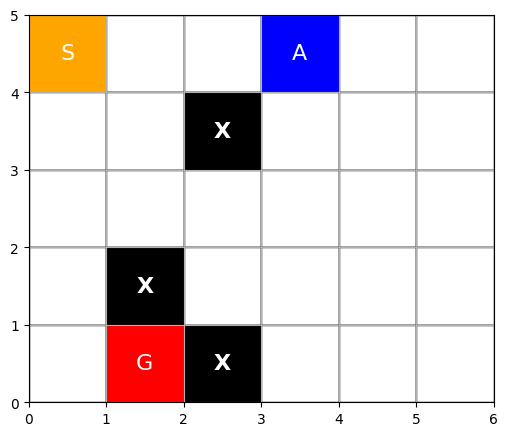

<Figure size 640x480 with 0 Axes>

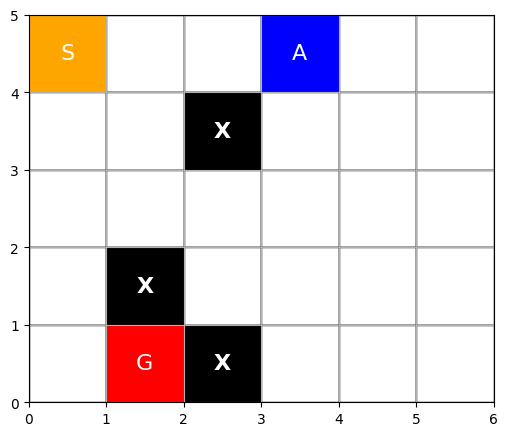

<Figure size 640x480 with 0 Axes>

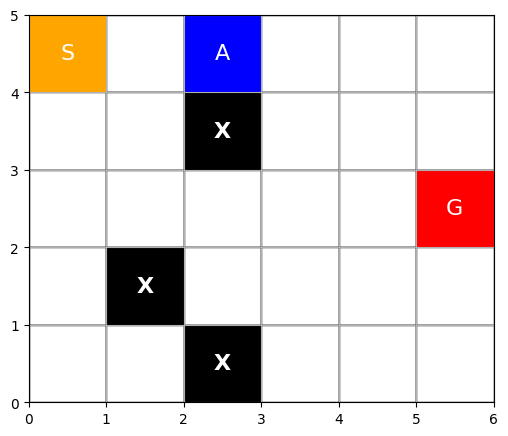

<Figure size 640x480 with 0 Axes>

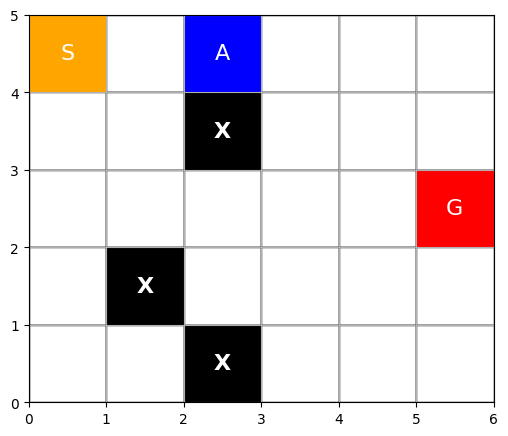

<Figure size 640x480 with 0 Axes>

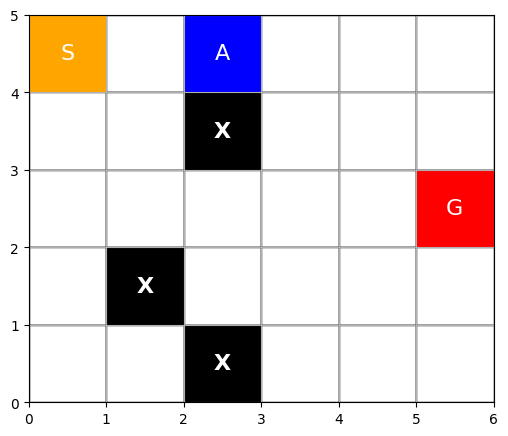

<Figure size 640x480 with 0 Axes>

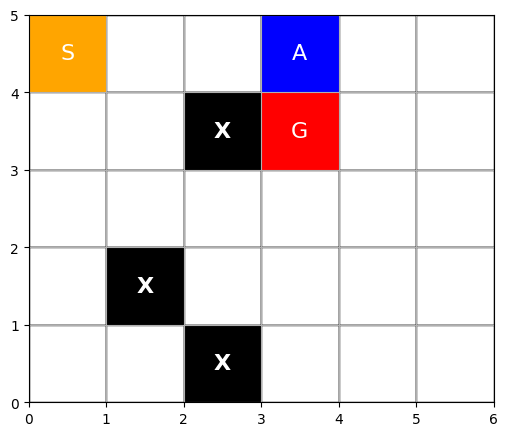

<Figure size 640x480 with 0 Axes>

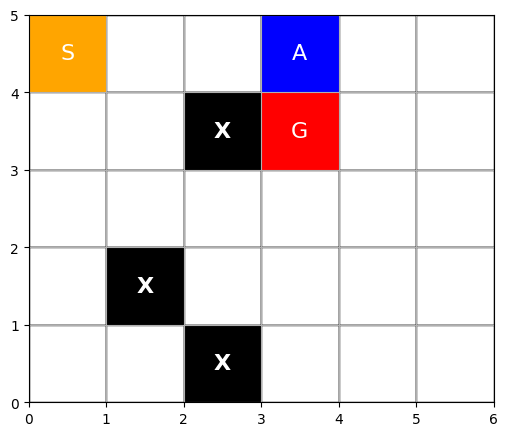

<Figure size 640x480 with 0 Axes>

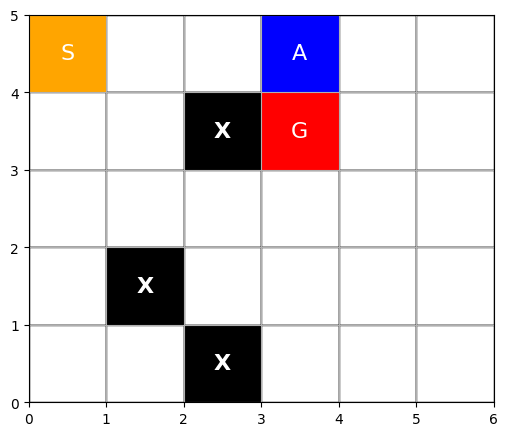

<Figure size 640x480 with 0 Axes>

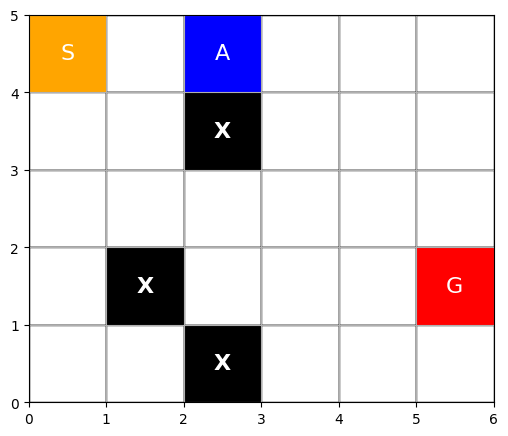

<Figure size 640x480 with 0 Axes>

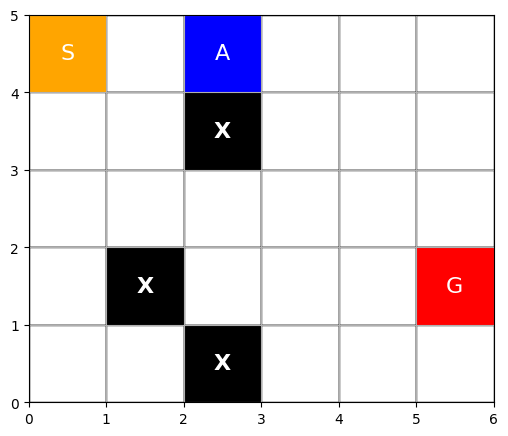

<Figure size 640x480 with 0 Axes>

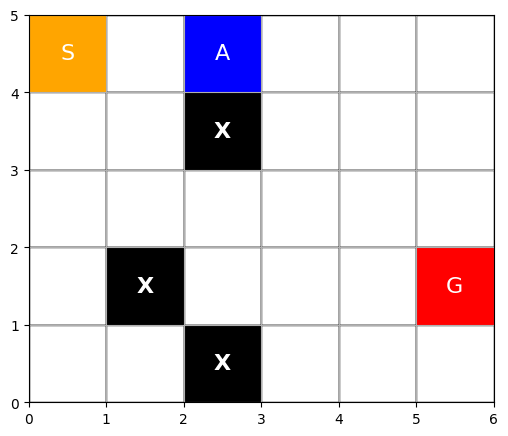

<Figure size 640x480 with 0 Axes>

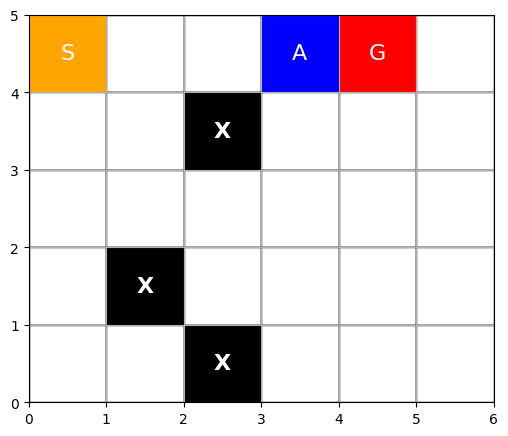

<Figure size 640x480 with 0 Axes>

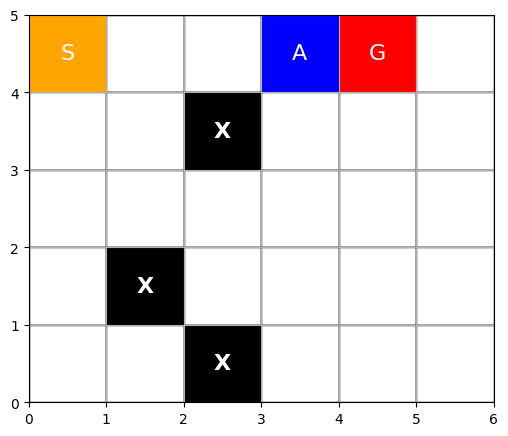

<Figure size 640x480 with 0 Axes>

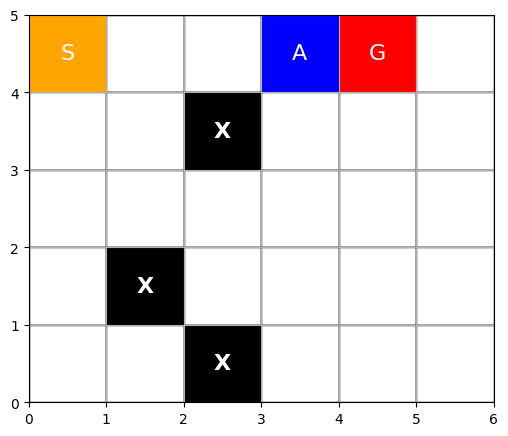

<Figure size 640x480 with 0 Axes>

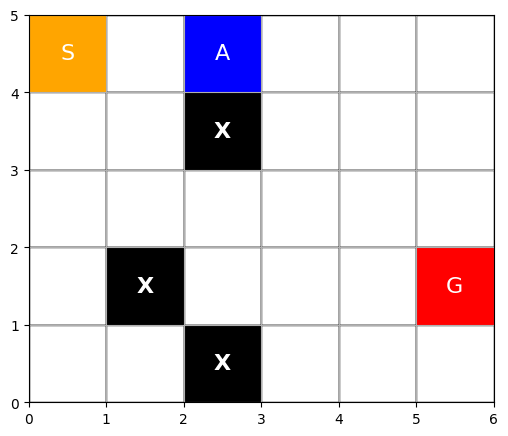

<Figure size 640x480 with 0 Axes>

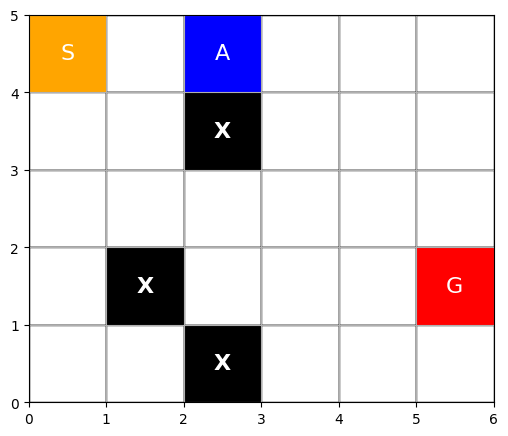

<Figure size 640x480 with 0 Axes>

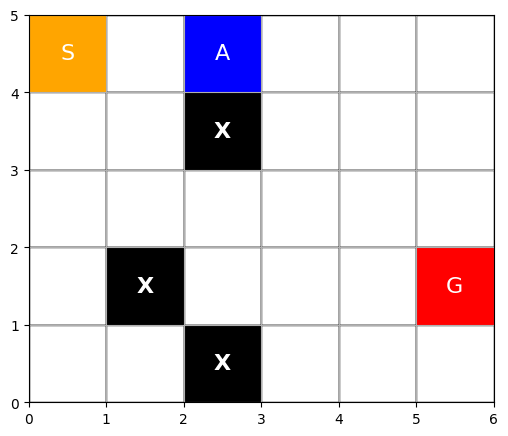

<Figure size 640x480 with 0 Axes>

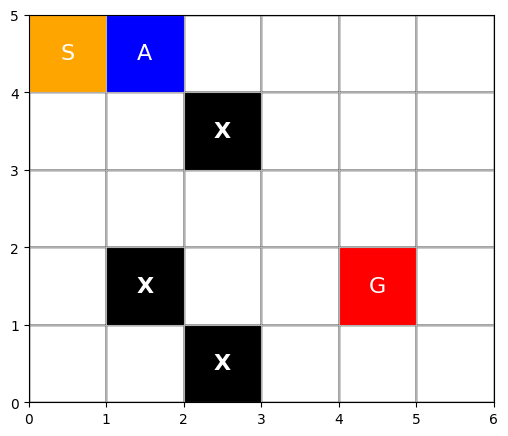

<Figure size 640x480 with 0 Axes>

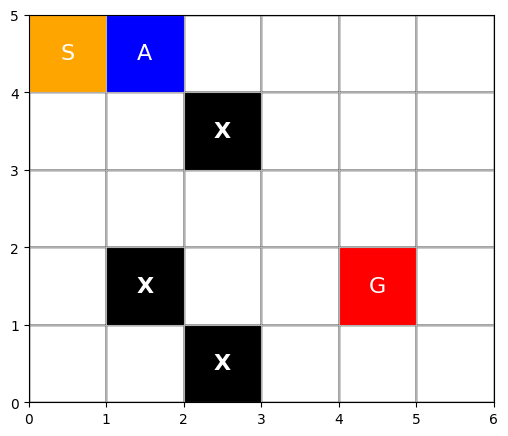

<Figure size 640x480 with 0 Axes>

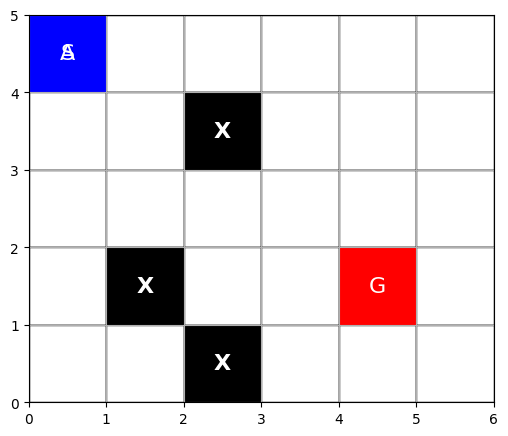

<Figure size 640x480 with 0 Axes>

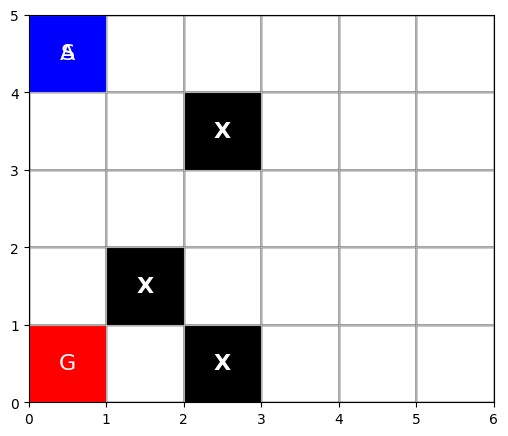

<Figure size 640x480 with 0 Axes>

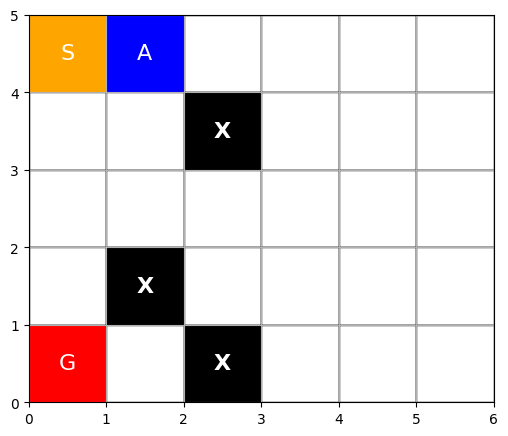

<Figure size 640x480 with 0 Axes>

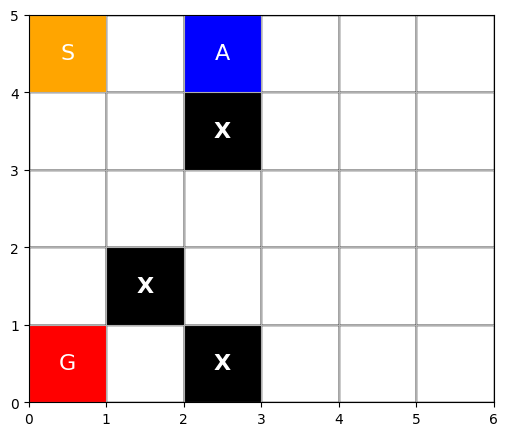

<Figure size 640x480 with 0 Axes>

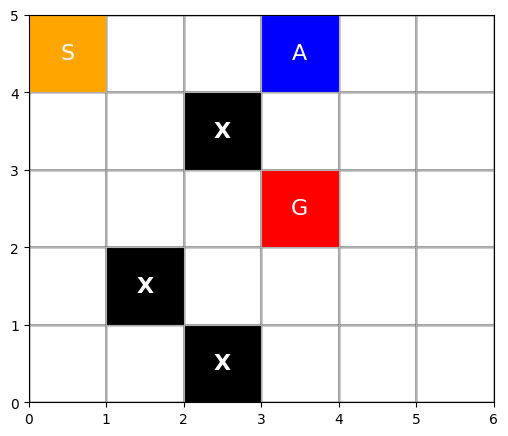

<Figure size 640x480 with 0 Axes>

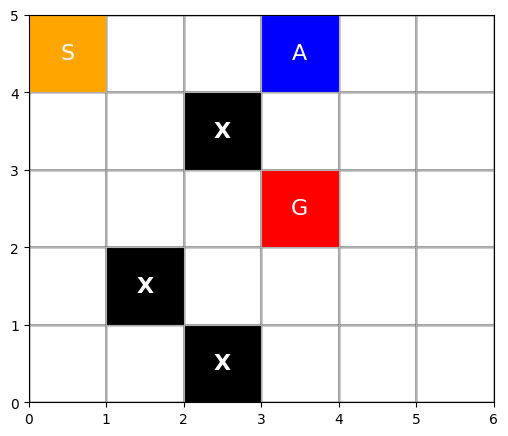

<Figure size 640x480 with 0 Axes>

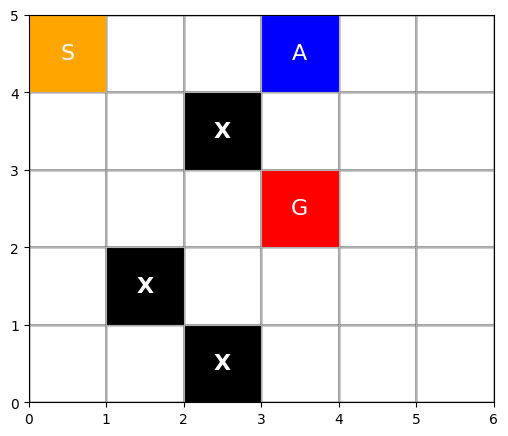

<Figure size 640x480 with 0 Axes>

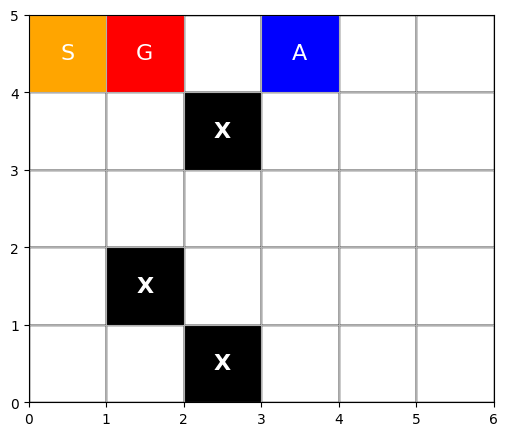

<Figure size 640x480 with 0 Axes>

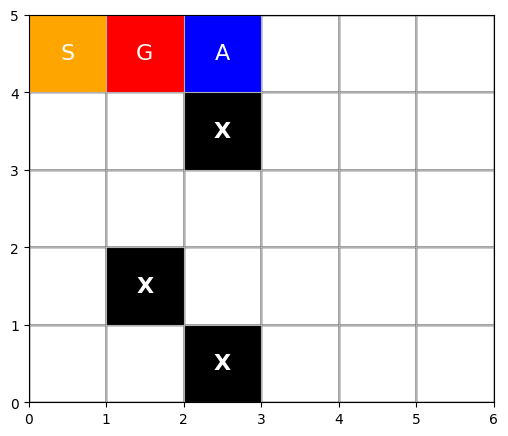

<Figure size 640x480 with 0 Axes>

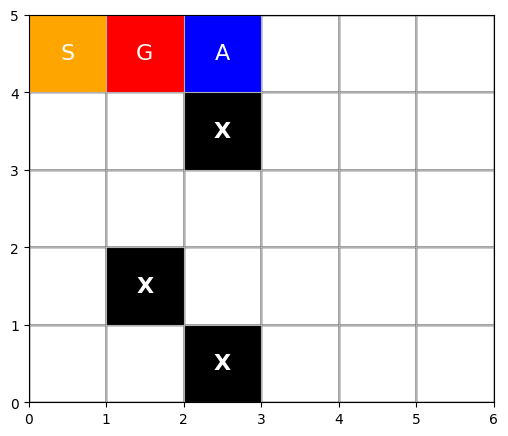

<Figure size 640x480 with 0 Axes>

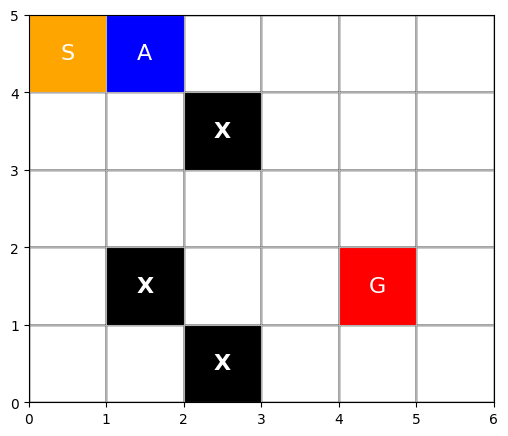

<Figure size 640x480 with 0 Axes>

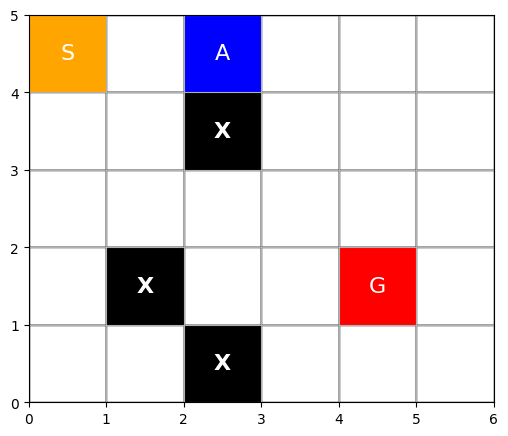

<Figure size 640x480 with 0 Axes>

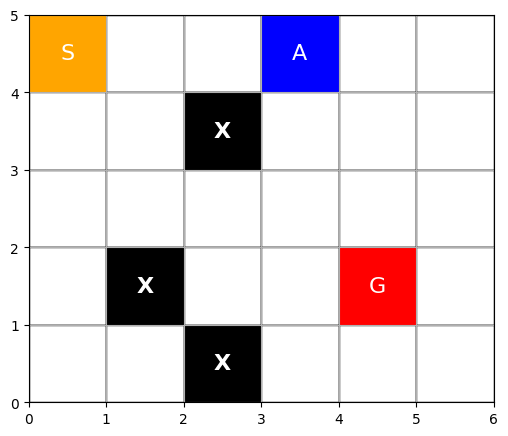

<Figure size 640x480 with 0 Axes>

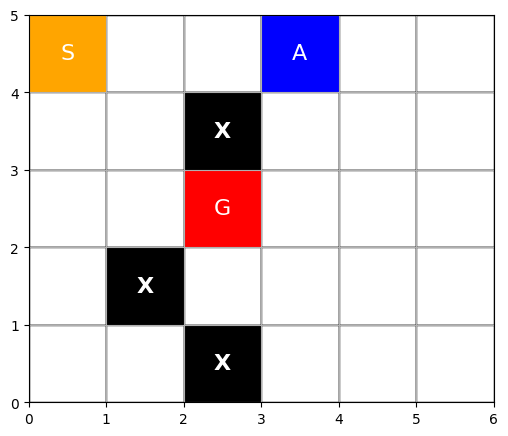

<Figure size 640x480 with 0 Axes>

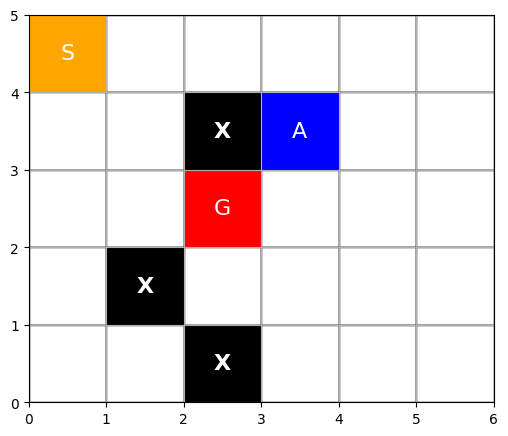

<Figure size 640x480 with 0 Axes>

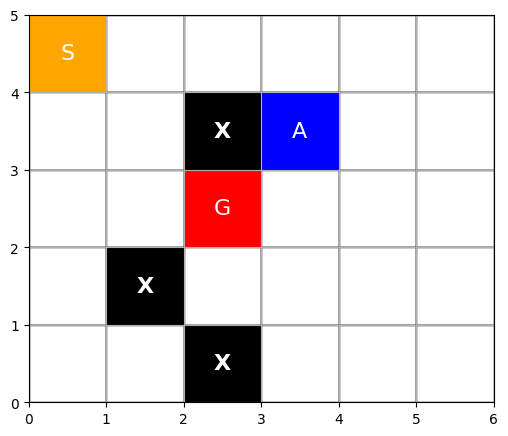

<Figure size 640x480 with 0 Axes>

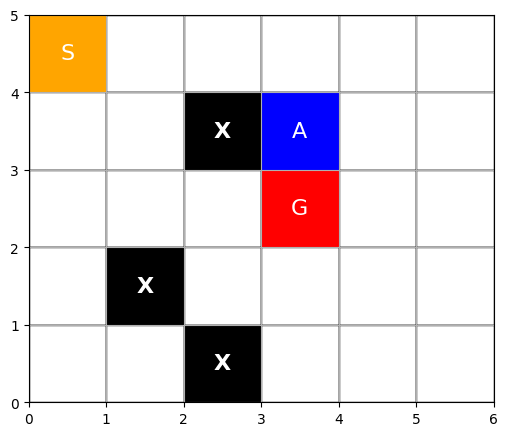

<Figure size 640x480 with 0 Axes>

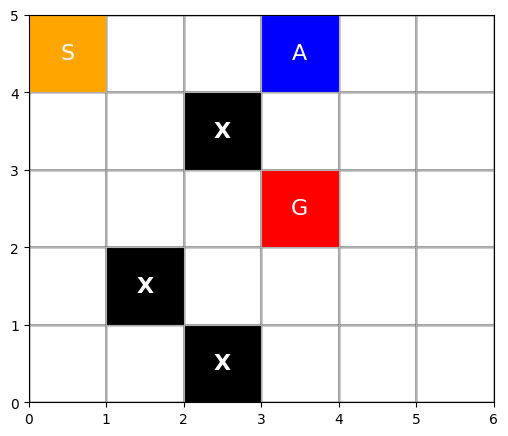

<Figure size 640x480 with 0 Axes>

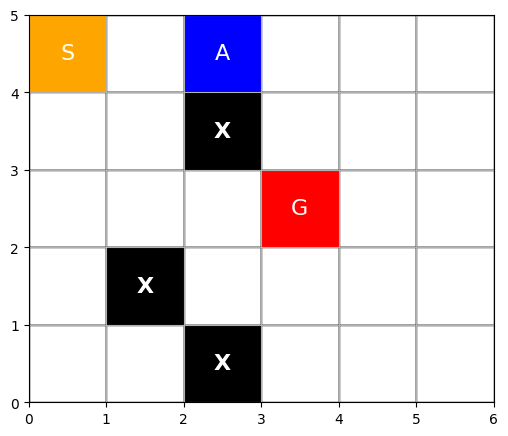

<Figure size 640x480 with 0 Axes>

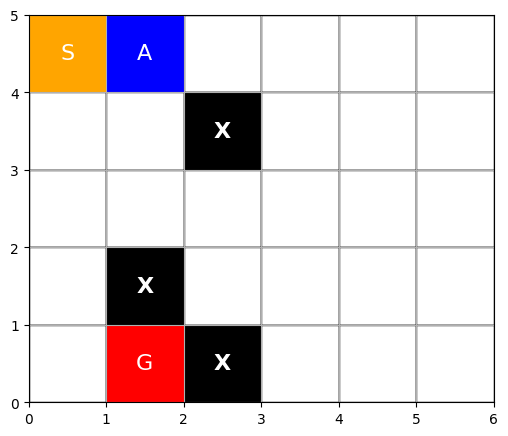

<Figure size 640x480 with 0 Axes>

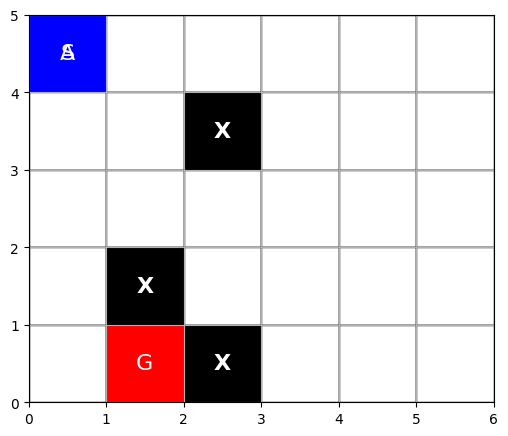

<Figure size 640x480 with 0 Axes>

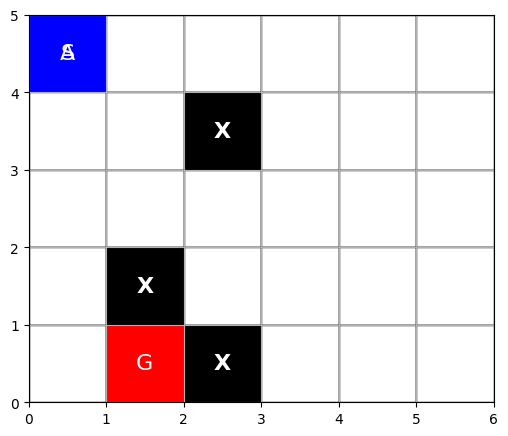

<Figure size 640x480 with 0 Axes>

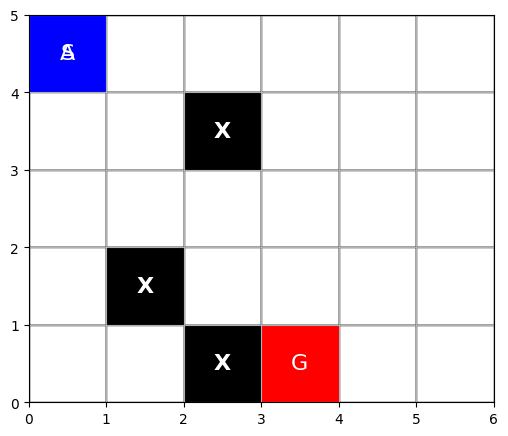

<Figure size 640x480 with 0 Axes>

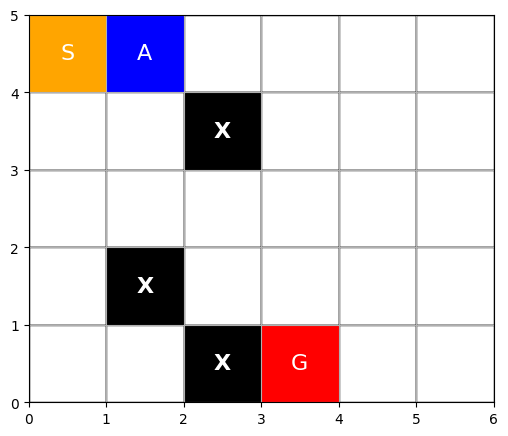

<Figure size 640x480 with 0 Axes>

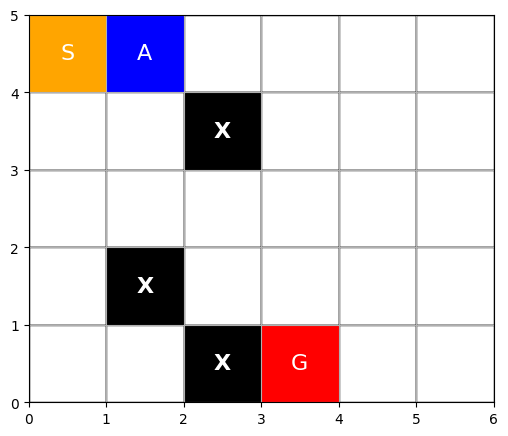

<Figure size 640x480 with 0 Axes>

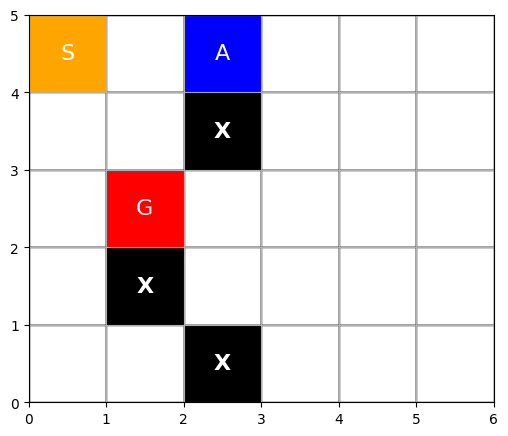

<Figure size 640x480 with 0 Axes>

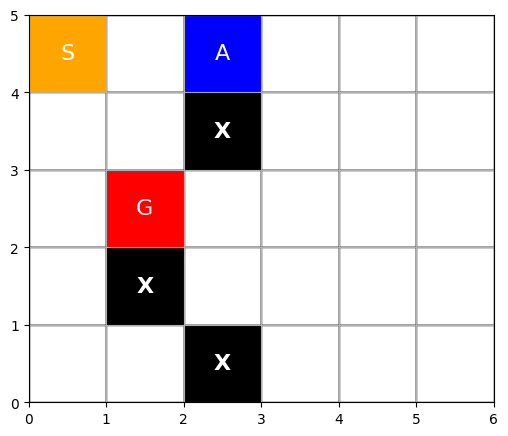

<Figure size 640x480 with 0 Axes>

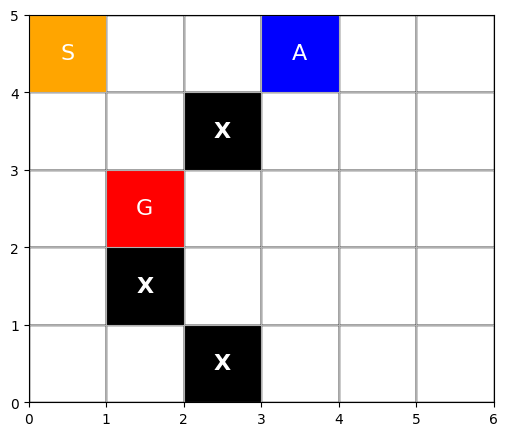

<Figure size 640x480 with 0 Axes>

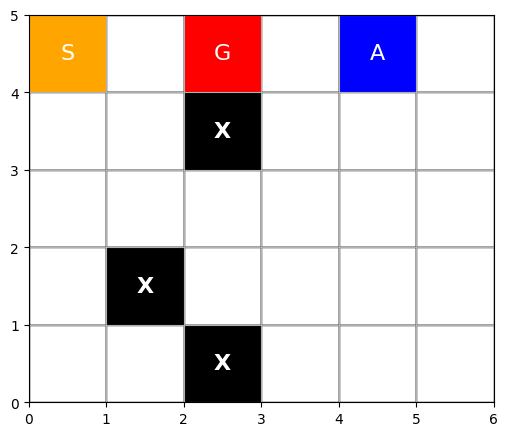

<Figure size 640x480 with 0 Axes>

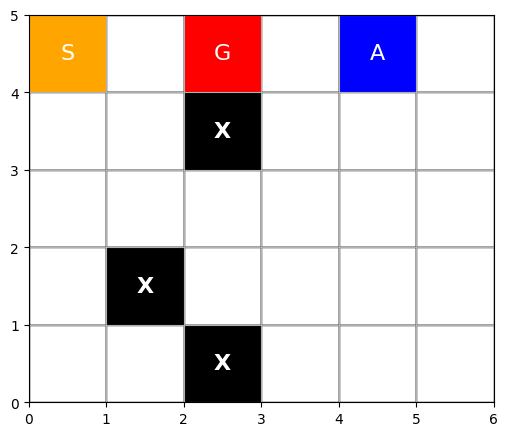

<Figure size 640x480 with 0 Axes>

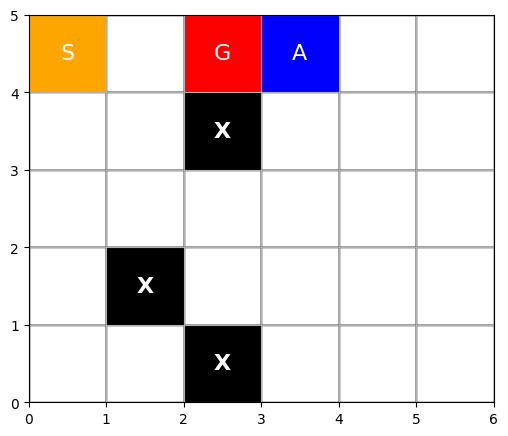

<Figure size 640x480 with 0 Axes>

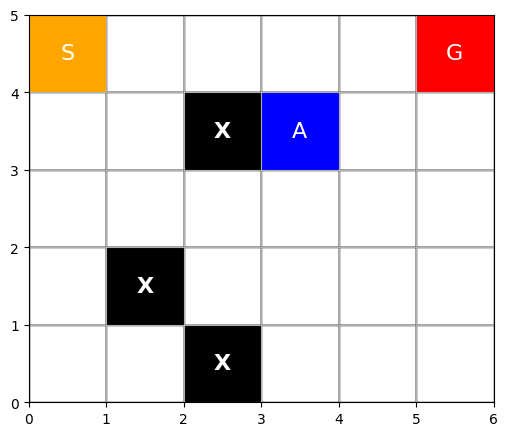

<Figure size 640x480 with 0 Axes>

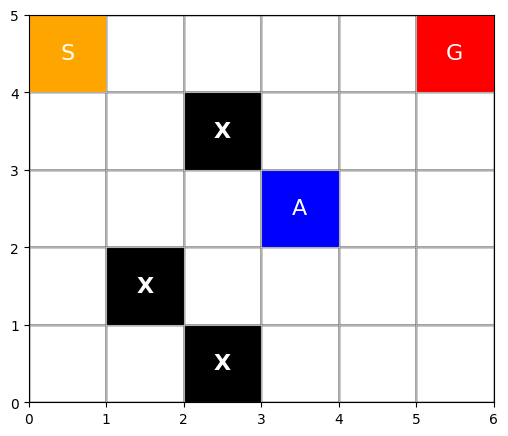

<Figure size 640x480 with 0 Axes>

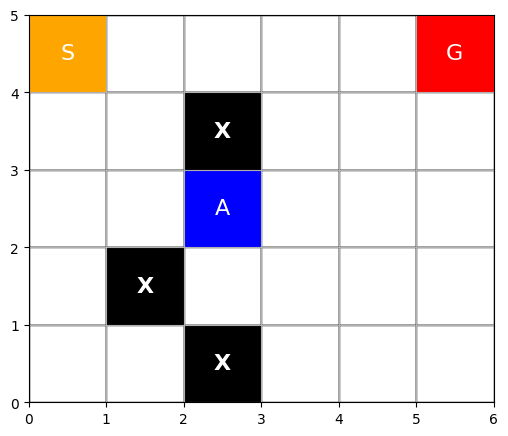

<Figure size 640x480 with 0 Axes>

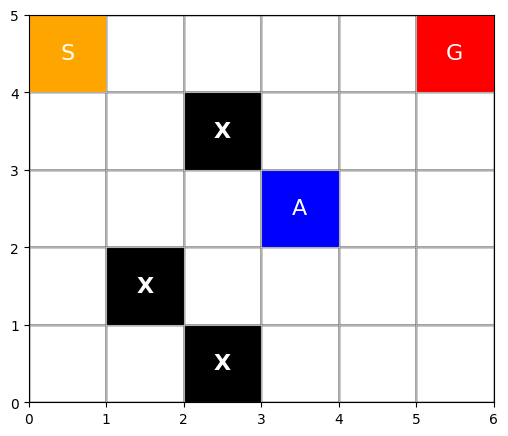

<Figure size 640x480 with 0 Axes>

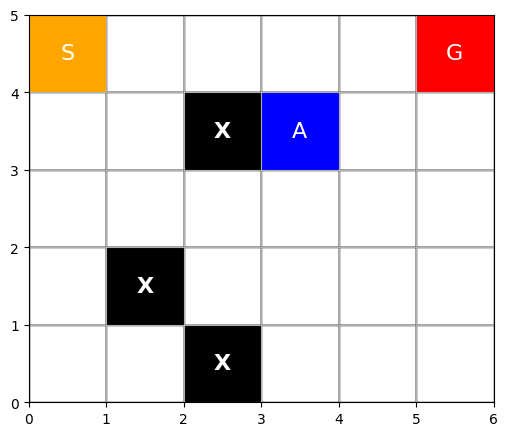

<Figure size 640x480 with 0 Axes>

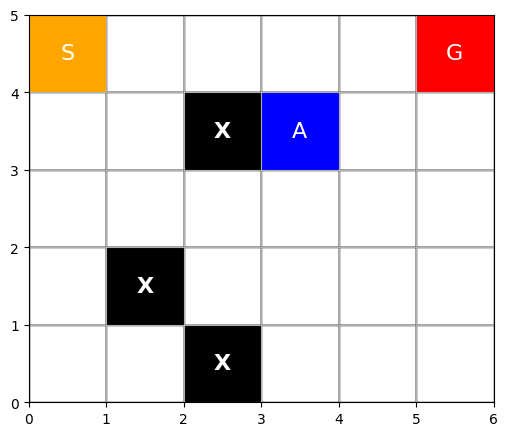

<Figure size 640x480 with 0 Axes>

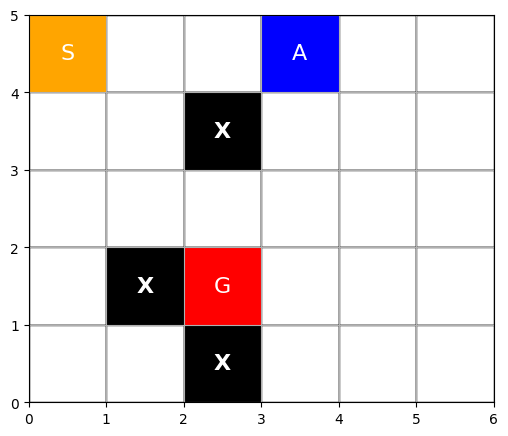

<Figure size 640x480 with 0 Axes>

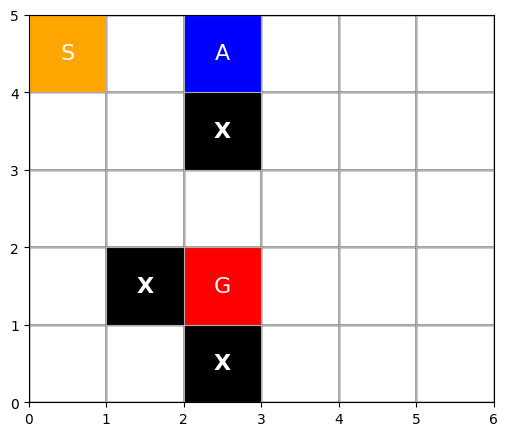

<Figure size 640x480 with 0 Axes>

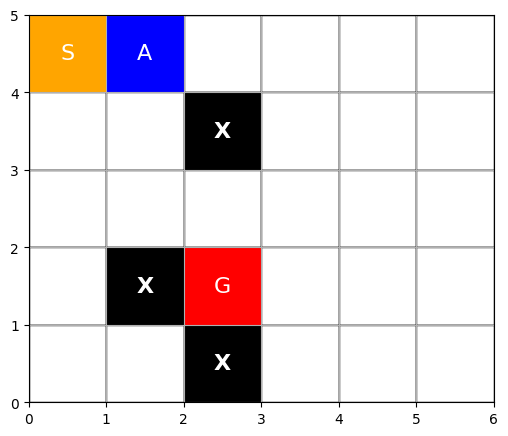

<Figure size 640x480 with 0 Axes>

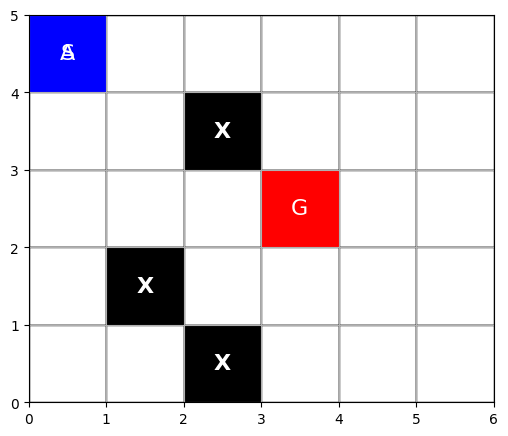

<Figure size 640x480 with 0 Axes>

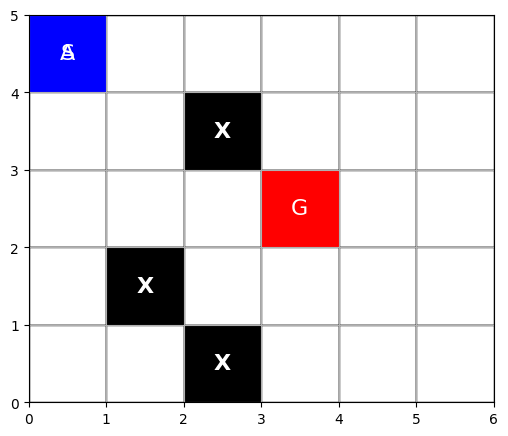

<Figure size 640x480 with 0 Axes>

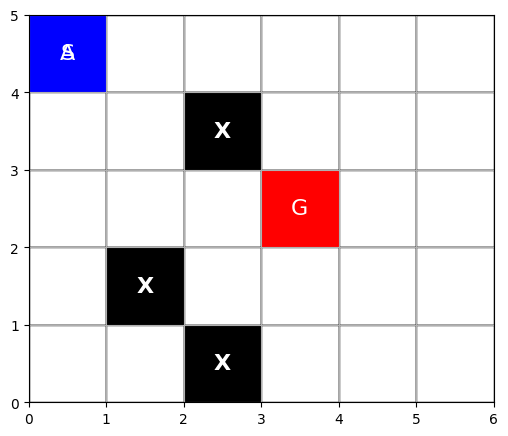

<Figure size 640x480 with 0 Axes>

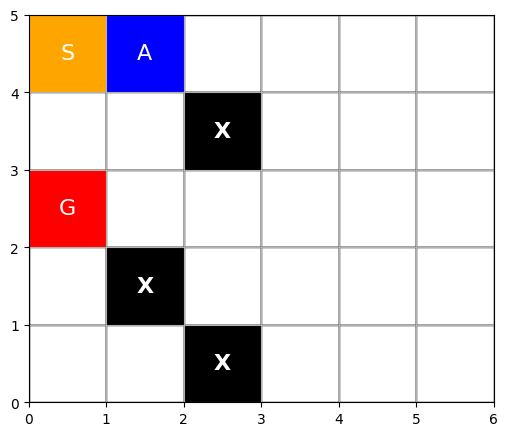

<Figure size 640x480 with 0 Axes>

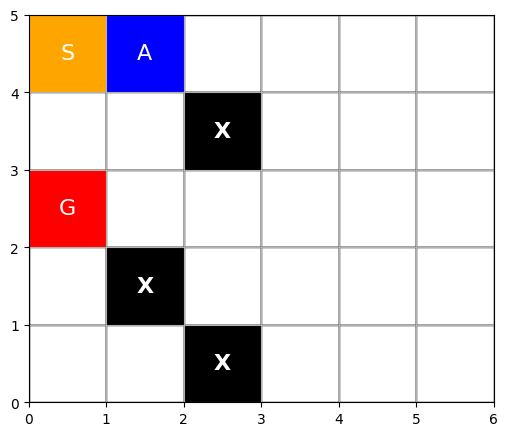

<Figure size 640x480 with 0 Axes>

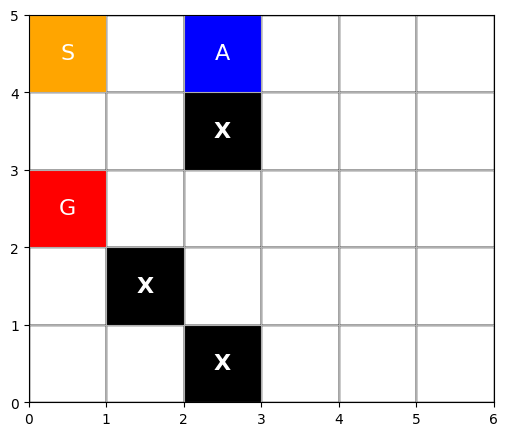

<Figure size 640x480 with 0 Axes>

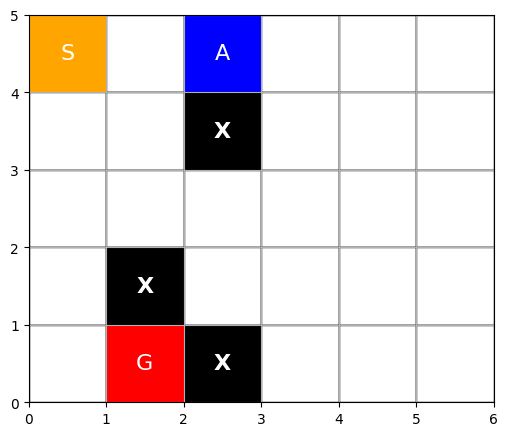

<Figure size 640x480 with 0 Axes>

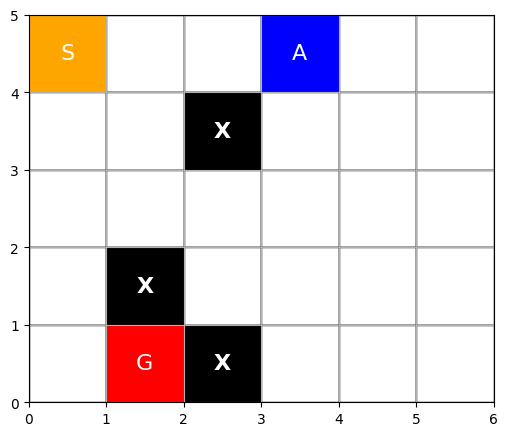

<Figure size 640x480 with 0 Axes>

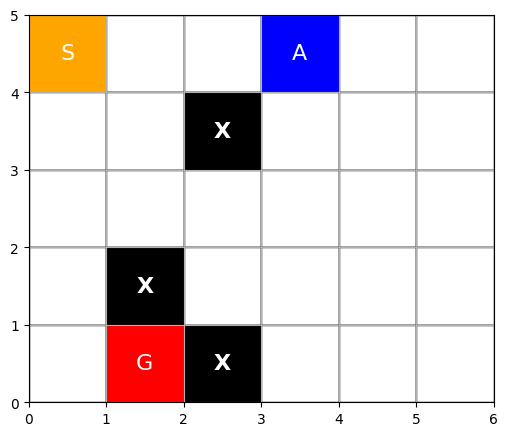

<Figure size 640x480 with 0 Axes>

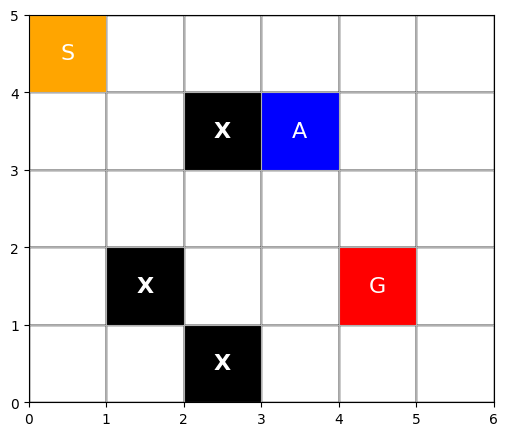

<Figure size 640x480 with 0 Axes>

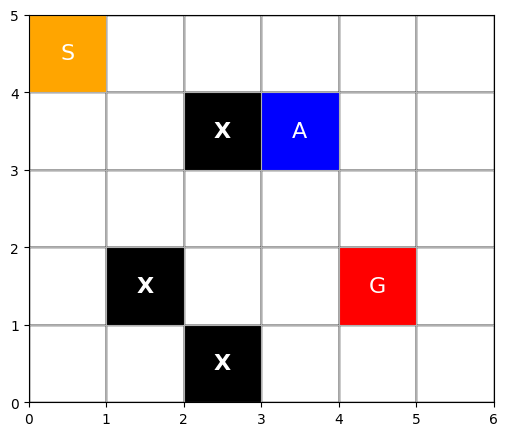

<Figure size 640x480 with 0 Axes>

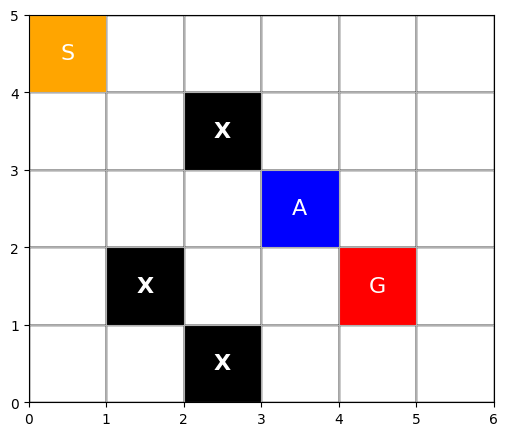

<Figure size 640x480 with 0 Axes>

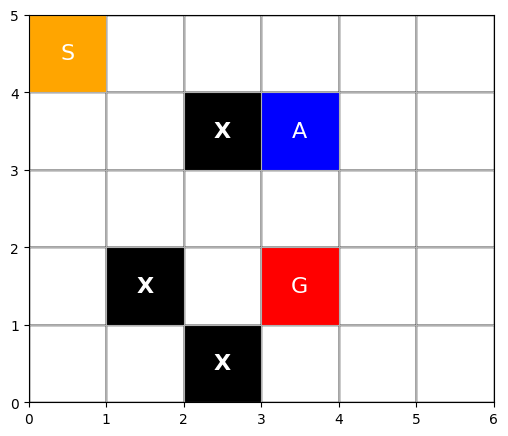

<Figure size 640x480 with 0 Axes>

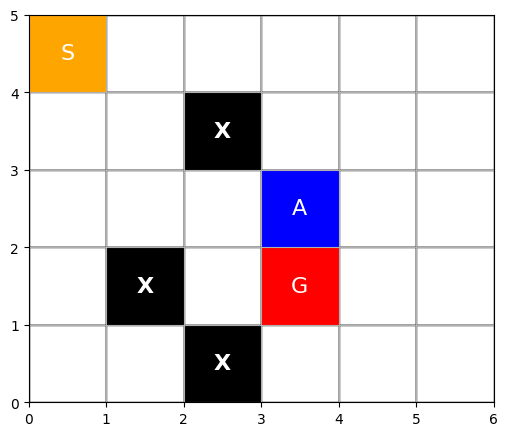

<Figure size 640x480 with 0 Axes>

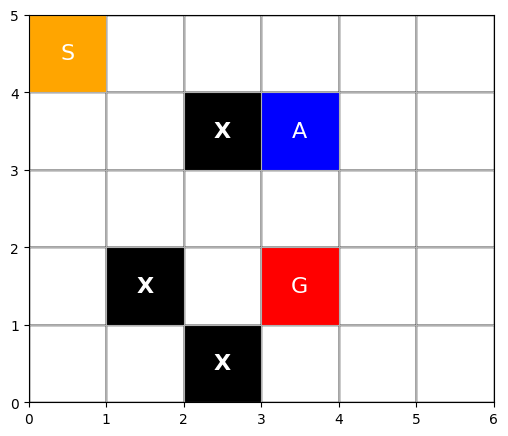

<Figure size 640x480 with 0 Axes>

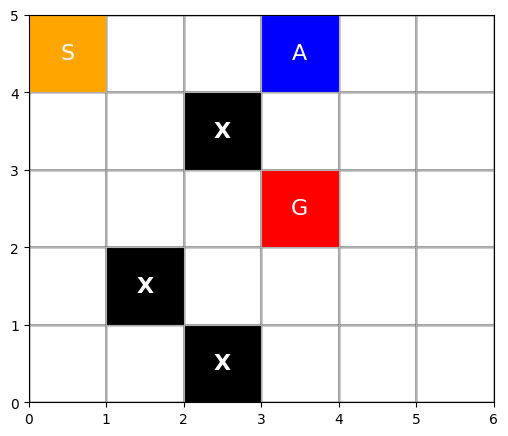

<Figure size 640x480 with 0 Axes>

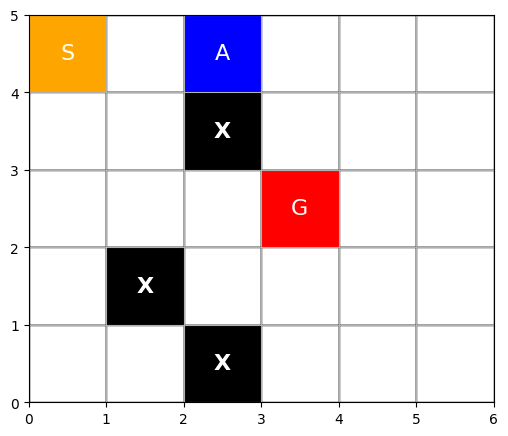

<Figure size 640x480 with 0 Axes>

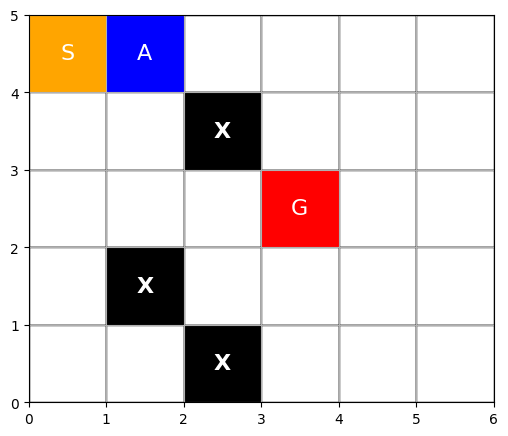

<Figure size 640x480 with 0 Axes>

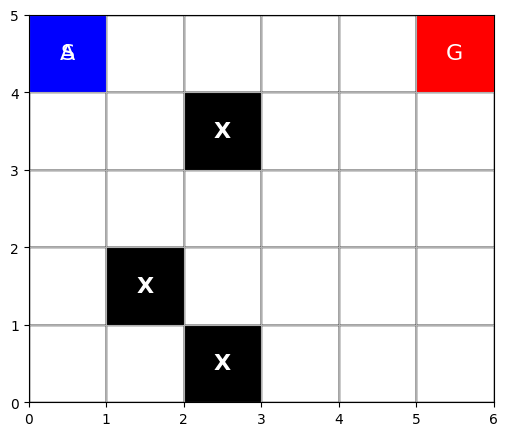

<Figure size 640x480 with 0 Axes>

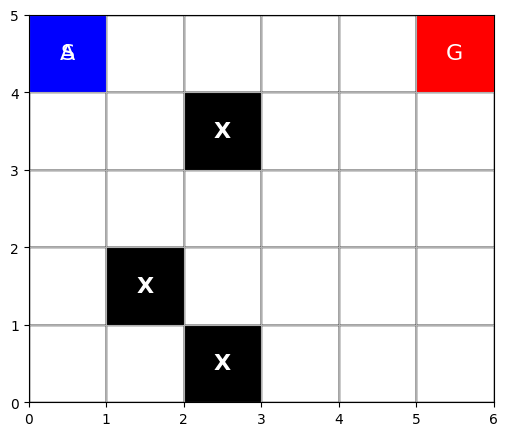

<Figure size 640x480 with 0 Axes>

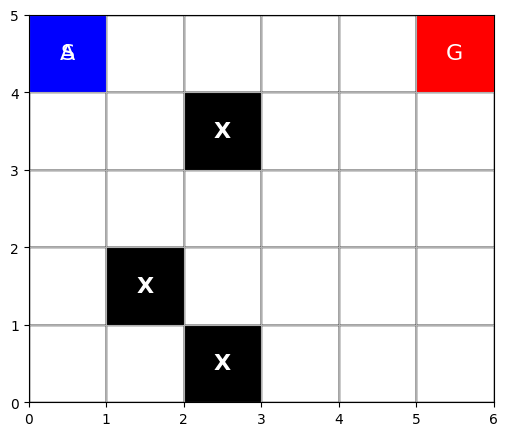

<Figure size 640x480 with 0 Axes>

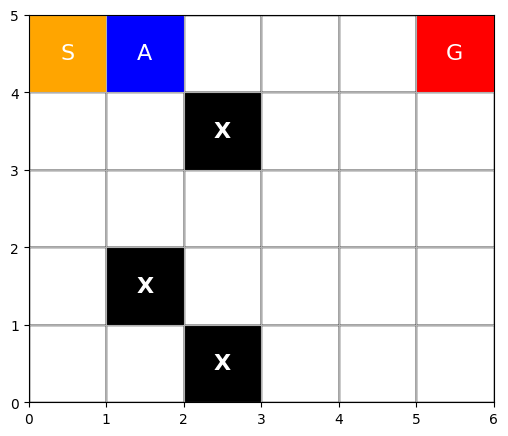

<Figure size 640x480 with 0 Axes>

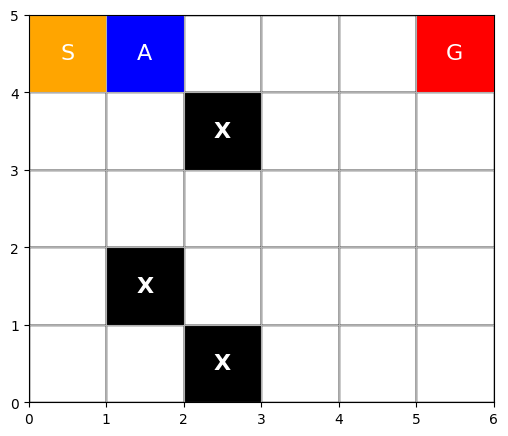

<Figure size 640x480 with 0 Axes>

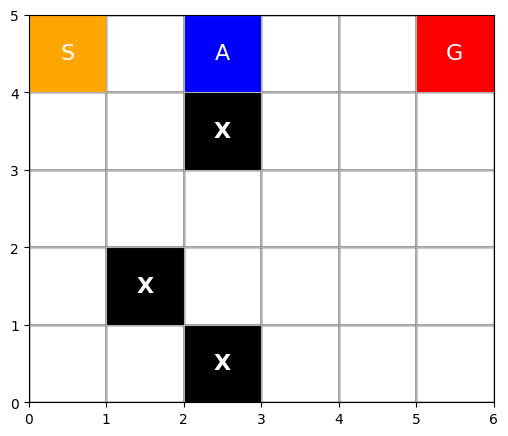

<Figure size 640x480 with 0 Axes>

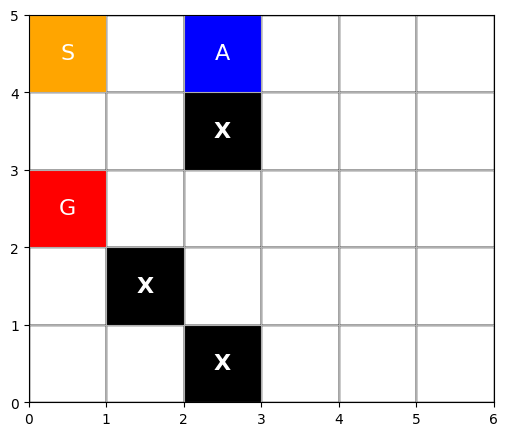

<Figure size 640x480 with 0 Axes>

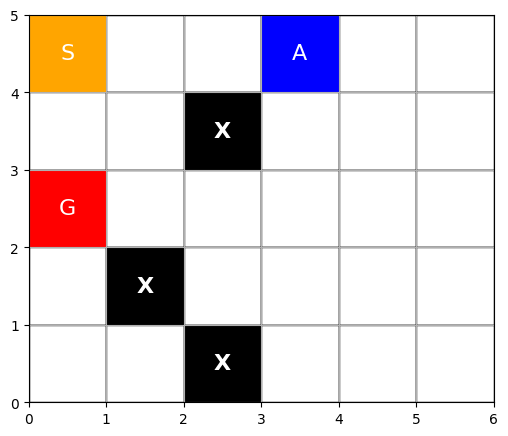

<Figure size 640x480 with 0 Axes>

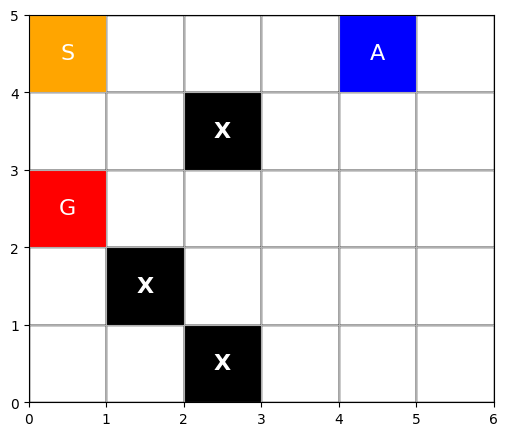

<Figure size 640x480 with 0 Axes>

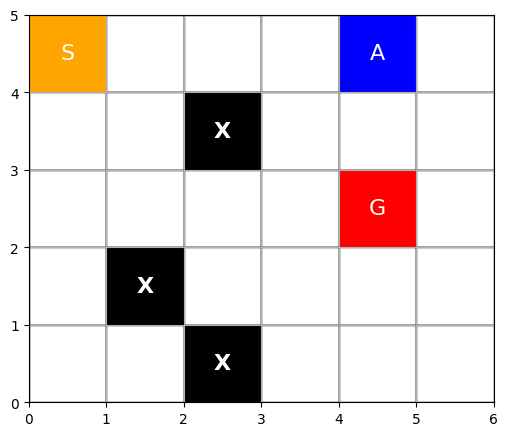

<Figure size 640x480 with 0 Axes>

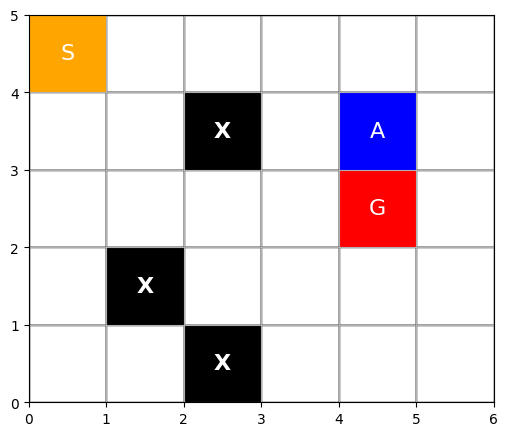

<Figure size 640x480 with 0 Axes>

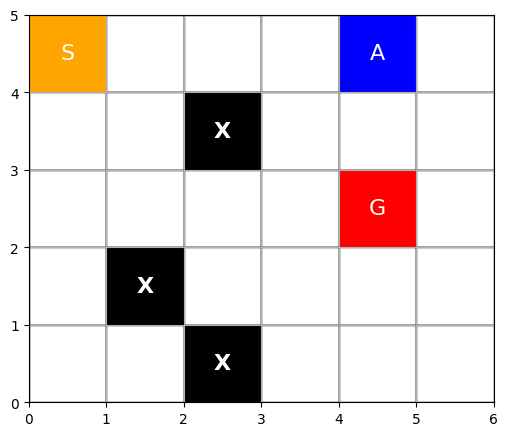

<Figure size 640x480 with 0 Axes>

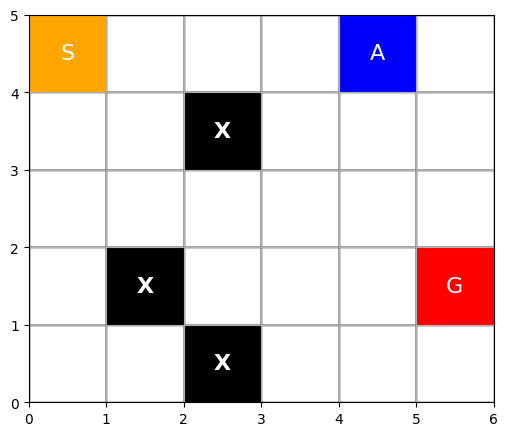

<Figure size 640x480 with 0 Axes>

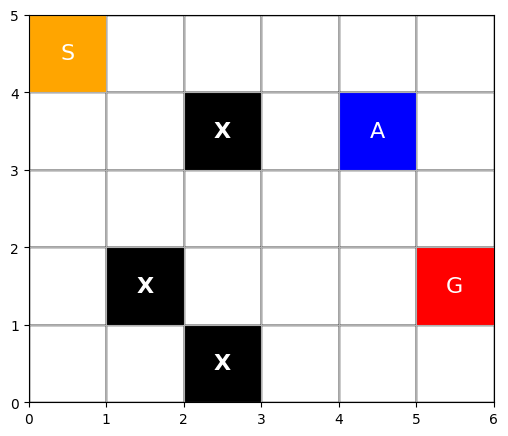

<Figure size 640x480 with 0 Axes>

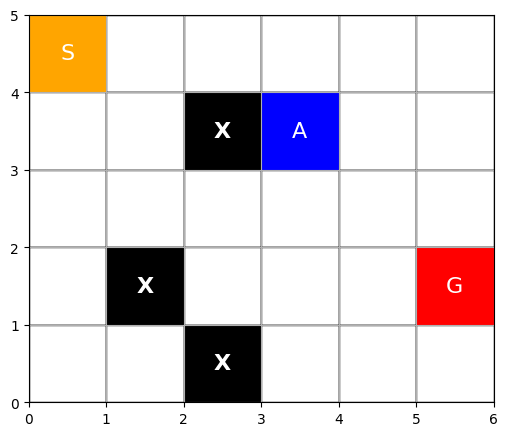

<Figure size 640x480 with 0 Axes>

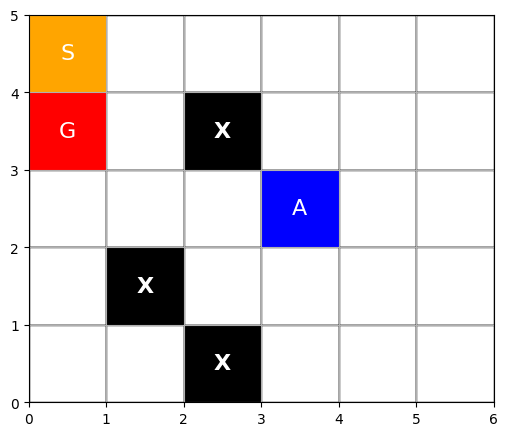

<Figure size 640x480 with 0 Axes>

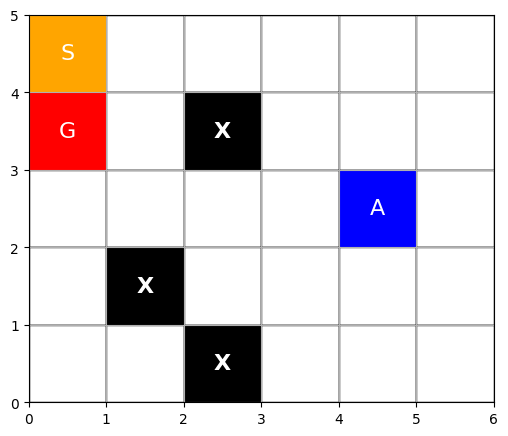

<Figure size 640x480 with 0 Axes>

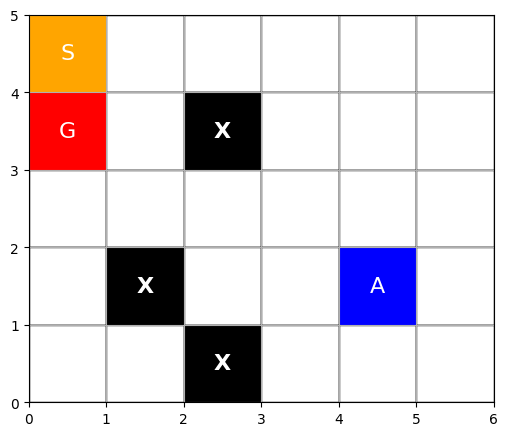

<Figure size 640x480 with 0 Axes>

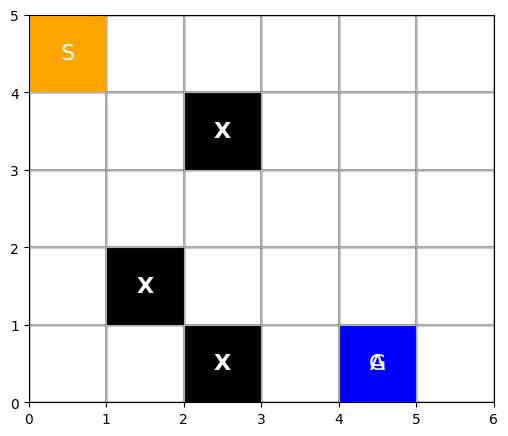

<Figure size 640x480 with 0 Axes>

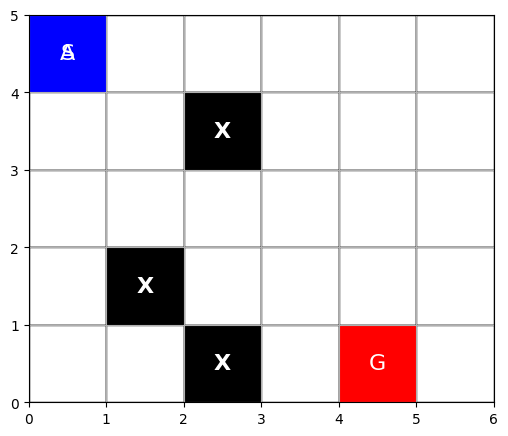

<Figure size 640x480 with 0 Axes>

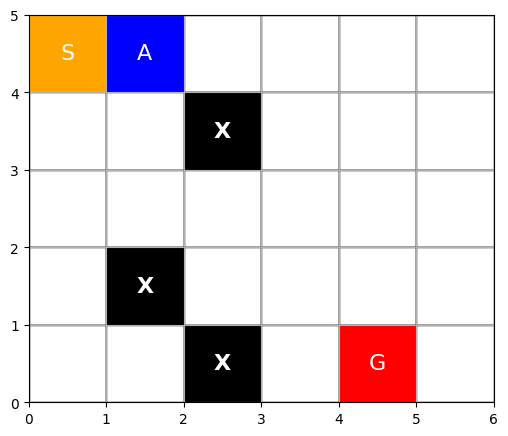

<Figure size 640x480 with 0 Axes>

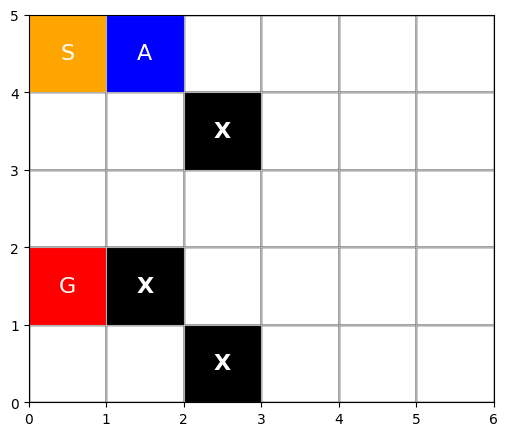

<Figure size 640x480 with 0 Axes>

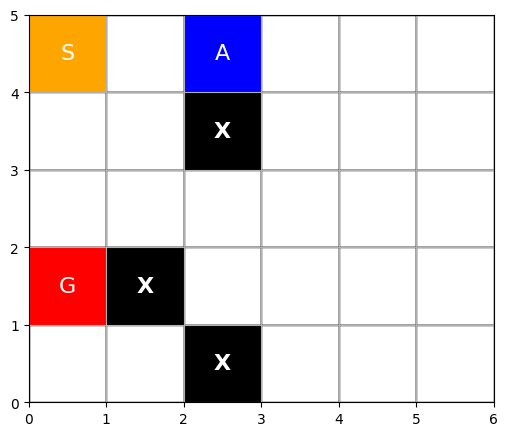

<Figure size 640x480 with 0 Axes>

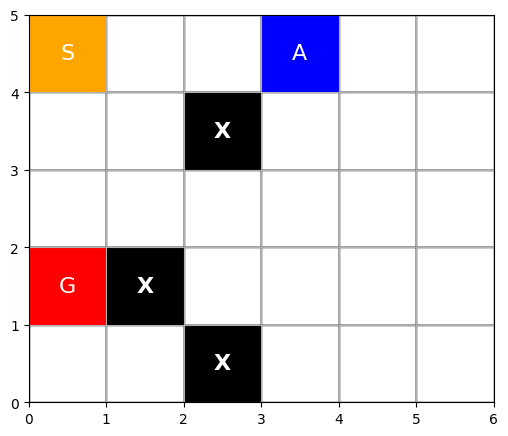

<Figure size 640x480 with 0 Axes>

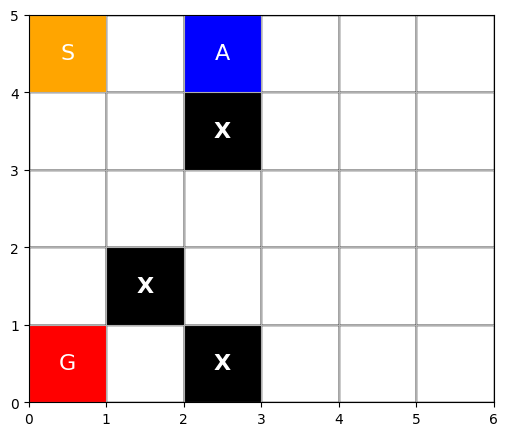

<Figure size 640x480 with 0 Axes>

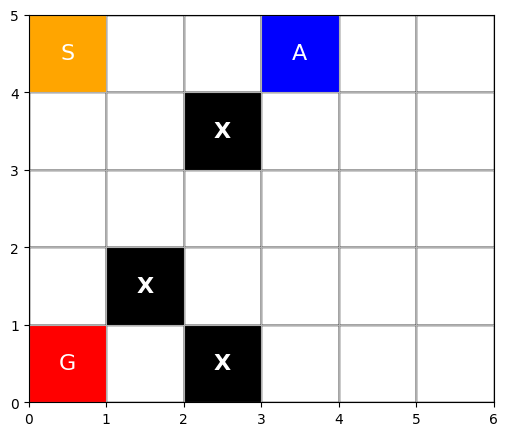

<Figure size 640x480 with 0 Axes>

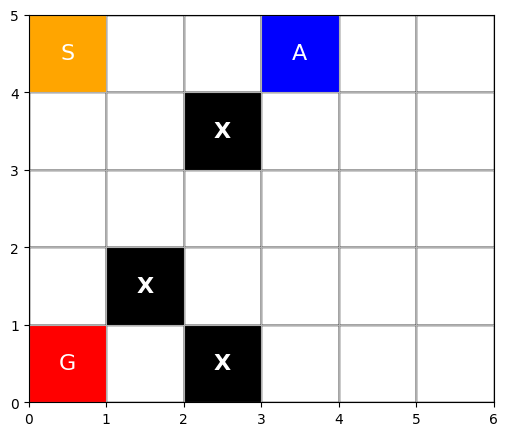

<Figure size 640x480 with 0 Axes>

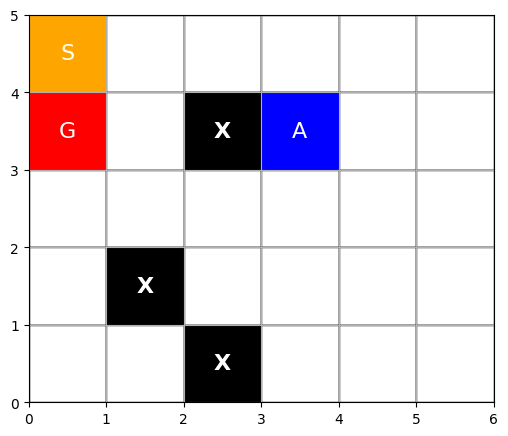

<Figure size 640x480 with 0 Axes>

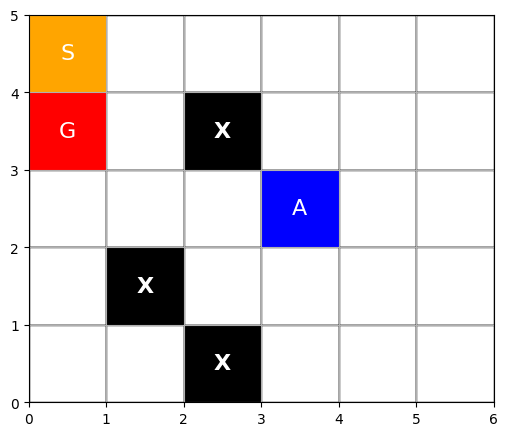

<Figure size 640x480 with 0 Axes>

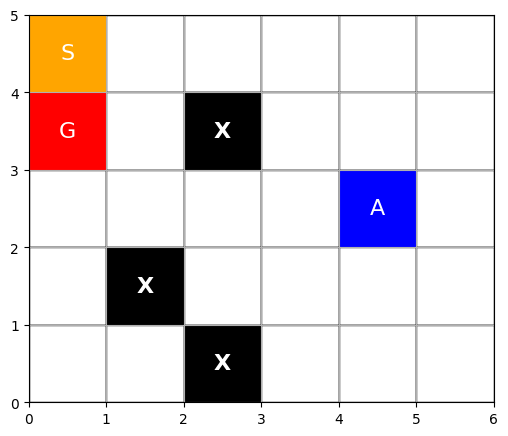

<Figure size 640x480 with 0 Axes>

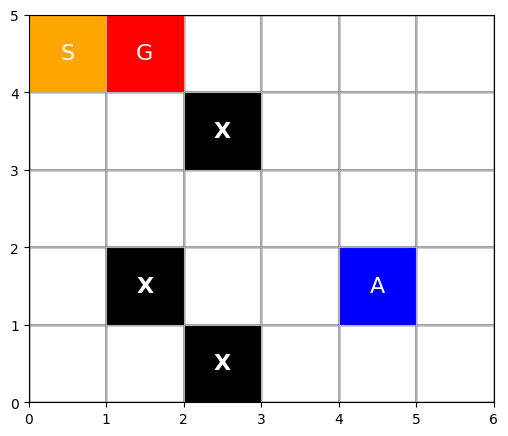

<Figure size 640x480 with 0 Axes>

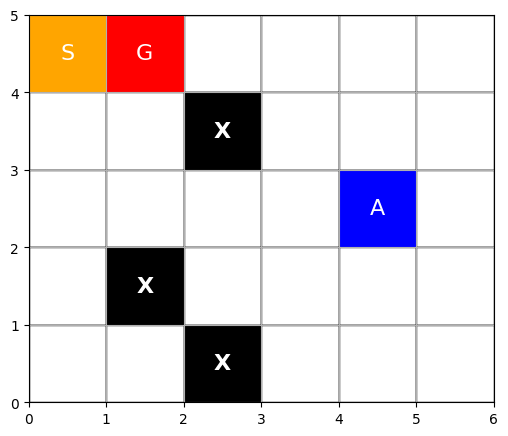

<Figure size 640x480 with 0 Axes>

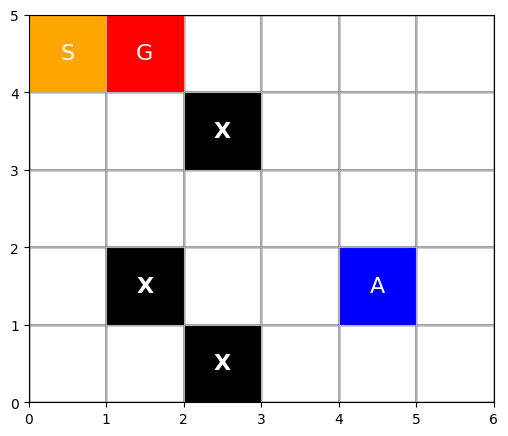

<Figure size 640x480 with 0 Axes>

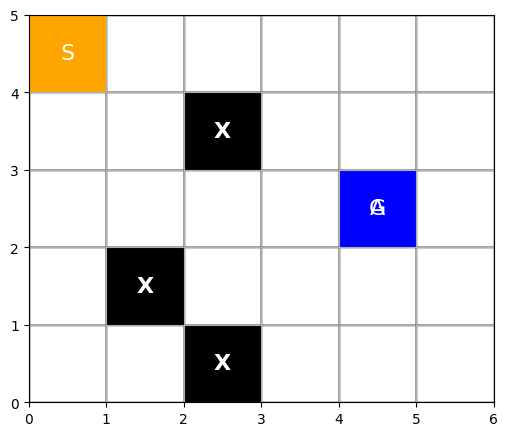

<Figure size 640x480 with 0 Axes>

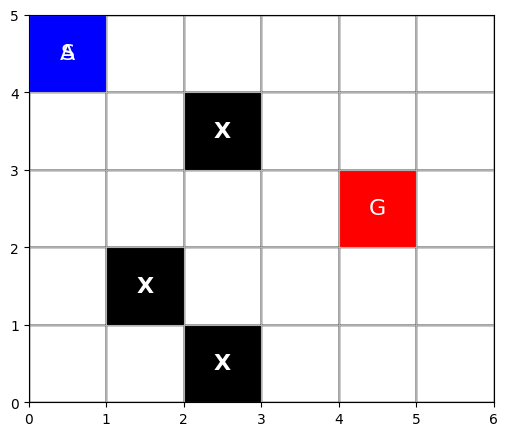

<Figure size 640x480 with 0 Axes>

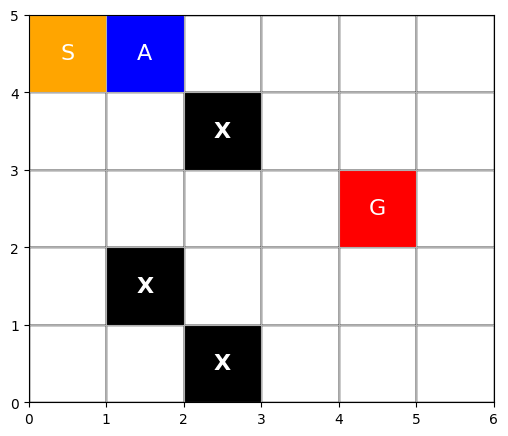

<Figure size 640x480 with 0 Axes>

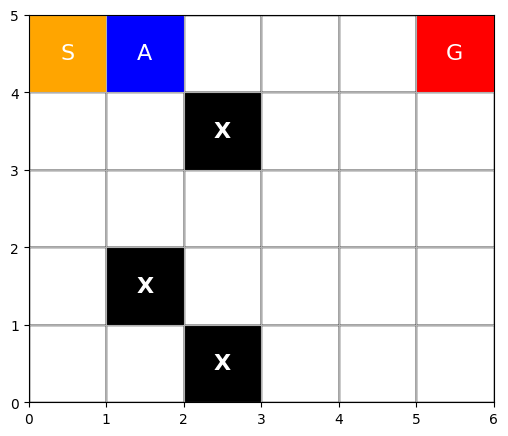

<Figure size 640x480 with 0 Axes>

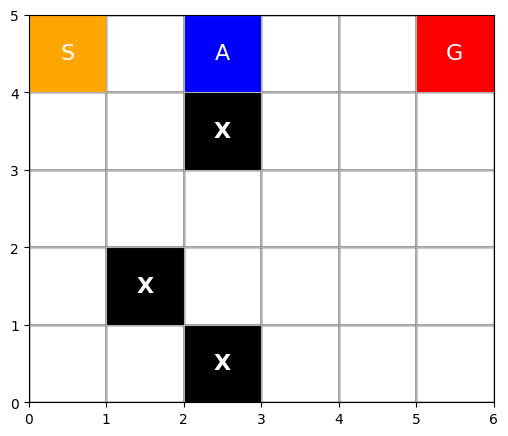

<Figure size 640x480 with 0 Axes>

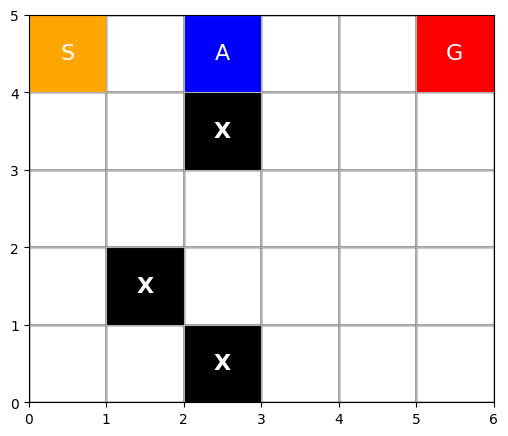

<Figure size 640x480 with 0 Axes>

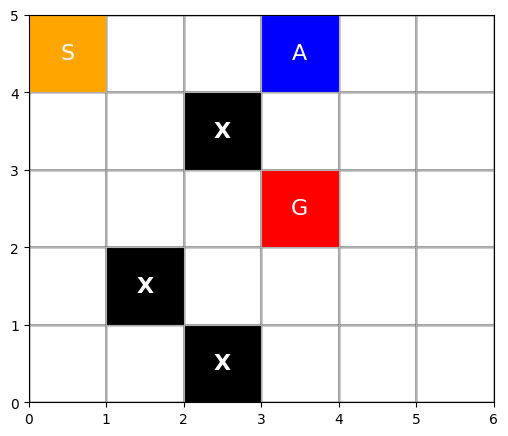

<Figure size 640x480 with 0 Axes>

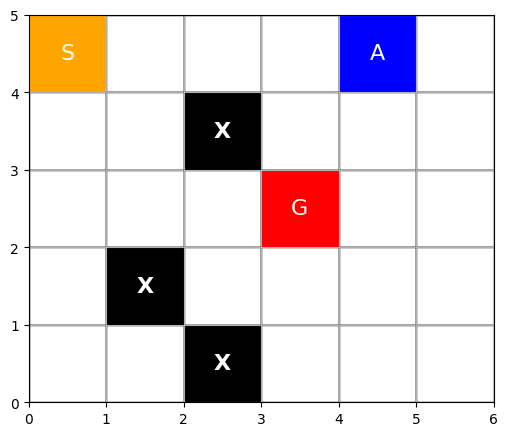

<Figure size 640x480 with 0 Axes>

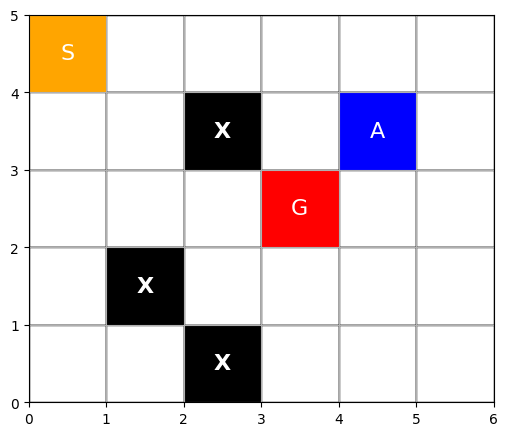

<Figure size 640x480 with 0 Axes>

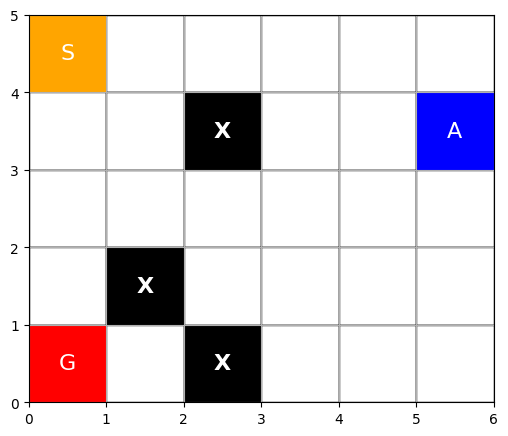

<Figure size 640x480 with 0 Axes>

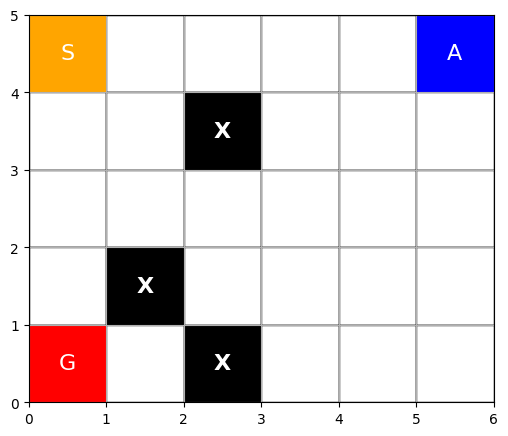

<Figure size 640x480 with 0 Axes>

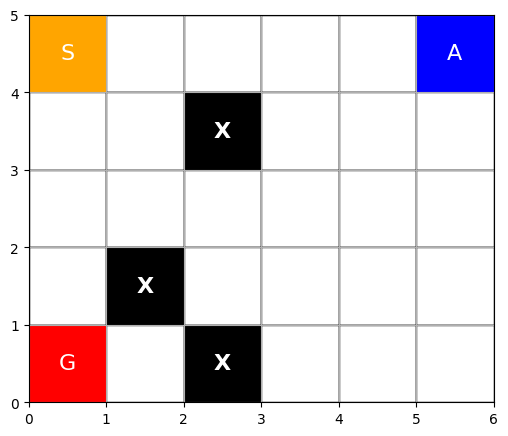

<Figure size 640x480 with 0 Axes>

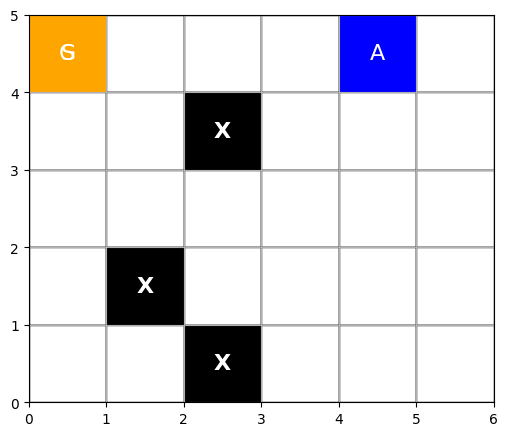

<Figure size 640x480 with 0 Axes>

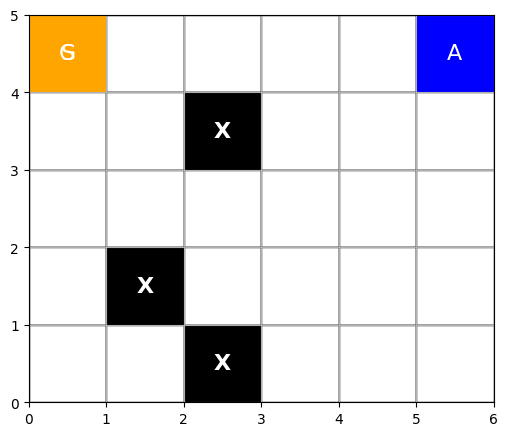

<Figure size 640x480 with 0 Axes>

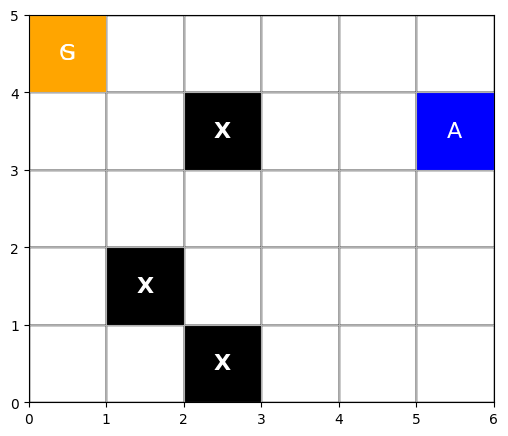

<Figure size 640x480 with 0 Axes>

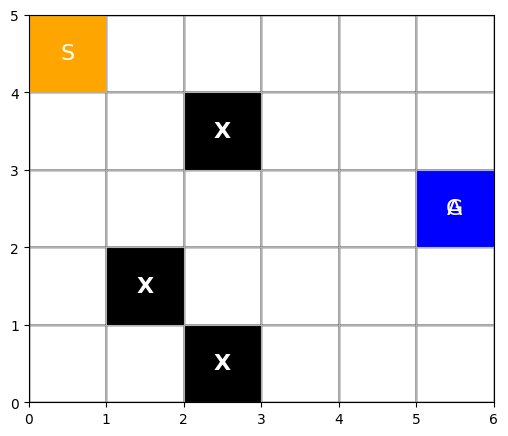

<Figure size 640x480 with 0 Axes>

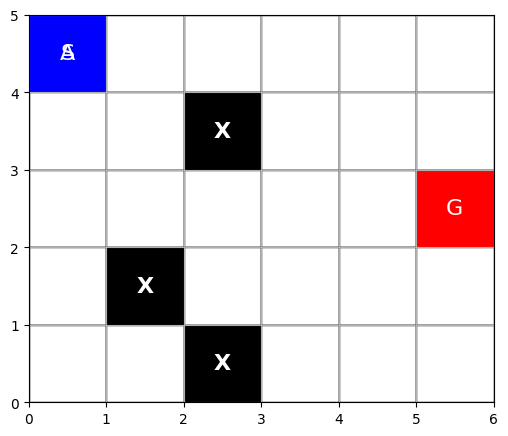

<Figure size 640x480 with 0 Axes>

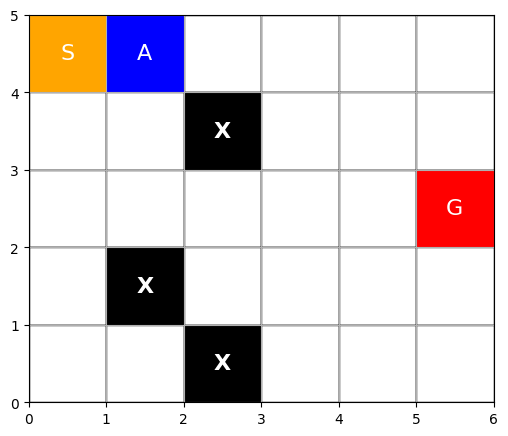

<Figure size 640x480 with 0 Axes>

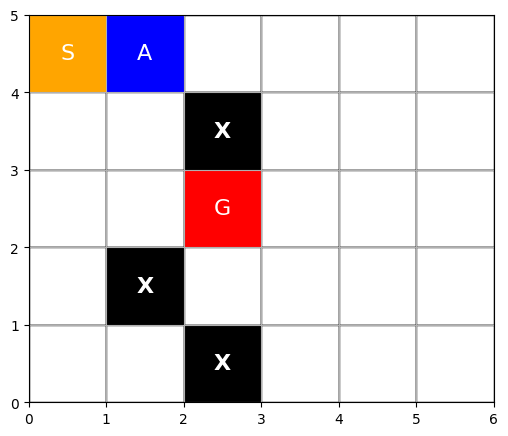

<Figure size 640x480 with 0 Axes>

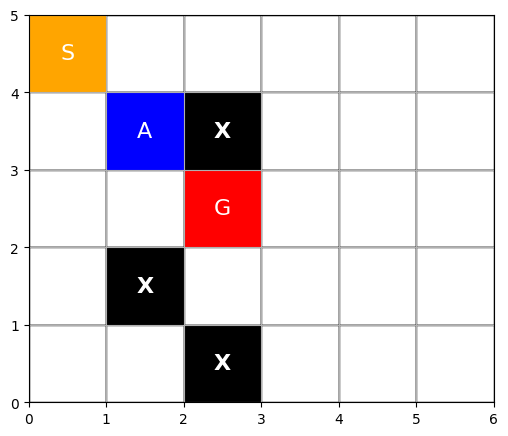

<Figure size 640x480 with 0 Axes>

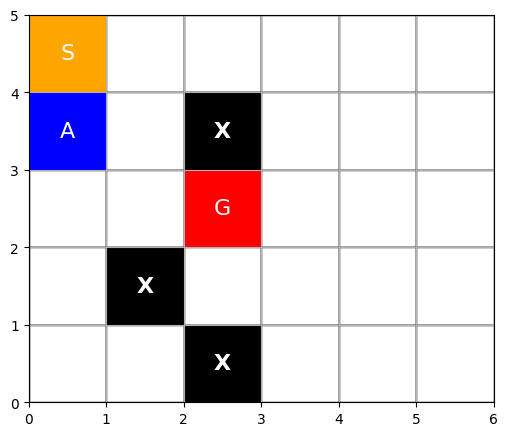

<Figure size 640x480 with 0 Axes>

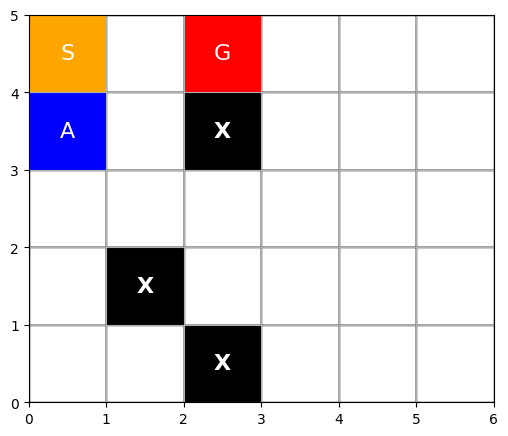

<Figure size 640x480 with 0 Axes>

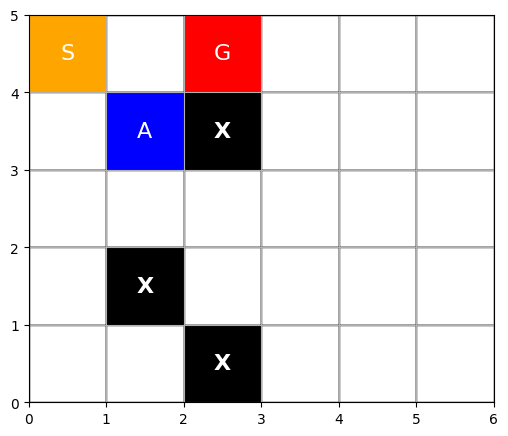

<Figure size 640x480 with 0 Axes>

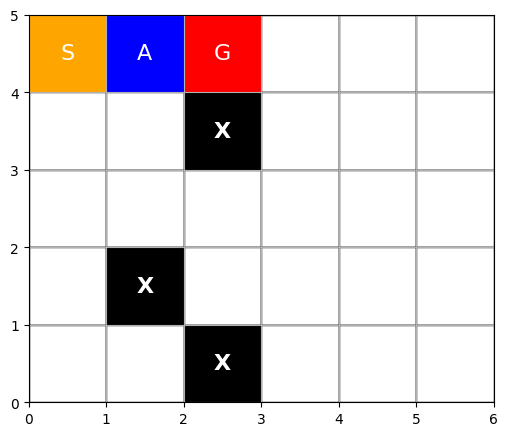

<Figure size 640x480 with 0 Axes>

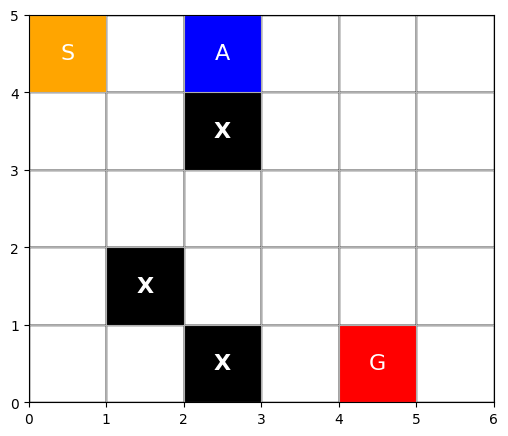

<Figure size 640x480 with 0 Axes>

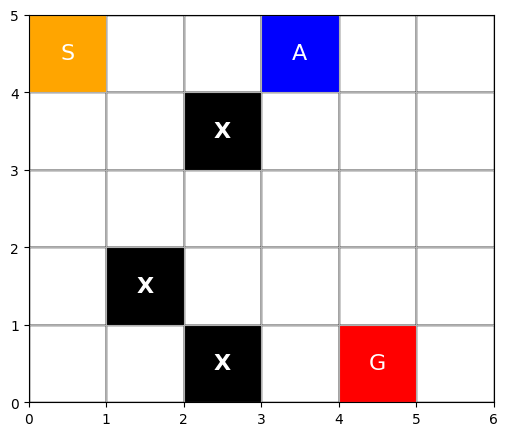

<Figure size 640x480 with 0 Axes>

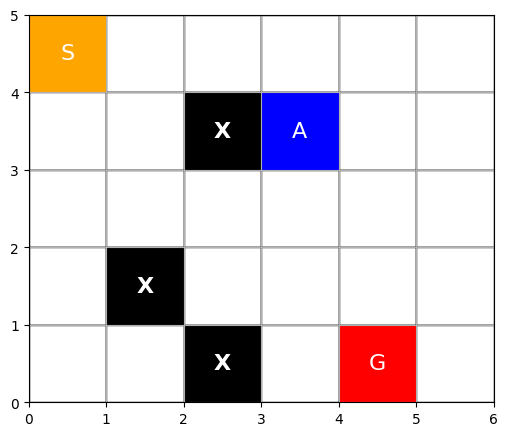

<Figure size 640x480 with 0 Axes>

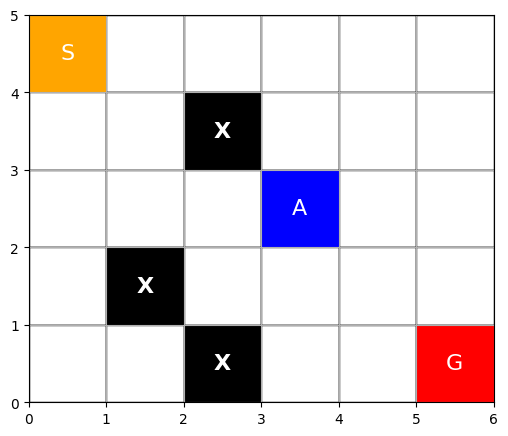

<Figure size 640x480 with 0 Axes>

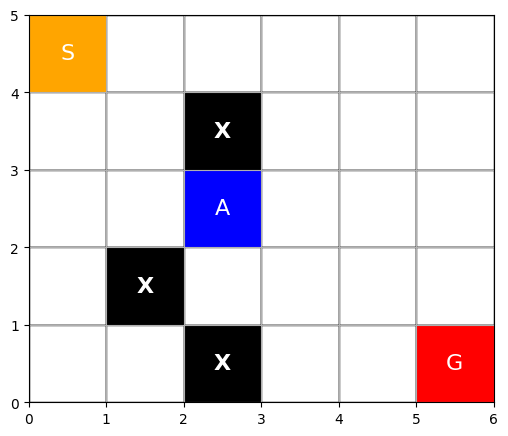

<Figure size 640x480 with 0 Axes>

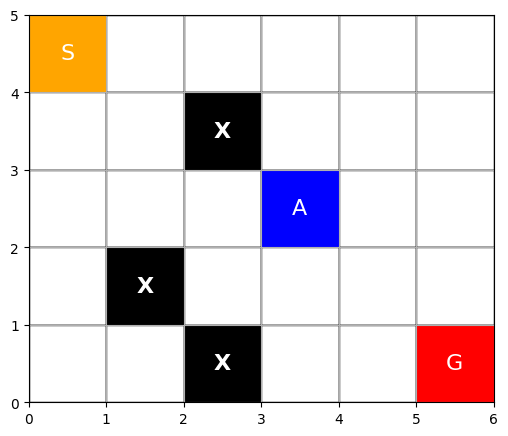

<Figure size 640x480 with 0 Axes>

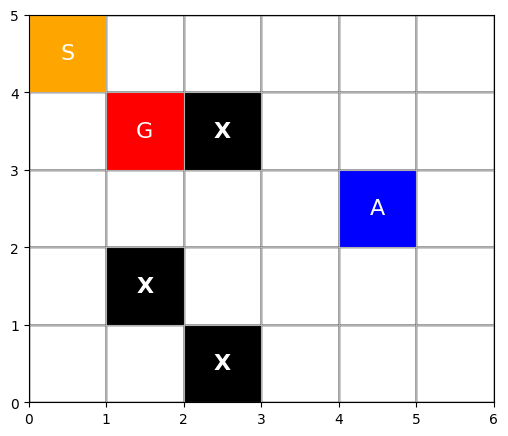

<Figure size 640x480 with 0 Axes>

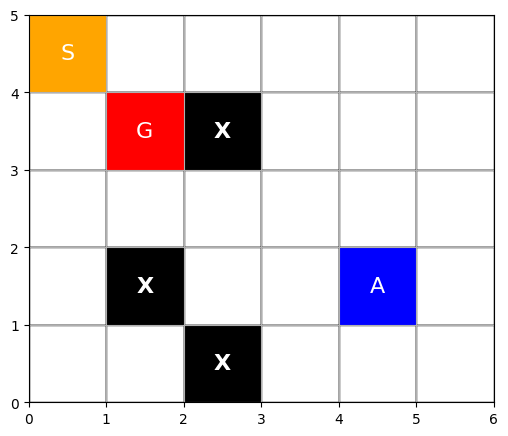

<Figure size 640x480 with 0 Axes>

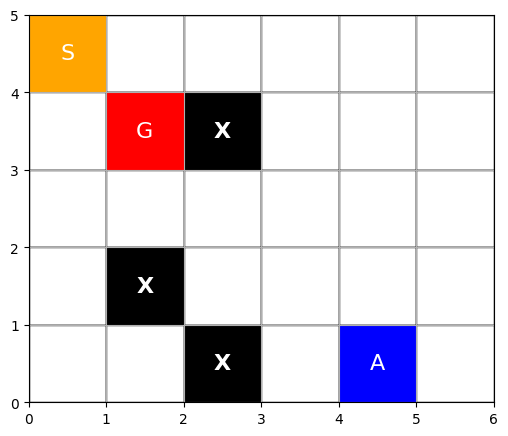

<Figure size 640x480 with 0 Axes>

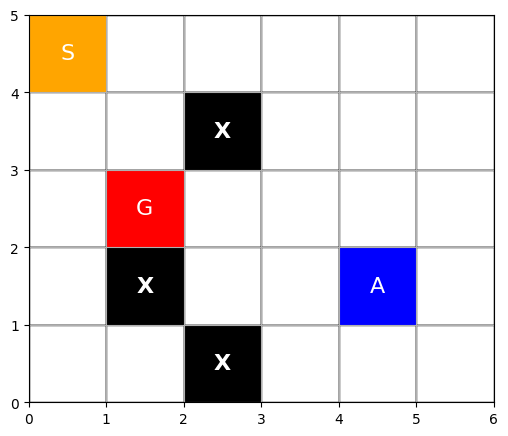

<Figure size 640x480 with 0 Axes>

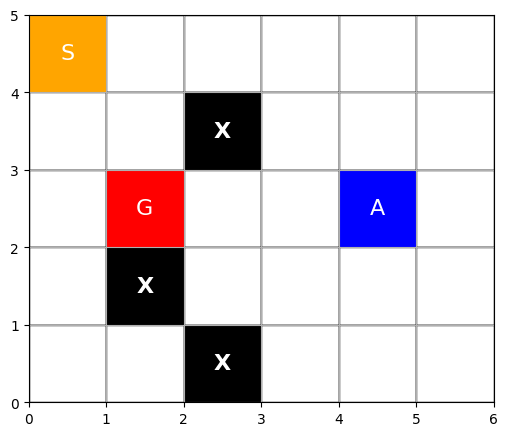

<Figure size 640x480 with 0 Axes>

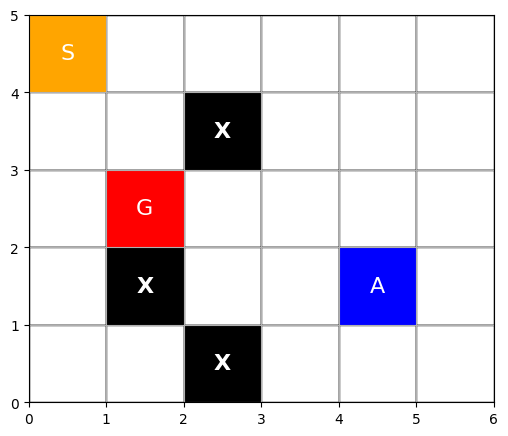

<Figure size 640x480 with 0 Axes>

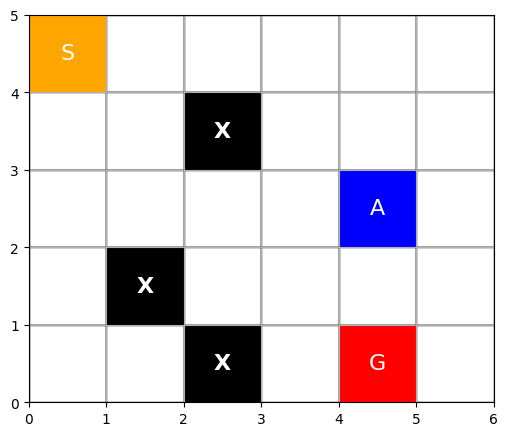

<Figure size 640x480 with 0 Axes>

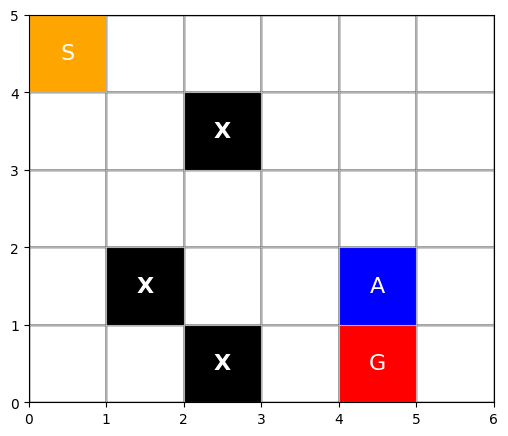

<Figure size 640x480 with 0 Axes>

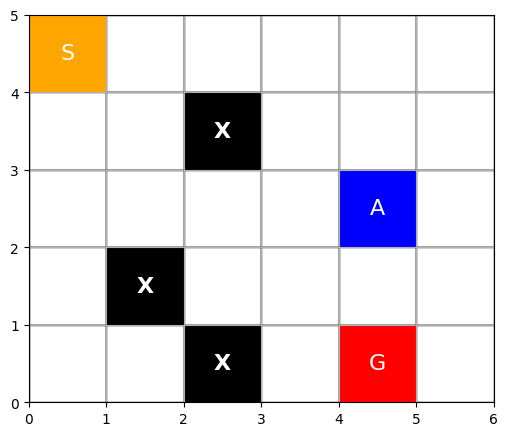

<Figure size 640x480 with 0 Axes>

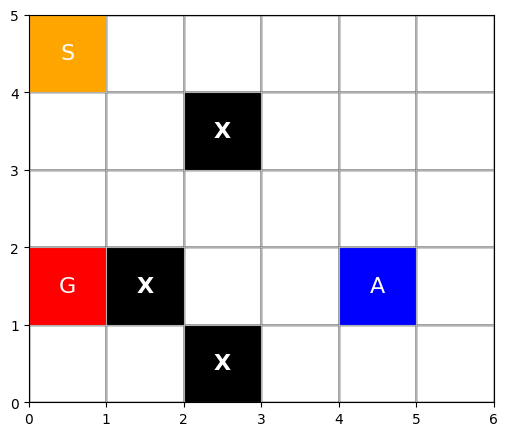

<Figure size 640x480 with 0 Axes>

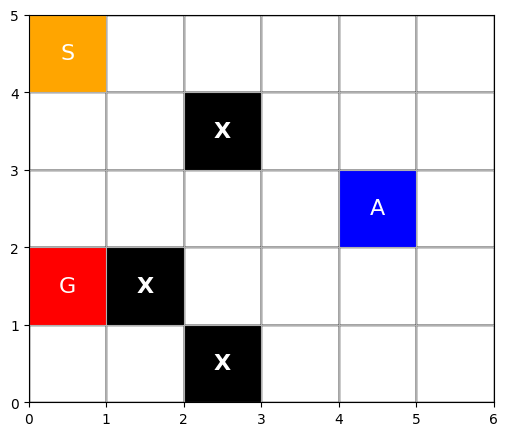

<Figure size 640x480 with 0 Axes>

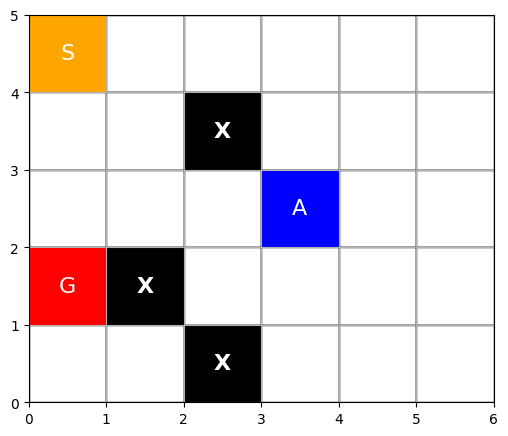

<Figure size 640x480 with 0 Axes>

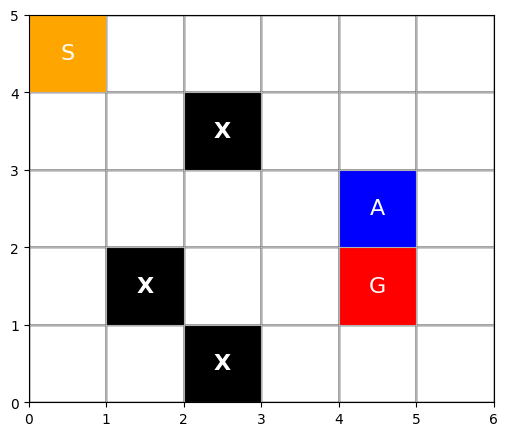

<Figure size 640x480 with 0 Axes>

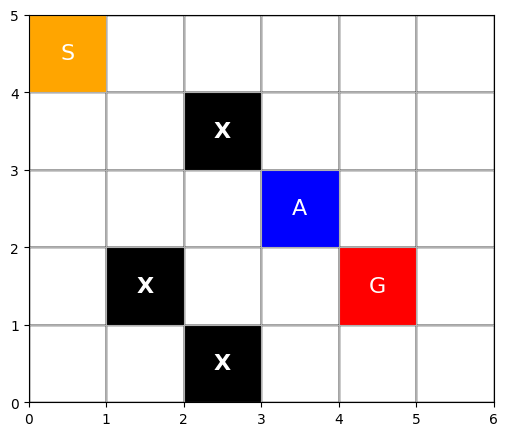

<Figure size 640x480 with 0 Axes>

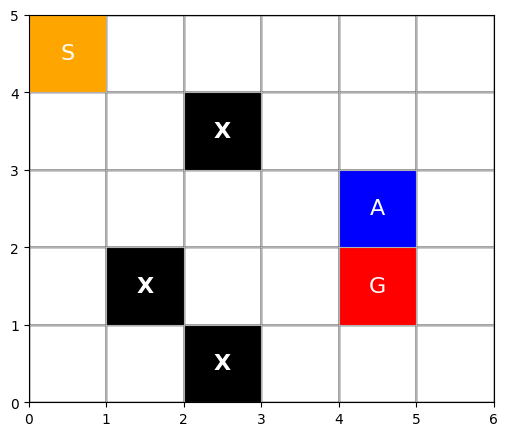

<Figure size 640x480 with 0 Axes>

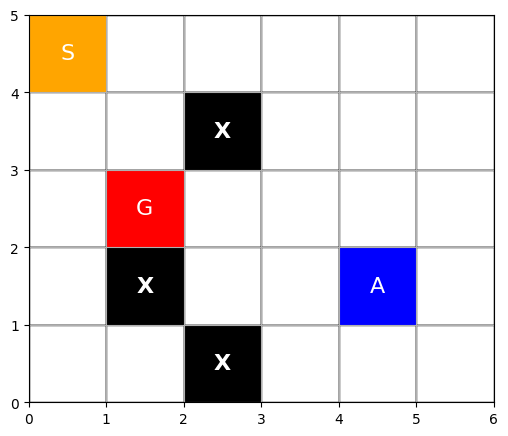

<Figure size 640x480 with 0 Axes>

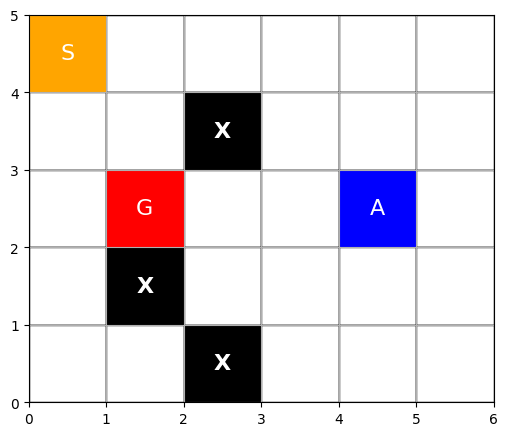

<Figure size 640x480 with 0 Axes>

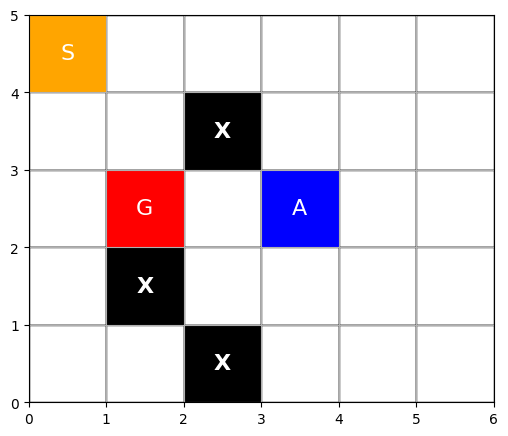

<Figure size 640x480 with 0 Axes>

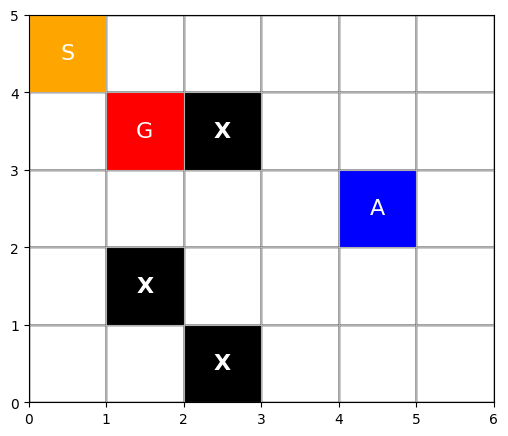

<Figure size 640x480 with 0 Axes>

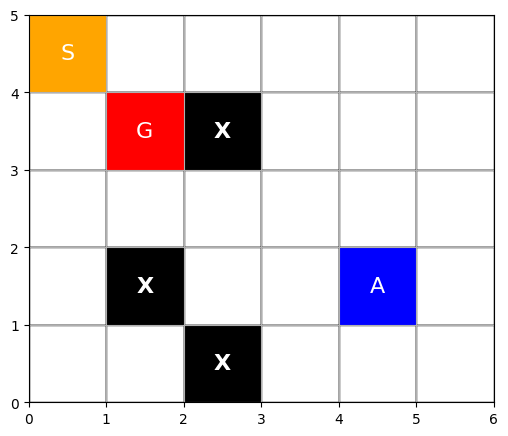

<Figure size 640x480 with 0 Axes>

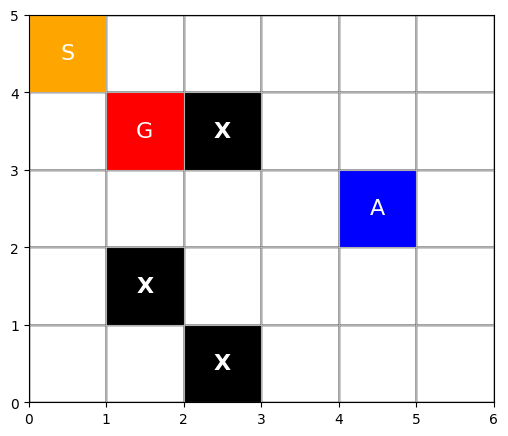

<Figure size 640x480 with 0 Axes>

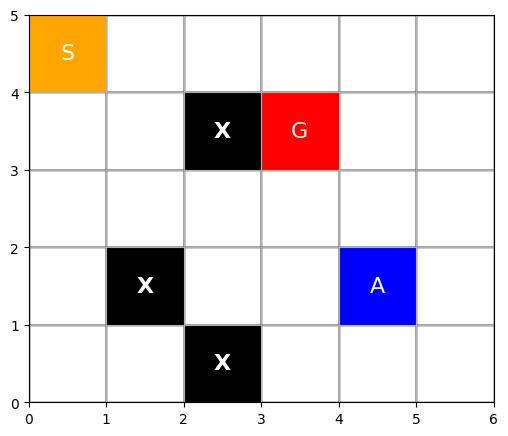

<Figure size 640x480 with 0 Axes>

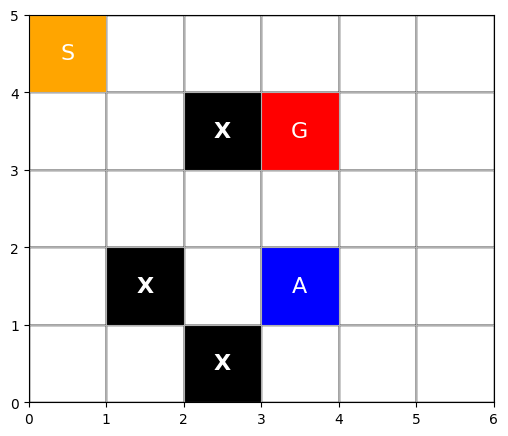

<Figure size 640x480 with 0 Axes>

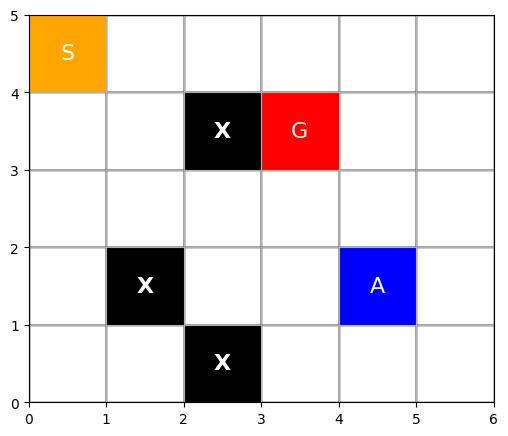

<Figure size 640x480 with 0 Axes>

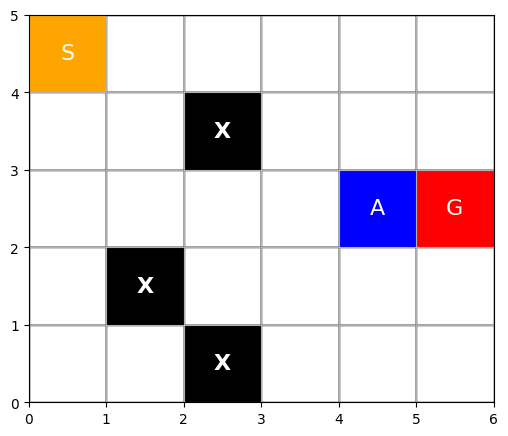

<Figure size 640x480 with 0 Axes>

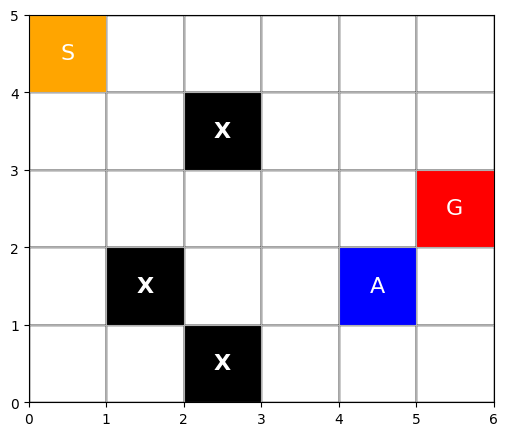

<Figure size 640x480 with 0 Axes>

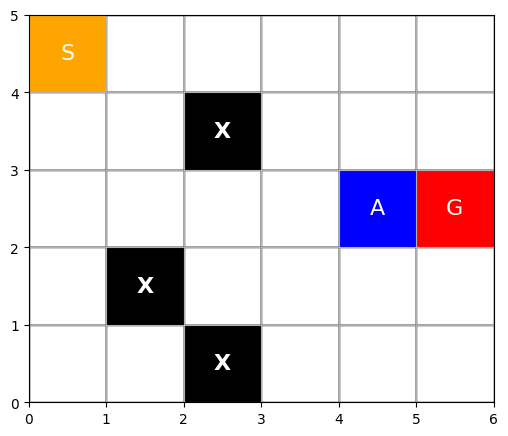

<Figure size 640x480 with 0 Axes>

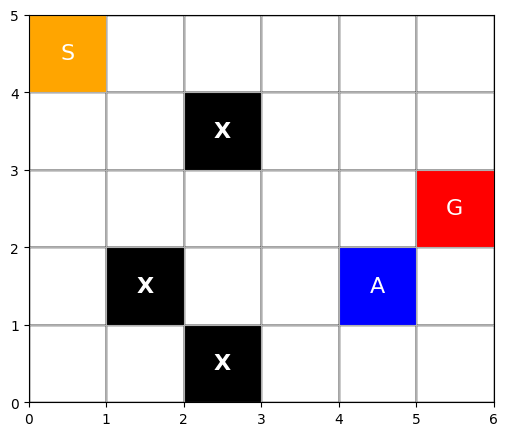

<Figure size 640x480 with 0 Axes>

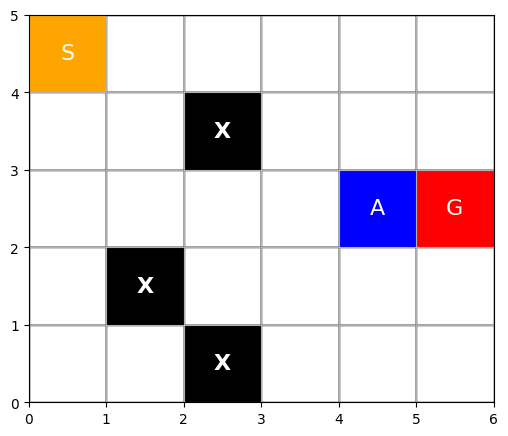

<Figure size 640x480 with 0 Axes>

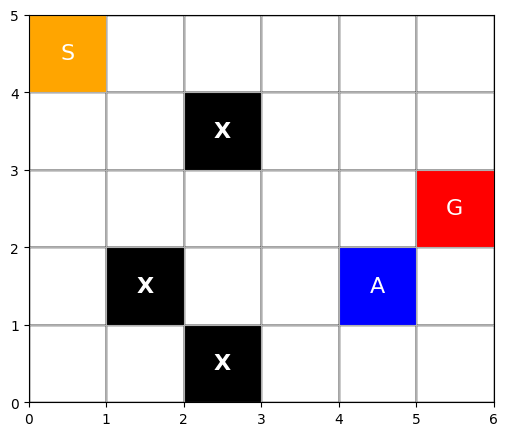

<Figure size 640x480 with 0 Axes>

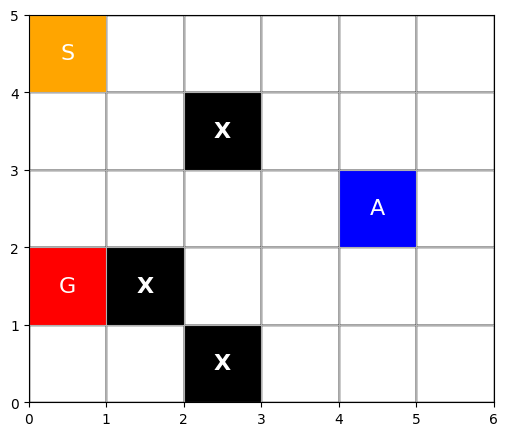

<Figure size 640x480 with 0 Axes>

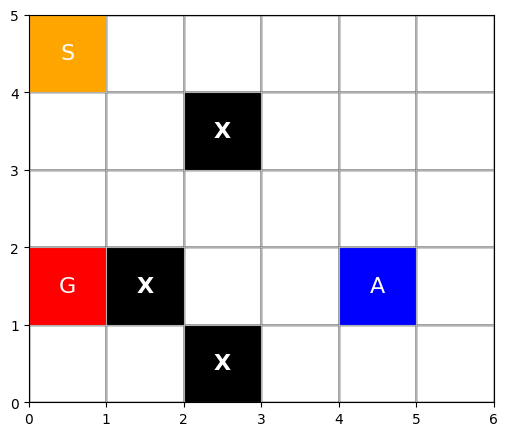

<Figure size 640x480 with 0 Axes>

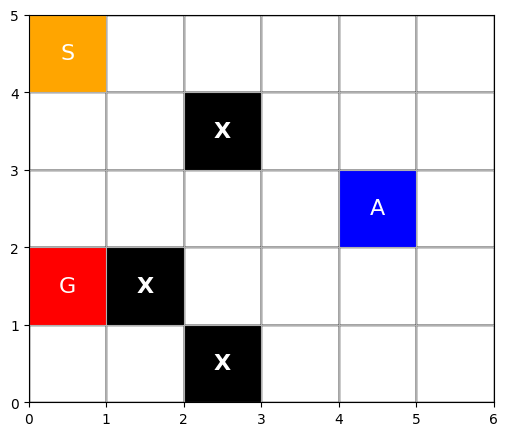

<Figure size 640x480 with 0 Axes>

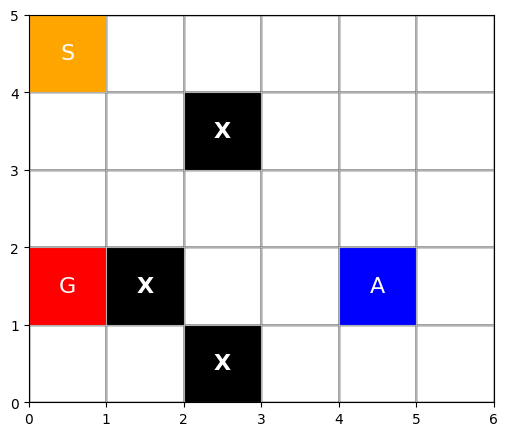

<Figure size 640x480 with 0 Axes>

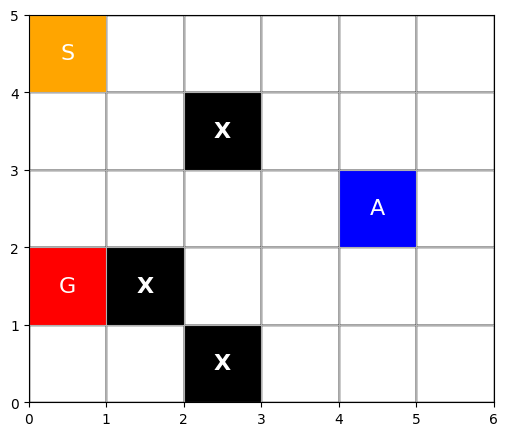

<Figure size 640x480 with 0 Axes>

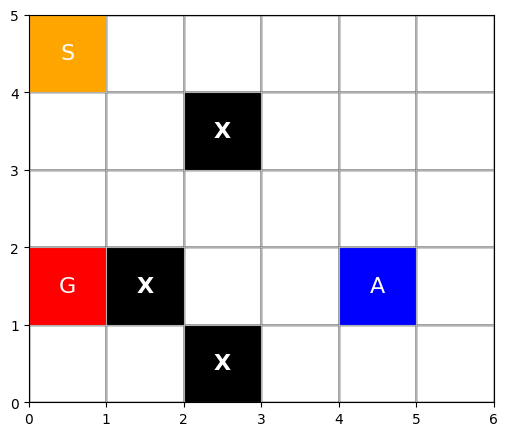

<Figure size 640x480 with 0 Axes>

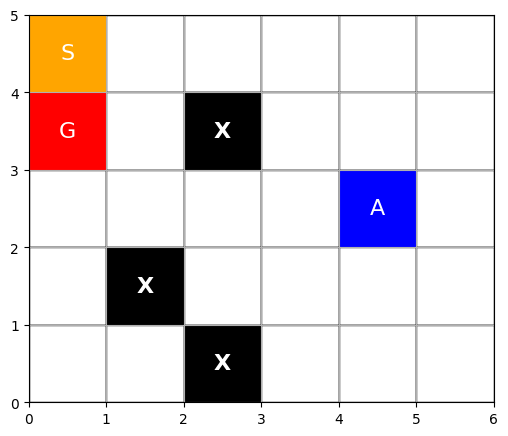

<Figure size 640x480 with 0 Axes>

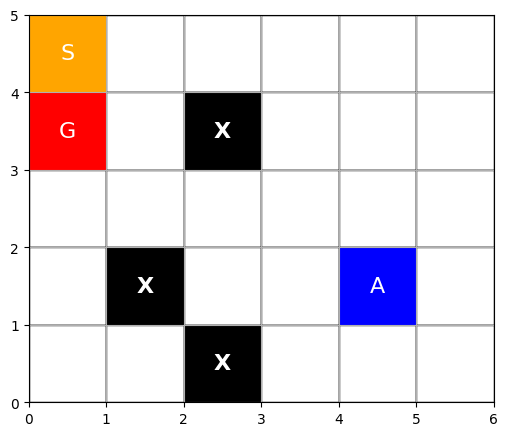

<Figure size 640x480 with 0 Axes>

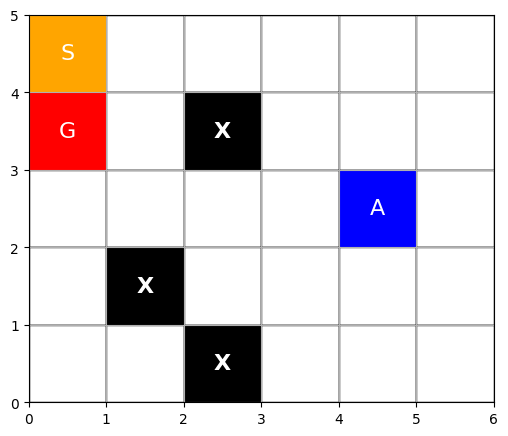

<Figure size 640x480 with 0 Axes>

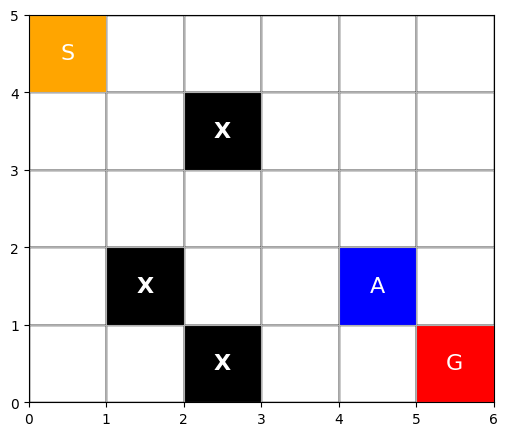

<Figure size 640x480 with 0 Axes>

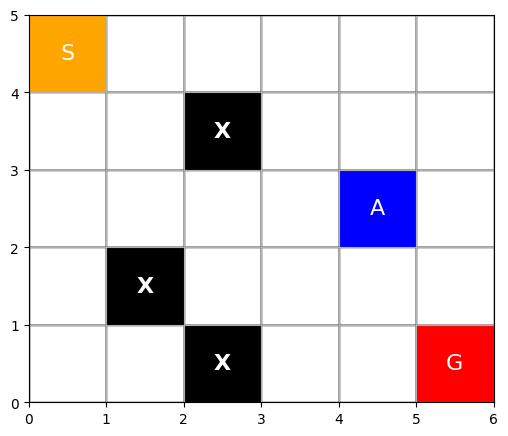

<Figure size 640x480 with 0 Axes>

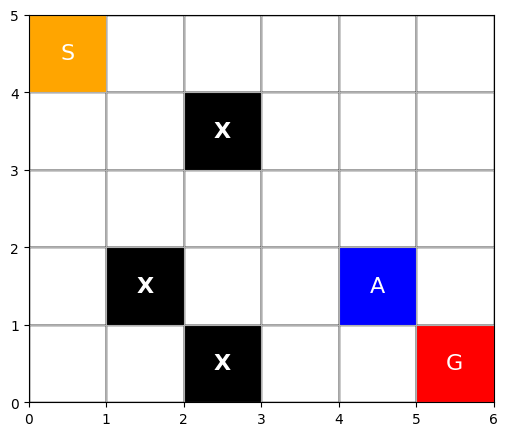

<Figure size 640x480 with 0 Axes>

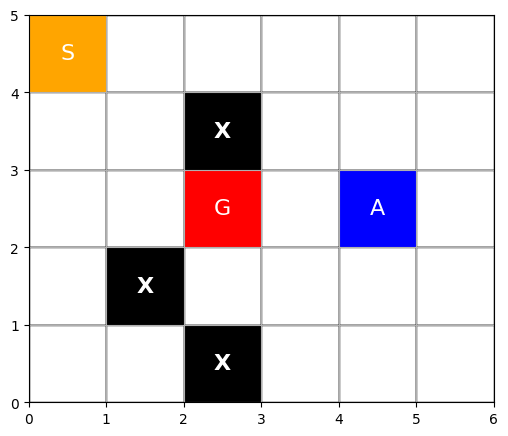

<Figure size 640x480 with 0 Axes>

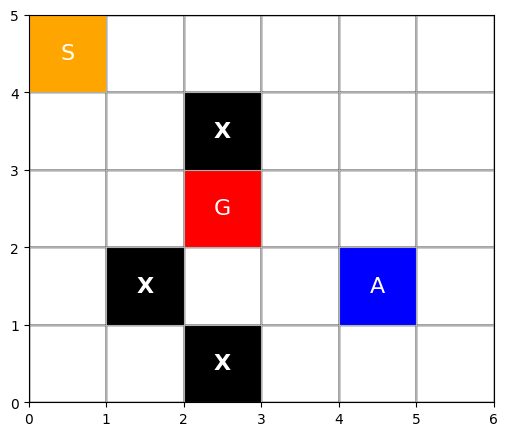

<Figure size 640x480 with 0 Axes>

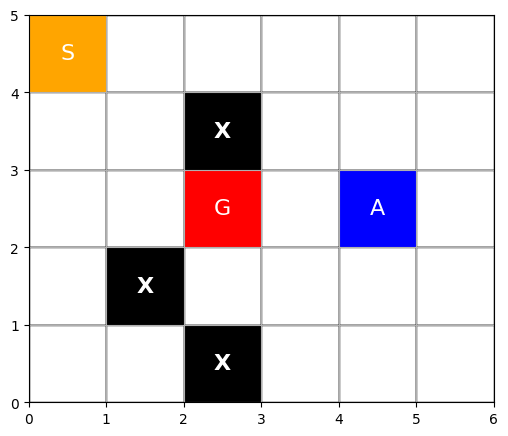

<Figure size 640x480 with 0 Axes>

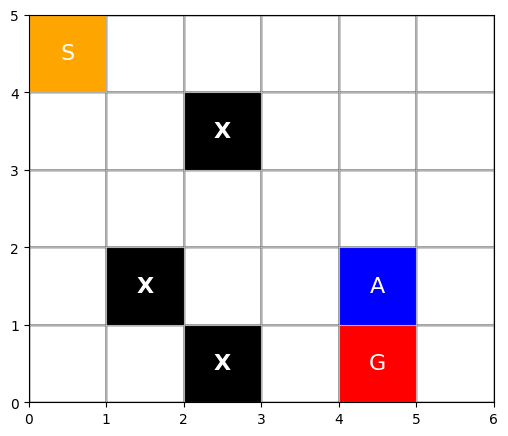

<Figure size 640x480 with 0 Axes>

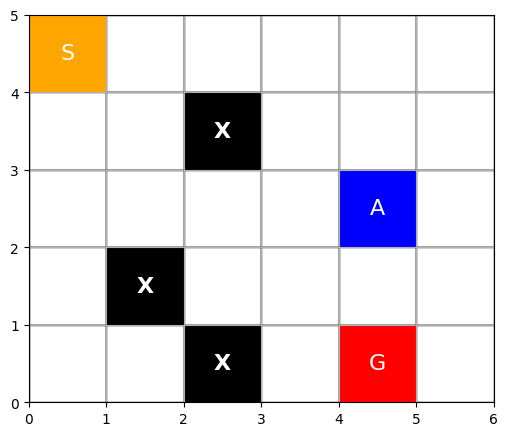

<Figure size 640x480 with 0 Axes>

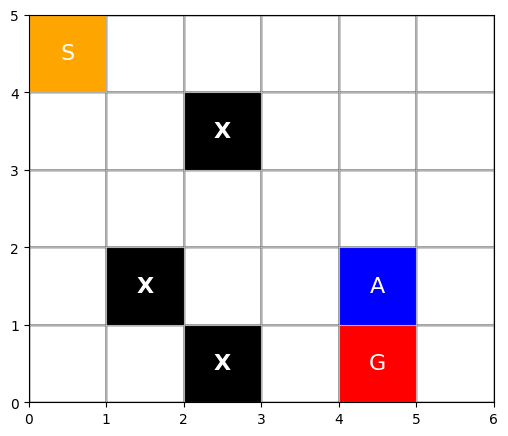

<Figure size 640x480 with 0 Axes>

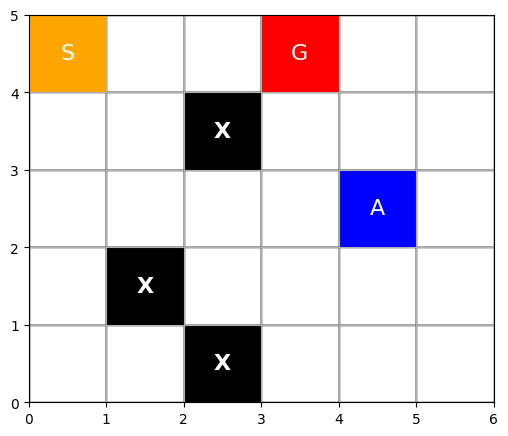

<Figure size 640x480 with 0 Axes>

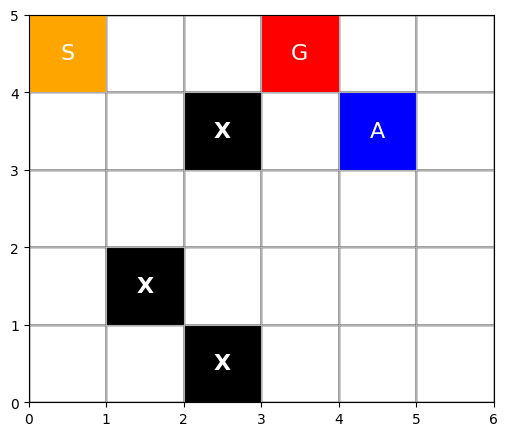

<Figure size 640x480 with 0 Axes>

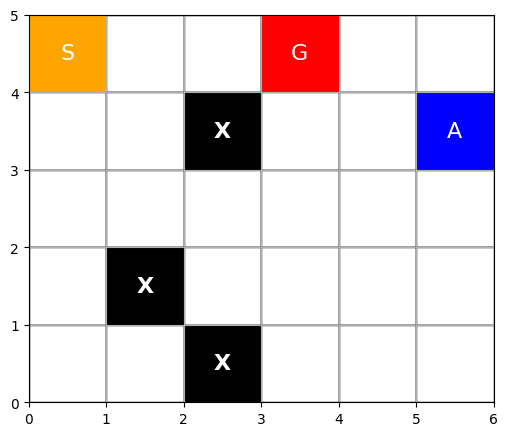

<Figure size 640x480 with 0 Axes>

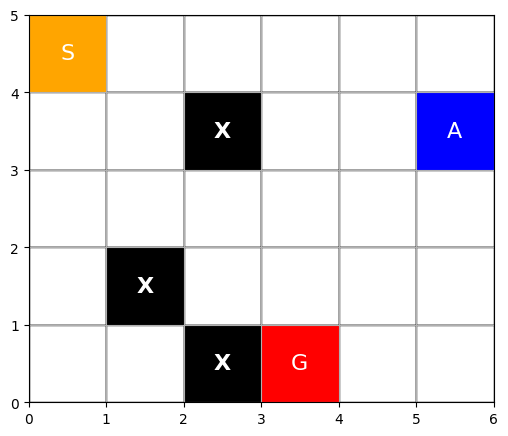

<Figure size 640x480 with 0 Axes>

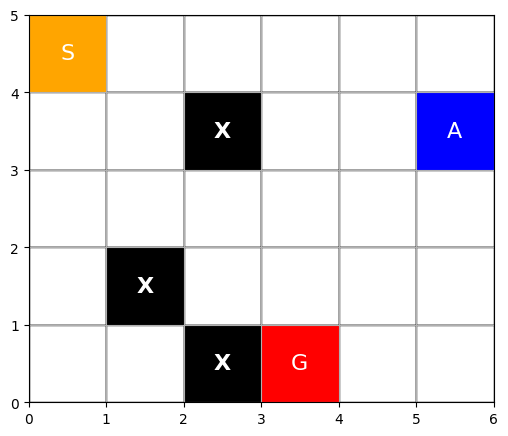

<Figure size 640x480 with 0 Axes>

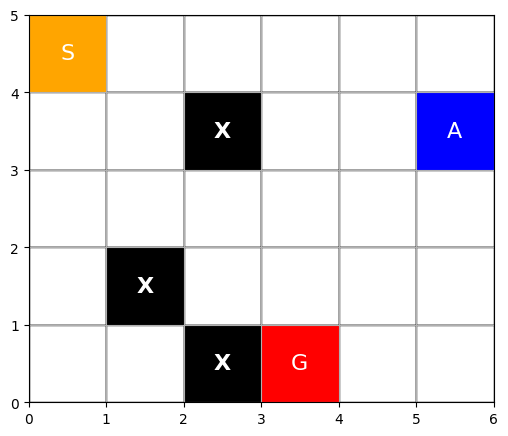

<Figure size 640x480 with 0 Axes>

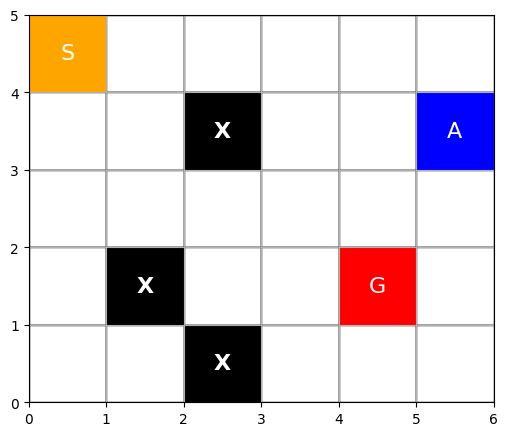

<Figure size 640x480 with 0 Axes>

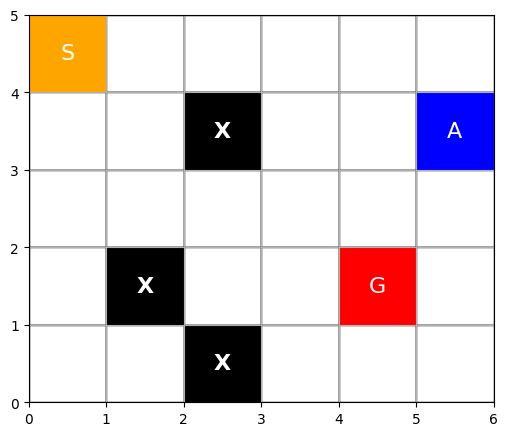

<Figure size 640x480 with 0 Axes>

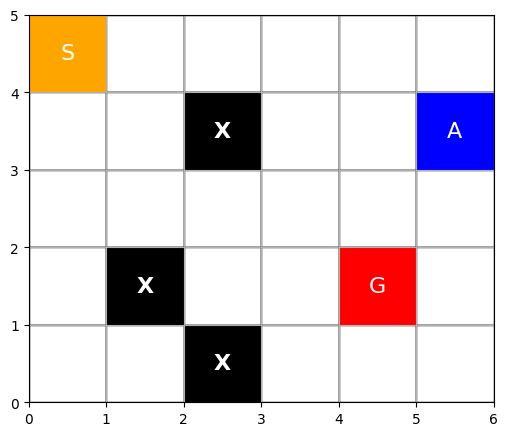

<Figure size 640x480 with 0 Axes>

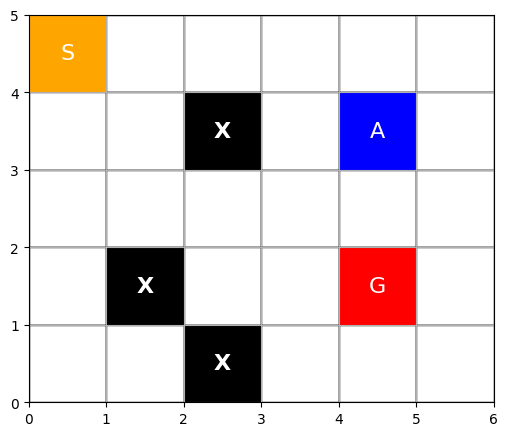

<Figure size 640x480 with 0 Axes>

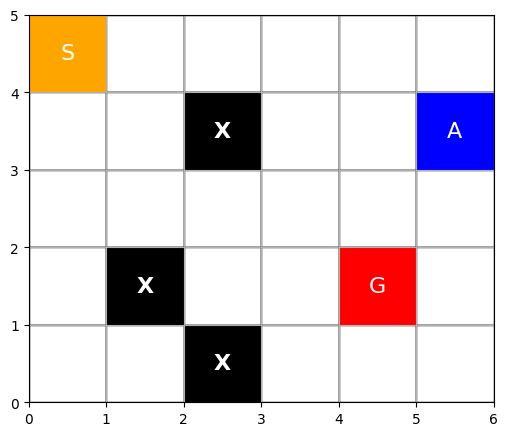

<Figure size 640x480 with 0 Axes>

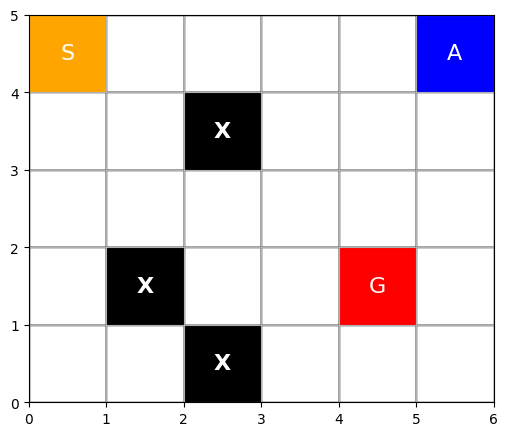

<Figure size 640x480 with 0 Axes>

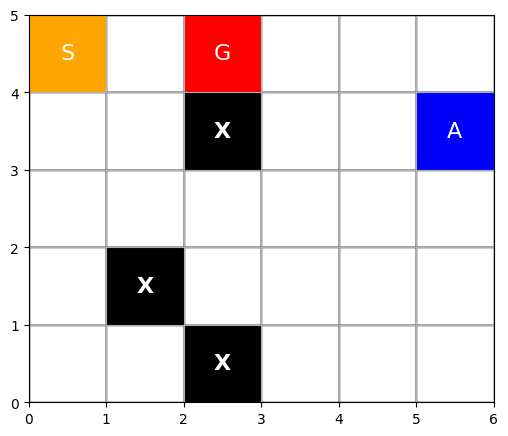

<Figure size 640x480 with 0 Axes>

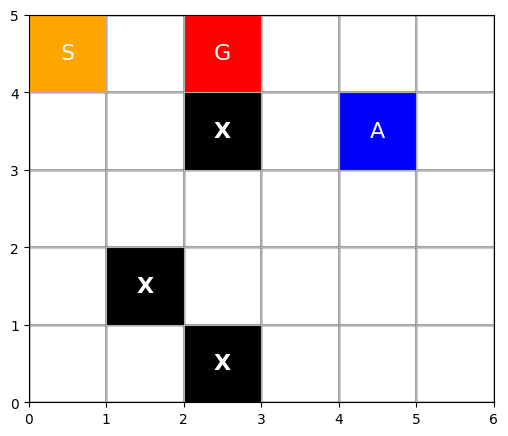

<Figure size 640x480 with 0 Axes>

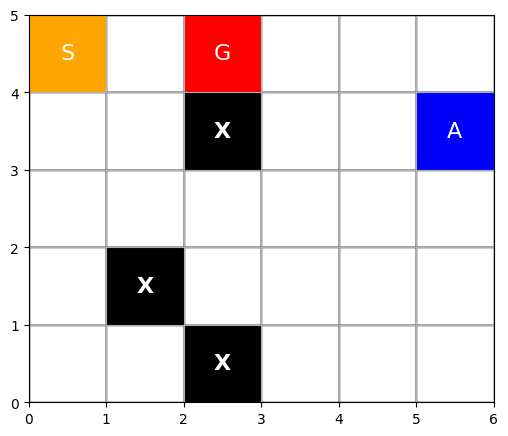

<Figure size 640x480 with 0 Axes>

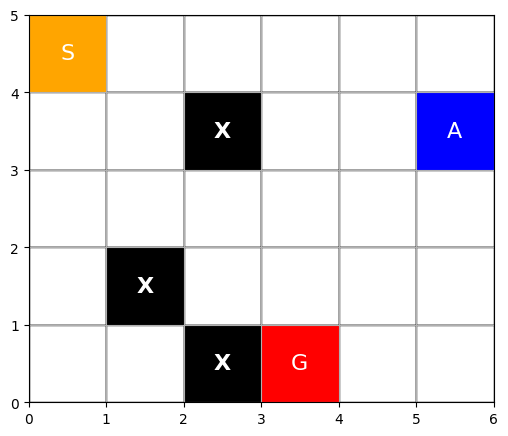

<Figure size 640x480 with 0 Axes>

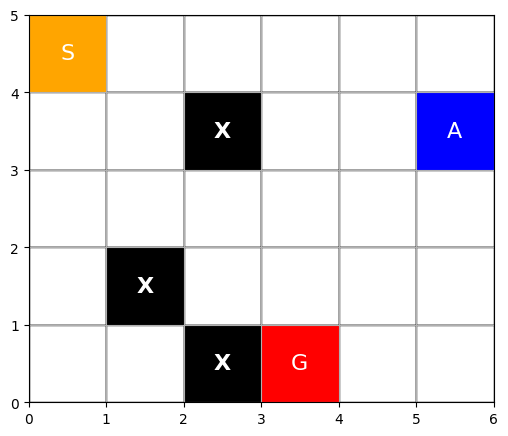

<Figure size 640x480 with 0 Axes>

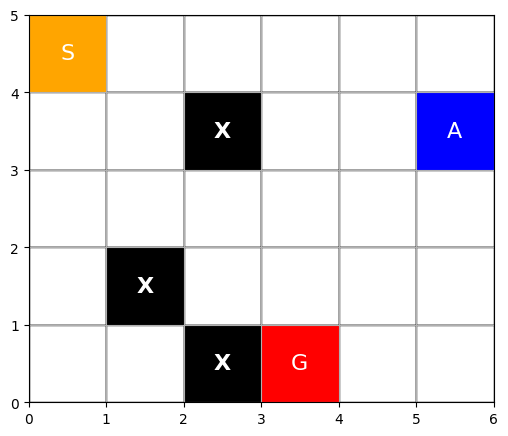

<Figure size 640x480 with 0 Axes>

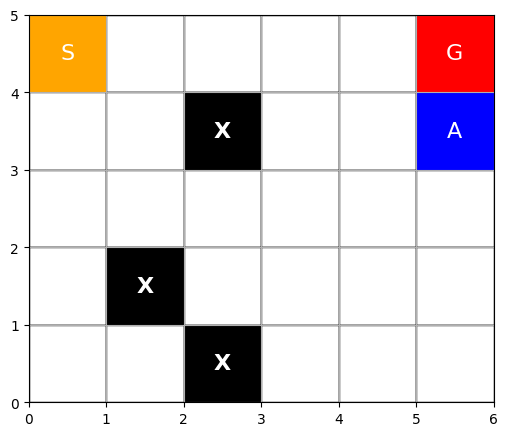

<Figure size 640x480 with 0 Axes>

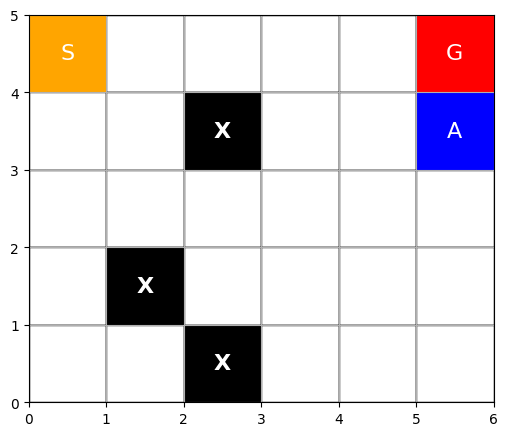

<Figure size 640x480 with 0 Axes>

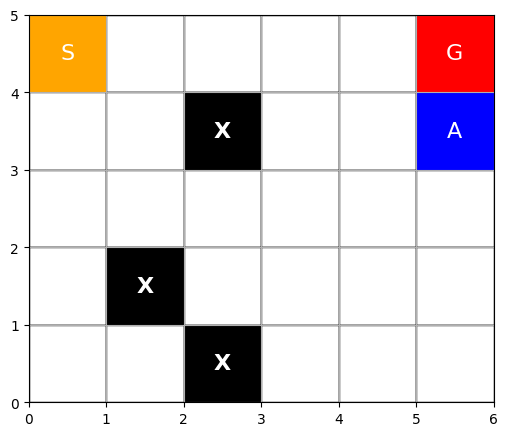

<Figure size 640x480 with 0 Axes>

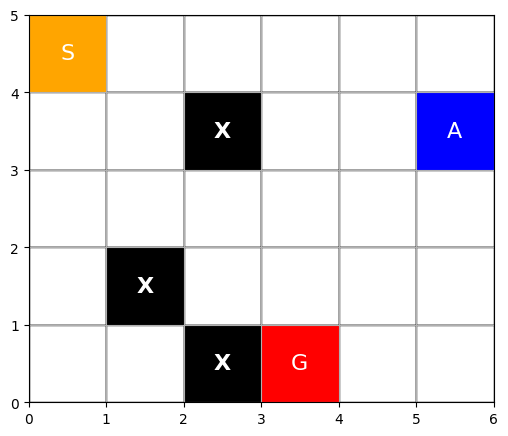

<Figure size 640x480 with 0 Axes>

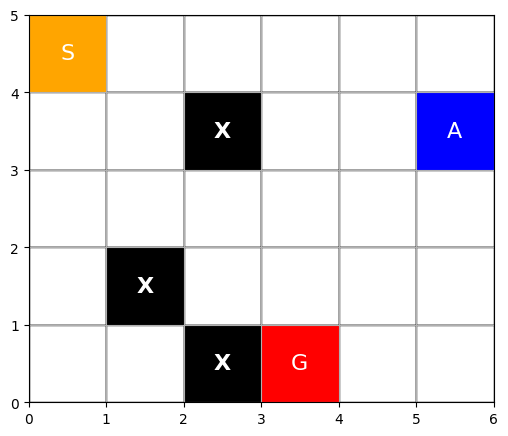

<Figure size 640x480 with 0 Axes>

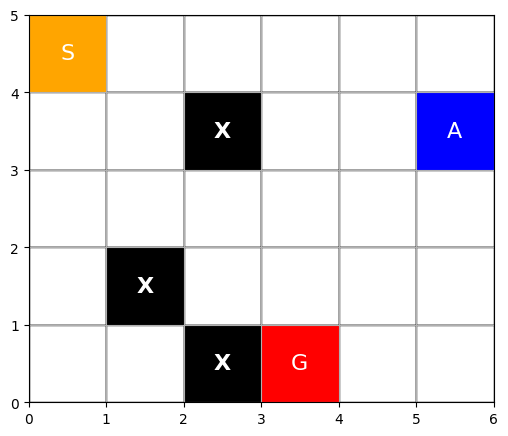

<Figure size 640x480 with 0 Axes>

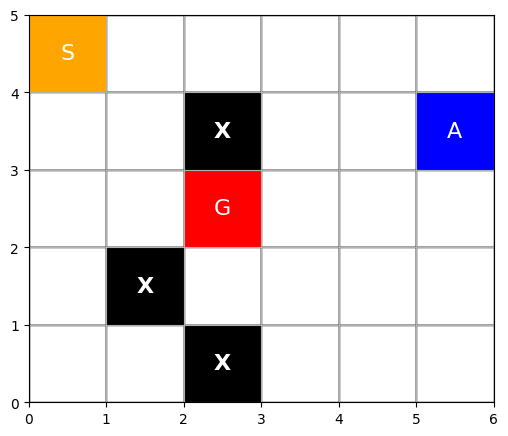

<Figure size 640x480 with 0 Axes>

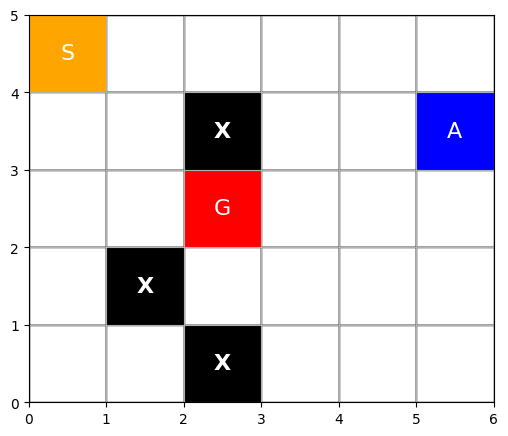

<Figure size 640x480 with 0 Axes>

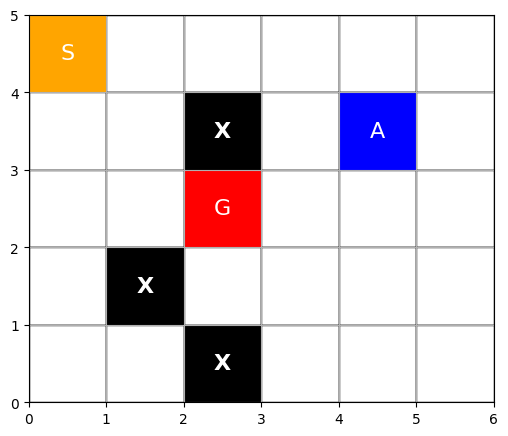

<Figure size 640x480 with 0 Axes>

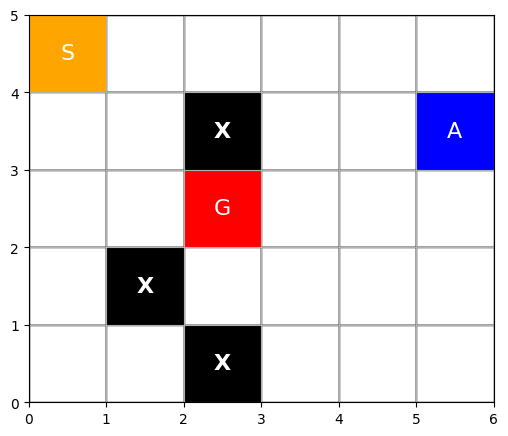

<Figure size 640x480 with 0 Axes>

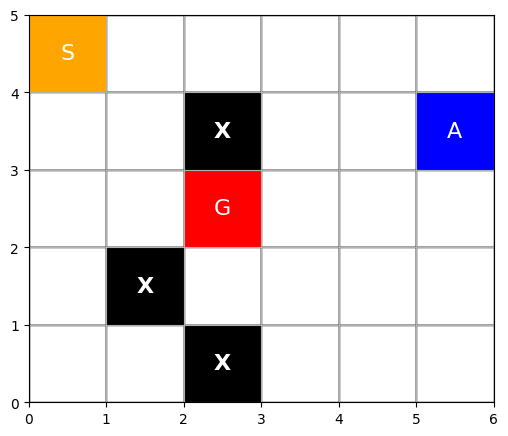

<Figure size 640x480 with 0 Axes>

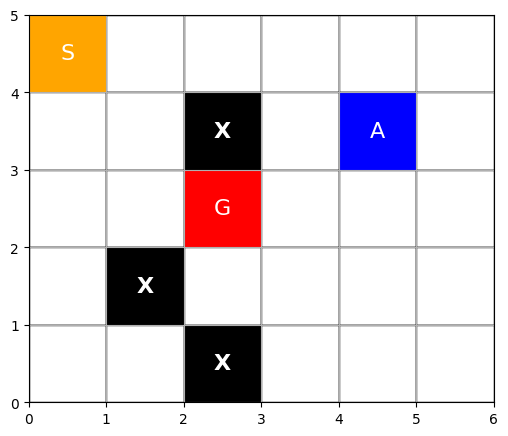

<Figure size 640x480 with 0 Axes>

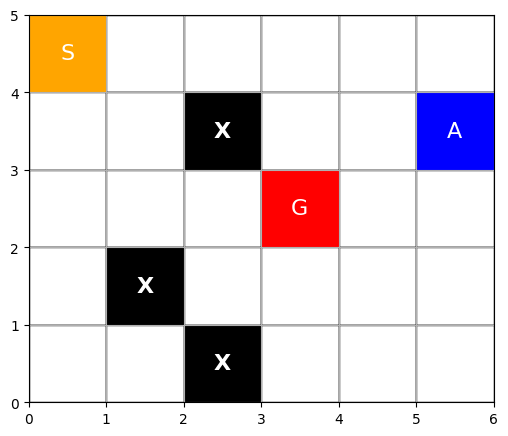

<Figure size 640x480 with 0 Axes>

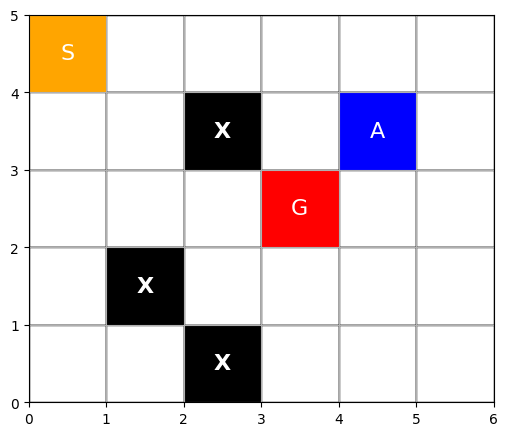

<Figure size 640x480 with 0 Axes>

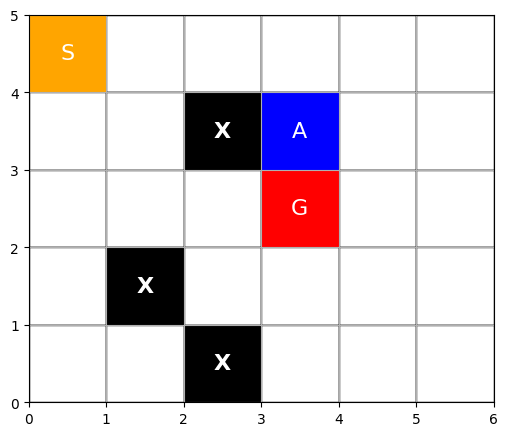

<Figure size 640x480 with 0 Axes>

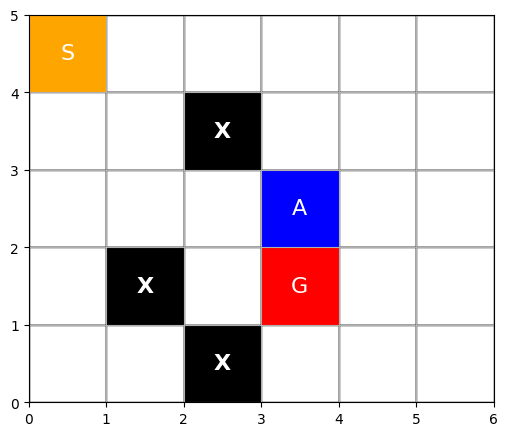

<Figure size 640x480 with 0 Axes>

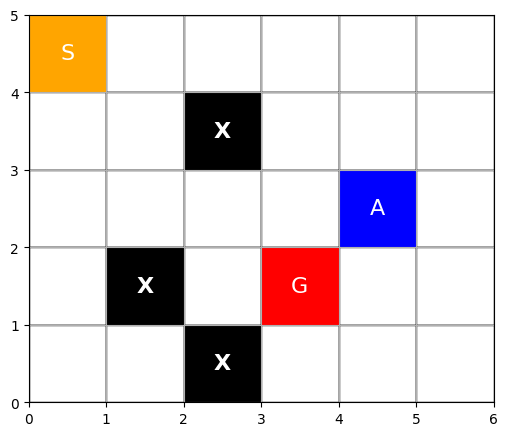

<Figure size 640x480 with 0 Axes>

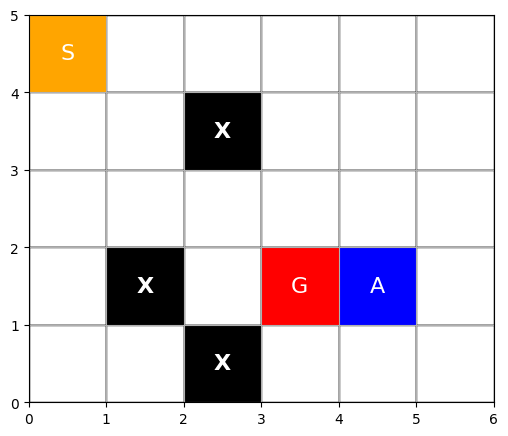

<Figure size 640x480 with 0 Axes>

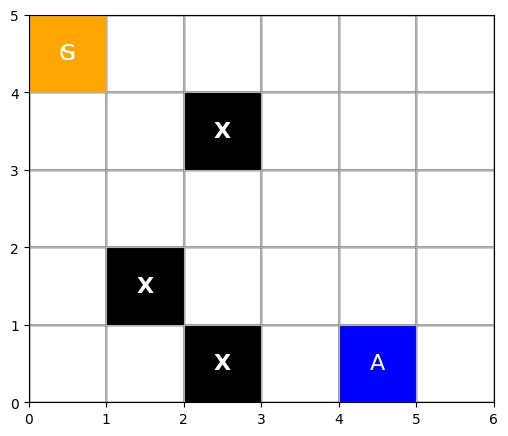

<Figure size 640x480 with 0 Axes>

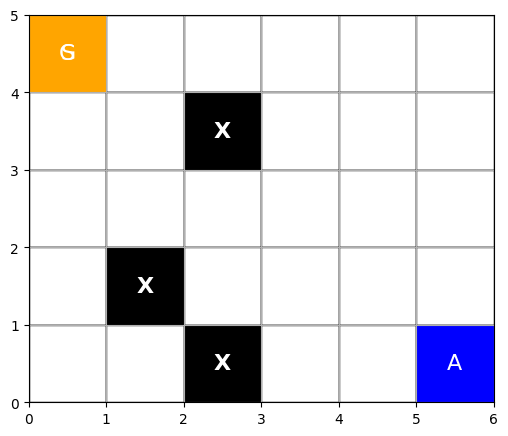

<Figure size 640x480 with 0 Axes>

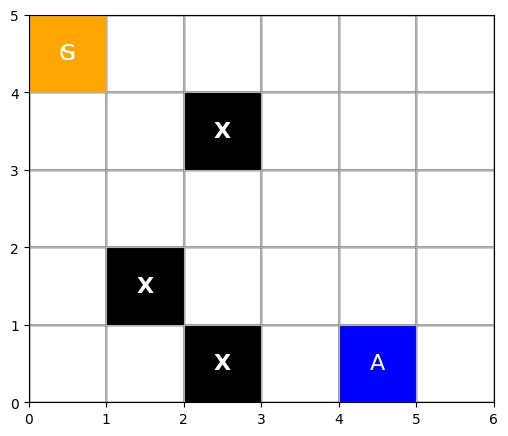

<Figure size 640x480 with 0 Axes>

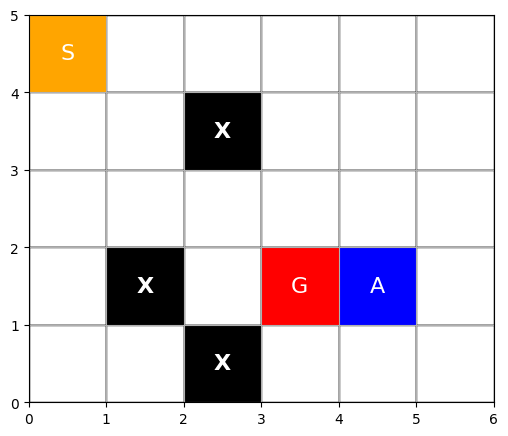

<Figure size 640x480 with 0 Axes>

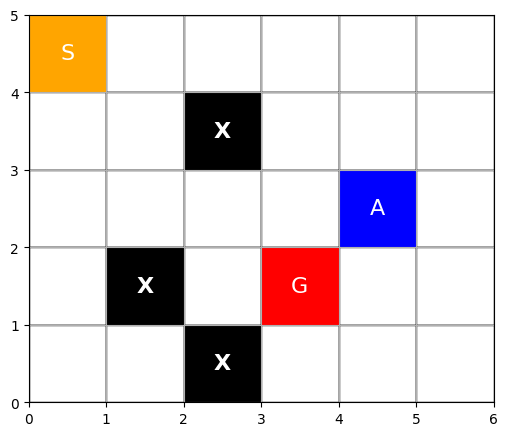

<Figure size 640x480 with 0 Axes>

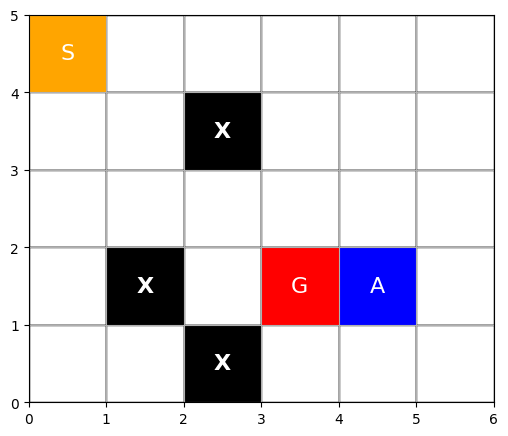

<Figure size 640x480 with 0 Axes>

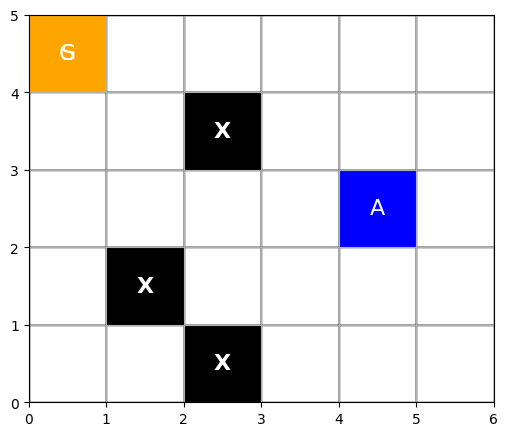

<Figure size 640x480 with 0 Axes>

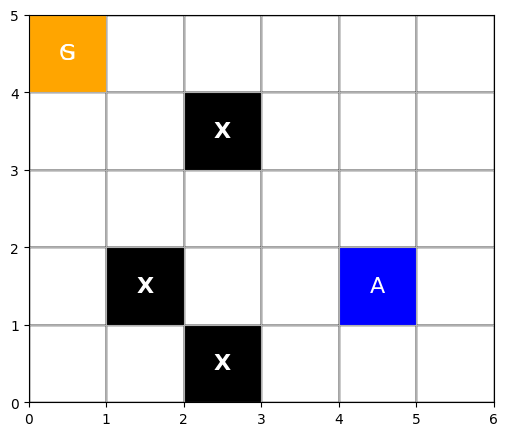

<Figure size 640x480 with 0 Axes>

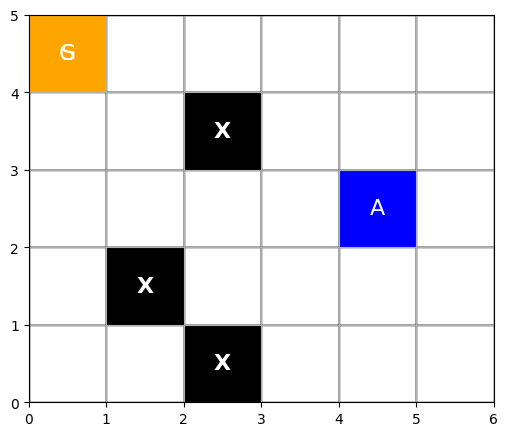

<Figure size 640x480 with 0 Axes>

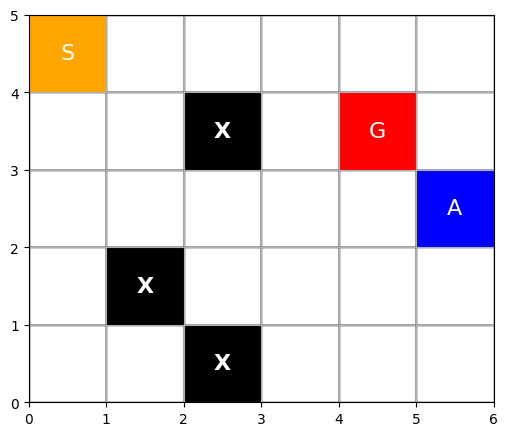

<Figure size 640x480 with 0 Axes>

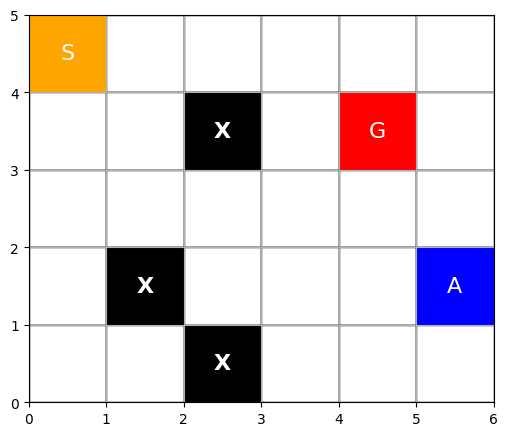

<Figure size 640x480 with 0 Axes>

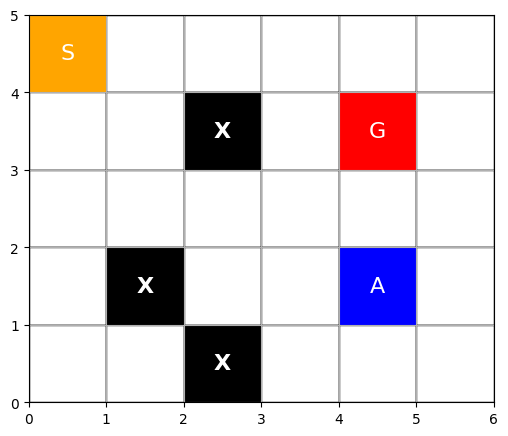

<Figure size 640x480 with 0 Axes>

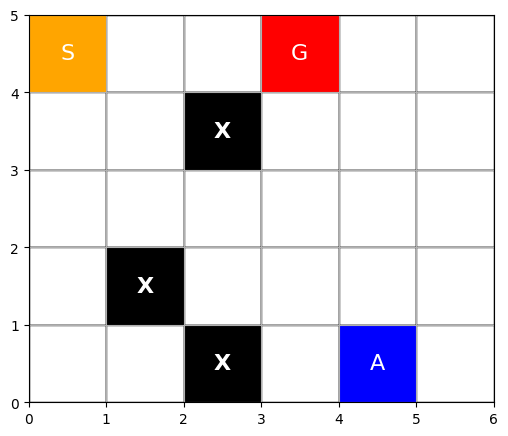

<Figure size 640x480 with 0 Axes>

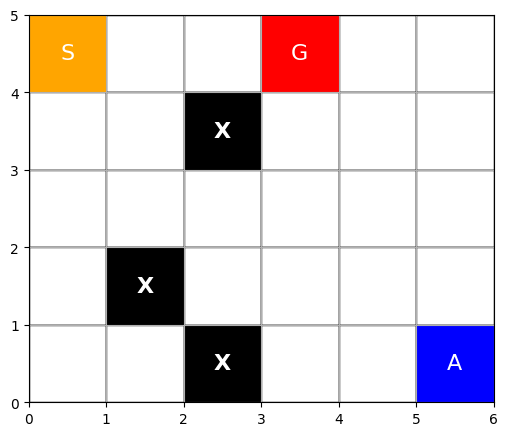

<Figure size 640x480 with 0 Axes>

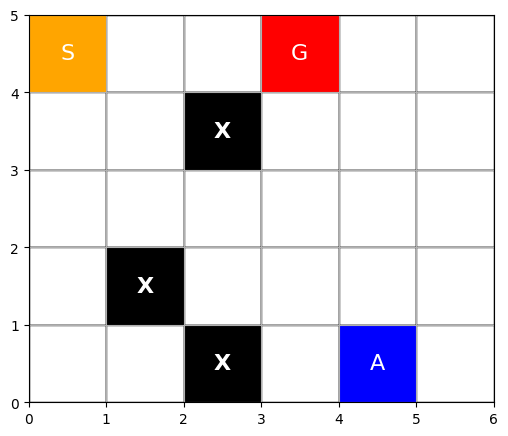

<Figure size 640x480 with 0 Axes>

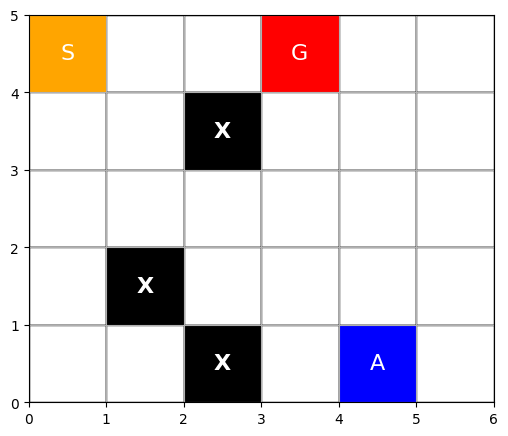

<Figure size 640x480 with 0 Axes>

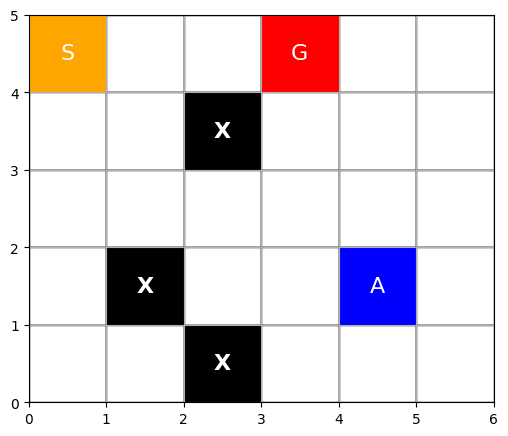

<Figure size 640x480 with 0 Axes>

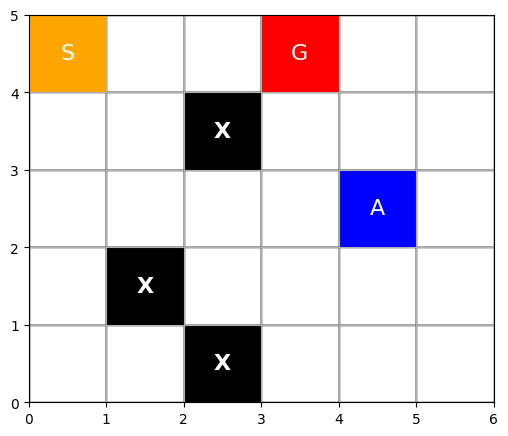

<Figure size 640x480 with 0 Axes>

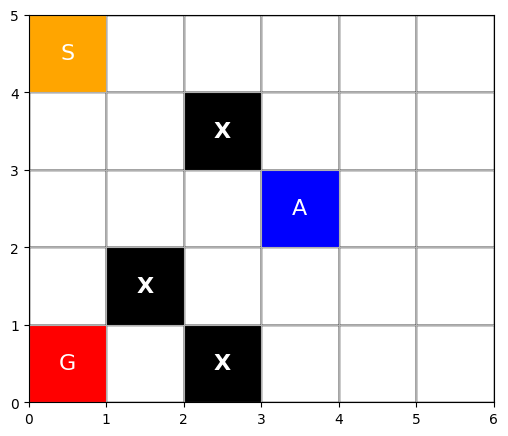

<Figure size 640x480 with 0 Axes>

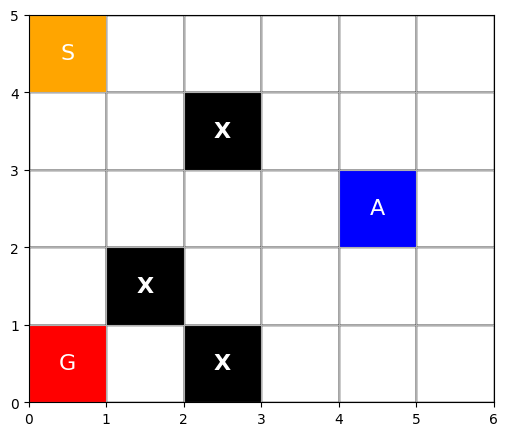

<Figure size 640x480 with 0 Axes>

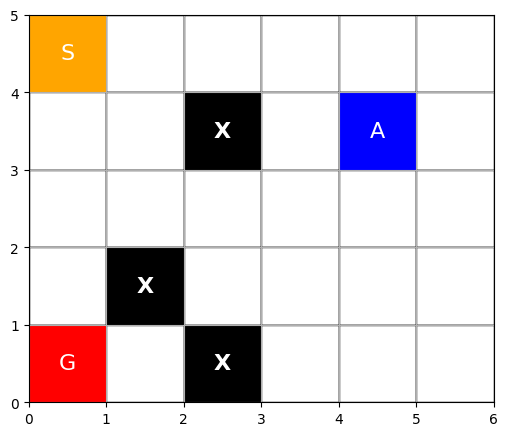

<Figure size 640x480 with 0 Axes>

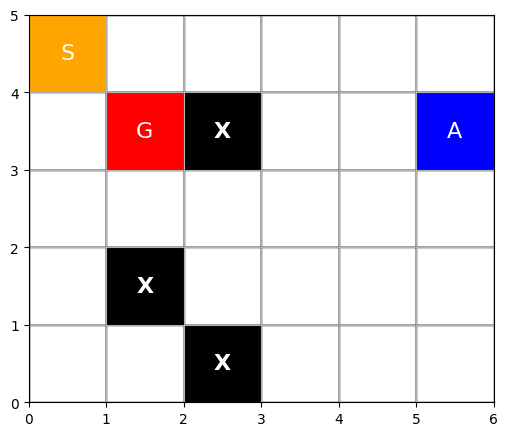

<Figure size 640x480 with 0 Axes>

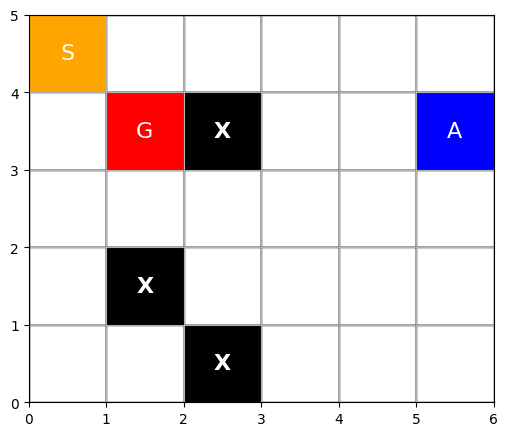

<Figure size 640x480 with 0 Axes>

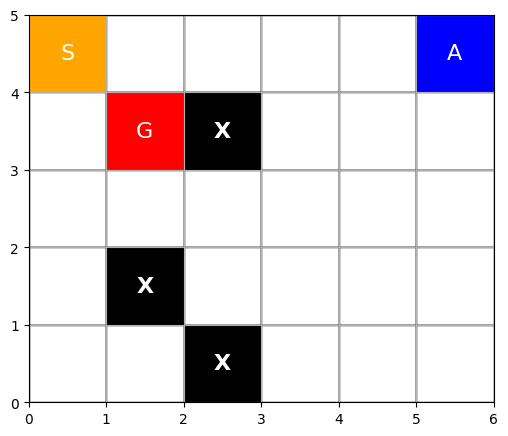

<Figure size 640x480 with 0 Axes>

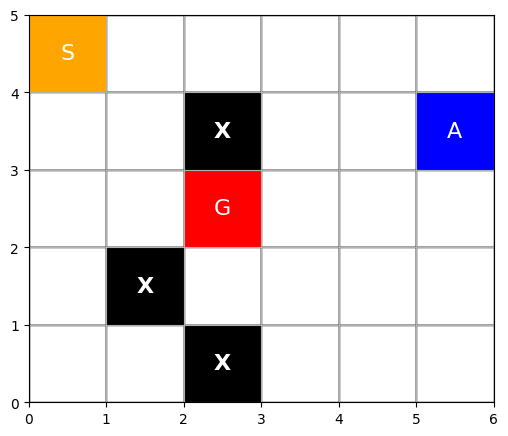

<Figure size 640x480 with 0 Axes>

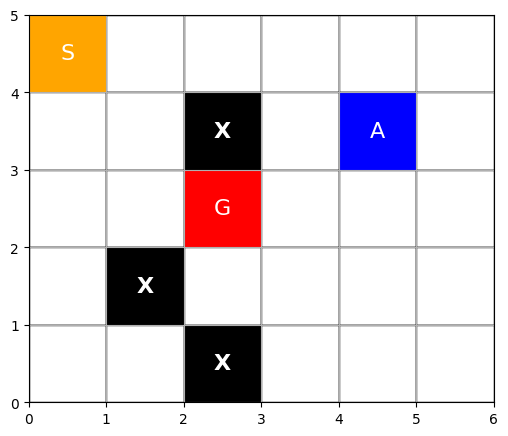

<Figure size 640x480 with 0 Axes>

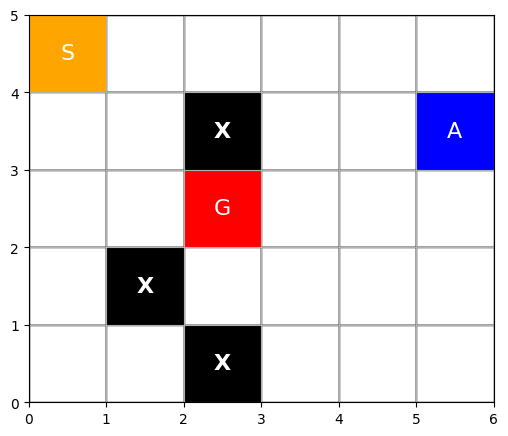

<Figure size 640x480 with 0 Axes>

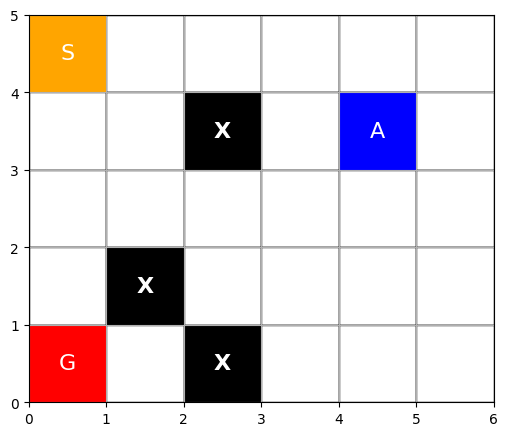

<Figure size 640x480 with 0 Axes>

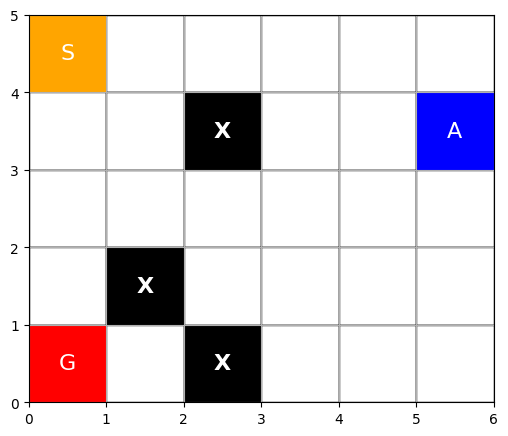

<Figure size 640x480 with 0 Axes>

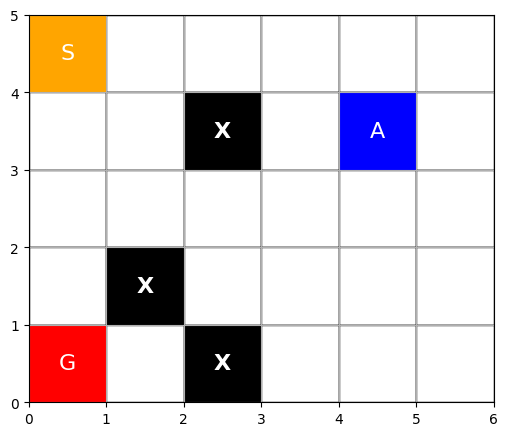

<Figure size 640x480 with 0 Axes>

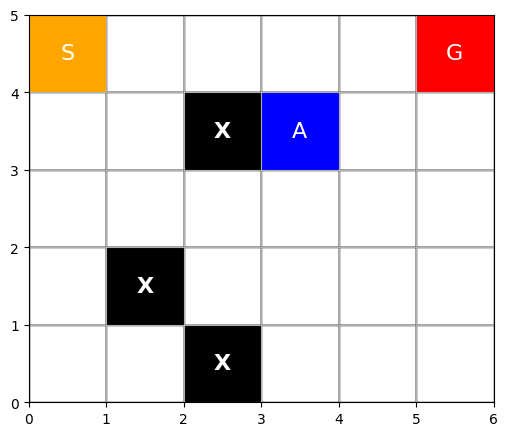

<Figure size 640x480 with 0 Axes>

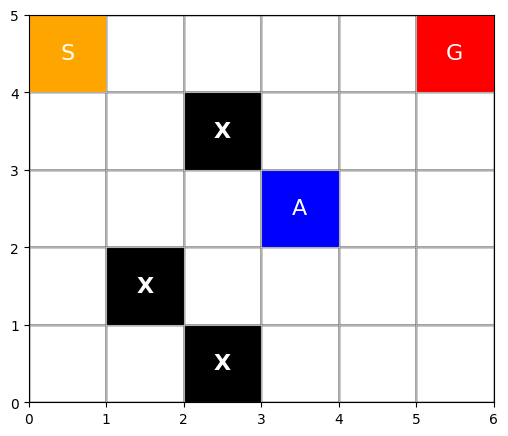

<Figure size 640x480 with 0 Axes>

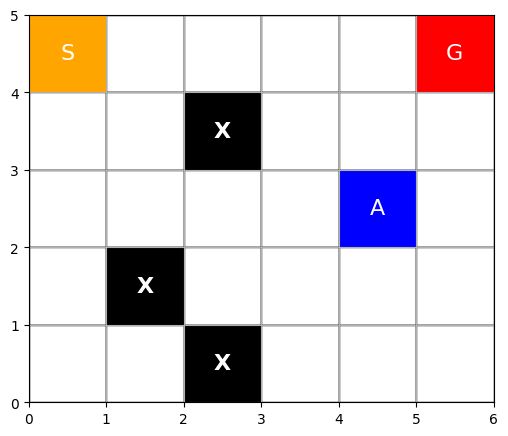

<Figure size 640x480 with 0 Axes>

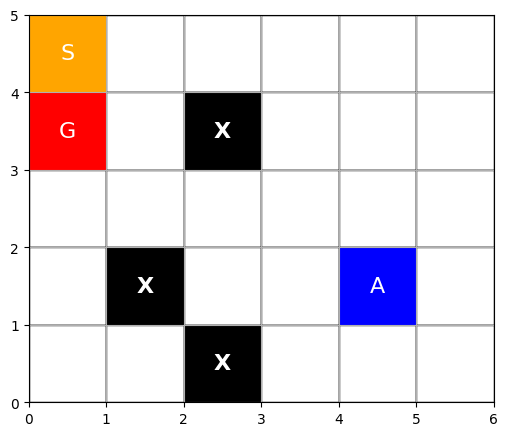

<Figure size 640x480 with 0 Axes>

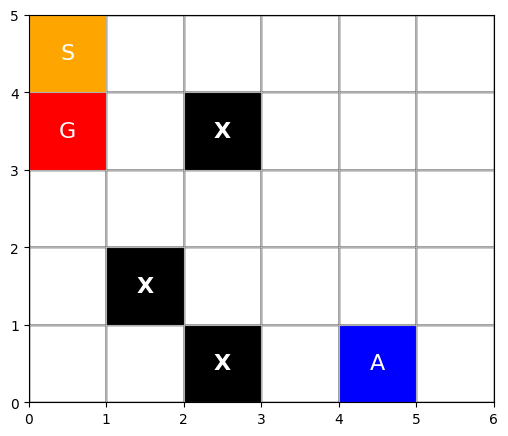

<Figure size 640x480 with 0 Axes>

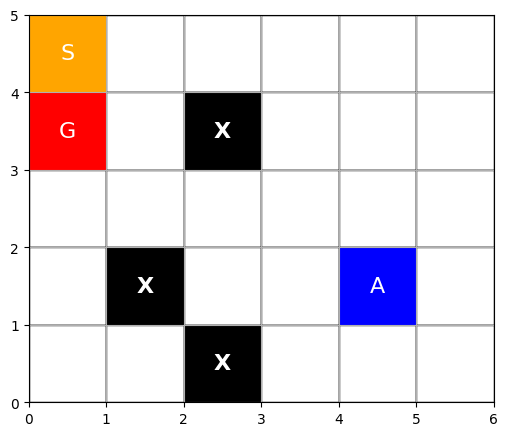

<Figure size 640x480 with 0 Axes>

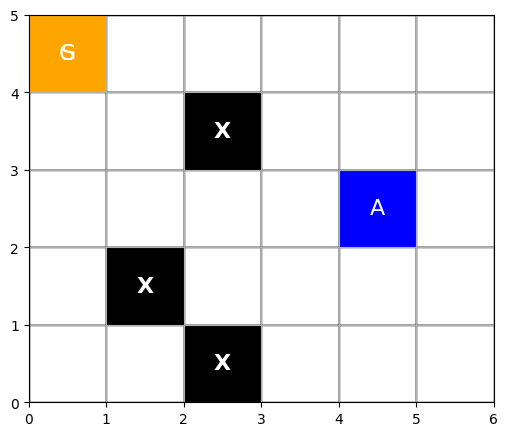

<Figure size 640x480 with 0 Axes>

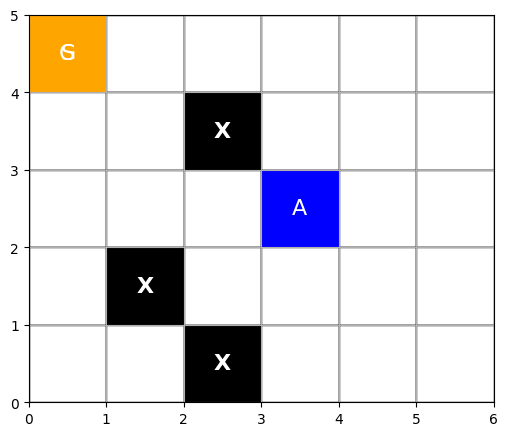

<Figure size 640x480 with 0 Axes>

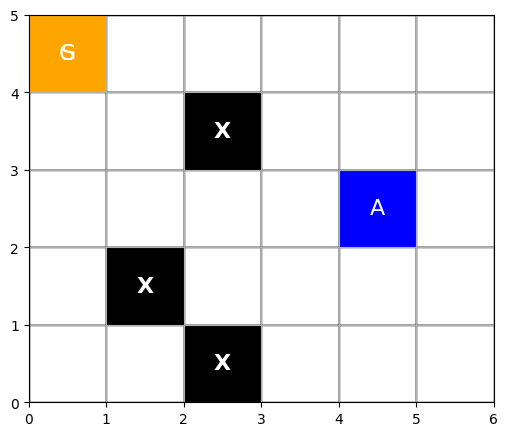

<Figure size 640x480 with 0 Axes>

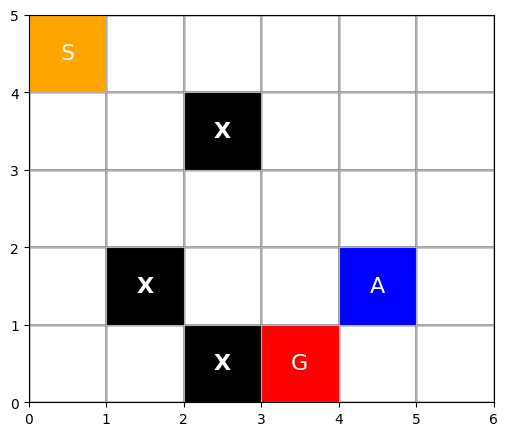

<Figure size 640x480 with 0 Axes>

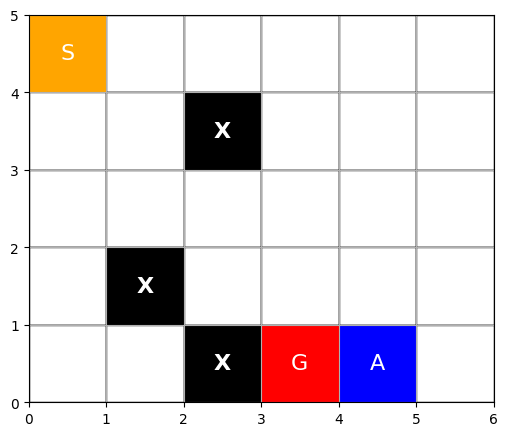

<Figure size 640x480 with 0 Axes>

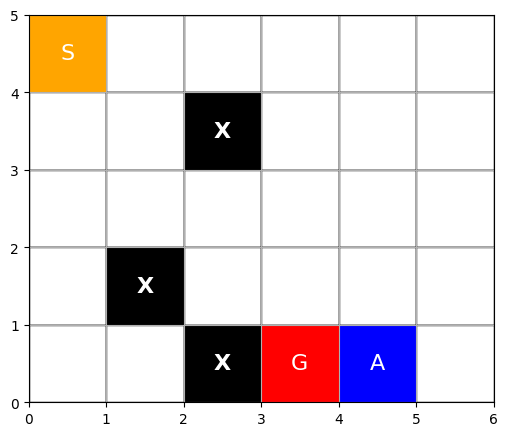

<Figure size 640x480 with 0 Axes>

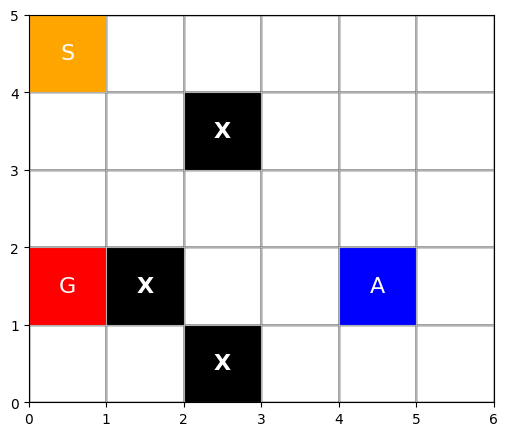

<Figure size 640x480 with 0 Axes>

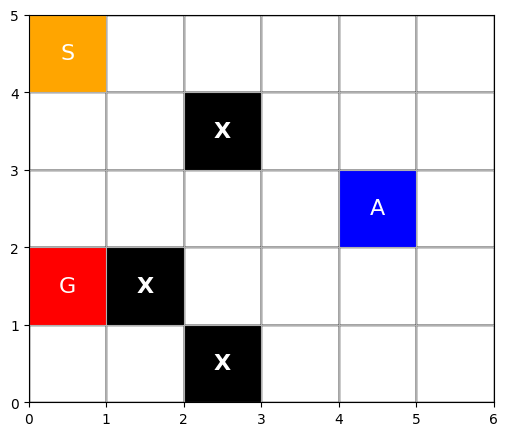

<Figure size 640x480 with 0 Axes>

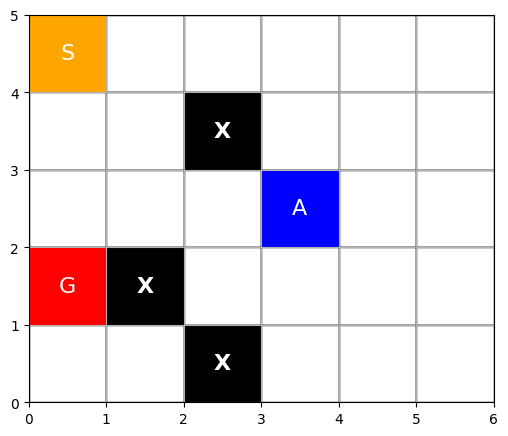

<Figure size 640x480 with 0 Axes>

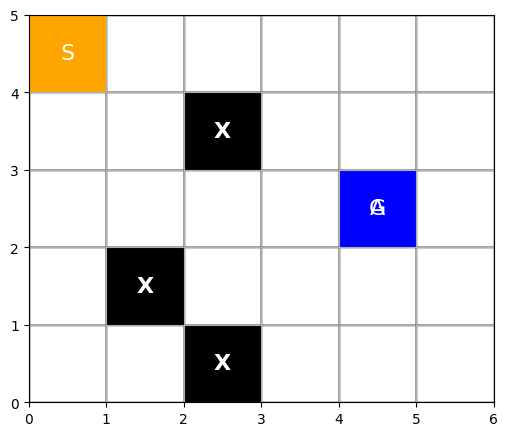

<Figure size 640x480 with 0 Axes>

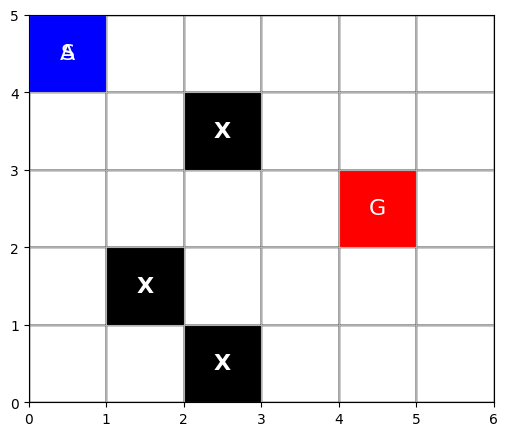

<Figure size 640x480 with 0 Axes>

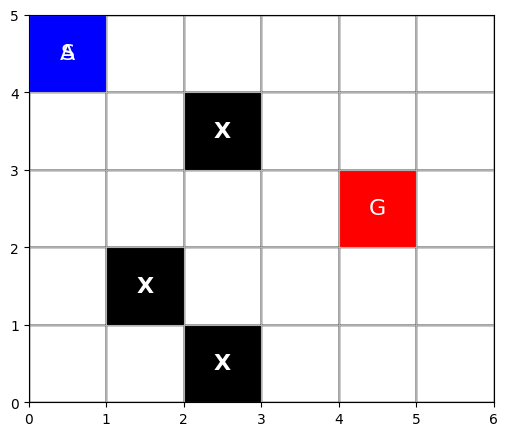

<Figure size 640x480 with 0 Axes>

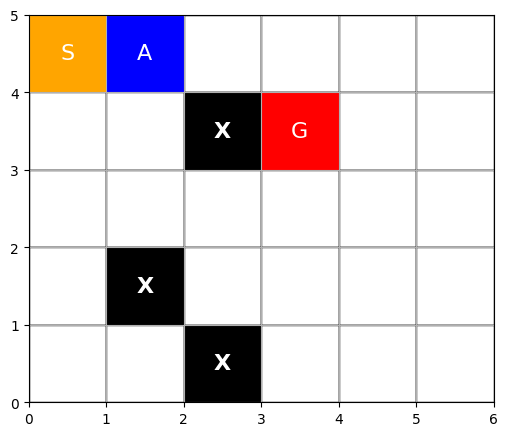

<Figure size 640x480 with 0 Axes>

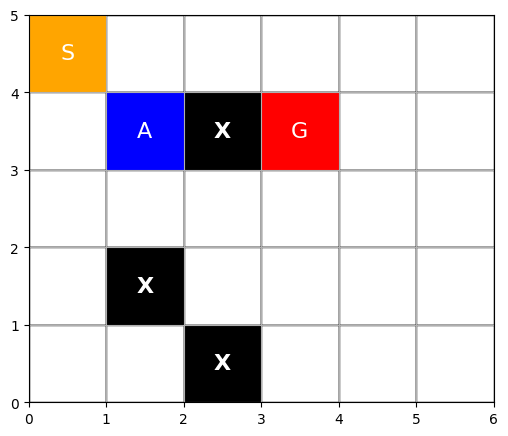

<Figure size 640x480 with 0 Axes>

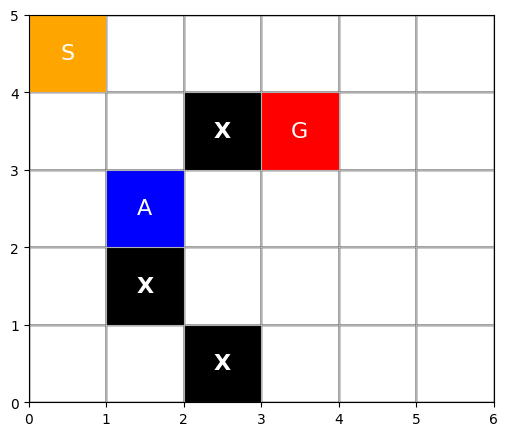

<Figure size 640x480 with 0 Axes>

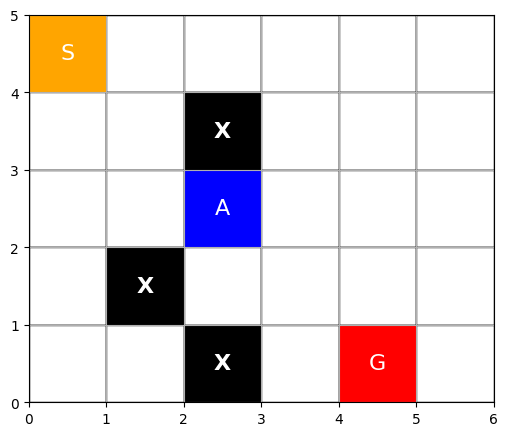

<Figure size 640x480 with 0 Axes>

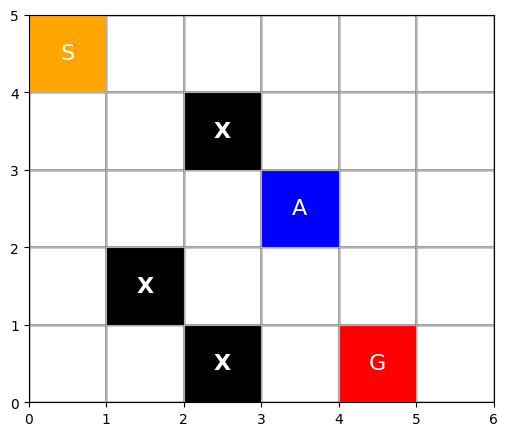

<Figure size 640x480 with 0 Axes>

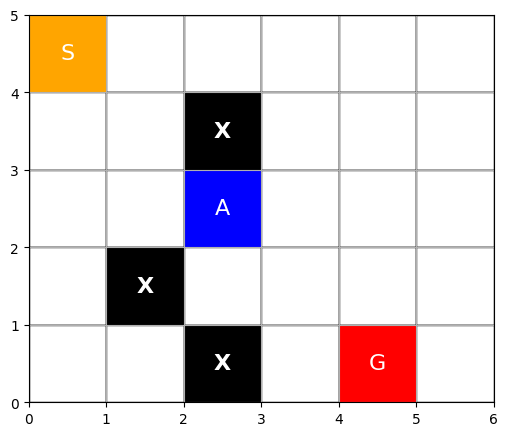

<Figure size 640x480 with 0 Axes>

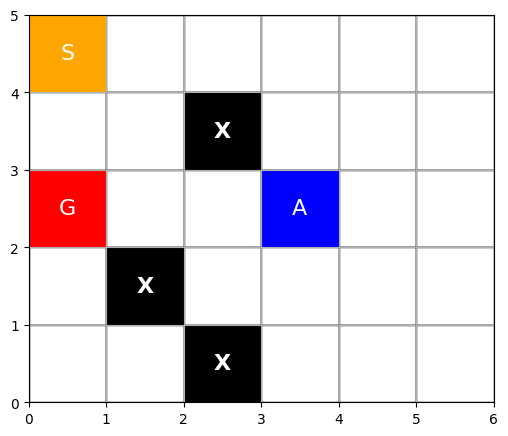

<Figure size 640x480 with 0 Axes>

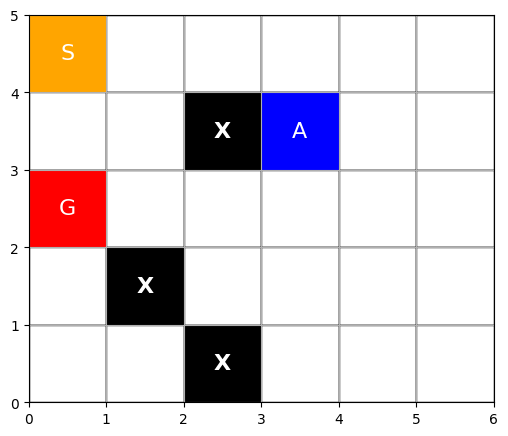

<Figure size 640x480 with 0 Axes>

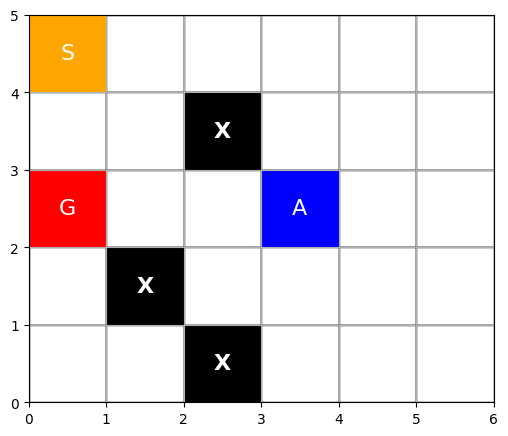

<Figure size 640x480 with 0 Axes>

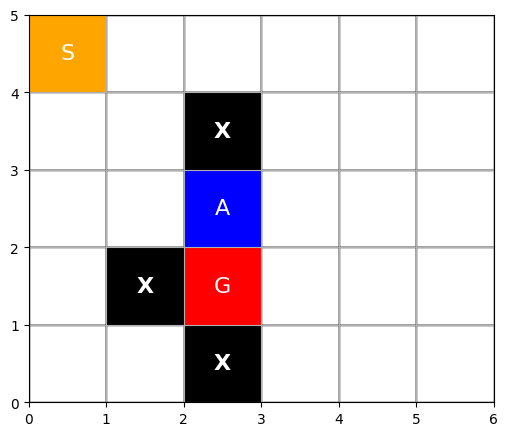

<Figure size 640x480 with 0 Axes>

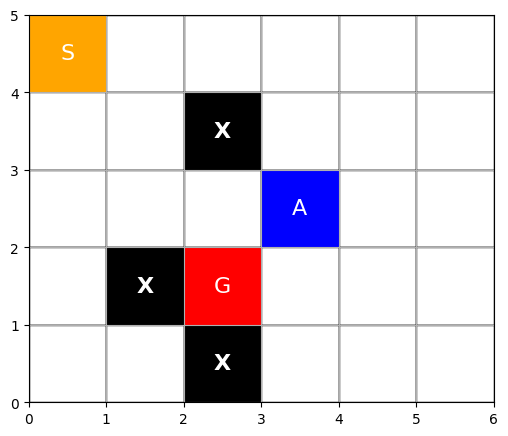

<Figure size 640x480 with 0 Axes>

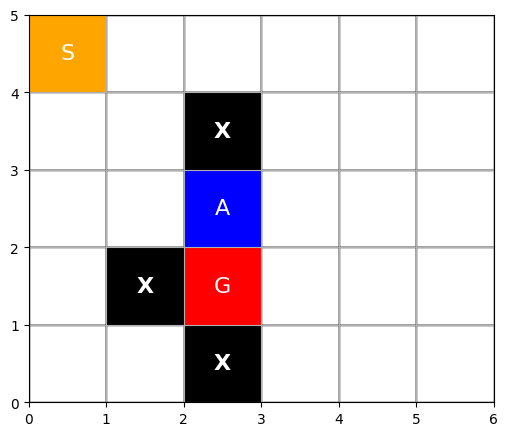

<Figure size 640x480 with 0 Axes>

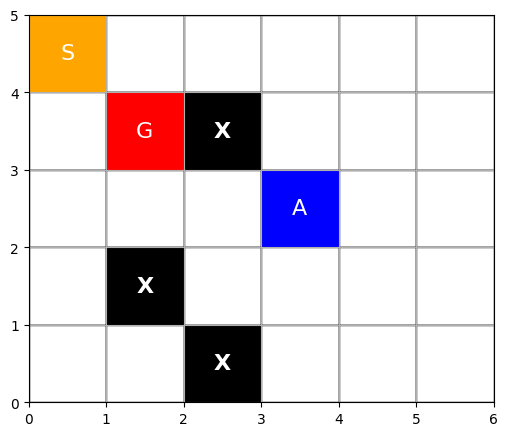

<Figure size 640x480 with 0 Axes>

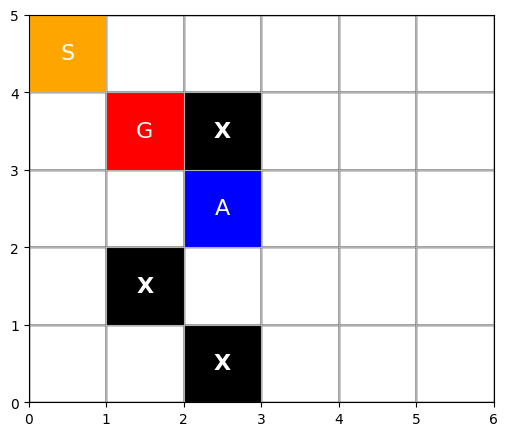

<Figure size 640x480 with 0 Axes>

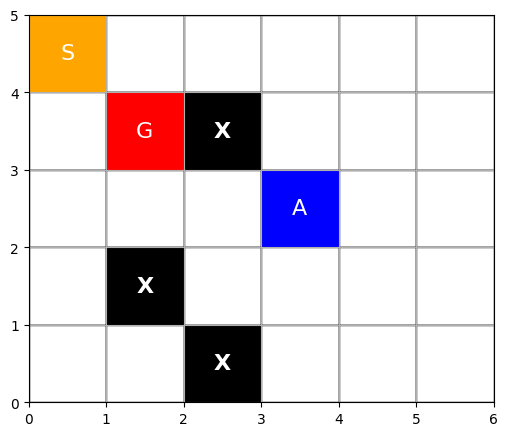

<Figure size 640x480 with 0 Axes>

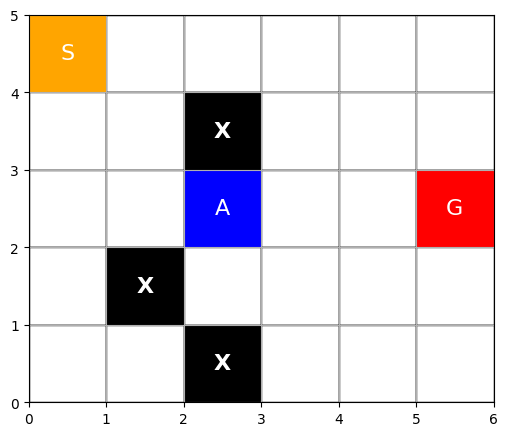

<Figure size 640x480 with 0 Axes>

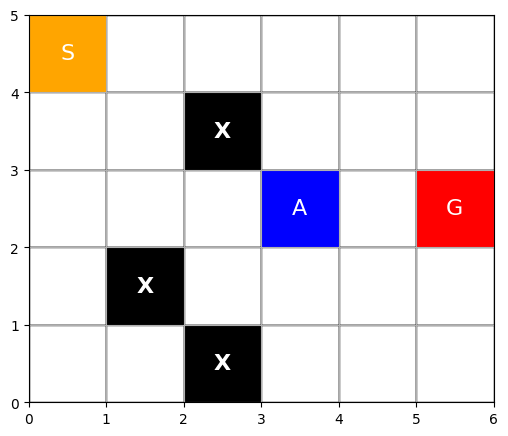

<Figure size 640x480 with 0 Axes>

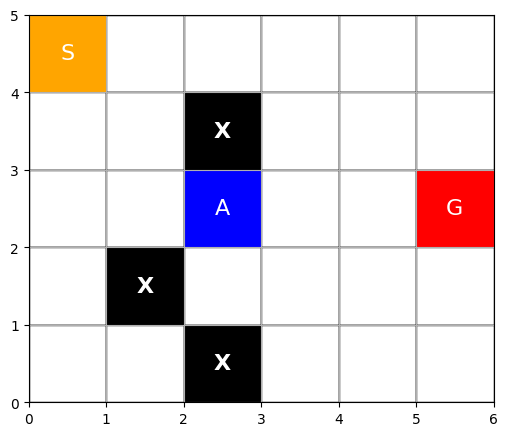

<Figure size 640x480 with 0 Axes>

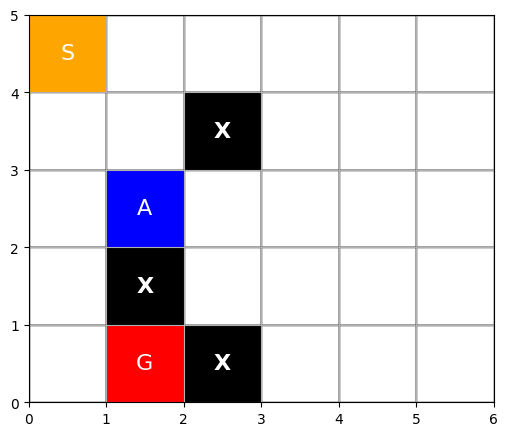

<Figure size 640x480 with 0 Axes>

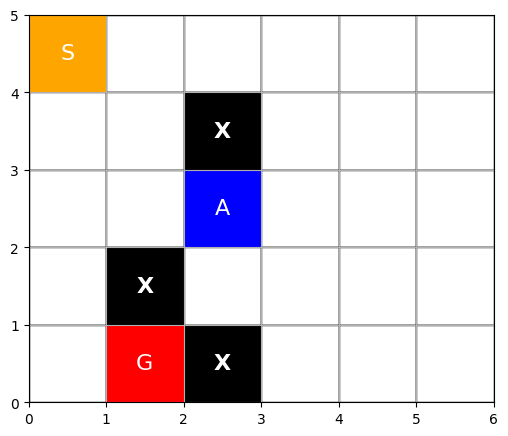

<Figure size 640x480 with 0 Axes>

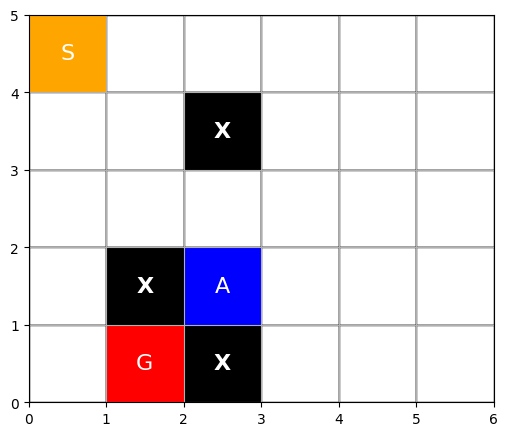

<Figure size 640x480 with 0 Axes>

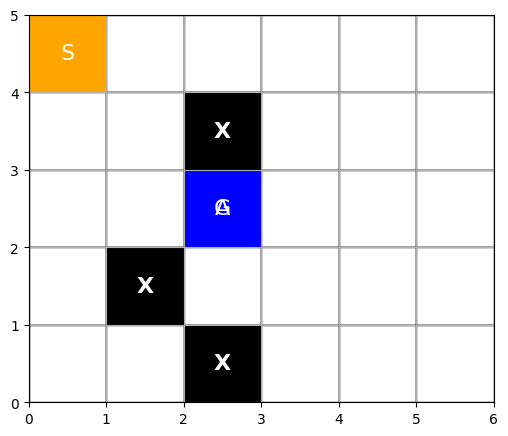

<Figure size 640x480 with 0 Axes>

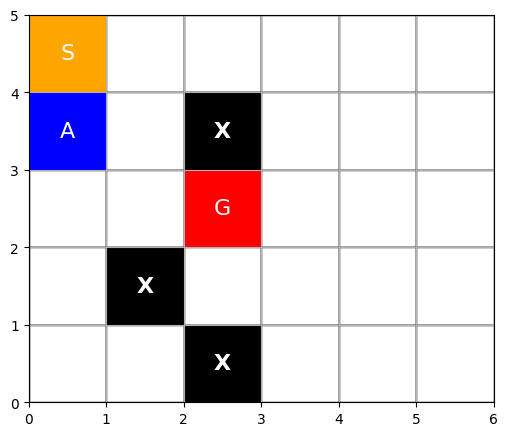

<Figure size 640x480 with 0 Axes>

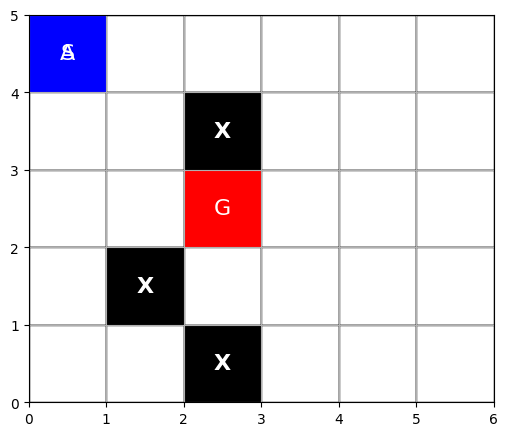

<Figure size 640x480 with 0 Axes>

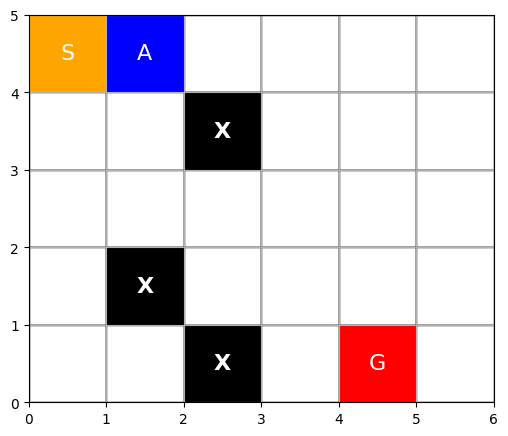

<Figure size 640x480 with 0 Axes>

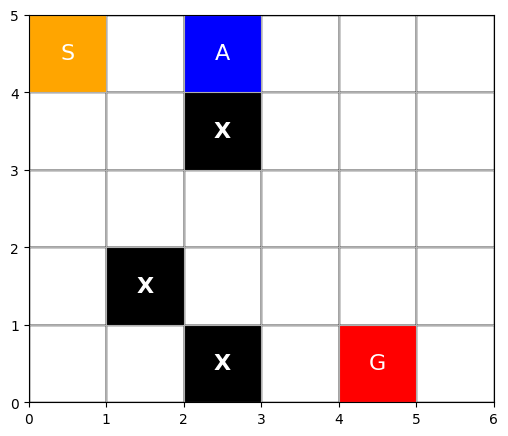

<Figure size 640x480 with 0 Axes>

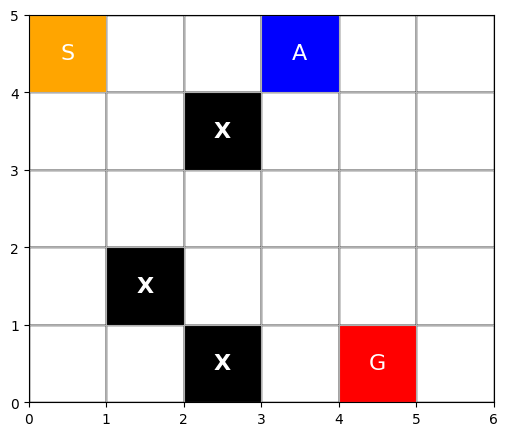

<Figure size 640x480 with 0 Axes>

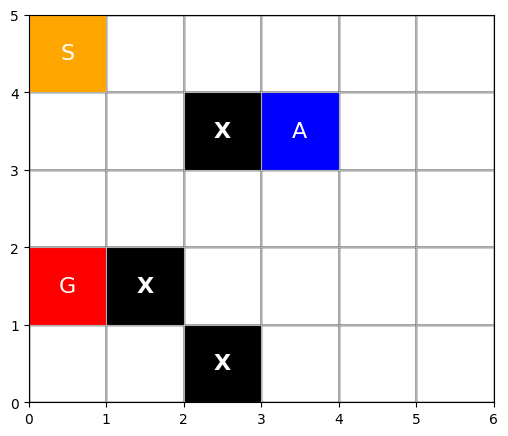

<Figure size 640x480 with 0 Axes>

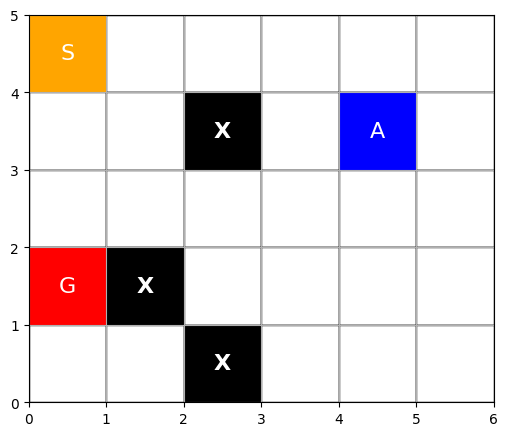

<Figure size 640x480 with 0 Axes>

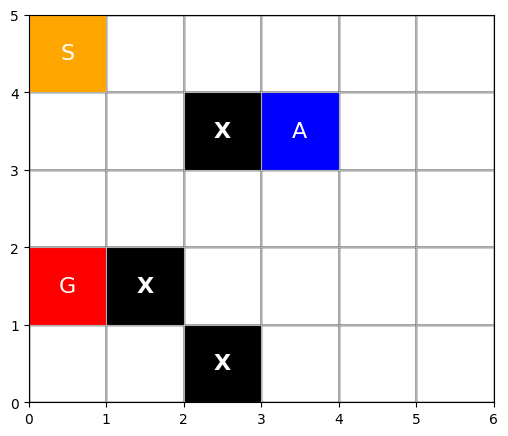

<Figure size 640x480 with 0 Axes>

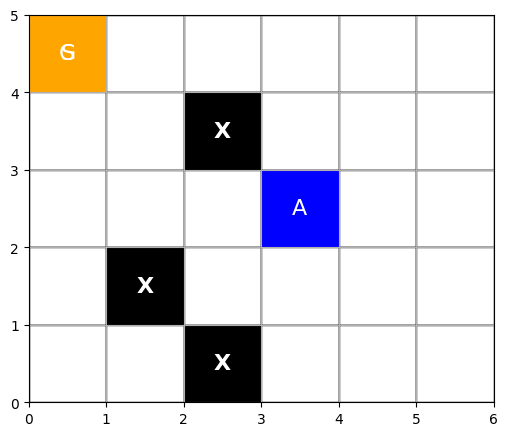

<Figure size 640x480 with 0 Axes>

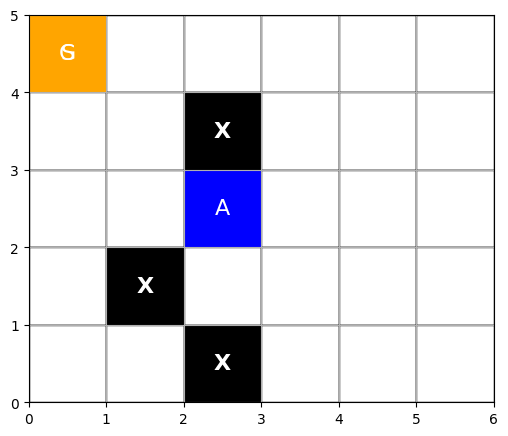

<Figure size 640x480 with 0 Axes>

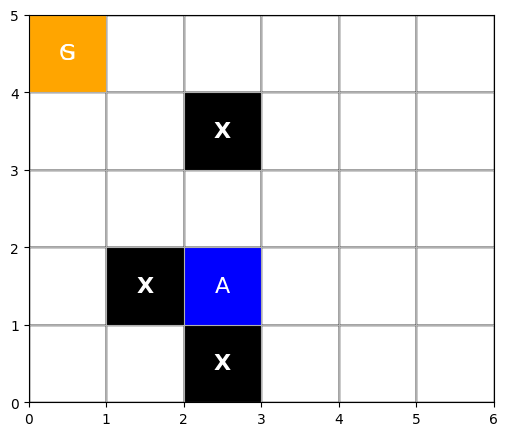

<Figure size 640x480 with 0 Axes>

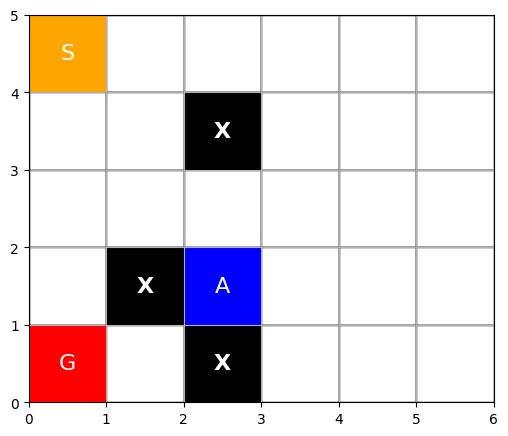

<Figure size 640x480 with 0 Axes>

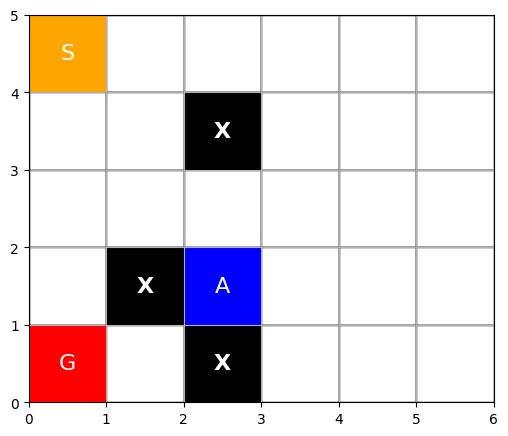

<Figure size 640x480 with 0 Axes>

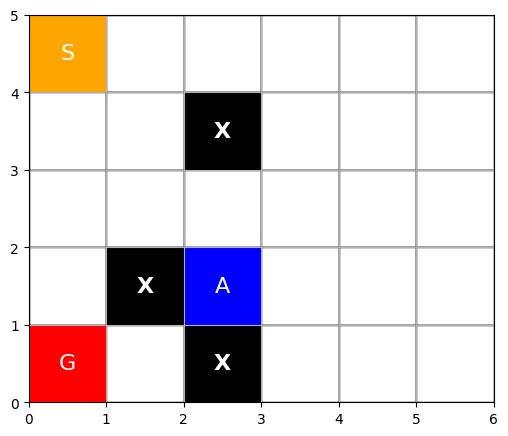

<Figure size 640x480 with 0 Axes>

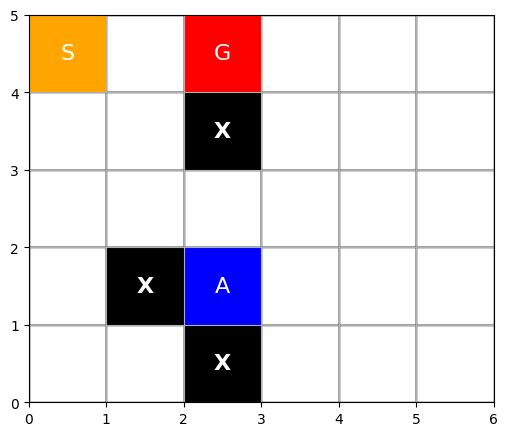

<Figure size 640x480 with 0 Axes>

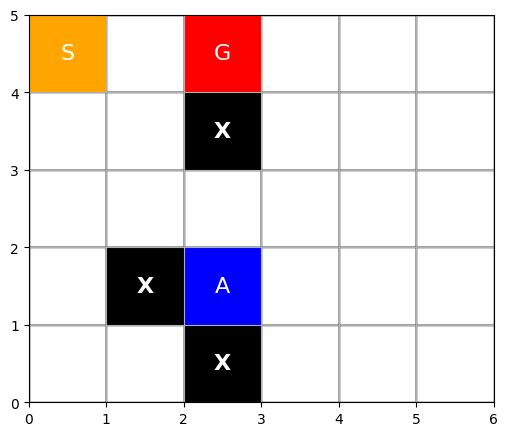

<Figure size 640x480 with 0 Axes>

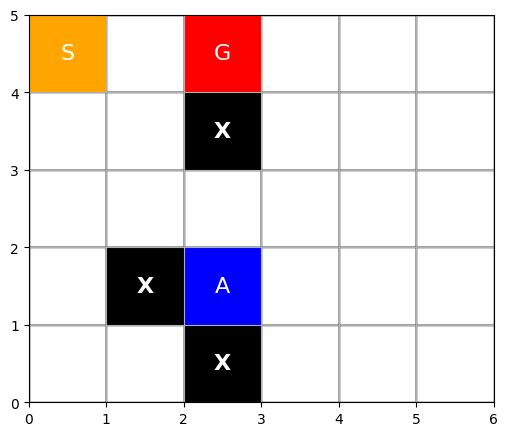

<Figure size 640x480 with 0 Axes>

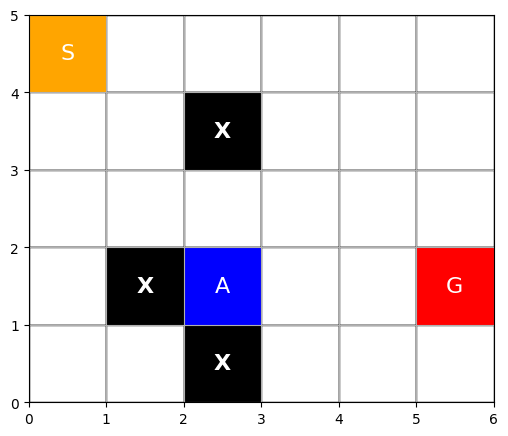

<Figure size 640x480 with 0 Axes>

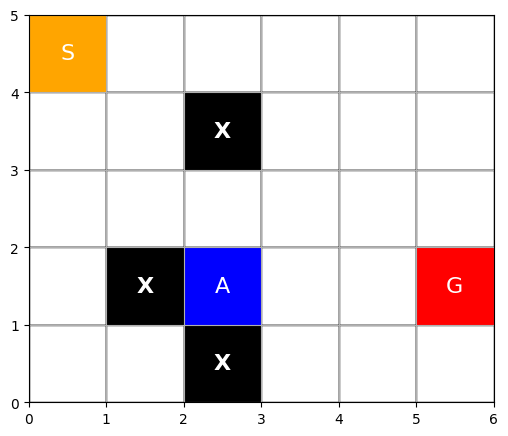

<Figure size 640x480 with 0 Axes>

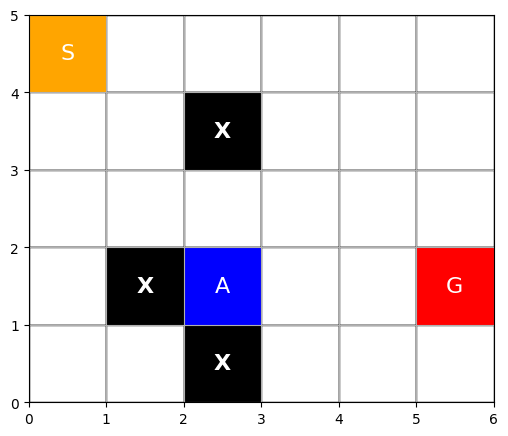

<Figure size 640x480 with 0 Axes>

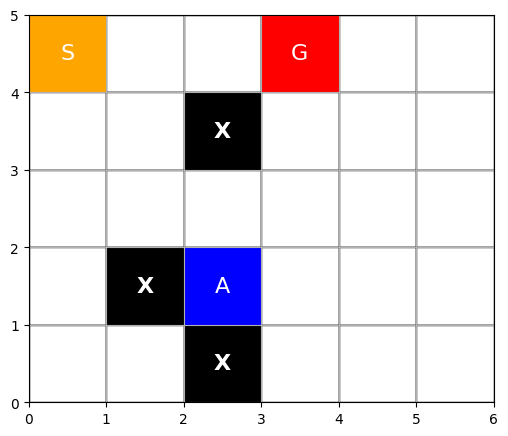

<Figure size 640x480 with 0 Axes>

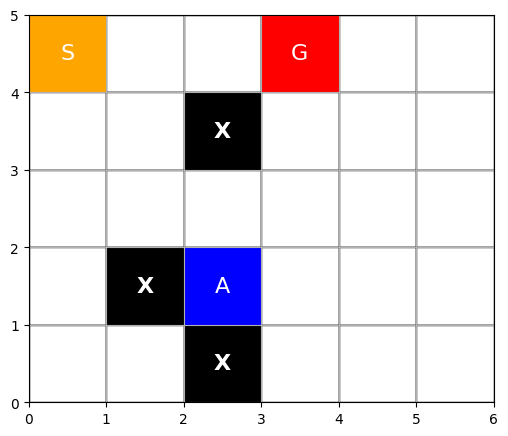

<Figure size 640x480 with 0 Axes>

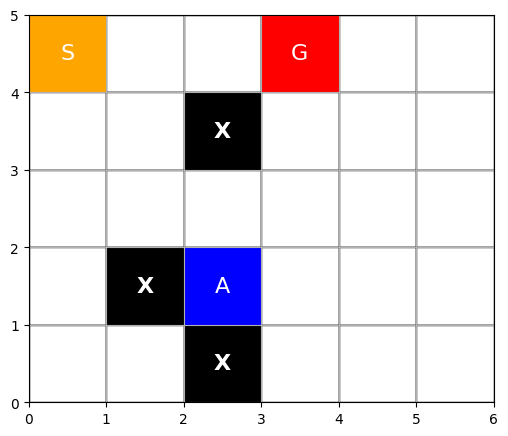

<Figure size 640x480 with 0 Axes>

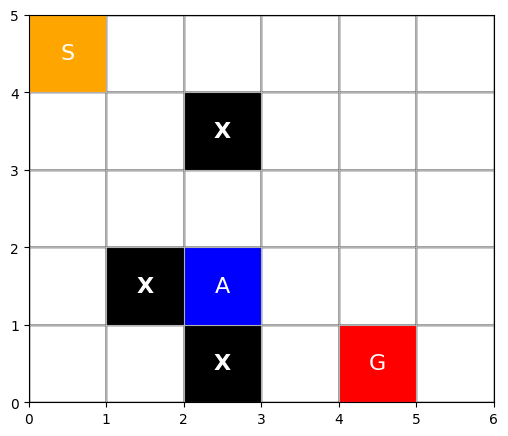

<Figure size 640x480 with 0 Axes>

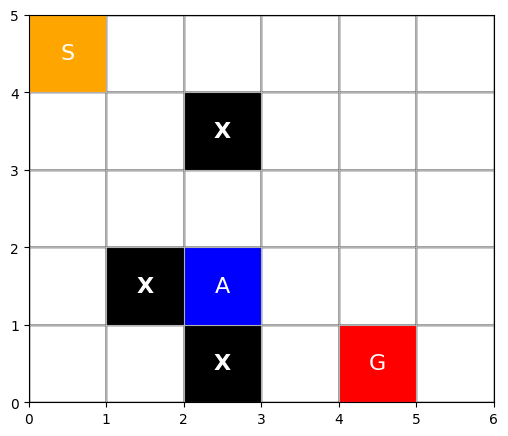

<Figure size 640x480 with 0 Axes>

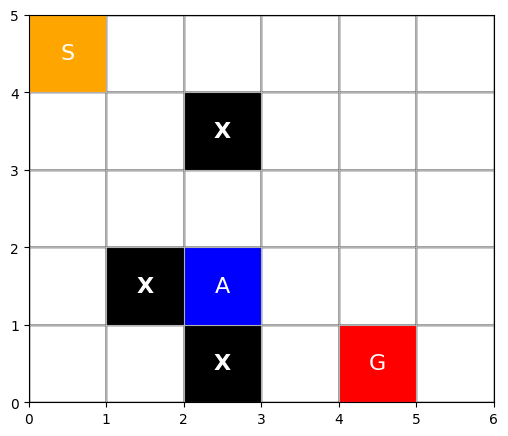

<Figure size 640x480 with 0 Axes>

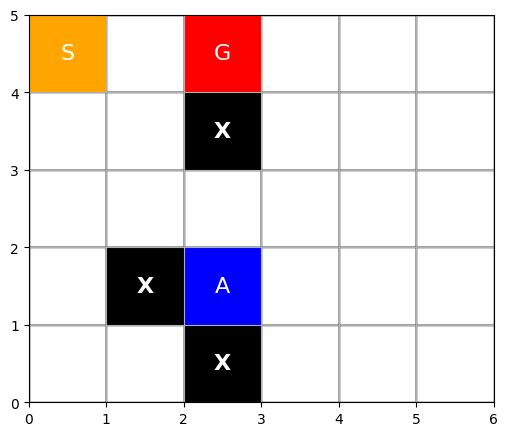

<Figure size 640x480 with 0 Axes>

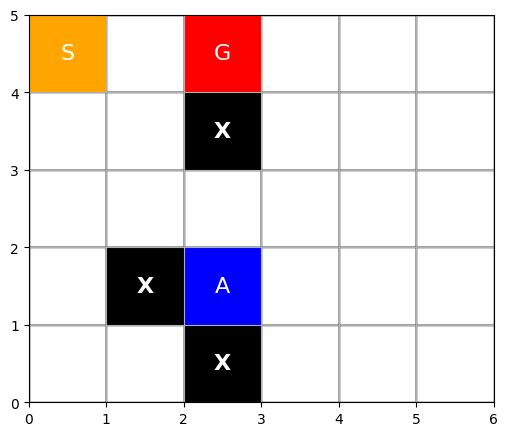

<Figure size 640x480 with 0 Axes>

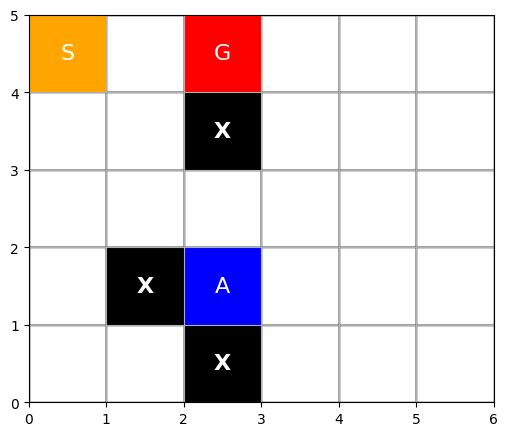

<Figure size 640x480 with 0 Axes>

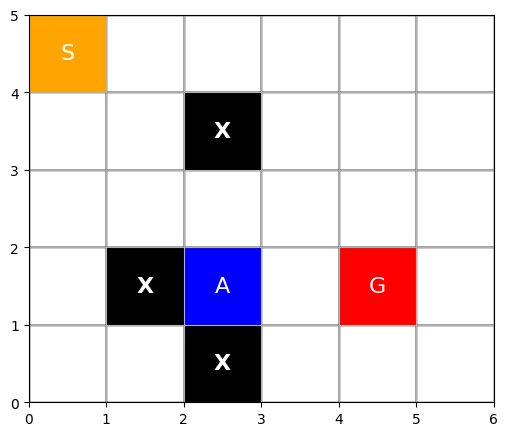

<Figure size 640x480 with 0 Axes>

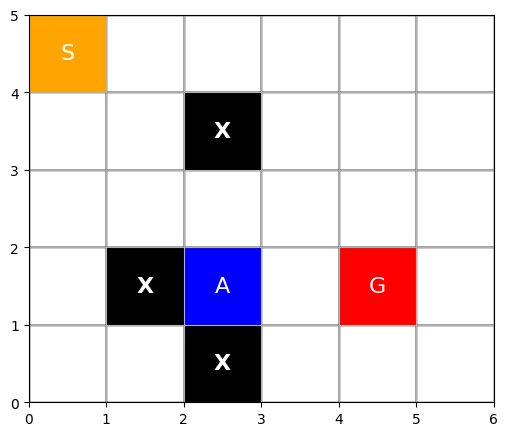

<Figure size 640x480 with 0 Axes>

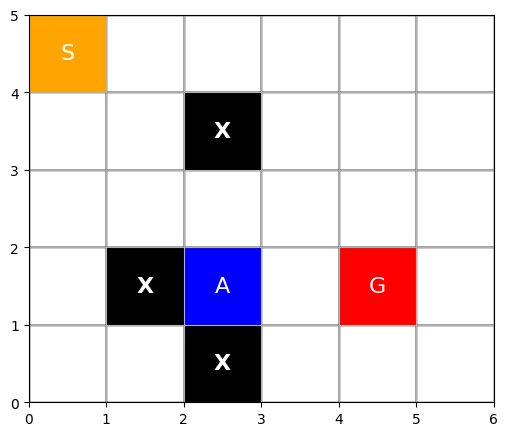

<Figure size 640x480 with 0 Axes>

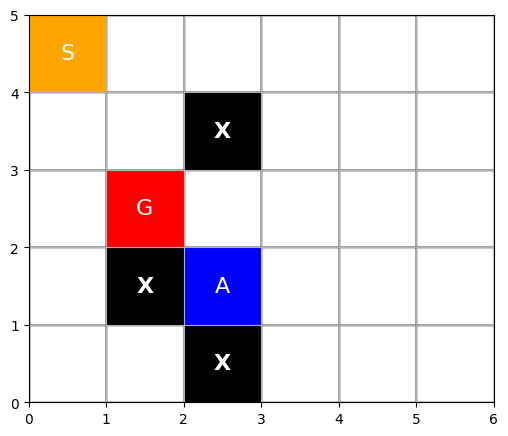

<Figure size 640x480 with 0 Axes>

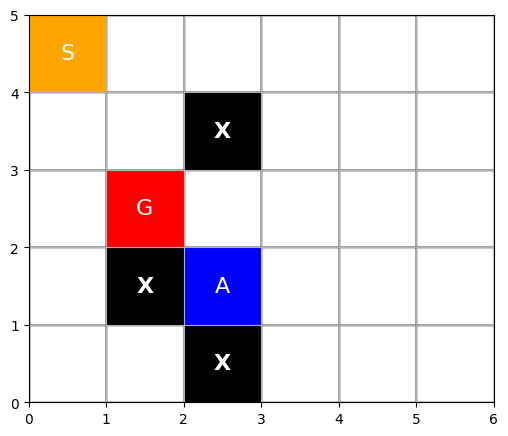

<Figure size 640x480 with 0 Axes>

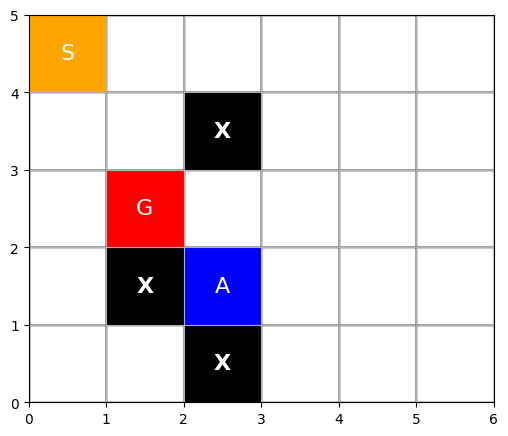

<Figure size 640x480 with 0 Axes>

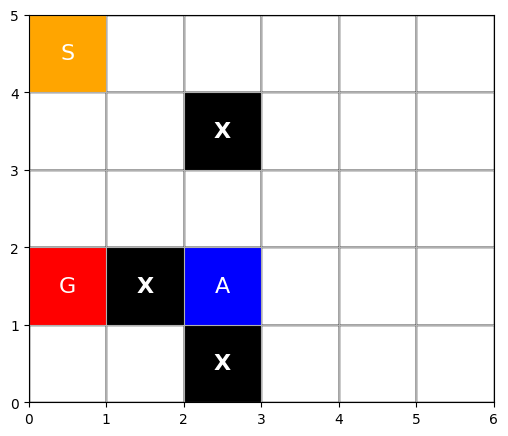

<Figure size 640x480 with 0 Axes>

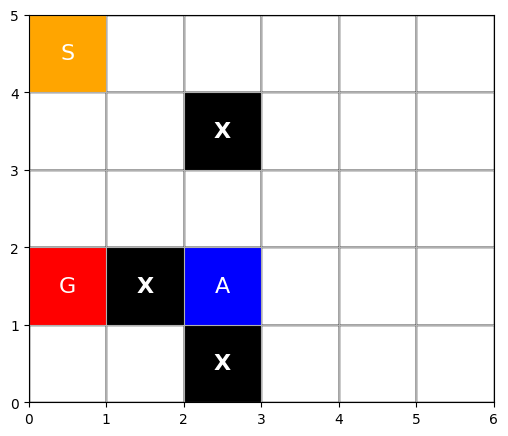

<Figure size 640x480 with 0 Axes>

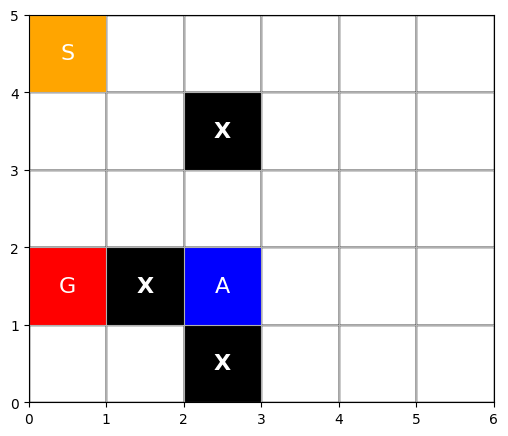

<Figure size 640x480 with 0 Axes>

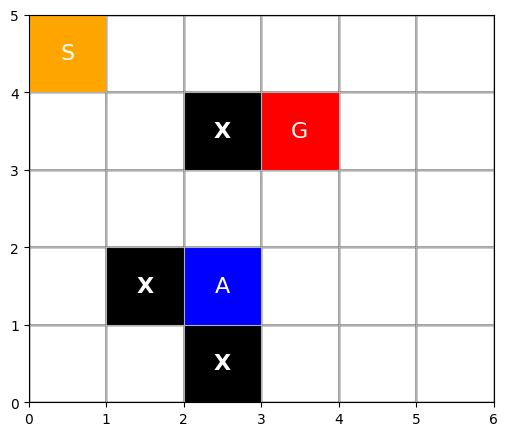

<Figure size 640x480 with 0 Axes>

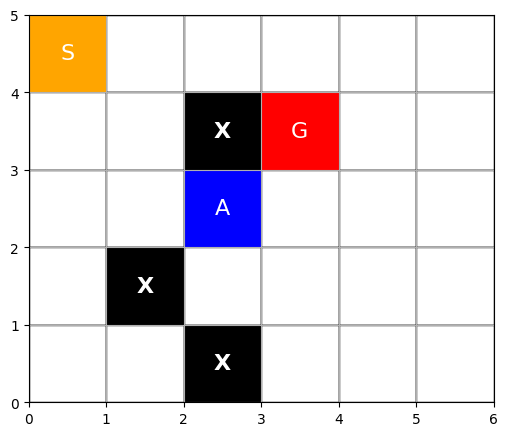

<Figure size 640x480 with 0 Axes>

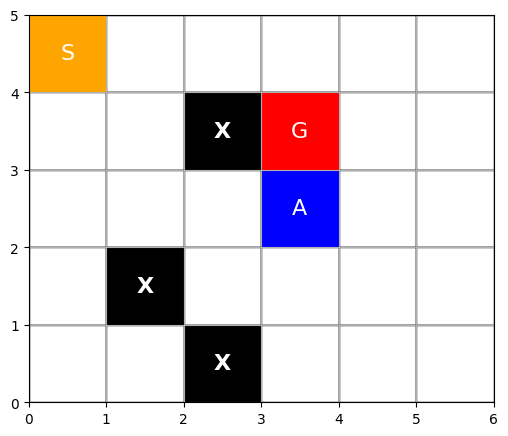

<Figure size 640x480 with 0 Axes>

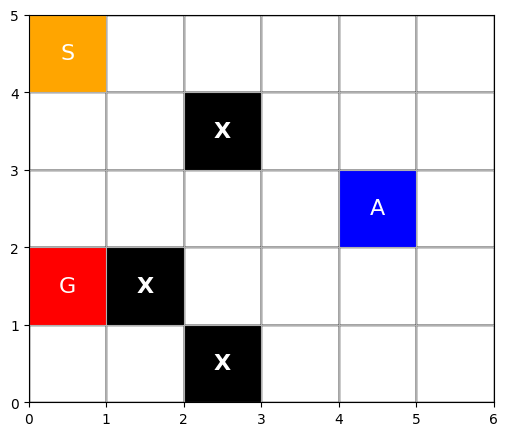

<Figure size 640x480 with 0 Axes>

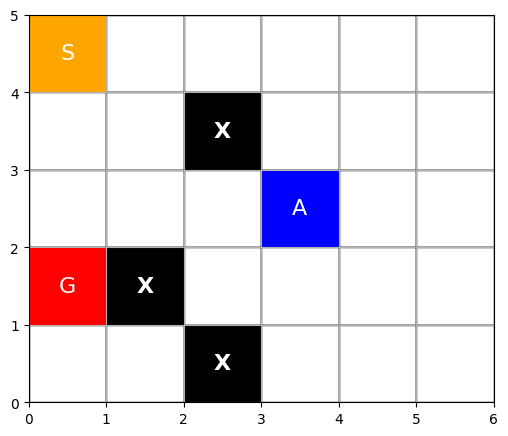

<Figure size 640x480 with 0 Axes>

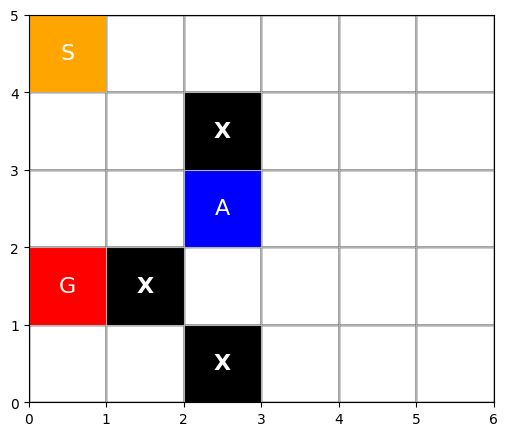

<Figure size 640x480 with 0 Axes>

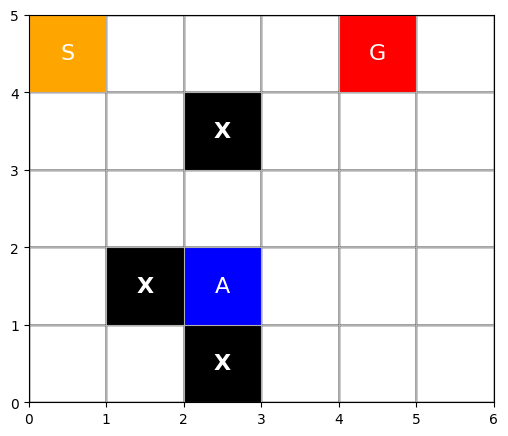

<Figure size 640x480 with 0 Axes>

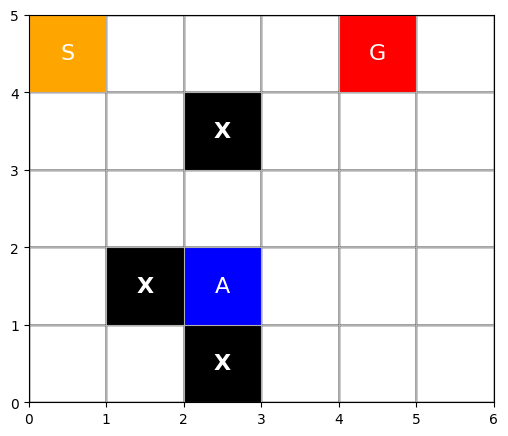

<Figure size 640x480 with 0 Axes>

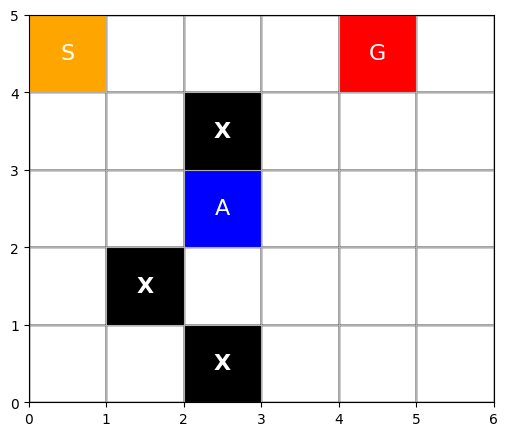

<Figure size 640x480 with 0 Axes>

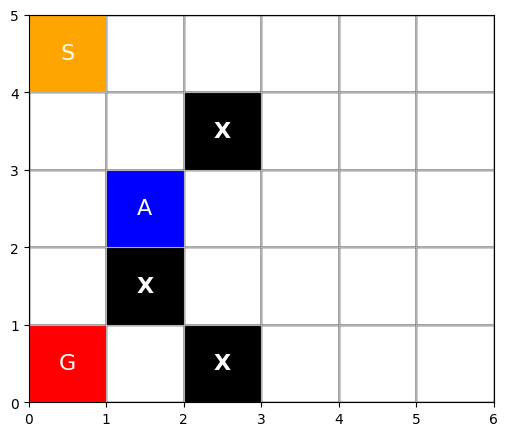

<Figure size 640x480 with 0 Axes>

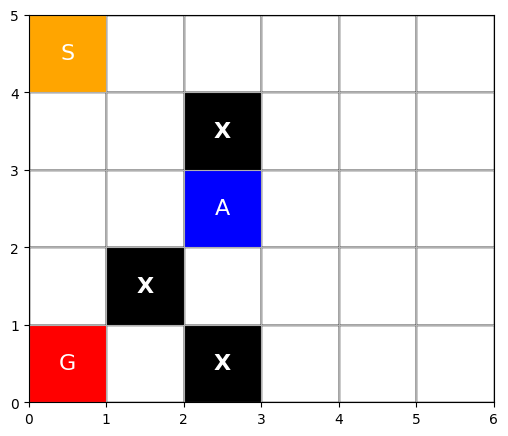

<Figure size 640x480 with 0 Axes>

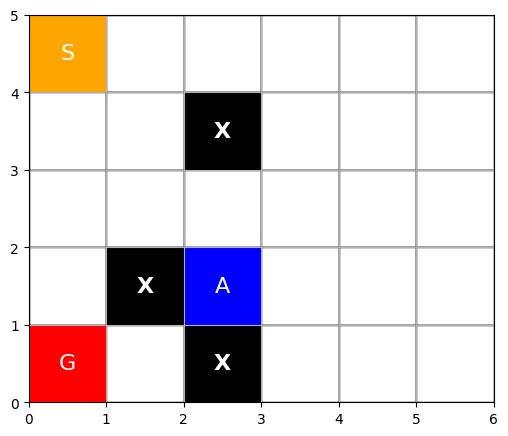

<Figure size 640x480 with 0 Axes>

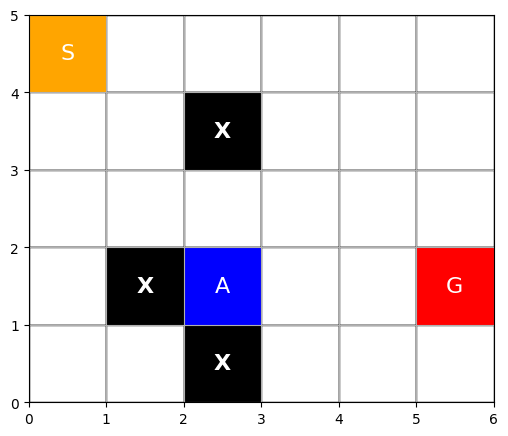

<Figure size 640x480 with 0 Axes>

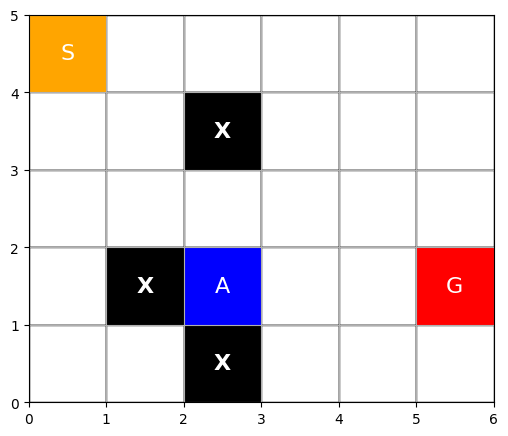

<Figure size 640x480 with 0 Axes>

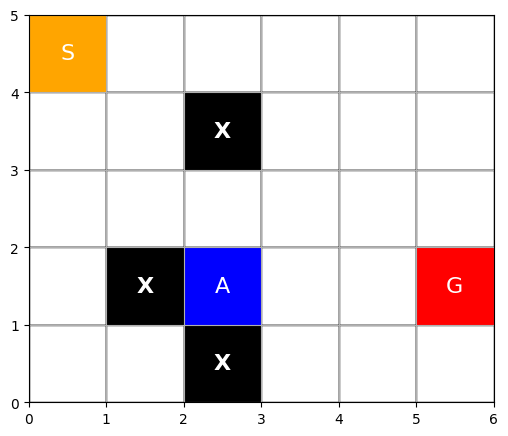

<Figure size 640x480 with 0 Axes>

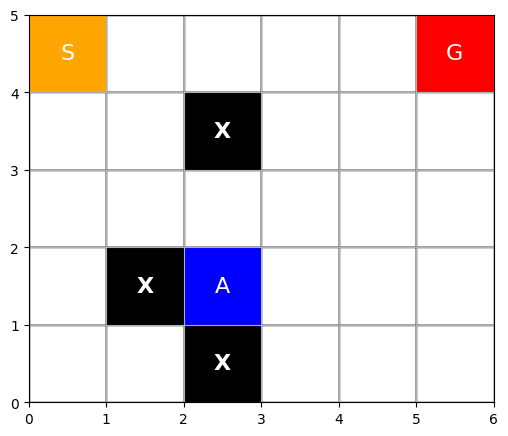

<Figure size 640x480 with 0 Axes>

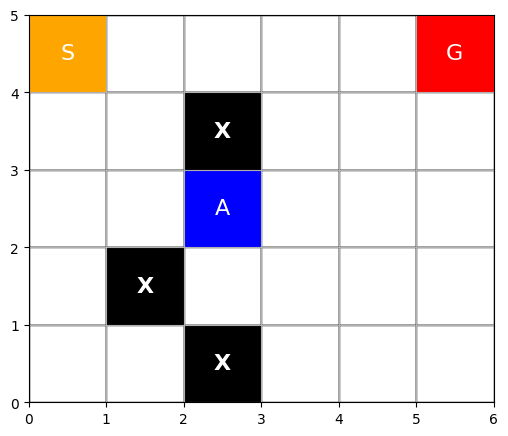

<Figure size 640x480 with 0 Axes>

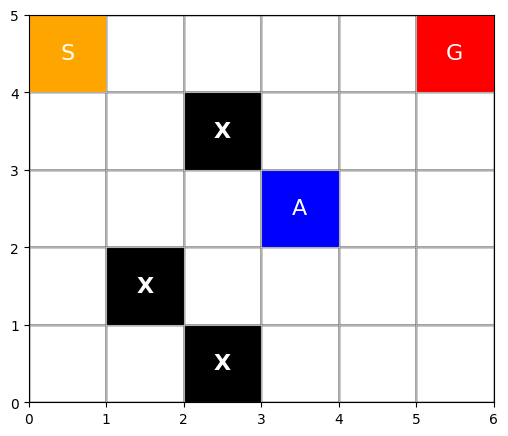

<Figure size 640x480 with 0 Axes>

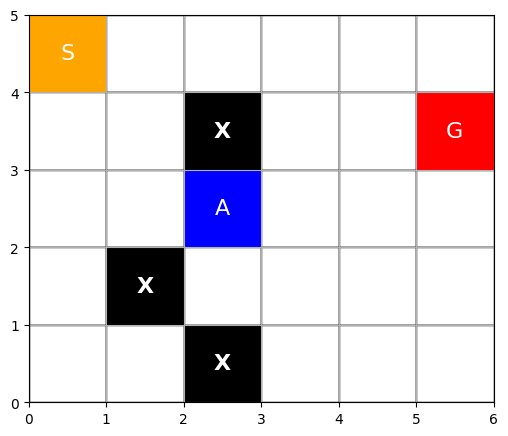

<Figure size 640x480 with 0 Axes>

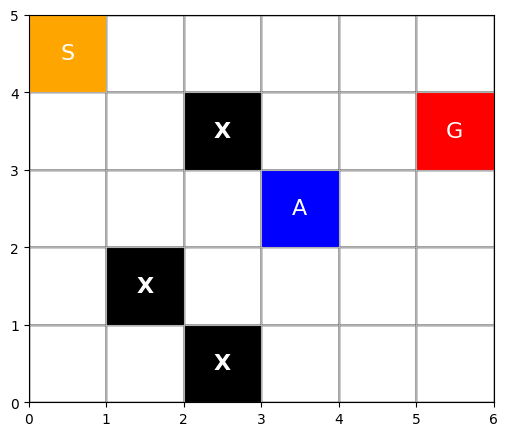

<Figure size 640x480 with 0 Axes>

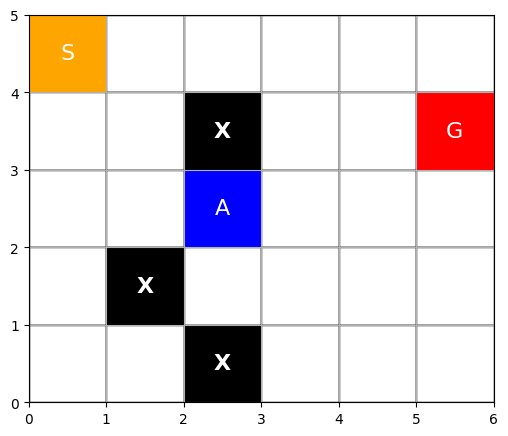

<Figure size 640x480 with 0 Axes>

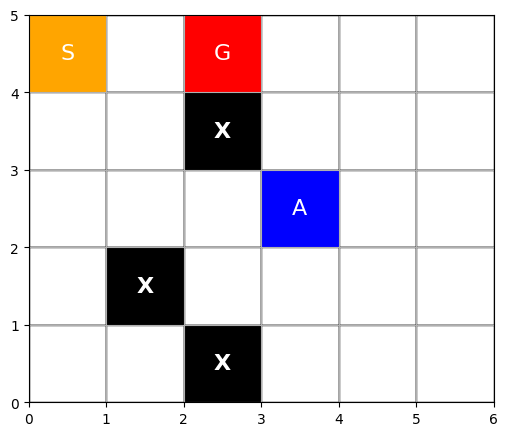

<Figure size 640x480 with 0 Axes>

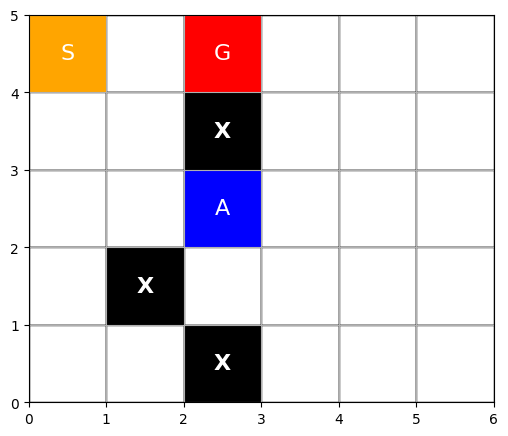

<Figure size 640x480 with 0 Axes>

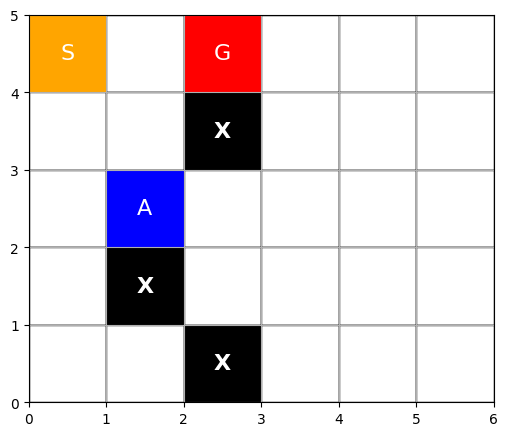

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import time

# --------------------------
# GridWorld avec goal dynamique
# --------------------------
class GridWorld:
    def __init__(self,
                 size=(5,6),
                 start=(0,0),
                 goals=[(4,5)],
                 obstacles=[(1,2), (3,1), (4,2)],
                 agent_color='blue',
                 goal_color='red',
                 obstacle_color='black'):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goals = goals
        self.obstacles = obstacles
        self.agent_color = agent_color
        self.goal_color = goal_color
        self.obstacle_color = obstacle_color
        self.actions = ['up','down','left','right']

    def reset(self):
        self.state = self.start
        return self.state

    def move_goal(self):
        # Déplace le goal aléatoirement sur une case vide
        new_goals = []
        for _ in self.goals:
            while True:
                gx = np.random.randint(0,self.rows)
                gy = np.random.randint(0,self.cols)
                if (gx,gy) != self.state and (gx,gy) not in self.obstacles:
                    new_goals.append((gx,gy))
                    break
        self.goals = new_goals

    def step(self, action):
        x,y = self.state
        if action == 'up':
            x = max(0,x-1)
        elif action == 'down':
            x = min(self.rows-1,x+1)
        elif action == 'left':
            y = max(0,y-1)
        elif action == 'right':
            y = min(self.cols-1,y+1)

        if (x,y) in self.obstacles:
            x,y = self.state  # reste sur place

        self.state = (x,y)
        reward = 1 if self.state in self.goals else -0.01
        done = self.state in self.goals
        return self.state, reward, done

    def render_frame(self, agent_pos=None, pause_time=0.3):
        if agent_pos is None:
            agent_pos = self.state
        plt.clf()
        fig, ax = plt.subplots(figsize=(6,6))

        # Grid
        for i in range(self.rows):
            for j in range(self.cols):
                rect = patches.Rectangle((j, self.rows-1-i),1,1,linewidth=1,edgecolor='black',facecolor='white')
                ax.add_patch(rect)

        # Obstacles
        for (x,y) in self.obstacles:
            ax.add_patch(patches.Rectangle((y,self.rows-1-x),1,1,facecolor=self.obstacle_color))
            ax.text(y+0.5, self.rows-1-x+0.5, 'X', ha='center', va='center', color='white', fontsize=16, weight='bold')

        # Goals
        for (gx,gy) in self.goals:
            ax.add_patch(patches.Rectangle((gy,self.rows-1-gx),1,1,facecolor=self.goal_color))
            ax.text(gy+0.5, self.rows-1-gx+0.5,'G',ha='center',va='center',color='white',fontsize=16)

        # Start
        sx,sy = self.start
        ax.add_patch(patches.Rectangle((sy,self.rows-1-sx),1,1,facecolor='orange'))
        ax.text(sy+0.5,self.rows-1-sx+0.5,'S',ha='center',va='center',color='white',fontsize=16)

        # Agent
        ax.add_patch(patches.Rectangle((agent_pos[1], self.rows-1-agent_pos[0]),1,1,facecolor=self.agent_color))
        ax.text(agent_pos[1]+0.5,self.rows-1-agent_pos[0]+0.5,'A',ha='center',va='center',color='white',fontsize=16)

        ax.set_xlim(0,self.cols)
        ax.set_ylim(0,self.rows)
        ax.set_xticks(range(self.cols+1))
        ax.set_yticks(range(self.rows+1))
        ax.set_aspect('equal')
        plt.grid(True)
        plt.pause(pause_time)
        plt.close(fig)

# --------------------------
# TD(0) On-Policy avec goal dynamique
# --------------------------
def td0_train_dynamic_goal(env, episodes=50, alpha=0.1, gamma=0.9, epsilon=0.2, move_goal_every=3):
    V = {}
    for i in range(env.rows):
        for j in range(env.cols):
            V[(i,j)] = 0

    rewards_per_episode = []
    plt.ion()
    fig, ax = plt.subplots(figsize=(6,4))

    for ep in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0
        step_counter = 0

        while not done:
            step_counter += 1

            # Déplacer le goal pendant l'épisode
            if step_counter % move_goal_every == 0:
                env.move_goal()

            # epsilon-greedy policy
            if np.random.rand() < epsilon:
                action = np.random.choice(env.actions)
            else:
                # choisir action qui maximise V
                next_values = []
                for a in env.actions:
                    x,y = state
                    if a=='up': nx = max(0,x-1); ny=y
                    if a=='down': nx=min(env.rows-1,x+1); ny=y
                    if a=='left': nx=x; ny=max(0,y-1)
                    if a=='right': nx=x; ny=min(env.cols-1,y+1)
                    if (nx,ny) in env.obstacles: nx,ny = state
                    next_values.append(V[(nx,ny)])
                action = env.actions[np.argmax(next_values)]

            next_state, reward, done = env.step(action)
            V[state] += alpha*(reward + gamma*V[next_state] - V[state])
            state = next_state
            total_reward += reward

            # Visualisation frame par frame
            env.render_frame(agent_pos=state, pause_time=0.2)

        rewards_per_episode.append(total_reward)

        # Plot des rewards en temps réel
        ax.clear()
        ax.plot(rewards_per_episode, label='Reward per episode')
        ax.set_xlabel('Episode')
        ax.set_ylabel('Total reward')
        ax.set_title('TD(0) with Dynamic Goal')
        ax.legend()
        plt.pause(0.01)

    plt.ioff()
    plt.show()
    return V

# --------------------------
# Exemple d'utilisation
# --------------------------
env = GridWorld(
    size=(5,6),
    start=(0,0),
    goals=[(4,5)],
    obstacles=[(1,2),(3,1),(4,2)],
    agent_color='blue',
    goal_color='red',
    obstacle_color='black'
)

V = td0_train_dynamic_goal(env, episodes=30, alpha=0.2, gamma=0.9, epsilon=0.2, move_goal_every=3)


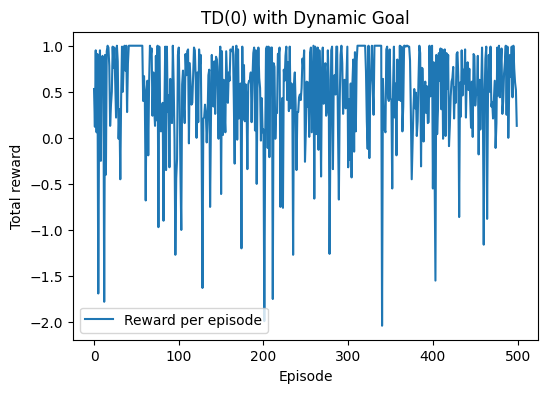

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --------------------------
# GridWorld avec goal dynamique
# --------------------------
class GridWorld:
    def __init__(self, size=(5,6), start=(0,0), goals=[(4,5)], obstacles=[(1,2), (3,1), (4,2)]):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goals = goals
        self.obstacles = obstacles
        self.actions = ['up','down','left','right']

    def reset(self):
        self.state = self.start
        return self.state

    def move_goal(self):
        # Déplace le goal aléatoirement sur une case vide
        new_goals = []
        for _ in self.goals:
            while True:
                gx = np.random.randint(0,self.rows)
                gy = np.random.randint(0,self.cols)
                if (gx,gy) != self.state and (gx,gy) not in self.obstacles:
                    new_goals.append((gx,gy))
                    break
        self.goals = new_goals

    def step(self, action):
        x,y = self.state
        if action == 'up':
            x = max(0,x-1)
        elif action == 'down':
            x = min(self.rows-1,x+1)
        elif action == 'left':
            y = max(0,y-1)
        elif action == 'right':
            y = min(self.cols-1,y+1)

        if (x,y) in self.obstacles:
            x,y = self.state  # reste sur place

        self.state = (x,y)
        reward = 1 if self.state in self.goals else -0.01
        done = self.state in self.goals
        return self.state, reward, done

# --------------------------
# TD(0) On-Policy avec goal dynamique
# --------------------------
def td0_train_dynamic_goal(env, episodes=500, alpha=0.1, gamma=0.9, epsilon=0.2, move_goal_every=3):
    V = {}
    for i in range(env.rows):
        for j in range(env.cols):
            V[(i,j)] = 0

    rewards_per_episode = []

    for ep in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0
        step_counter = 0

        while not done:
            step_counter += 1

            # Déplacer le goal pendant l'épisode
            if step_counter % move_goal_every == 0:
                env.move_goal()

            # epsilon-greedy policy
            if np.random.rand() < epsilon:
                action = np.random.choice(env.actions)
            else:
                # choisir action qui maximise V
                next_values = []
                for a in env.actions:
                    x,y = state
                    if a=='up': nx = max(0,x-1); ny=y
                    if a=='down': nx=min(env.rows-1,x+1); ny=y
                    if a=='left': nx=x; ny=max(0,y-1)
                    if a=='right': nx=x; ny=min(env.cols-1,y+1)
                    if (nx,ny) in env.obstacles: nx,ny = state
                    next_values.append(V[(nx,ny)])
                action = env.actions[np.argmax(next_values)]

            next_state, reward, done = env.step(action)
            V[state] += alpha*(reward + gamma*V[next_state] - V[state])
            state = next_state
            total_reward += reward

        rewards_per_episode.append(total_reward)

    # Plot des rewards
    plt.figure(figsize=(6,4))
    plt.plot(rewards_per_episode, label='Reward per episode')
    plt.xlabel('Episode')
    plt.ylabel('Total reward')
    plt.title('TD(0) with Dynamic Goal')
    plt.legend()
    plt.show()

    return V, rewards_per_episode

# --------------------------
# Exemple d'utilisation
# --------------------------
env = GridWorld(
    size=(5,6),
    start=(0,0),
    goals=[(4,5)],
    obstacles=[(1,2),(3,1),(4,2)]
)

V, rewards = td0_train_dynamic_goal(env, episodes=500, alpha=0.2, gamma=0.9, epsilon=0.2, move_goal_every=3)


# DQN

Episode 1/300 | Reward: 0.71 | Epsilon: 0.995
Episode 2/300 | Reward: 0.31 | Epsilon: 0.990


/tmp/ipython-input-228531097.py:127: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:253.)
  states = torch.tensor(states, dtype=torch.float32, device=device)


Episode 3/300 | Reward: 0.87 | Epsilon: 0.985
Episode 4/300 | Reward: 0.42 | Epsilon: 0.980
Episode 5/300 | Reward: 1.00 | Epsilon: 0.975
Episode 6/300 | Reward: 0.80 | Epsilon: 0.970
Episode 7/300 | Reward: 0.40 | Epsilon: 0.966
Episode 8/300 | Reward: -1.18 | Epsilon: 0.961
Episode 9/300 | Reward: 0.99 | Epsilon: 0.956
Episode 10/300 | Reward: 0.98 | Epsilon: 0.951
Episode 11/300 | Reward: 0.73 | Epsilon: 0.946
Episode 12/300 | Reward: 0.89 | Epsilon: 0.942
Episode 13/300 | Reward: 0.79 | Epsilon: 0.937
Episode 14/300 | Reward: 0.35 | Epsilon: 0.932
Episode 15/300 | Reward: 0.38 | Epsilon: 0.928
Episode 16/300 | Reward: 0.89 | Epsilon: 0.923
Episode 17/300 | Reward: 1.00 | Epsilon: 0.918
Episode 18/300 | Reward: 0.94 | Epsilon: 0.914
Episode 19/300 | Reward: 1.00 | Epsilon: 0.909
Episode 20/300 | Reward: 1.00 | Epsilon: 0.905
Episode 21/300 | Reward: 0.99 | Epsilon: 0.900
Episode 22/300 | Reward: 1.00 | Epsilon: 0.896
Episode 23/300 | Reward: 1.00 | Epsilon: 0.891
Episode 24/300 | Re

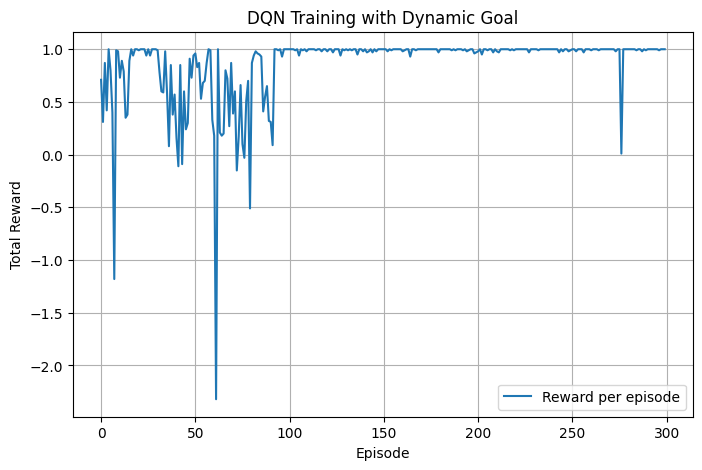

In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque

# --------------------------
# Environnement GridWorld
# --------------------------
class GridWorld:
    def __init__(self, size=(5,6), start=(0,0), goals=[(4,5)], obstacles=[(1,2), (3,1), (4,2)]):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goals = goals
        self.obstacles = obstacles
        self.actions = ['up','down','left','right']

    def reset(self):
        self.state = self.start
        return self._get_state()

    def move_goal(self):
        # Déplace le goal aléatoirement sur une case libre
        new_goals = []
        for _ in self.goals:
            while True:
                gx = np.random.randint(0,self.rows)
                gy = np.random.randint(0,self.cols)
                if (gx,gy) != self.state and (gx,gy) not in self.obstacles:
                    new_goals.append((gx,gy))
                    break
        self.goals = new_goals

    def _get_state(self):
        # On encode l’état comme un vecteur [x, y]
        return np.array(self.state, dtype=np.float32)

    def step(self, action):
        x, y = self.state
        if action == 0:   # up
            x = max(0, x-1)
        elif action == 1: # down
            x = min(self.rows-1, x+1)
        elif action == 2: # left
            y = max(0, y-1)
        elif action == 3: # right
            y = min(self.cols-1, y+1)

        if (x, y) in self.obstacles:
            x, y = self.state  # reste sur place

        self.state = (x, y)
        reward = 1 if self.state in self.goals else -0.01
        done = self.state in self.goals
        return self._get_state(), reward, done

# --------------------------
# Réseau de neurones DQN
# --------------------------
class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        return self.net(x)

# --------------------------
# Entraînement DQN
# --------------------------
def train_dqn(env, episodes=300, gamma=0.9, epsilon_start=1.0, epsilon_end=0.05, epsilon_decay=0.995,
              lr=0.001, batch_size=64, move_goal_every=10):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    input_dim = 2       # position (x, y)
    output_dim = len(env.actions)
    q_net = DQN(input_dim, output_dim).to(device)
    optimizer = optim.Adam(q_net.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    memory = deque(maxlen=5000)
    epsilon = epsilon_start

    rewards_per_episode = []

    for ep in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0
        step_counter = 0

        while not done:
            step_counter += 1
            # Goal dynamique pendant l'épisode
            if step_counter % move_goal_every == 0:
                env.move_goal()

            # ε-greedy policy
            if random.random() < epsilon:
                action = random.randint(0, output_dim-1)
            else:
                with torch.no_grad():
                    q_values = q_net(torch.tensor(state, device=device))
                    action = torch.argmax(q_values).item()

            next_state, reward, done = env.step(action)
            memory.append((state, action, reward, next_state, done))

            state = next_state
            total_reward += reward

            # Replay
            if len(memory) >= batch_size:
                batch = random.sample(memory, batch_size)
                states, actions, rewards, next_states, dones = zip(*batch)

                states = torch.tensor(states, dtype=torch.float32, device=device)
                actions = torch.tensor(actions, dtype=torch.int64, device=device)
                rewards = torch.tensor(rewards, dtype=torch.float32, device=device)
                next_states = torch.tensor(next_states, dtype=torch.float32, device=device)
                dones = torch.tensor(dones, dtype=torch.float32, device=device)

                q_values = q_net(states).gather(1, actions.unsqueeze(1)).squeeze(1)
                next_q_values = q_net(next_states).max(1)[0]
                targets = rewards + gamma * next_q_values * (1 - dones)

                loss = loss_fn(q_values, targets.detach())
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        rewards_per_episode.append(total_reward)
        epsilon = max(epsilon_end, epsilon * epsilon_decay)

        print(f"Episode {ep+1}/{episodes} | Reward: {total_reward:.2f} | Epsilon: {epsilon:.3f}")

    # Plot des récompenses
    plt.figure(figsize=(8,5))
    plt.plot(rewards_per_episode, label="Reward per episode")
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("DQN Training with Dynamic Goal")
    plt.legend()
    plt.grid(True)
    plt.show()

    return q_net, rewards_per_episode

# --------------------------
# Exemple d'utilisation
# --------------------------
env = GridWorld(
    size=(5,6),
    start=(0,0),
    goals=[(4,5)],
    obstacles=[(1,2),(3,1),(4,2)]
)

q_net, rewards = train_dqn(env, episodes=300, move_goal_every=10)


# **il y a une convergence with DQN with dynamic goal**

Episode 1/1000 | Reward: 0.97 | Epsilon: 0.995
Episode 2/1000 | Reward: 0.91 | Epsilon: 0.990
Episode 3/1000 | Reward: 0.98 | Epsilon: 0.985
Episode 4/1000 | Reward: -0.32 | Epsilon: 0.980
Episode 5/1000 | Reward: 0.90 | Epsilon: 0.975
Episode 6/1000 | Reward: 0.66 | Epsilon: 0.970
Episode 7/1000 | Reward: 0.96 | Epsilon: 0.966
Episode 8/1000 | Reward: -0.40 | Epsilon: 0.961
Episode 9/1000 | Reward: 0.86 | Epsilon: 0.956
Episode 10/1000 | Reward: 0.69 | Epsilon: 0.951
Episode 11/1000 | Reward: 0.83 | Epsilon: 0.946
Episode 12/1000 | Reward: 0.42 | Epsilon: 0.942
Episode 13/1000 | Reward: 0.55 | Epsilon: 0.937
Episode 14/1000 | Reward: 0.37 | Epsilon: 0.932
Episode 15/1000 | Reward: 1.00 | Epsilon: 0.928
Episode 16/1000 | Reward: 1.00 | Epsilon: 0.923
Episode 17/1000 | Reward: 0.99 | Epsilon: 0.918
Episode 18/1000 | Reward: 0.91 | Epsilon: 0.914
Episode 19/1000 | Reward: 0.81 | Epsilon: 0.909
Episode 20/1000 | Reward: -0.44 | Epsilon: 0.905
Episode 21/1000 | Reward: 0.82 | Epsilon: 0.90

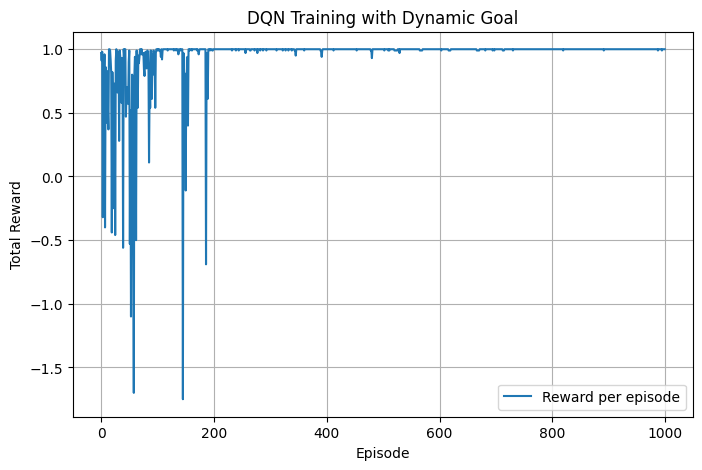

In [2]:
q_net, rewards = train_dqn(env, episodes=1000, move_goal_every=10)

# DQN = Neural Q-Learning + replay memory + target network

# Ici : on met à jour Q directement à chaque étape (pas de mémoire, pas de target net)

# C’est une version plus simple et plus proche du Q-learning tabulaire, mais avec une fonction approximante.

Episode 1/300 | Reward: -1.98 | Epsilon: 0.995
Episode 2/300 | Reward: -0.71 | Epsilon: 0.990
Episode 3/300 | Reward: -1.76 | Epsilon: 0.985
Episode 4/300 | Reward: 0.40 | Epsilon: 0.980
Episode 5/300 | Reward: 0.78 | Epsilon: 0.975
Episode 6/300 | Reward: -2.56 | Epsilon: 0.970
Episode 7/300 | Reward: -0.11 | Epsilon: 0.966
Episode 8/300 | Reward: 0.76 | Epsilon: 0.961
Episode 9/300 | Reward: -0.75 | Epsilon: 0.956
Episode 10/300 | Reward: -0.86 | Epsilon: 0.951
Episode 11/300 | Reward: -1.04 | Epsilon: 0.946
Episode 12/300 | Reward: -0.94 | Epsilon: 0.942
Episode 13/300 | Reward: -0.14 | Epsilon: 0.937
Episode 14/300 | Reward: 0.26 | Epsilon: 0.932
Episode 15/300 | Reward: -2.29 | Epsilon: 0.928
Episode 16/300 | Reward: -0.68 | Epsilon: 0.923
Episode 17/300 | Reward: -0.81 | Epsilon: 0.918
Episode 18/300 | Reward: 0.25 | Epsilon: 0.914
Episode 19/300 | Reward: -4.82 | Epsilon: 0.909
Episode 20/300 | Reward: -0.34 | Epsilon: 0.905
Episode 21/300 | Reward: -4.76 | Epsilon: 0.900
Episod

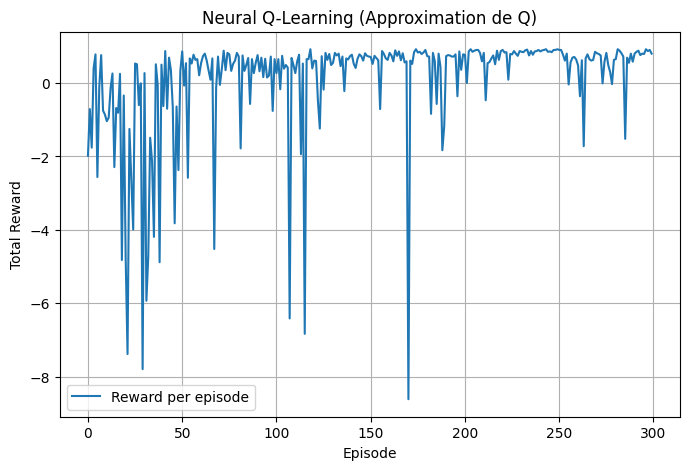

In [3]:
import numpy as np
import random
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim

# --------------------------
# Environnement GridWorld
# --------------------------
class GridWorld:
    def __init__(self, size=(5,6), start=(0,0), goal=(4,5), obstacles=[(1,2),(3,1),(4,2)]):
        self.rows, self.cols = size
        self.start = start
        self.state = start
        self.goal = goal
        self.obstacles = obstacles
        self.actions = ['up','down','left','right']

    def reset(self):
        self.state = self.start
        return np.array(self.state, dtype=np.float32)

    def step(self, action):
        x, y = self.state
        if action == 0:   # up
            x = max(0, x-1)
        elif action == 1: # down
            x = min(self.rows-1, x+1)
        elif action == 2: # left
            y = max(0, y-1)
        elif action == 3: # right
            y = min(self.cols-1, y+1)

        if (x, y) in self.obstacles:
            x, y = self.state  # reste sur place

        self.state = (x, y)
        reward = 1 if self.state == self.goal else -0.01
        done = (self.state == self.goal)
        return np.array(self.state, dtype=np.float32), reward, done

# --------------------------
# Réseau Neural Q(s,a)
# --------------------------
class QNetwork(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(QNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        return self.net(x)

# --------------------------
# Neural Q-Learning
# --------------------------
def train_neural_qlearning(env, episodes=300, gamma=0.9, alpha=0.01, epsilon_start=1.0,
                           epsilon_end=0.05, epsilon_decay=0.995):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_dim = 2
    output_dim = len(env.actions)

    q_net = QNetwork(input_dim, output_dim).to(device)
    optimizer = optim.Adam(q_net.parameters(), lr=alpha)
    loss_fn = nn.MSELoss()

    epsilon = epsilon_start
    rewards_per_episode = []

    for ep in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0

        while not done:
            # ε-greedy policy
            if random.random() < epsilon:
                action = random.randint(0, output_dim-1)
            else:
                with torch.no_grad():
                    q_values = q_net(torch.tensor(state, device=device))
                    action = torch.argmax(q_values).item()

            next_state, reward, done = env.step(action)
            total_reward += reward

            # --- TD Target ---
            with torch.no_grad():
                next_q = q_net(torch.tensor(next_state, device=device))
                target_q_value = reward + gamma * torch.max(next_q) * (1 - int(done))

            # --- Prédiction Q(s,a) ---
            q_values = q_net(torch.tensor(state, device=device))
            q_value = q_values[action]

            # --- Loss & Backprop ---
            loss = loss_fn(q_value, target_q_value)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            state = next_state

        epsilon = max(epsilon_end, epsilon * epsilon_decay)
        rewards_per_episode.append(total_reward)
        print(f"Episode {ep+1}/{episodes} | Reward: {total_reward:.2f} | Epsilon: {epsilon:.3f}")

    # Plot de l'apprentissage
    plt.figure(figsize=(8,5))
    plt.plot(rewards_per_episode, label="Reward per episode")
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Neural Q-Learning (Approximation de Q)")
    plt.legend()
    plt.grid(True)
    plt.show()

    return q_net, rewards_per_episode

# --------------------------
# Exécution
# --------------------------
env = GridWorld(size=(5,6), start=(0,0), goal=(4,5))
q_net, rewards = train_neural_qlearning(env, episodes=300)


# il y a une convergence maias mois performence que DQN

In [5]:
q_net, rewards = train_neural_qlearning(env, episodes=500)

Episode 1/500 | Reward: -0.80 | Epsilon: 0.995
Episode 2/500 | Reward: -0.50 | Epsilon: 0.990
Episode 3/500 | Reward: 0.74 | Epsilon: 0.985
Episode 4/500 | Reward: 0.40 | Epsilon: 0.980
Episode 5/500 | Reward: -0.35 | Epsilon: 0.975
Episode 6/500 | Reward: -1.47 | Epsilon: 0.970
Episode 7/500 | Reward: -0.78 | Epsilon: 0.966
Episode 8/500 | Reward: -1.00 | Epsilon: 0.961
Episode 9/500 | Reward: 0.79 | Epsilon: 0.956
Episode 10/500 | Reward: -0.89 | Epsilon: 0.951
Episode 11/500 | Reward: -0.27 | Epsilon: 0.946
Episode 12/500 | Reward: -3.16 | Epsilon: 0.942
Episode 13/500 | Reward: 0.60 | Epsilon: 0.937
Episode 14/500 | Reward: -0.41 | Epsilon: 0.932
Episode 15/500 | Reward: -0.13 | Epsilon: 0.928
Episode 16/500 | Reward: 0.54 | Epsilon: 0.923
Episode 17/500 | Reward: 0.50 | Epsilon: 0.918
Episode 18/500 | Reward: -0.04 | Epsilon: 0.914
Episode 19/500 | Reward: -0.06 | Epsilon: 0.909
Episode 20/500 | Reward: 0.11 | Epsilon: 0.905
Episode 21/500 | Reward: 0.44 | Epsilon: 0.900
Episode 2

KeyboardInterrupt: 